# 1. Feature extraction

In [1]:
import os
import numpy as np
from utils import get_peaks_params
from imblearn.over_sampling import RandomOverSampler
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler


input_dir_prefix = './../data/'

head_classes = ['other', 'nod', 'shake']
angle_types = ['x', 'y']

# Construct feature matrix X and vector of labels y
X = []
y = []

for head_class_idx, head_class in enumerate(head_classes):
    
    input_dir = input_dir_prefix + head_class
    
    per_class_X = []
    
    for angle_type in angle_types:
        widths, heights = get_peaks_params(input_dir, angle_type=angle_type, include_nan=True)
        per_class_X.extend([widths, heights])
        print(len(widths), len(heights))
        
    print(np.array(per_class_X).T.shape)
    X.append(np.array(per_class_X).T)
    y.extend([head_class_idx] * len(X[-1]))
    print(len(X), len(y))
        
X = np.vstack((X))
y = np.array(y)
print(X.shape, y.shape)
print(f'Original number of examples per class: {np.unique(y, return_counts=True)}')

# Remove nan rows
y = np.array([y[i] for i in range(len(X)) if not np.isnan(X[i]).any()])
X = np.array([X[i] for i in range(len(X)) if not np.isnan(X[i]).any()])
print(X.shape, y.shape)
print(f'After removing NaN entries, number of examples per class: {np.unique(y, return_counts=True)}')

# Z-normalize features
znorm_scaler = StandardScaler()
X = znorm_scaler.fit_transform(X)

# Random oversampling of minority classes
random_state = 37
ros = RandomOverSampler(random_state=random_state)
X, y = ros.fit_resample(X, y)
print(f'After oversampling, number of examples per class: {np.unique(y, return_counts=True)}')

# Shuffle data
X, y = shuffle(X, y, random_state=random_state)

print(X.shape, y.shape, 143*3)

/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/ICT2000/jondra

25 25
25 25
(25, 4)
1 25


/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


154 154
154 154
(154, 4)
2 179
104 104
104 104
(104, 4)
3 283
(283, 4) (283,)
Original number of examples per class: (array([0, 1, 2]), array([ 25, 154, 104]))
(249, 4) (249,)
After removing NaN entries, number of examples per class: (array([0, 1, 2]), array([ 25, 143,  81]))
After oversampling, number of examples per class: (array([0, 1, 2]), array([143, 143, 143]))
(429, 4) (429,) 429


In [16]:
# Save z-norm parameters
np.savez('./ternary_knn_znorm_params', mean=znorm_scaler.mean_, scale=znorm_scaler.scale_)

# 2. Train & tune

## 2.1 Cross-validation

/home/ICT2000/jondras/anaconda3/envs/ICMI_head/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'n_neighbors': 1}
0.9277389277389277
Best mean train accuracy: 1.0 +/- 0.0
Best mean test accuracy: 0.9277389277389277 +/- 0.027859846010352865


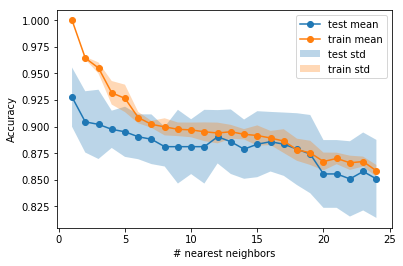

In [8]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

param_grid = {'n_neighbors': np.arange(1, 25)}
knn_gscv = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, n_jobs=6, scoring='accuracy', refit=True, verbose=0, 
                        return_train_score=True)
knn_gscv.fit(X, y)

test_means = knn_gscv.cv_results_['mean_test_score']
test_stds = knn_gscv.cv_results_['std_test_score']
train_means = knn_gscv.cv_results_['mean_train_score']
train_stds = knn_gscv.cv_results_['std_train_score']
x_axis = param_grid['n_neighbors']

print(knn_gscv.best_params_)
print(knn_gscv.best_score_)
print(f'Best mean train accuracy: {np.max(train_means)} +/- {train_stds[np.argmax(train_means)]}')
print(f'Best mean test accuracy: {np.max(test_means)} +/- {test_stds[np.argmax(test_means)]}')

plt.figure()
plt.plot(x_axis, test_means, 'o-', label='test mean')
plt.fill_between(x_axis, test_means - test_stds, test_means + test_stds, label='test std', alpha=0.3)
plt.plot(x_axis, train_means, 'o-', label='train mean')
plt.fill_between(x_axis, train_means - train_stds, train_means + train_stds, label='train std', alpha=0.3)
plt.ylabel('Accuracy')
plt.xlabel('# nearest neighbors')
plt.legend()
plt.show()

## 2.2 Final training using all the data

In [3]:
# Use the best estimator from above or choose custom settings
knn_final = knn_gscv.best_estimator_
# knn_final = KNeighborsClassifier(n_neighbors=1)
knn_final.fit(X, y)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')

# 3. Predict

Per-sample/per-frame predictions of other/nod/shake class - annotated by 0/1/2.

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_EventToErase/483_EventToErase_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[1.10000000e+01 2.80794999e-03]
 [1.10000000e+01 2.80794999e-03]
 [1.10000000e+01 2.80794999e-03]
 ...
 [1.70000000e+01 5.19546614e-03]
 [1.70000000e+01 5.19546614e-03]
 [1.70000000e+01 5.19546614e-03]]


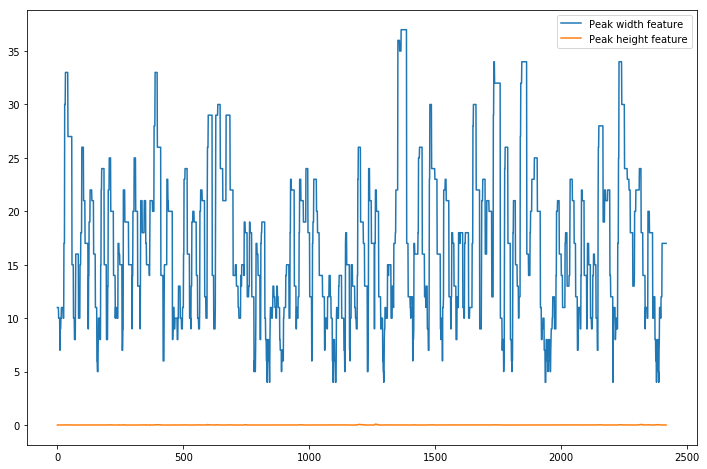

csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[8.00000000e+00 1.06573787e-03]
 [8.00000000e+00 1.06573787e-03]
 [8.00000000e+00 1.06573787e-03]
 ...
 [2.50000000e+01 1.19763634e-02]
 [2.50000000e+01 1.19763634e-02]
 [2.50000000e+01 1.19763634e-02]]


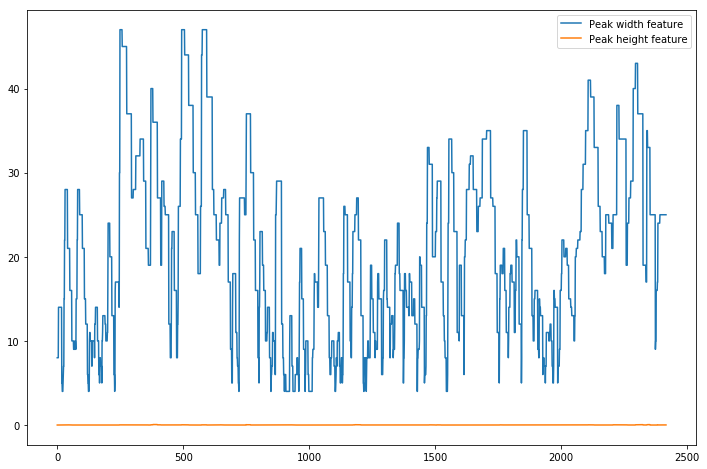


Annotations:
[1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

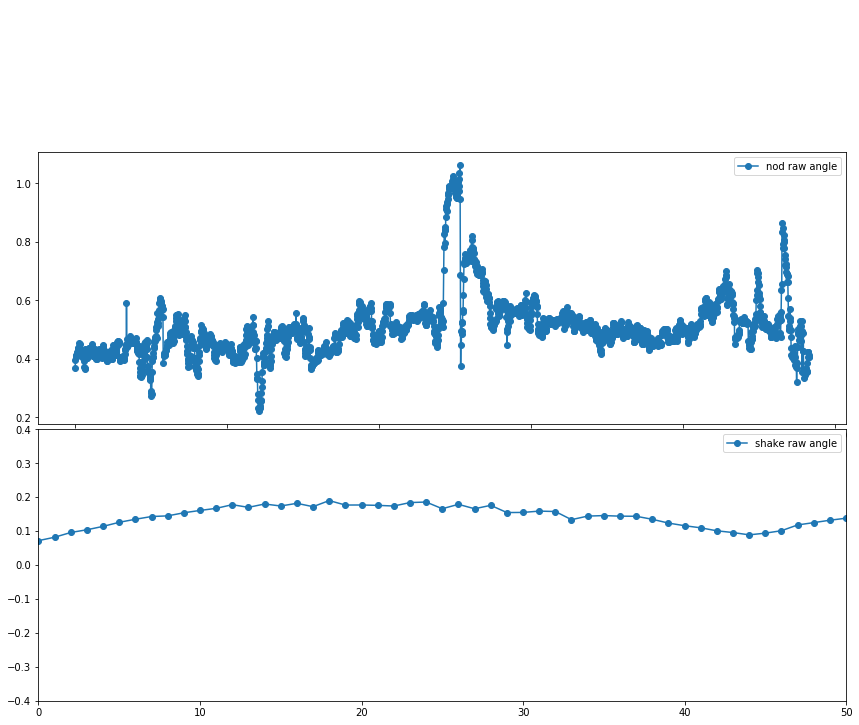

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_MostProudOf/483_MostProudOf_FACE.csv
csv frame rate: 30.00040595948524
L End reached + -
R End reached - +
[[3.20000000e+01 1.58413962e-02]
 [3.20000000e+01 1.58413962e-02]
 [3.20000000e+01 1.58413962e-02]
 ...
 [1.50000000e+01 3.04930473e-03]
 [1.50000000e+01 3.04930473e-03]
 [1.50000000e+01 3.04930473e-03]]


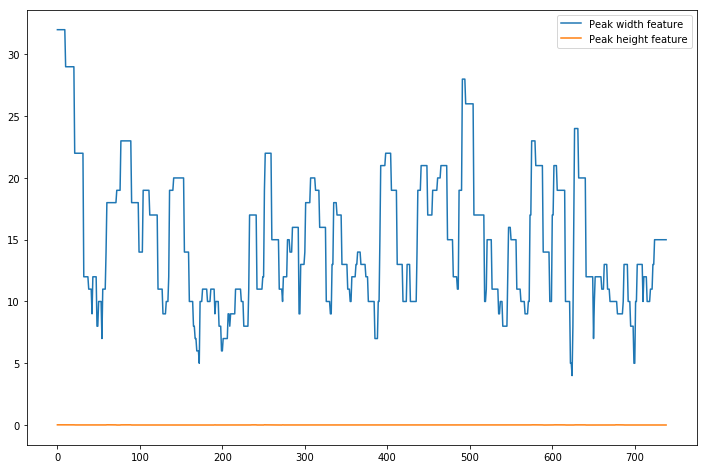

csv frame rate: 30.00040595948524
L End reached - +
R End reached + -
[[2.90000000e+01 1.11139566e-02]
 [2.90000000e+01 1.11139566e-02]
 [2.90000000e+01 1.11139566e-02]
 ...
 [2.20000000e+01 9.71514190e-03]
 [2.20000000e+01 9.71514190e-03]
 [2.20000000e+01 9.71514190e-03]]


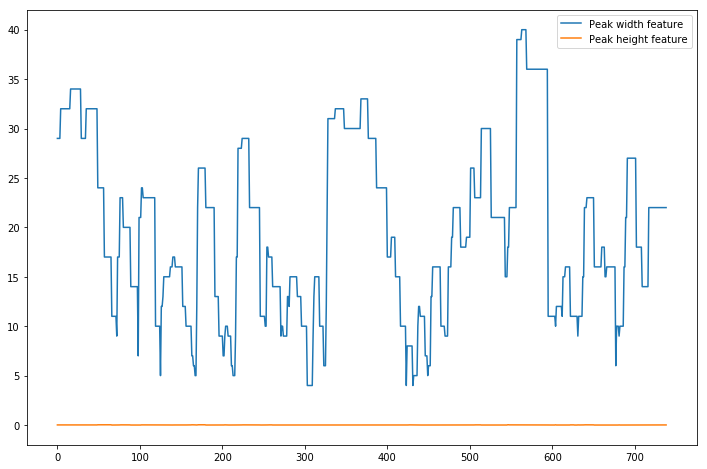


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2

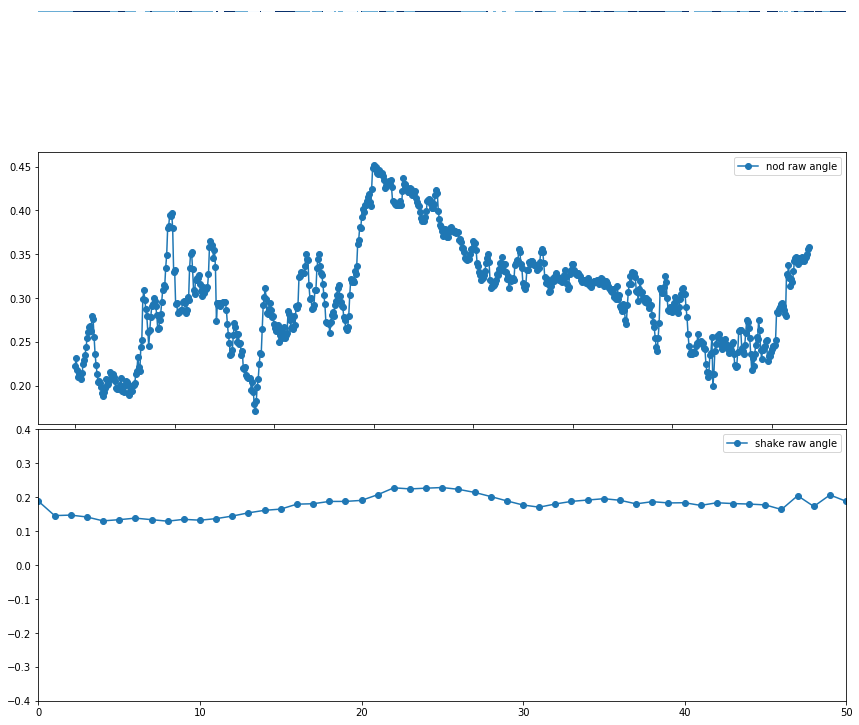

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_LastTimeHappy/483_LastTimeHappy_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached + -
[[1.00000000e+01 1.16091044e-03]
 [1.00000000e+01 1.16091044e-03]
 [1.00000000e+01 1.16091044e-03]
 [1.00000000e+01 1.16091044e-03]
 [1.00000000e+01 1.16091044e-03]
 [1.70000000e+01 1.13180374e-03]
 [1.70000000e+01 1.13180374e-03]
 [1.70000000e+01 1.13180374e-03]
 [1.50000000e+01 9.89966161e-03]
 [1.50000000e+01 9.89966161e-03]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [1.40000000e+01 8.12447336e-04]
 [8.00000000e+00 8.12447336e-04]
 [1.00000000e+01 2.24872472e-03]
 [1.00000000e+01 2.06040168e-03]
 

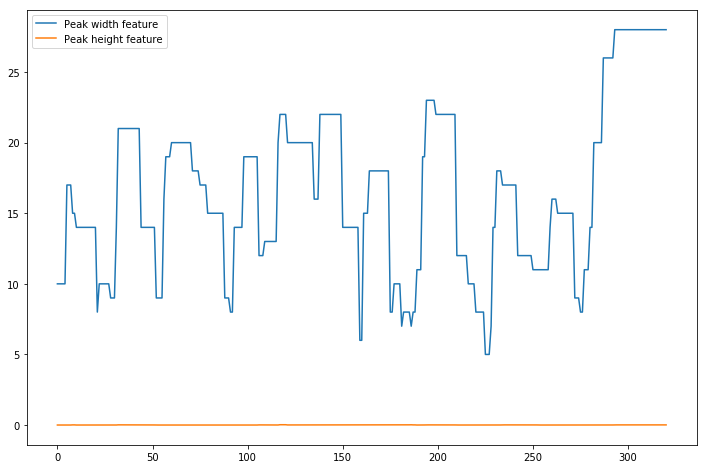

csv frame rate: 30.000000000000004
L End reached - +
R End reached + -
[[1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.70000000e+01 8.41147837e-03]
 [1.40000000e+01 7.08607839e-04]
 [1.40000000e+01 7.08607839e-04]
 [1.40000000e+01 7.08607839e-04]
 [1.40000000e+01 7.08607839e-04]
 [1.40000000e+01 7.08607839e-04]
 [1.40000000e+01 7.08607839e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.25530349e-04]
 [9.00000000e+00 3.07586372e-04]
 [1.40000000e+01 3.11524250e-05]
 [1.40000000e+01 3.11524250e-05]
 [1.40000000e+01 3.11524250e-05]
 [1.40000000e+01 3.11524250e-05]
 [1.20000000e+01 2.51820916e-03]
 [1.20000000e+01 2.51820916e-03]
 [1.20000000e+01 2.51820916e-03]
 [1.2

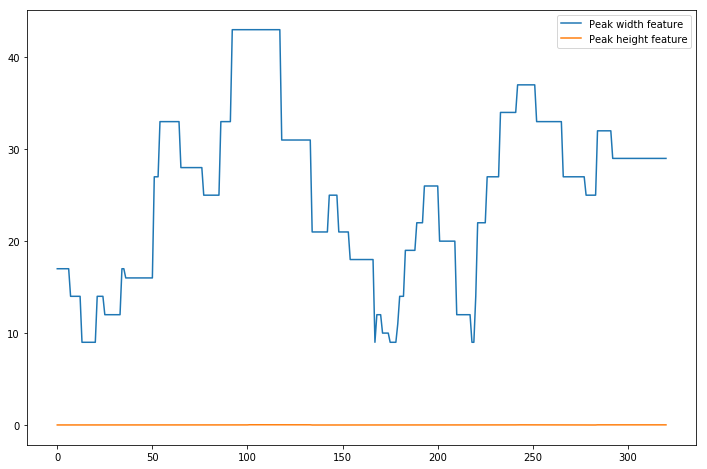


Annotations:
[0, 0, 0, 0, 0, 2, 2, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array

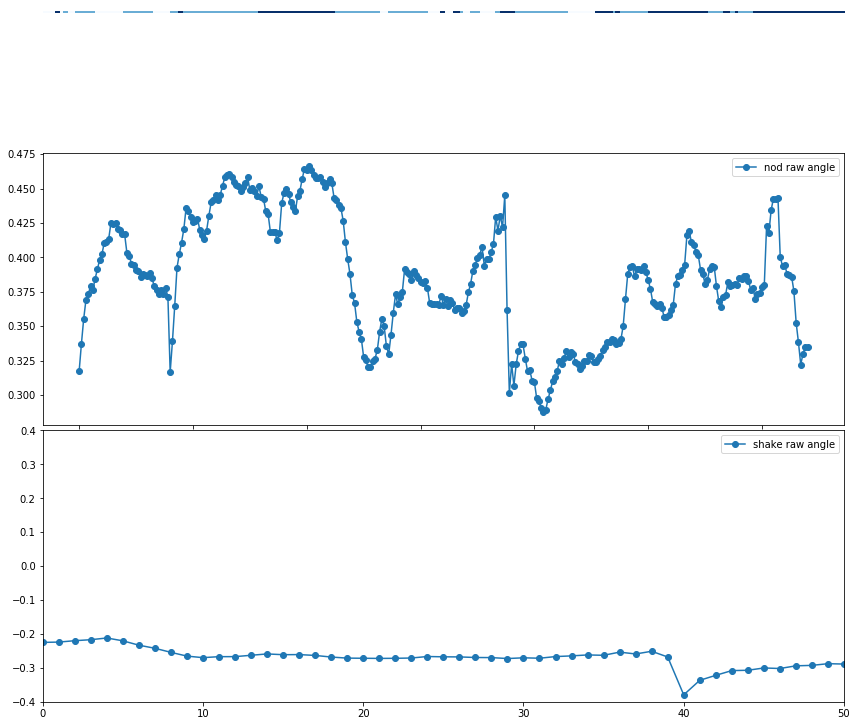

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_HardestDecision/483_HardestDecision_FACE.csv
csv frame rate: 30.000228138617025
L End reached + -
R End reached - +
[[9.00000000e+00 3.96289794e-03]
 [9.00000000e+00 3.96289794e-03]
 [9.00000000e+00 3.96289794e-03]
 ...
 [2.40000000e+01 5.14346411e-03]
 [2.40000000e+01 5.14346411e-03]
 [2.40000000e+01 5.14346411e-03]]


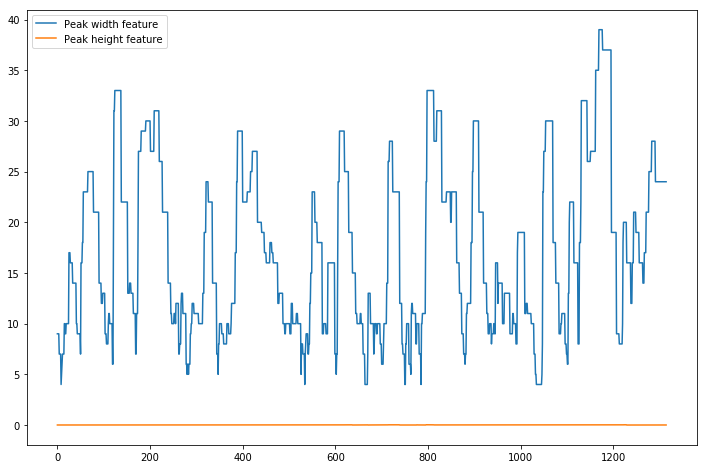

csv frame rate: 30.000228138617025
L End reached + -
R End reached + -
[[1.90000000e+01 4.66536631e-03]
 [1.90000000e+01 4.66536631e-03]
 [1.90000000e+01 4.66536631e-03]
 ...
 [1.70000000e+01 3.78490253e-03]
 [1.70000000e+01 3.78490253e-03]
 [1.70000000e+01 3.78490253e-03]]


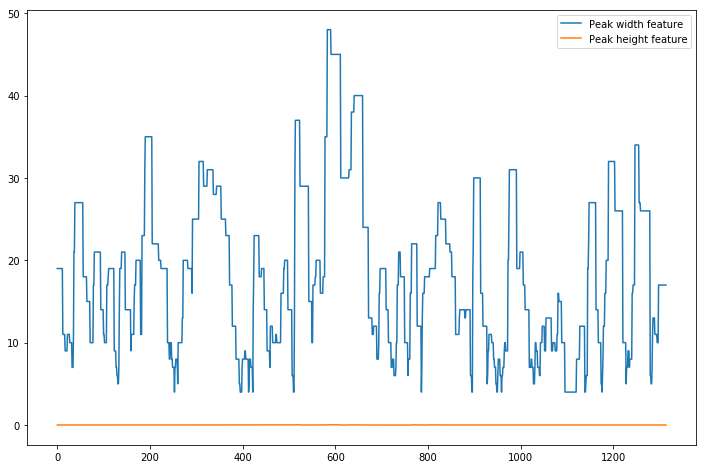


Annotations:
[0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

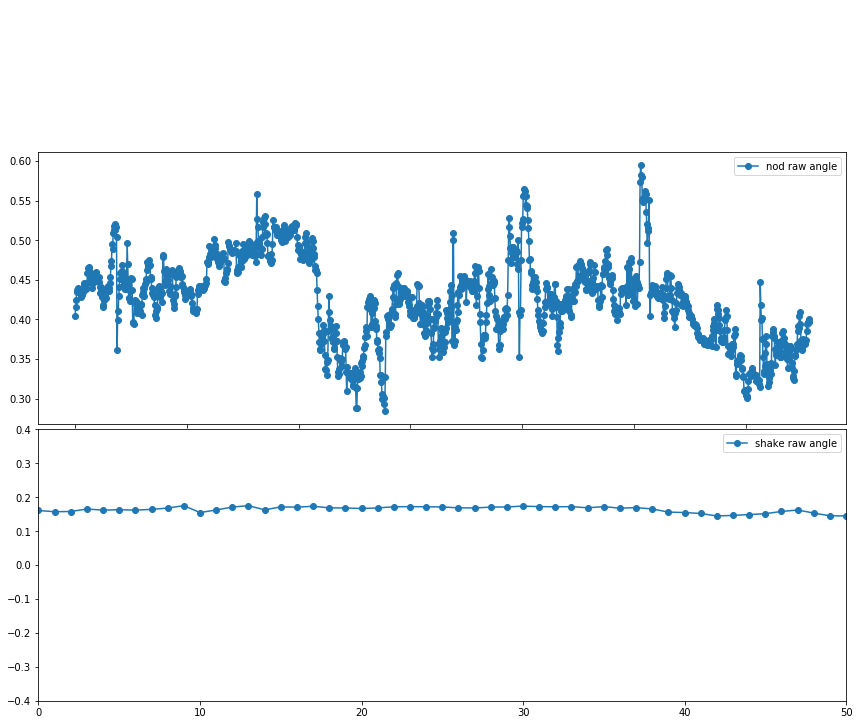

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_SituationHandledDifferent/483_SituationHandledDifferent_FACE.csv
csv frame rate: 29.99985436963898
L End reached + -
R End reached + -
[[1.6e+01 9.0e-03]
 [1.6e+01 9.0e-03]
 [1.6e+01 9.0e-03]
 ...
 [1.9e+01 4.0e-03]
 [1.9e+01 4.0e-03]
 [1.9e+01 4.0e-03]]


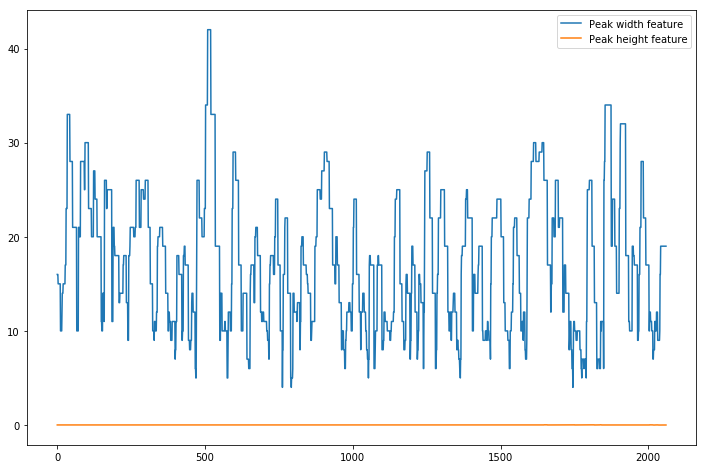

csv frame rate: 29.99985436963898
L End reached + -
R End reached - +
[[1.5e+01 1.0e-03]
 [1.5e+01 1.0e-03]
 [1.5e+01 1.0e-03]
 ...
 [4.1e+01 1.0e-02]
 [4.1e+01 1.0e-02]
 [4.1e+01 1.0e-02]]


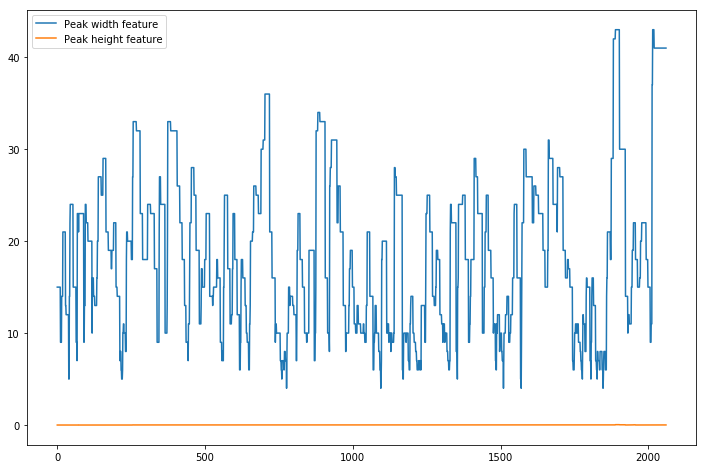


Annotations:
[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

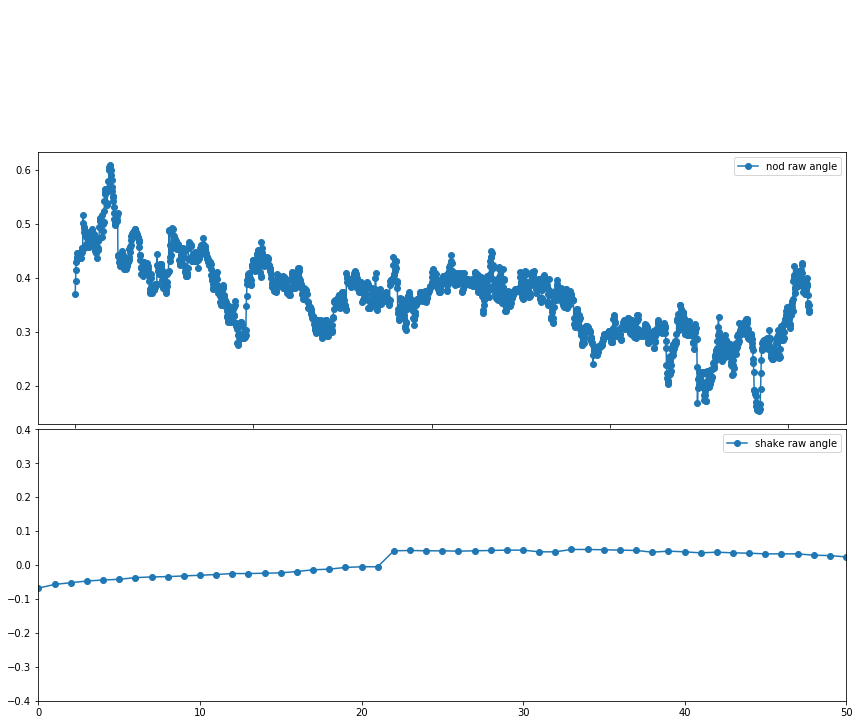

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/483/483_LastArgument/483_LastArgument_FACE.csv
csv frame rate: 29.997029997029998
L End reached + -
R End reached + -
[[1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.22044605e-16]
 [1.00000000e+01 2.22044605e-16]
 [1.00000000e+01 2.22044605e-16]
 [1.00000000e+01 2.22044605e-16]
 [1.20000000e+01 2.22044605e-16]
 [1.20000000e+01 2.22044605e-16]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [1.20000000e+01 4.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [1

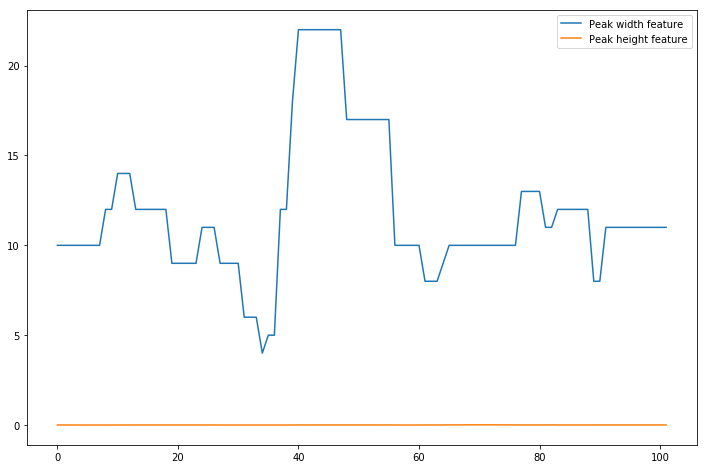

csv frame rate: 29.997029997029998
L End reached - +
R End reached - +
[[1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.40000000e+01 2.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [1.50000000e+01 1.00000000e-03]
 [1.5

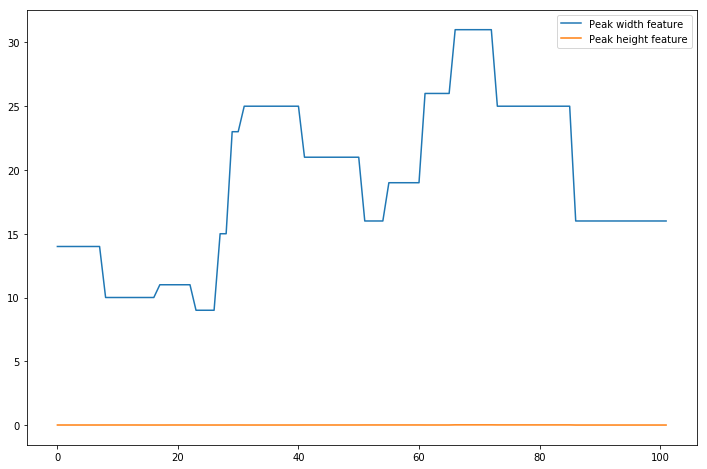


Annotations:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 

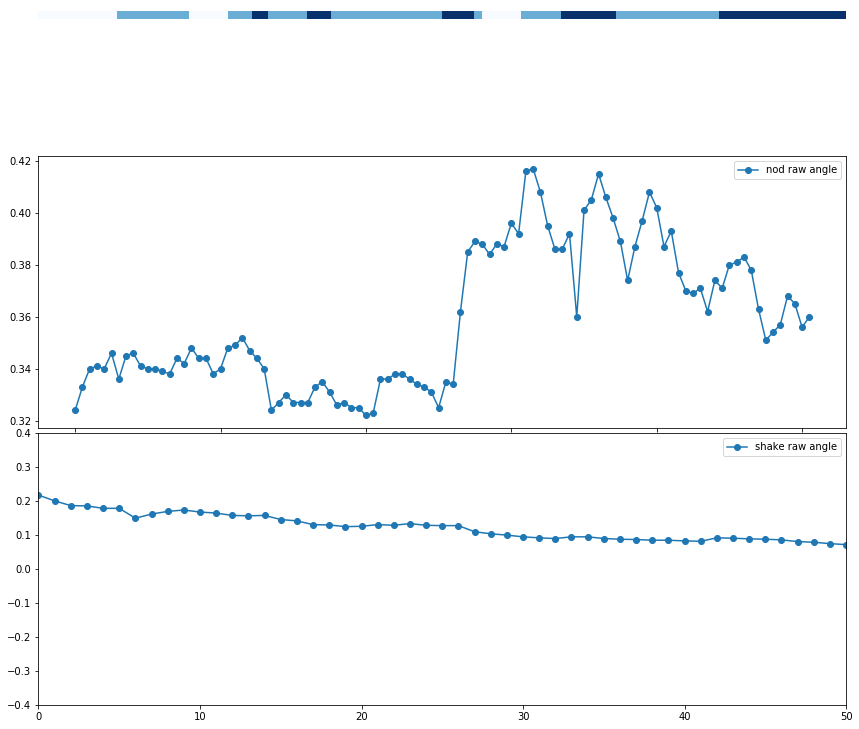

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_MostProudOf/466_MostProudOf_FACE.csv
csv frame rate: 29.999805322483308
L End reached + -
R End reached - +
[[9.0e+00 1.3e-02]
 [9.0e+00 1.3e-02]
 [9.0e+00 1.3e-02]
 ...
 [1.7e+01 1.2e-02]
 [1.7e+01 1.2e-02]
 [1.7e+01 1.2e-02]]


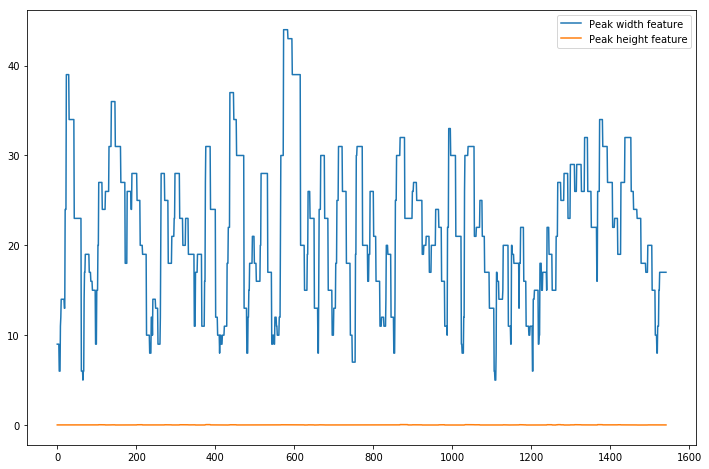

csv frame rate: 29.999805322483308
L End reached - +
R End reached - +
[[2.9e+01 7.0e-03]
 [2.9e+01 7.0e-03]
 [2.9e+01 7.0e-03]
 ...
 [2.3e+01 5.0e-03]
 [2.3e+01 5.0e-03]
 [2.3e+01 5.0e-03]]


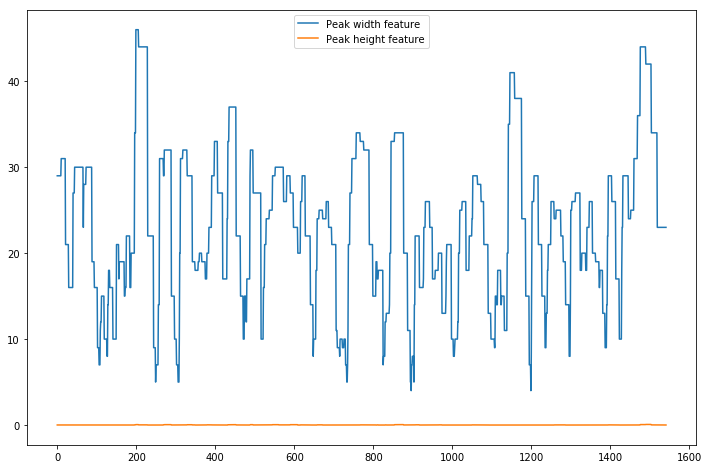


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

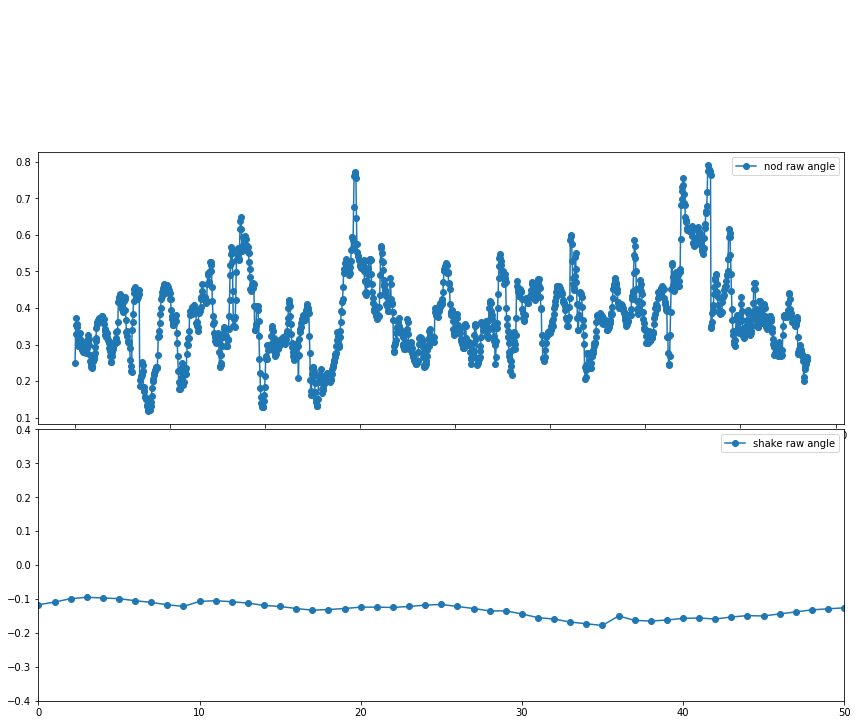

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_SituationHandledDifferent/466_SituationHandledDifferent_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.00000000e+01 1.60000000e-02]
 [1.00000000e+01 1.60000000e-02]
 [1.00000000e+01 1.60000000e-02]
 [1.00000000e+01 1.60000000e-02]
 [1.00000000e+01 1.60000000e-02]
 [1.00000000e+01 1.60000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [7.00000000e+00 1.00000000e-02]
 [6.00000000e+00 1.00000000e-02]
 [6.00000000e+00 1.00000000e-02]
 [5.00000000e+00 2.00000000e-03]
 [5.00000000e+00 2.00000000e-03]
 [9.00000000e+00 4.00000000e-03]
 [1.70000000e+01 7.00000000e-03]
 [2.90000000e+01 4.60000000e-02]
 [2.90000000e+01 4.60000000e-02]
 [2.90000000e+01 4.60000000e-02]
 [2.90000000e+01 4.60000000e-02]
 [2.90000000e+01 4.60000000e-02]
 [2.90000000e+01 4.60000

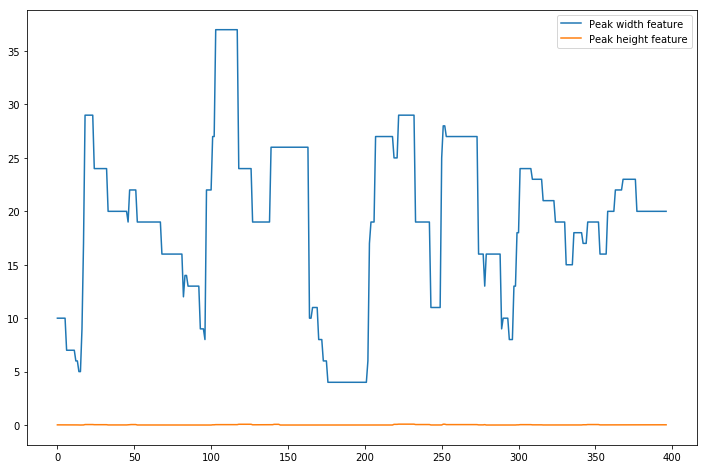

csv frame rate: 30.0
L End reached - +
R End reached + -
[[3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 8.00000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [3.50000000e+01 5.20000000e-02]
 [2.50000000e+01 7.00000000e-03]
 [2.50000000e+01 7.

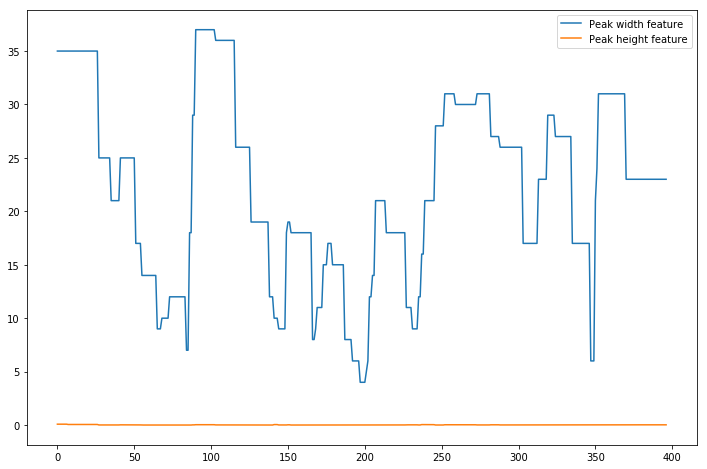


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

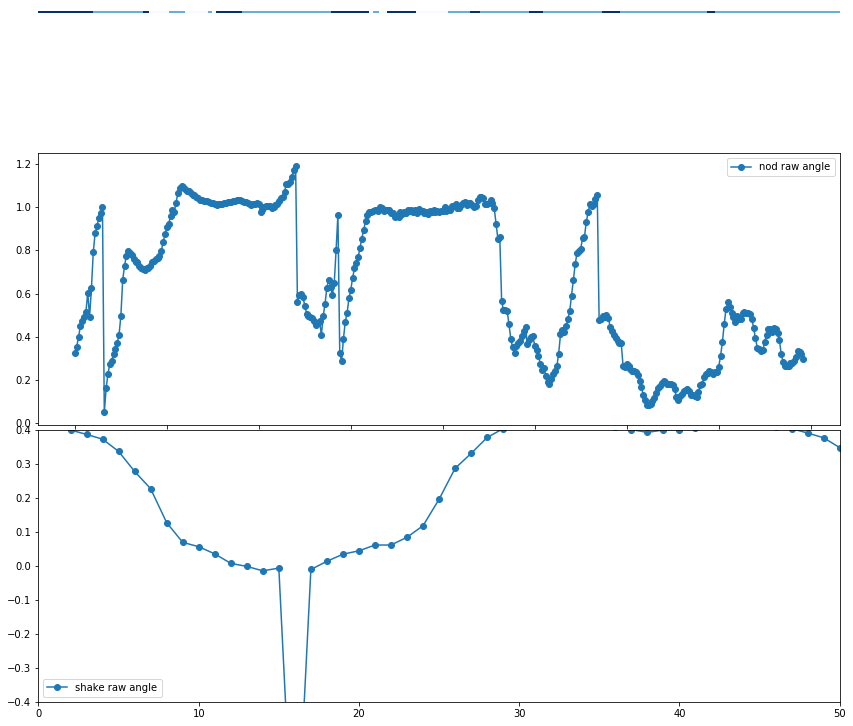

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_HowCloseToFamily/466_HowCloseToFamily_FACE.csv
csv frame rate: 29.999403590385878
L End reached + -
R End reached + -
[[2.9e+01 4.8e-02]
 [2.9e+01 4.8e-02]
 [2.9e+01 4.8e-02]
 ...
 [1.8e+01 3.0e-03]
 [1.8e+01 3.0e-03]
 [1.8e+01 3.0e-03]]


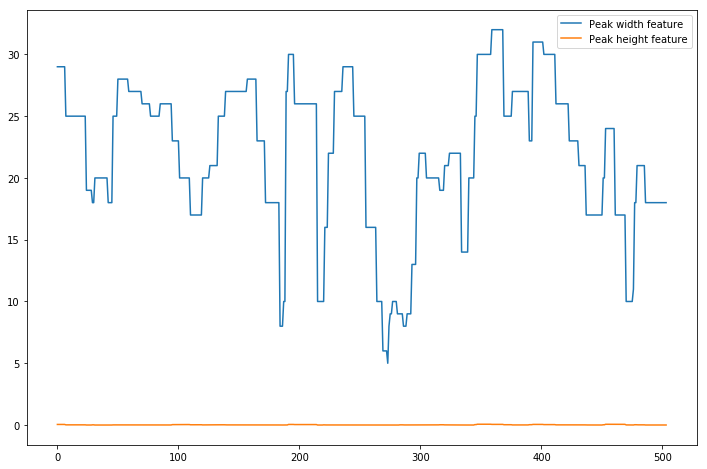

csv frame rate: 29.999403590385878
L End reached - +
R End reached + -
[[1.3e+01 3.0e-03]
 [1.3e+01 3.0e-03]
 [1.3e+01 3.0e-03]
 ...
 [2.9e+01 1.1e-02]
 [2.9e+01 1.1e-02]
 [2.9e+01 1.1e-02]]


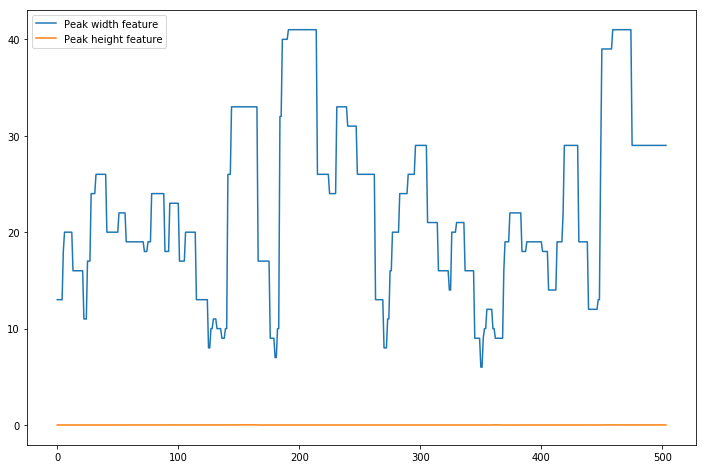


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

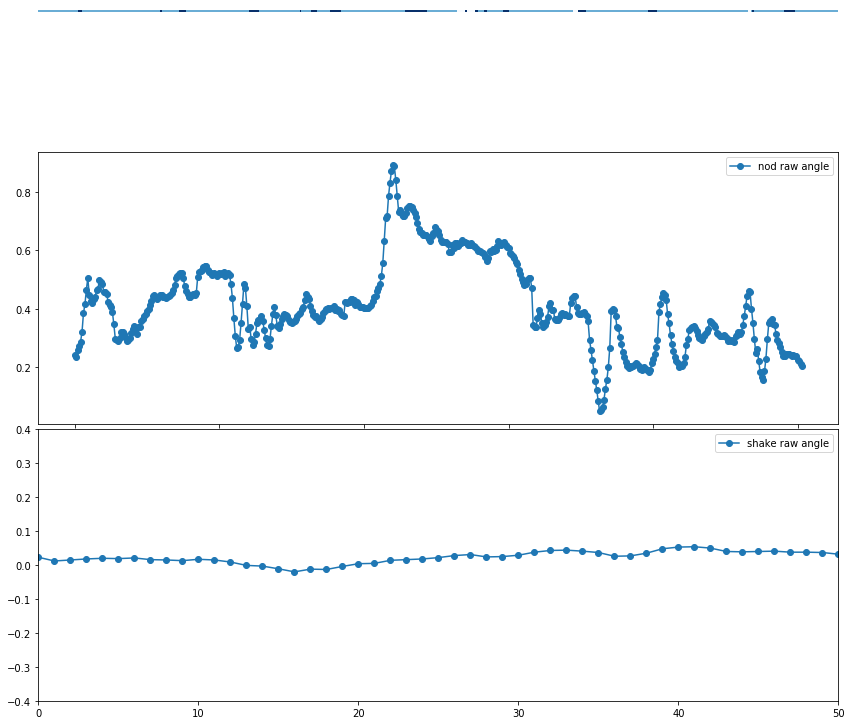

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_LastTimeHappy/466_LastTimeHappy_FACE.csv
csv frame rate: 30.00062762819306
L End reached + -
R End reached + -
[[1.10000000e+01 1.24043603e-02]
 [1.10000000e+01 1.24043603e-02]
 [1.10000000e+01 1.24043603e-02]
 [1.10000000e+01 1.24043603e-02]
 [9.00000000e+00 7.87536847e-03]
 [9.00000000e+00 7.87536847e-03]
 [9.00000000e+00 7.87536847e-03]
 [9.00000000e+00 7.87536847e-03]
 [1.90000000e+01 1.78453653e-03]
 [1.90000000e+01 1.78453653e-03]
 [1.90000000e+01 1.78453653e-03]
 [1.70000000e+01 8.85559524e-03]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [2.10000000e+01 3.13308655e-04]
 [

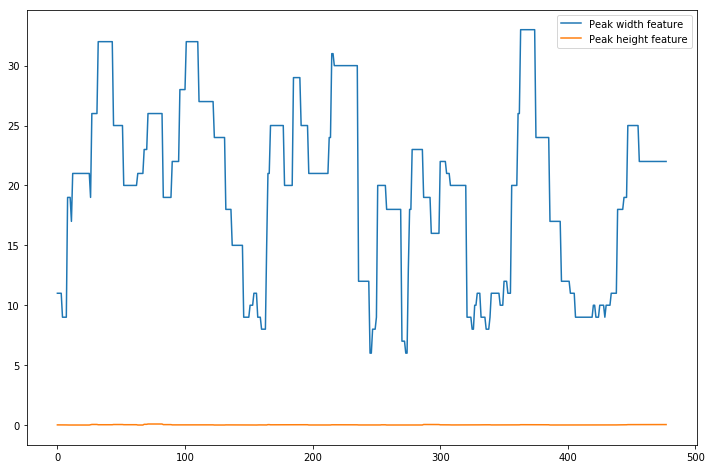

csv frame rate: 30.00062762819306
L End reached - +
R End reached + -
[[1.60000000e+01 2.79250865e-03]
 [1.60000000e+01 2.79250865e-03]
 [1.60000000e+01 2.79250865e-03]
 [1.60000000e+01 2.79250865e-03]
 [1.60000000e+01 2.79250865e-03]
 [1.60000000e+01 2.79250865e-03]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [1.20000000e+01 3.94360547e-04]
 [6.00000000e+00 3.94360547e-04]
 [6.00000000e+00 3.94360547e-04]
 [1.60000000e+01 4.07764356e-04]
 [2.90000000e+01 1.42323303e-02]
 [2.90000000e+01 1.42323303e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70000000e+01 1.51878659e-02]
 [3.70

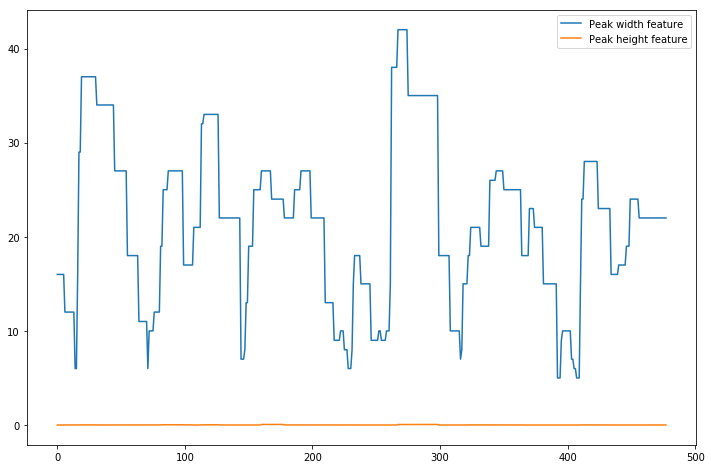


Annotations:
[1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1

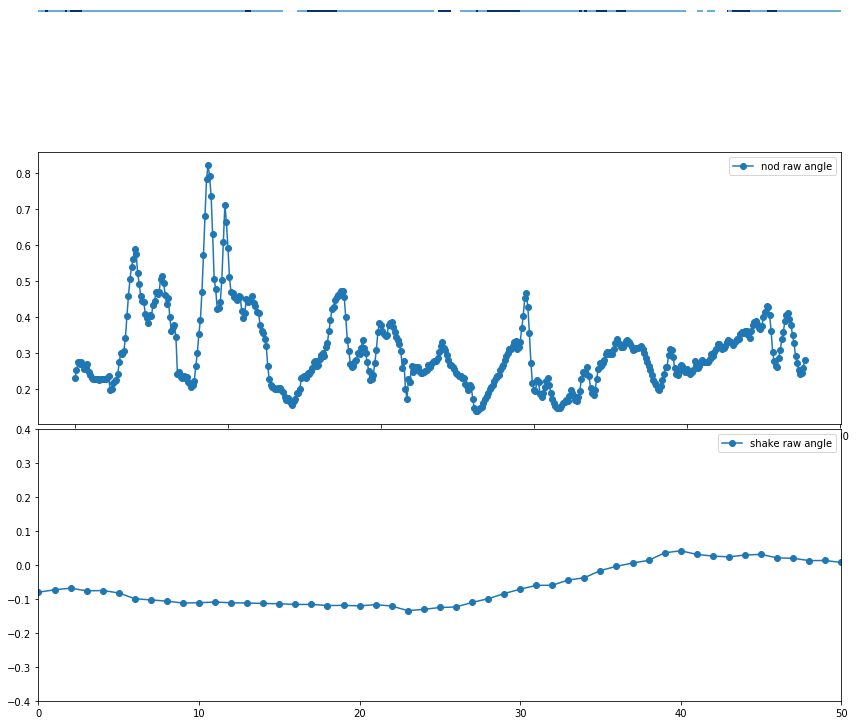

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_HardestDecision/466_HardestDecision_FACE.csv
csv frame rate: 29.99981296874708
L End reached + -
R End reached + -
[[1.9e+01 6.4e-02]
 [1.9e+01 6.4e-02]
 [1.9e+01 6.4e-02]
 ...
 [2.4e+01 1.8e-02]
 [2.4e+01 1.8e-02]
 [2.4e+01 1.8e-02]]


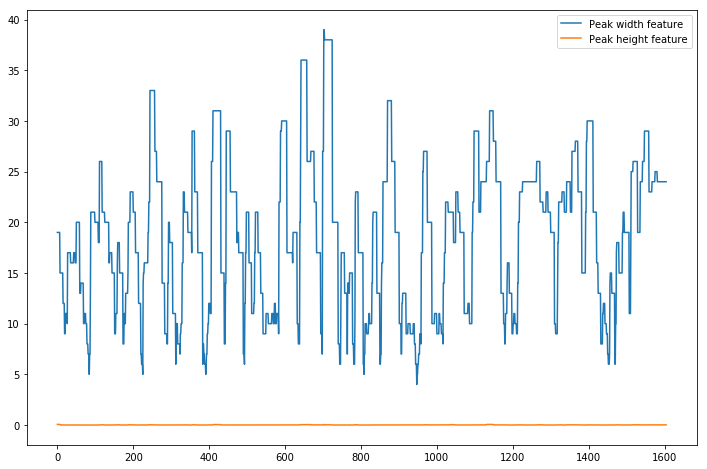

csv frame rate: 29.99981296874708
L End reached - +
R End reached + -
[[2.9e+01 5.6e-02]
 [2.9e+01 5.6e-02]
 [2.9e+01 5.6e-02]
 ...
 [9.0e+00 6.0e-03]
 [9.0e+00 6.0e-03]
 [9.0e+00 6.0e-03]]


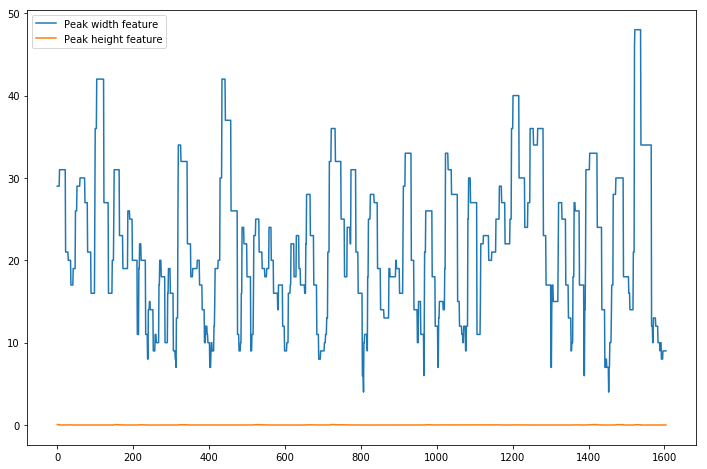


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

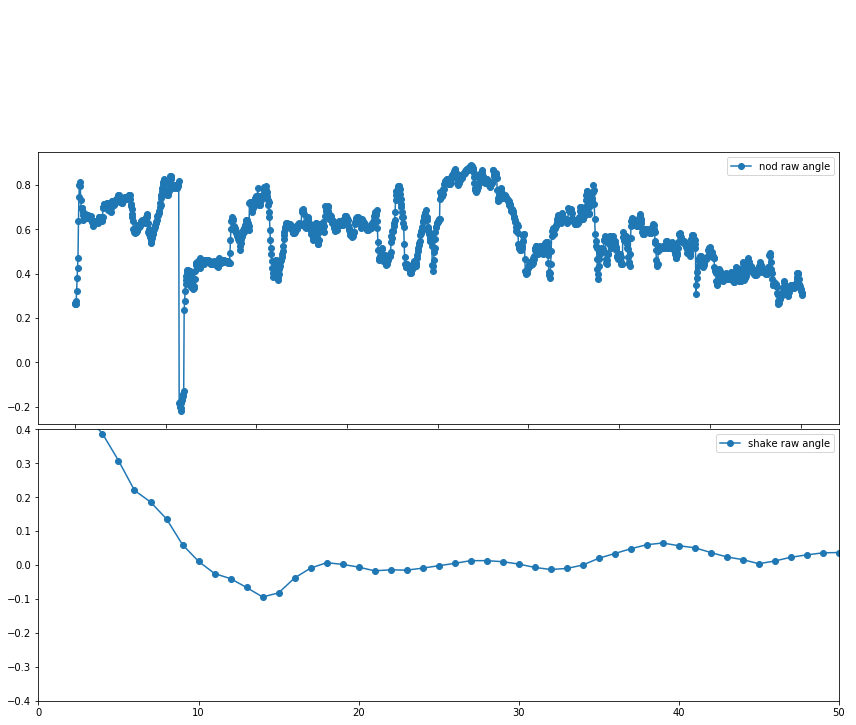

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_EventToErase/466_EventToErase_FACE.csv
csv frame rate: 29.99988554030698
L End reached + -
R End reached + -
[[9.0e+00 8.0e-03]
 [9.0e+00 8.0e-03]
 [9.0e+00 8.0e-03]
 ...
 [2.3e+01 1.8e-02]
 [2.3e+01 1.8e-02]
 [2.3e+01 1.8e-02]]


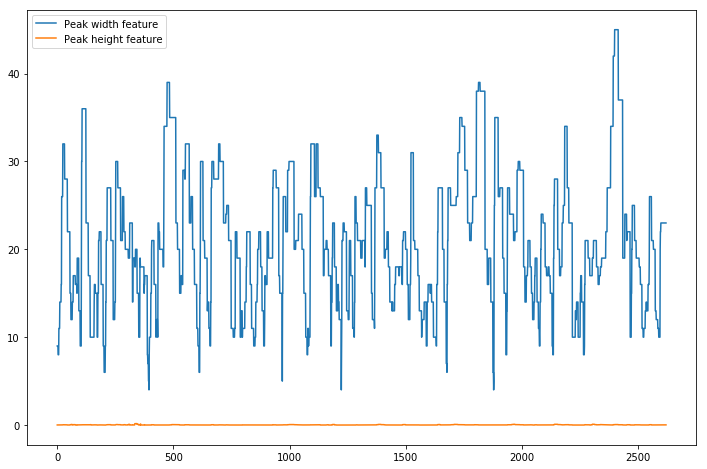

csv frame rate: 29.99988554030698
L End reached - +
R End reached - +
[[1.6e+01 1.0e-03]
 [1.6e+01 1.0e-03]
 [1.6e+01 1.0e-03]
 ...
 [2.1e+01 1.0e-03]
 [2.1e+01 1.0e-03]
 [2.1e+01 1.0e-03]]


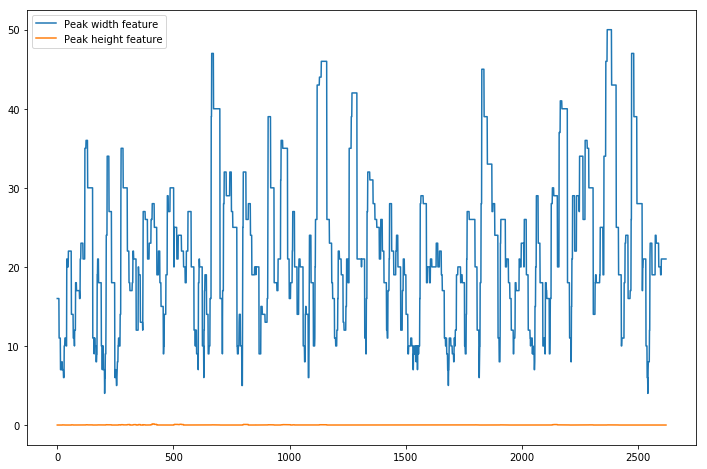


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2

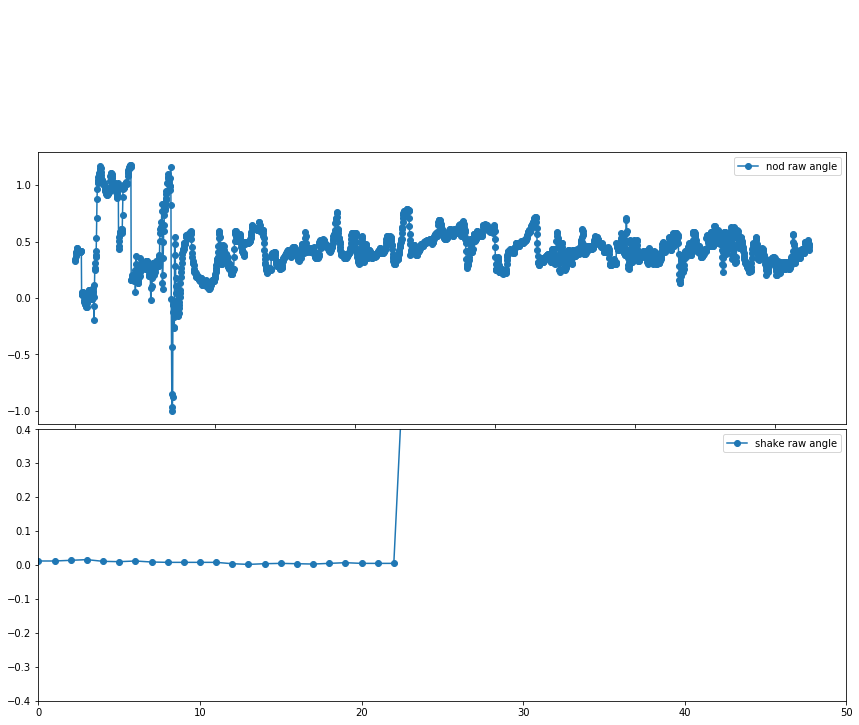

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/466/466_LastArgument/466_LastArgument_FACE.csv
csv frame rate: 30.001807337791437
L End reached - +
R End reached + -
[[1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.70000000e+01 6.94893601e-03]
 [1.20000000e+01 1.62187768e-03]
 [1.20000000e+01 1.62187768e-03]
 [1.20000000e+01 1.62187768e-03]
 [1.20000000e+01 1.62187768e-03]
 [1.20000000e+01 1.62187768e-03]
 [1.50000000e+01 5.35510279e-03]
 [1.60000000e+01 2.47930344e-02]
 [1.60000000e+01 2.47930344e-02]
 [1.60000000e+01 2.47930344e-02]
 [1.60000000e+01 2.47930344e-02]
 [1.60000000e+01 2.47930344e-02]
 [1.70000000e+01 2.51452394e-04]
 [1.70000000e+01 2.51452394e-04]
 [1

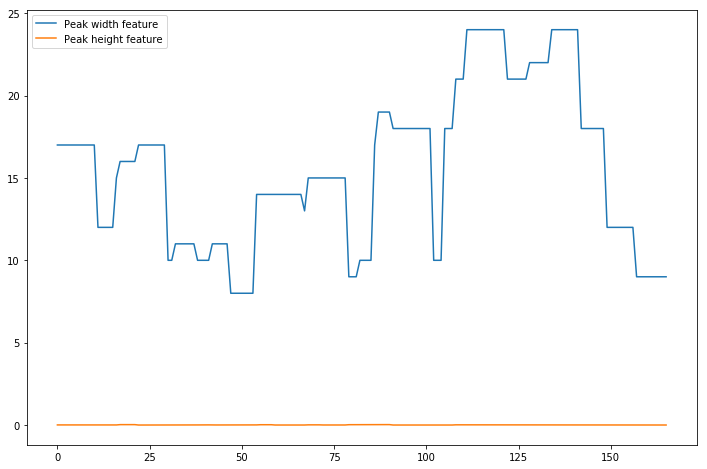

csv frame rate: 30.001807337791437
L End reached + -
R End reached - +
[[1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.30000000e+01 1.89087789e-03]
 [1.90000000e+01 7.00442204e-03]
 [2.20000000e+01 3.65066830e-02]
 [2.20000000e+01 3.65066830e-02]
 [2.20000000e+01 3.65066830e-02]
 [2.20000000e+01 3.65066830e-02]
 [2.20000000e+01 3.65066830e-02]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.80000000e+01 3.26479711e-03]
 [1.30000000e+01 1.01972719e-04]
 [1.30000000e+01 1.01972719e-04]
 [1.30000000e+01 1.01972719e-04]
 [1.3

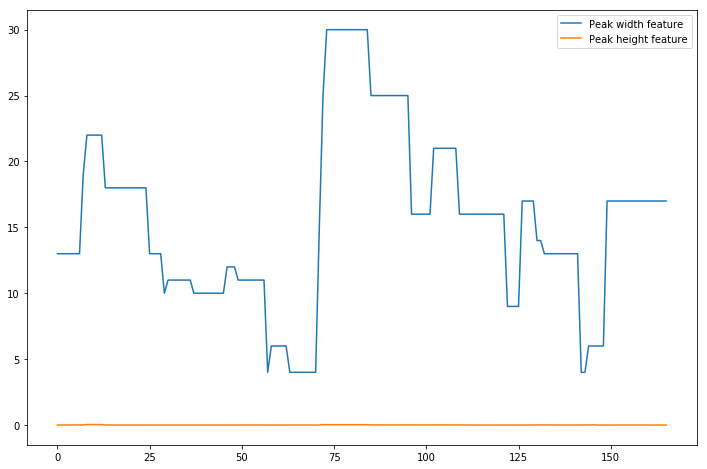


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1

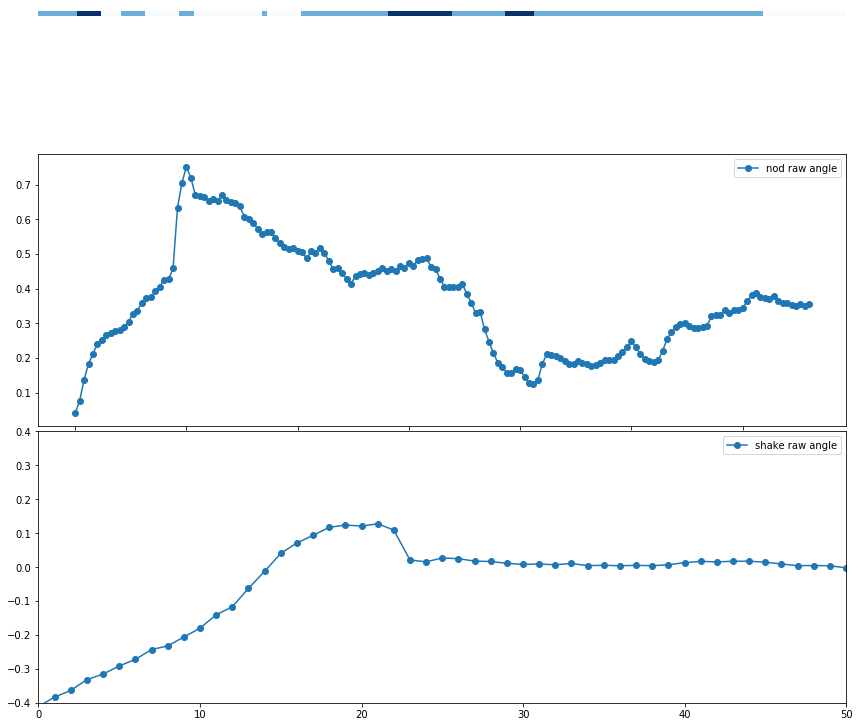

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_HowCloseToFamily/488_HowCloseToFamily_FACE.csv
csv frame rate: 29.99978932732214
L End reached - +
R End reached + -
[[2.5e+01 2.0e-02]
 [2.5e+01 2.0e-02]
 [2.5e+01 2.0e-02]
 ...
 [1.9e+01 5.0e-03]
 [1.9e+01 5.0e-03]
 [1.9e+01 5.0e-03]]


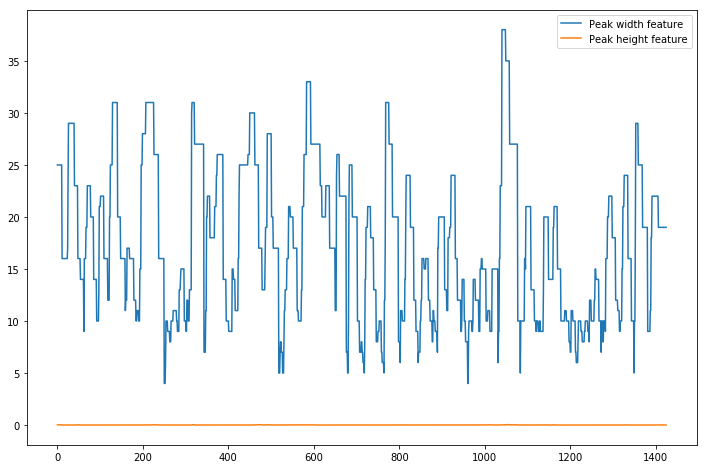

csv frame rate: 29.99978932732214
L End reached - +
R End reached + -
[[2.7e+01 2.1e-02]
 [2.7e+01 2.1e-02]
 [2.7e+01 2.1e-02]
 ...
 [1.0e+01 1.0e-03]
 [1.0e+01 1.0e-03]
 [1.0e+01 1.0e-03]]


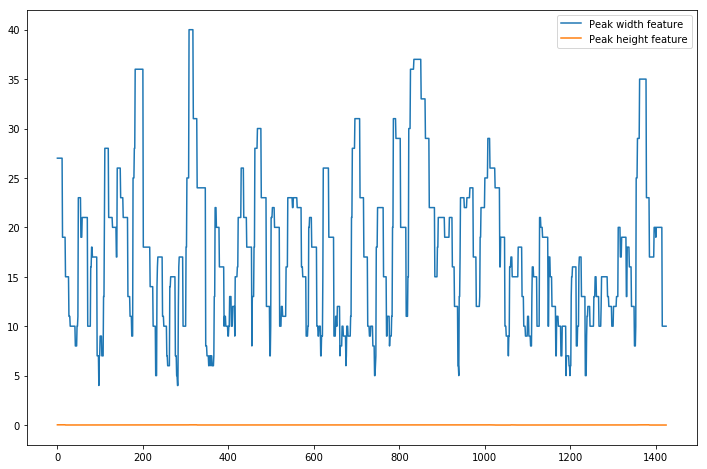


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1

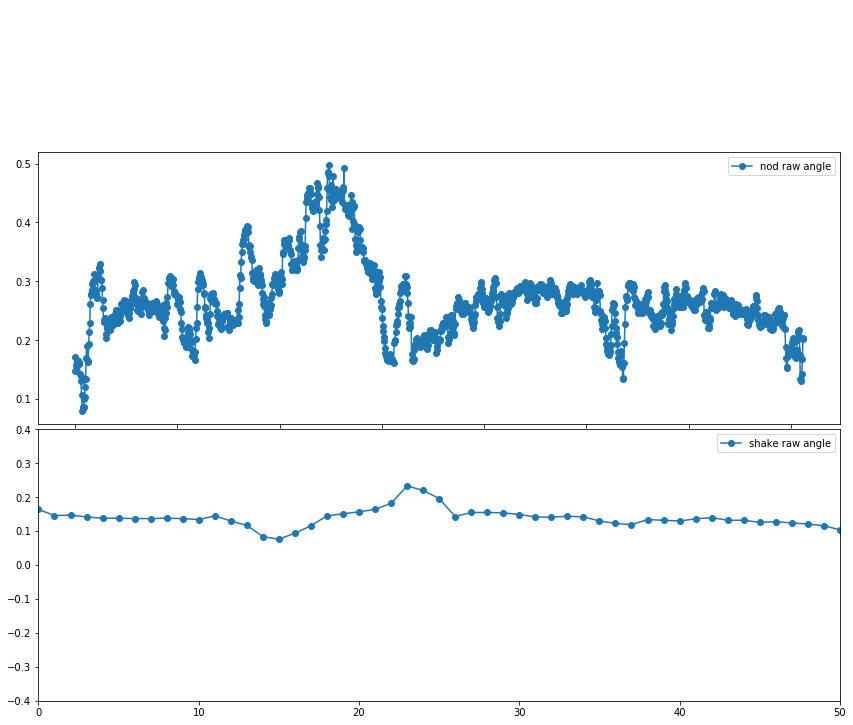

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_SituationHandledDifferent/488_SituationHandledDifferent_FACE.csv
csv frame rate: 29.99952756649502
L End reached + -
R End reached - +
[[2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]
 ...
 [1.4e+01 3.0e-03]
 [1.4e+01 3.0e-03]
 [1.4e+01 3.0e-03]]


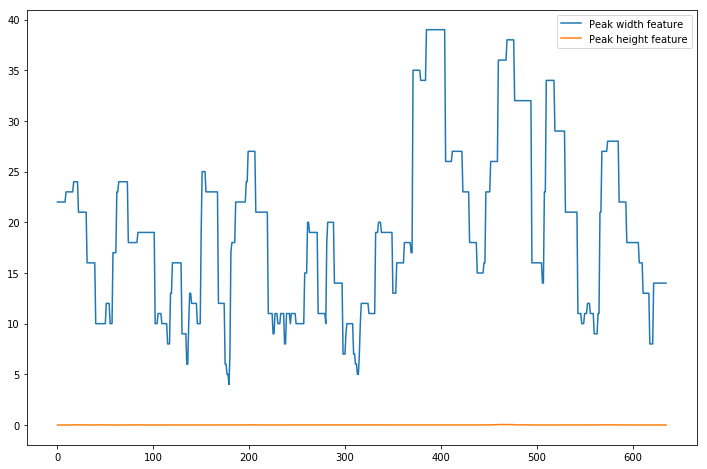

csv frame rate: 29.99952756649502
L End reached + -
R End reached + -
[[1.4e+01 2.0e-03]
 [1.4e+01 2.0e-03]
 [1.4e+01 2.0e-03]
 ...
 [2.5e+01 2.0e-03]
 [2.5e+01 2.0e-03]
 [2.5e+01 2.0e-03]]


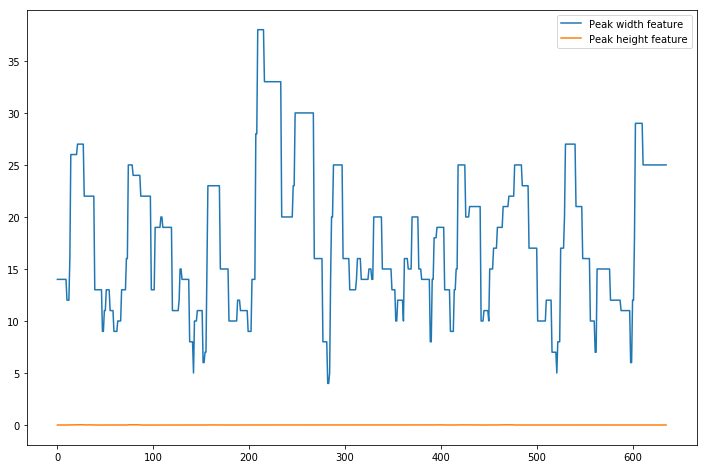


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0

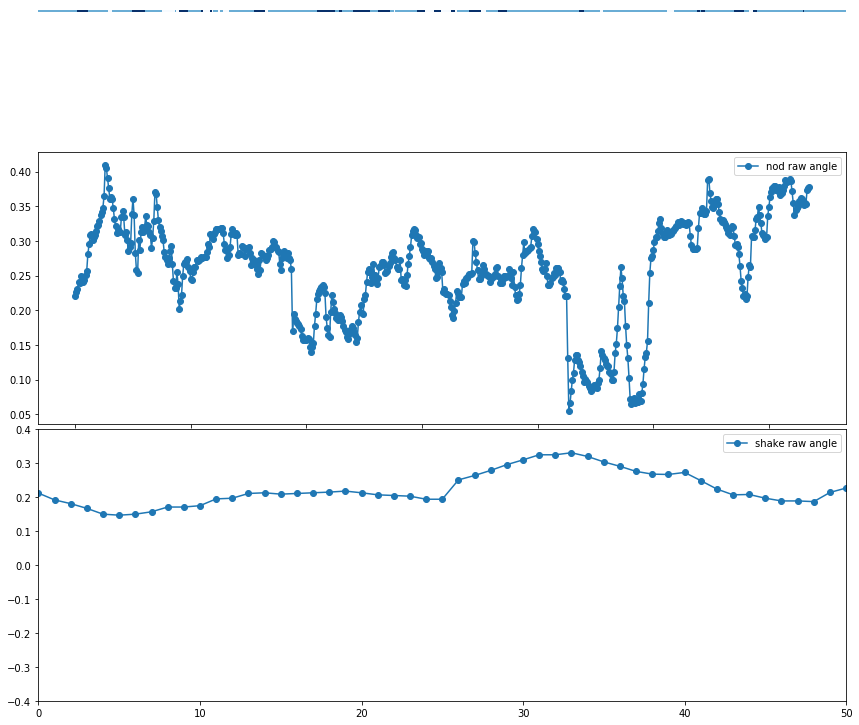

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_LastTimeHappy/488_LastTimeHappy_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.6e+01 1.4e-02]
 [1.6e+01 1.4e-02]
 [1.6e+01 1.4e-02]
 ...
 [1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]]


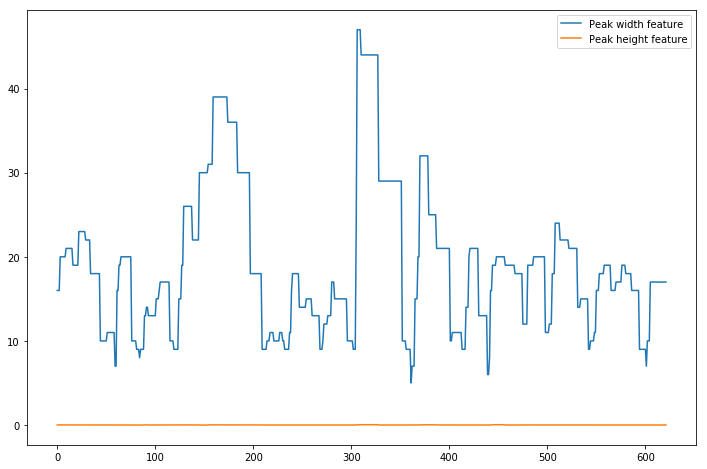

csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.2e+01 6.0e-03]
 [1.2e+01 6.0e-03]
 [1.2e+01 6.0e-03]
 ...
 [1.1e+01 1.0e-03]
 [1.1e+01 1.0e-03]
 [1.1e+01 1.0e-03]]


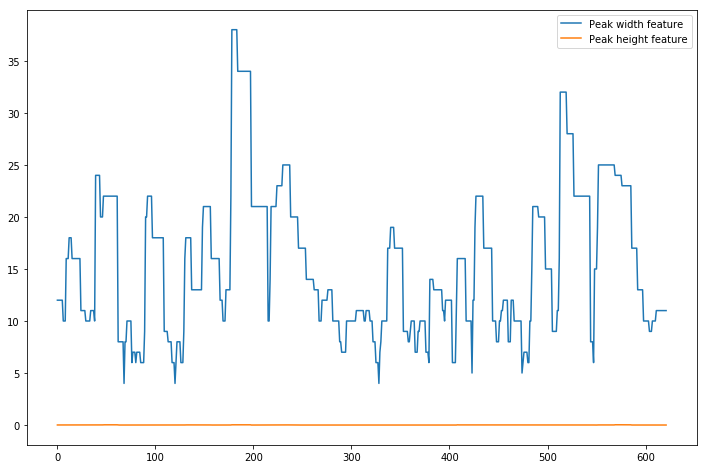


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2

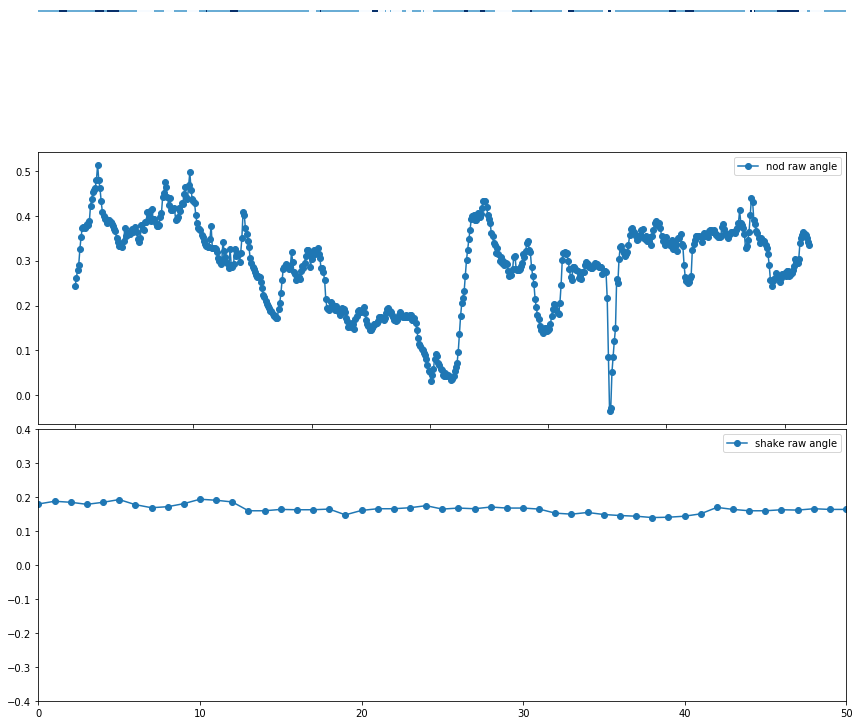

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_EventToErase/488_EventToErase_FACE.csv
csv frame rate: 29.999318197313702
L End reached + -
R End reached - +
[[9.00000000e+00 5.00000000e-03]
 [9.00000000e+00 5.00000000e-03]
 [9.00000000e+00 5.00000000e-03]
 [9.00000000e+00 5.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.90000000e+01 9.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.00000000e+01 8.32667268e-17]
 [2.00000000e+01 8.32667268e-17]
 [2.00000000e+01 8.32667268e-17]
 [2.00000000e+01 8.32667268e-17]
 [2.00000000e+01 8.32667268e-17]
 [2.00000000e+01 8.32667268e-17]
 [2

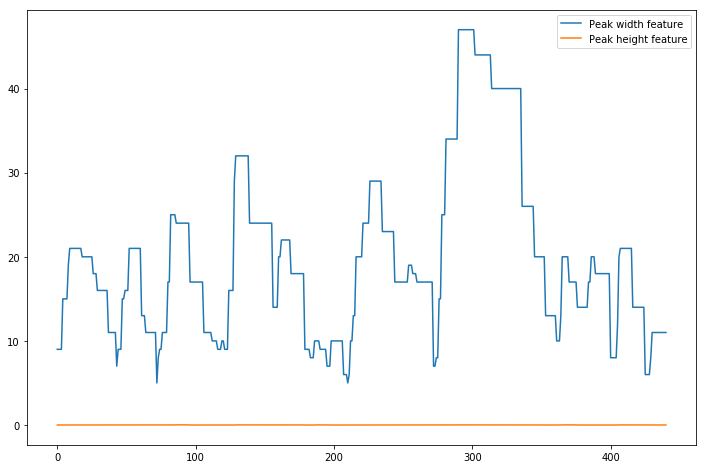

csv frame rate: 29.999318197313702
L End reached + -
R End reached + -
[[1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [5.00000000e+00 3.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.20000000e+01 9.00000000e-03]
 [1.20000000e+01 9.00000000e-03]
 [1.20000000e+01 9.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.80000000e+01 3.00000000e-03]
 [1.80000000e+01 3.00000000e-03]
 [1.80000000e+01 3.00000000e-03]
 [2.20000000e+01 6.00000000e-03]
 [2.20000000e+01 6.00000000e-03]
 [2.20000000e+01 6.00000000e-03]
 [2.20000000e+01 6.00000000e-03]
 [2.20000000e+01 6.00000000e-03]
 [1.80000000e+01 4.00000000e-03]
 [1.8

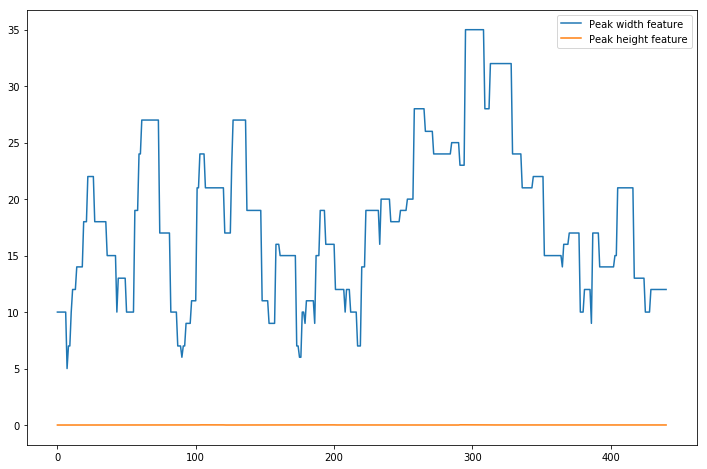


Annotations:
[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

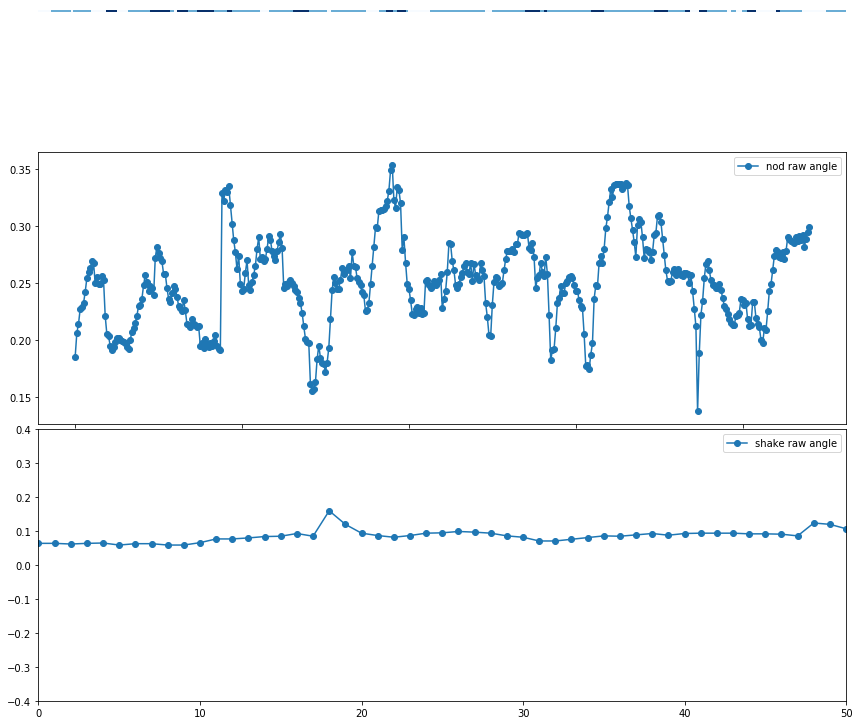

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_MostProudOf/488_MostProudOf_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached + -
[[1.70000000e+01 1.29956222e-02]
 [1.70000000e+01 1.29956222e-02]
 [1.70000000e+01 1.29956222e-02]
 ...
 [2.00000000e+01 2.72690929e-03]
 [2.00000000e+01 2.72690929e-03]
 [2.00000000e+01 2.72690929e-03]]


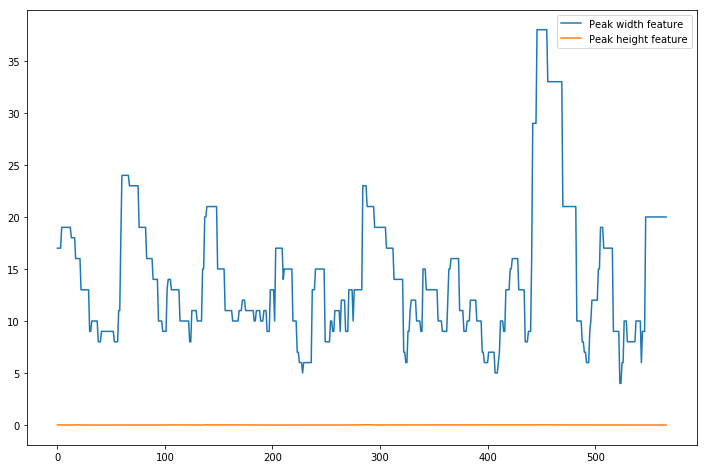

csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[1.20000000e+01 2.49925111e-03]
 [1.20000000e+01 2.49925111e-03]
 [1.20000000e+01 2.49925111e-03]
 ...
 [1.80000000e+01 2.08040710e-02]
 [1.80000000e+01 2.08040710e-02]
 [1.80000000e+01 2.08040710e-02]]


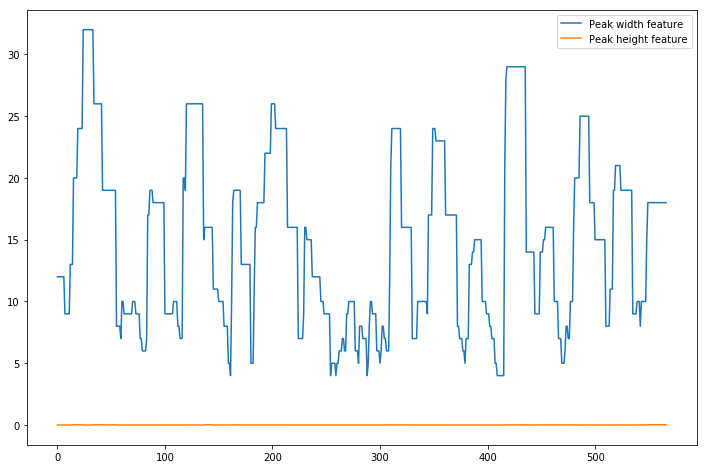


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2

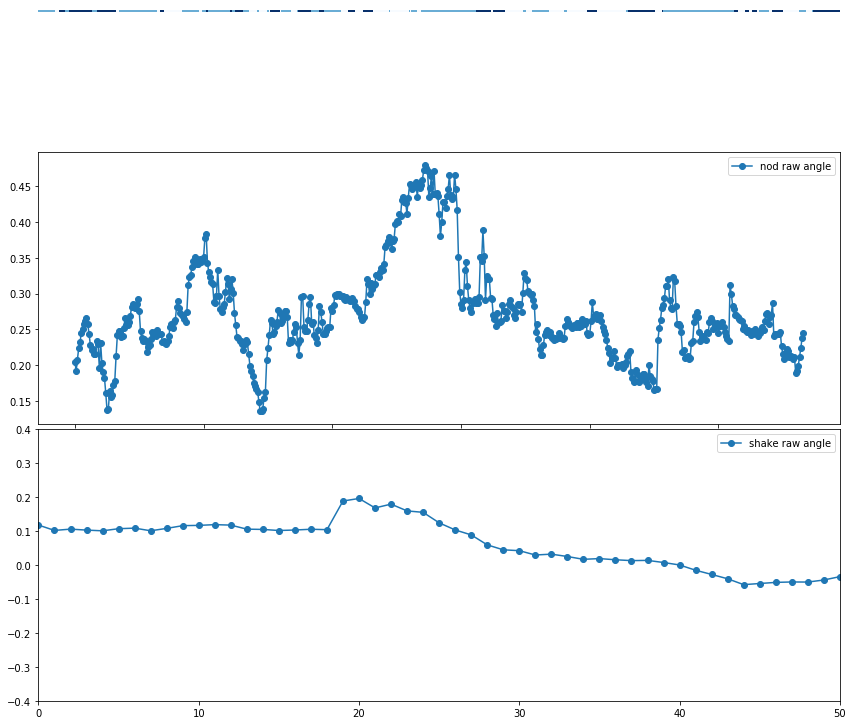

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/488/488_LastArgument/488_LastArgument_FACE.csv
csv frame rate: 30.000437962597992
L End reached + -
R End reached + -
[[8.00000000e+00 6.94753708e-03]
 [8.00000000e+00 6.94753708e-03]
 [8.00000000e+00 6.94753708e-03]
 ...
 [9.00000000e+00 6.13268259e-04]
 [9.00000000e+00 6.13268259e-04]
 [9.00000000e+00 6.13268259e-04]]


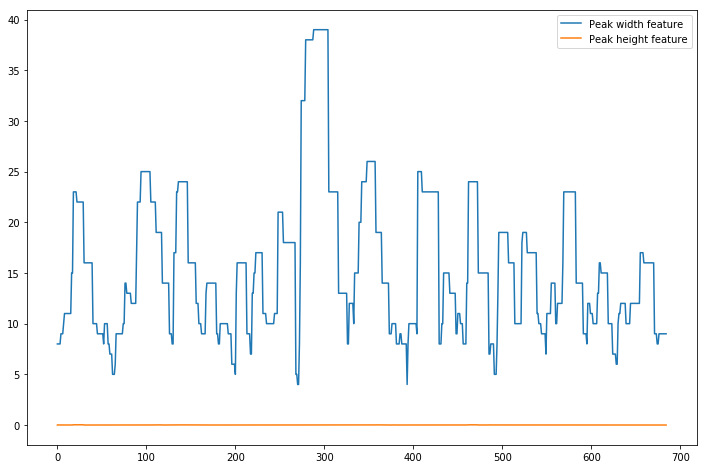

csv frame rate: 30.000437962597992
L End reached - +
R End reached - +
[[2.70000000e+01 7.03372478e-03]
 [2.70000000e+01 7.03372478e-03]
 [2.70000000e+01 7.03372478e-03]
 ...
 [2.00000000e+01 9.16991128e-03]
 [2.00000000e+01 9.16991128e-03]
 [2.00000000e+01 9.16991128e-03]]


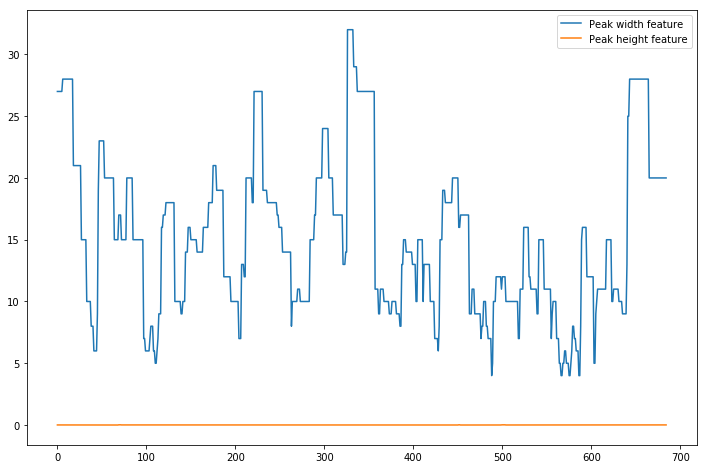


Annotations:
[1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2

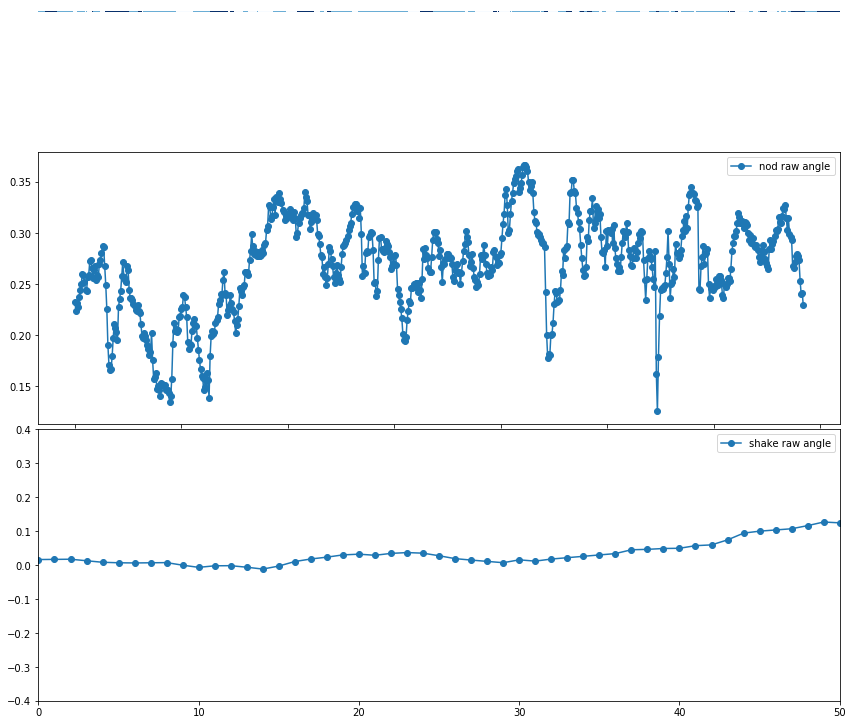

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_HowCloseToFamily/482_HowCloseToFamily_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[2.60000000e+01 2.10000000e-02]
 [2.60000000e+01 2.10000000e-02]
 [2.60000000e+01 2.10000000e-02]
 [2.60000000e+01 2.10000000e-02]
 [2.60000000e+01 2.10000000e-02]
 [2.60000000e+01 2.10000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [2.30000000e+01 1.30000000e-02]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000

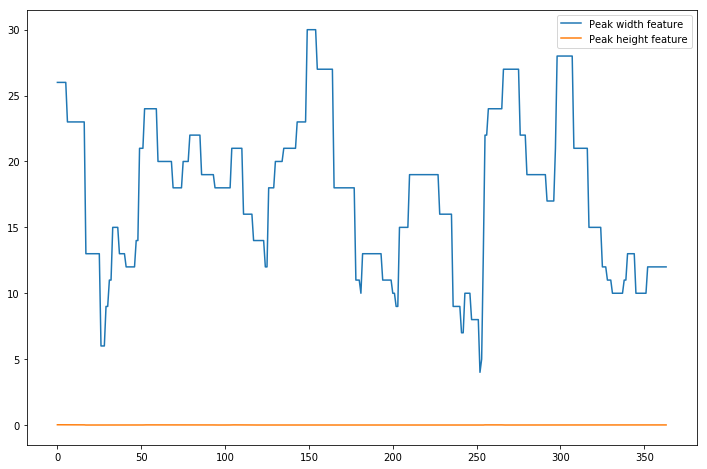

csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.80000000e+01 2.77555756e-17]
 [1.80000000e+01 2.77555756e-17]
 [1.80000000e+01 2.77555756e-17]
 [1.80000000e+01 2.77555756e-17]
 [2.10000000e+01 1.90000000e-02]
 [2.10000000e+01 1.90000000e-02]
 [2.10000000e+01 1.90000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [2.30000000e+01 1.10000000e-02]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.60000000e+01 6.93889390e-17]
 [1.10000000e+01 3.

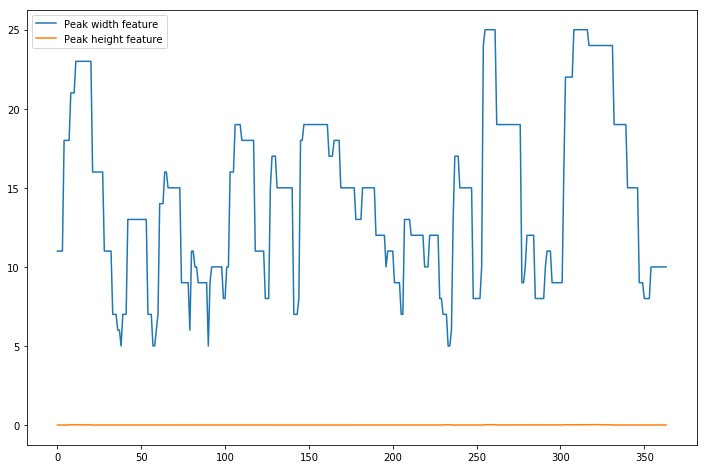


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1

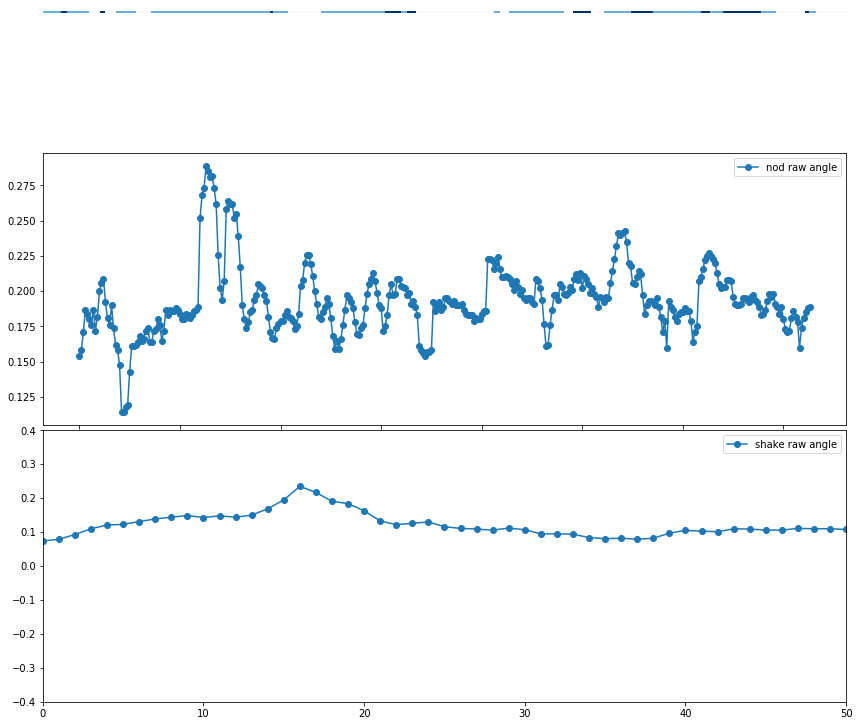

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_MostProudOf/482_MostProudOf_FACE.csv
csv frame rate: 30.000570353048534
L End reached + -
R End reached + -
[[9.00000000e+00 9.12561282e-04]
 [9.00000000e+00 9.12561282e-04]
 [9.00000000e+00 9.12561282e-04]
 ...
 [1.50000000e+01 3.98800767e-03]
 [1.50000000e+01 3.98800767e-03]
 [1.50000000e+01 3.98800767e-03]]


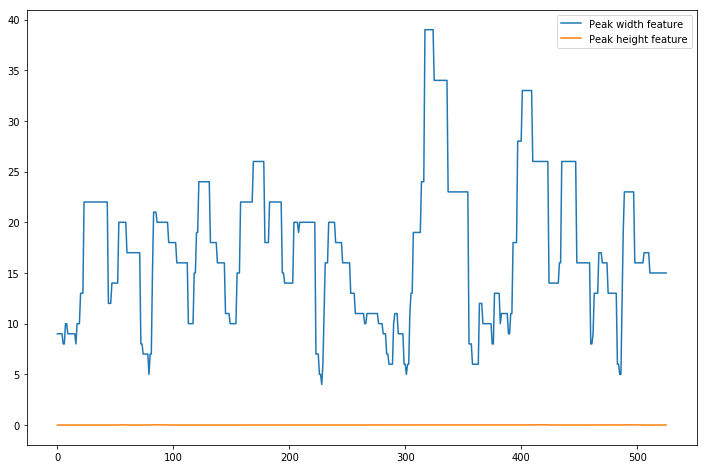

csv frame rate: 30.000570353048534
L End reached + -
R End reached + -
[[1.80000000e+01 1.75115982e-03]
 [1.80000000e+01 1.75115982e-03]
 [1.80000000e+01 1.75115982e-03]
 ...
 [1.10000000e+01 5.44156578e-04]
 [1.10000000e+01 5.44156578e-04]
 [1.10000000e+01 5.44156578e-04]]


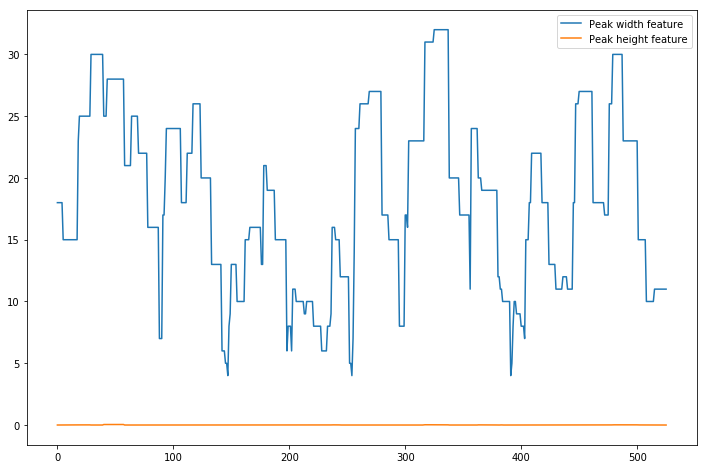


Annotations:
[0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

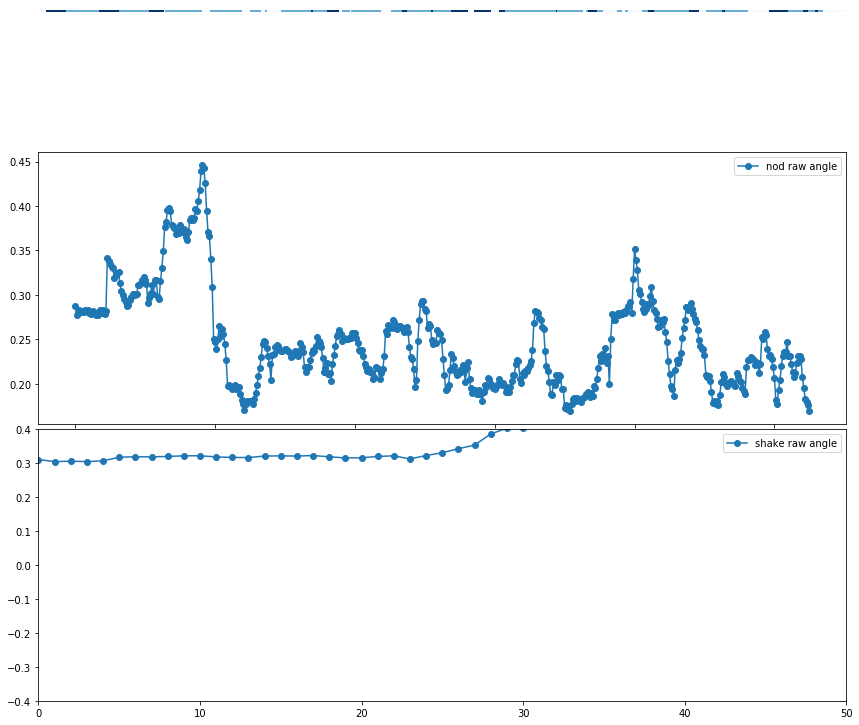

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_HardestDecision/482_HardestDecision_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.7e+01 3.5e-02]
 [1.7e+01 3.5e-02]
 [1.7e+01 3.5e-02]
 ...
 [1.7e+01 6.0e-03]
 [1.7e+01 6.0e-03]
 [1.7e+01 6.0e-03]]


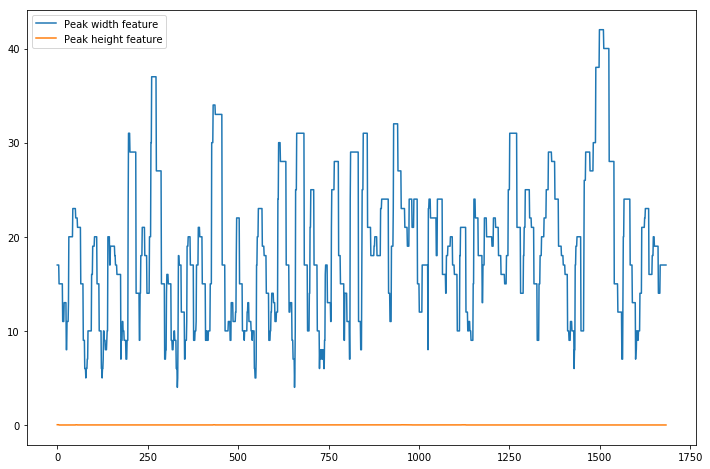

csv frame rate: 30.0
L End reached + -
R End reached + -
[[2.5e+01 3.0e-03]
 [2.5e+01 3.0e-03]
 [2.5e+01 3.0e-03]
 ...
 [1.6e+01 3.0e-03]
 [1.6e+01 3.0e-03]
 [1.6e+01 3.0e-03]]


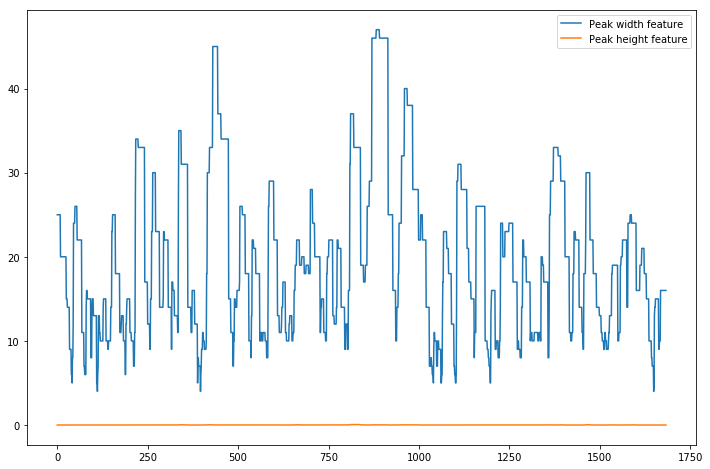


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 0, 0, 1, 1, 1, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0

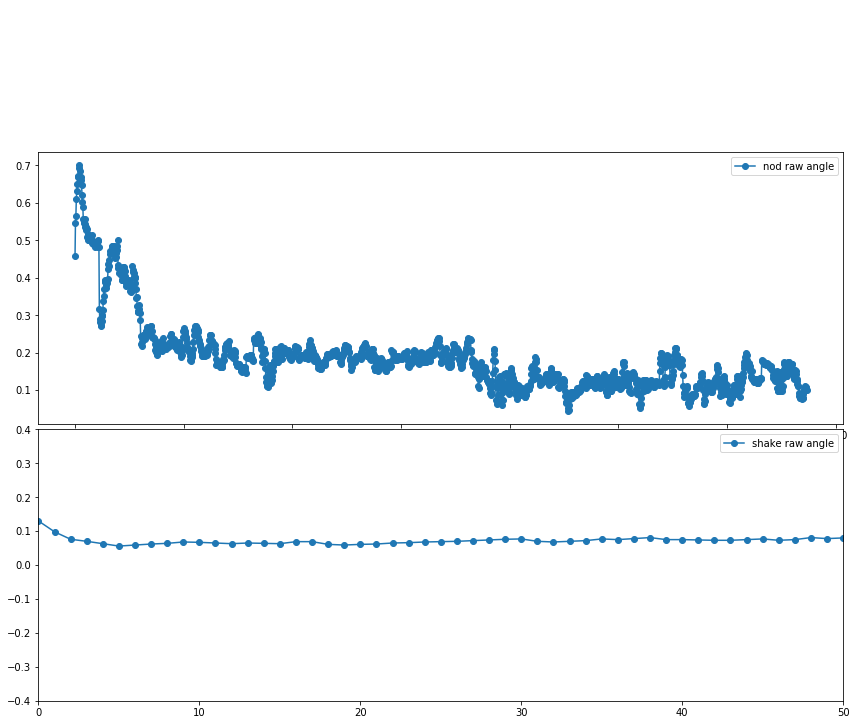

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_EventToErase/482_EventToErase_FACE.csv
csv frame rate: 29.99952077442853
L End reached + -
R End reached - +
[[9.e+00 1.e-03]
 [9.e+00 1.e-03]
 [9.e+00 1.e-03]
 ...
 [9.e+00 1.e-02]
 [9.e+00 1.e-02]
 [9.e+00 1.e-02]]


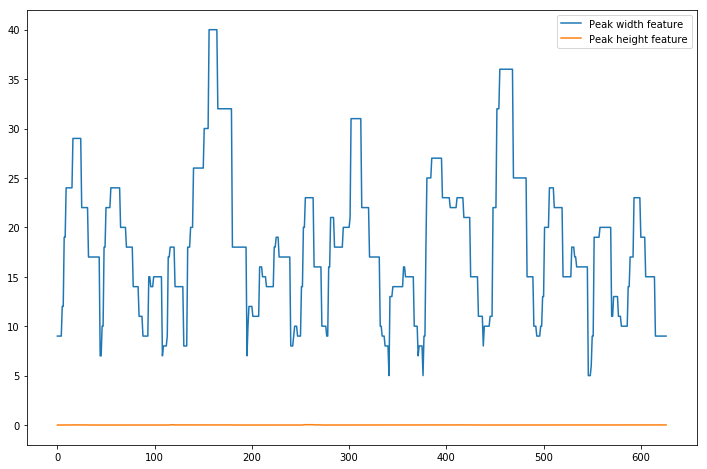

csv frame rate: 29.99952077442853
L End reached + -
R End reached - +
[[2.0e+01 7.0e-03]
 [2.0e+01 7.0e-03]
 [2.0e+01 7.0e-03]
 ...
 [2.2e+01 4.6e-02]
 [2.2e+01 4.6e-02]
 [2.2e+01 4.6e-02]]


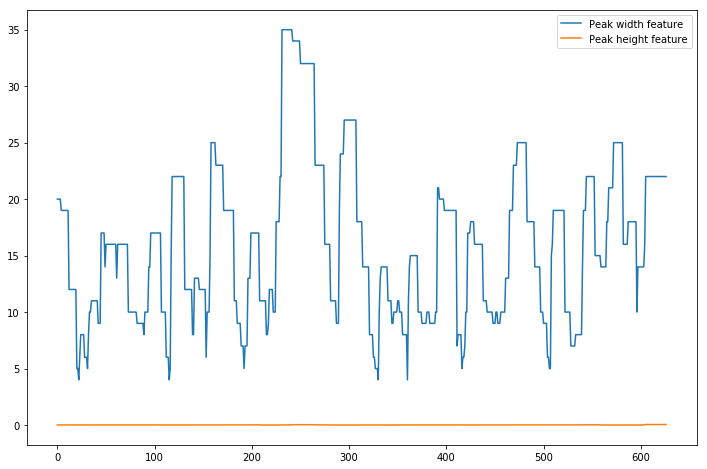


Annotations:
[2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 0, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

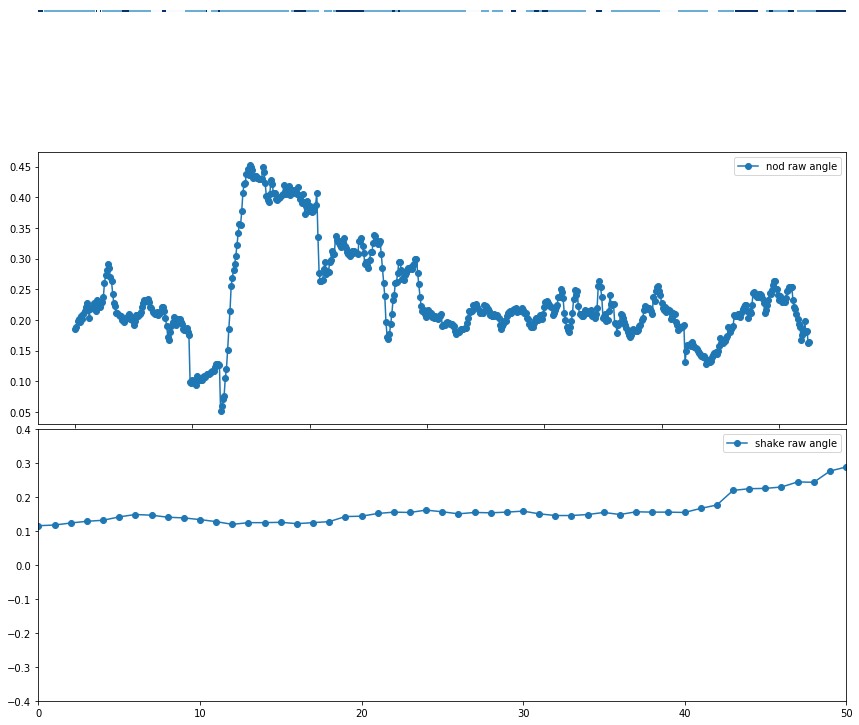

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_LastArgument/482_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.0e+01 6.0e-03]
 [1.0e+01 6.0e-03]
 [1.0e+01 6.0e-03]
 ...
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]]


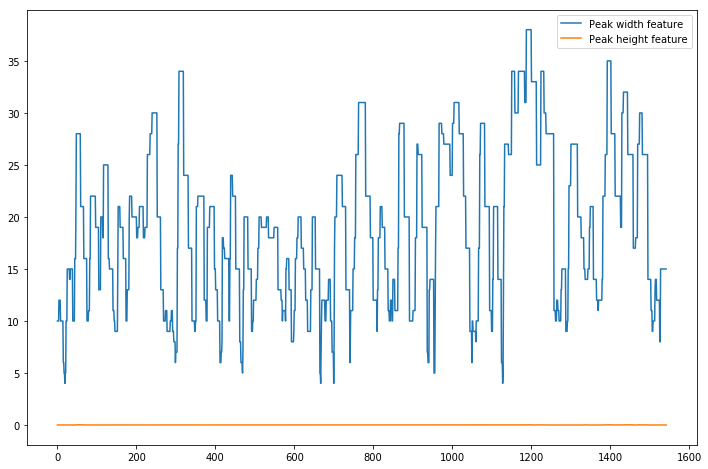

csv frame rate: 30.0
L End reached + -
R End reached + -
[[3.30000000e+01 6.00000000e-03]
 [3.30000000e+01 6.00000000e-03]
 [3.30000000e+01 6.00000000e-03]
 ...
 [1.20000000e+01 2.08166817e-17]
 [1.20000000e+01 2.08166817e-17]
 [1.20000000e+01 2.08166817e-17]]


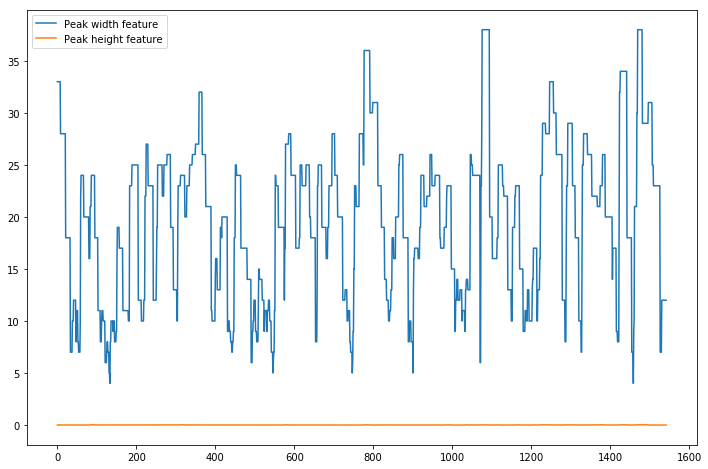


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1

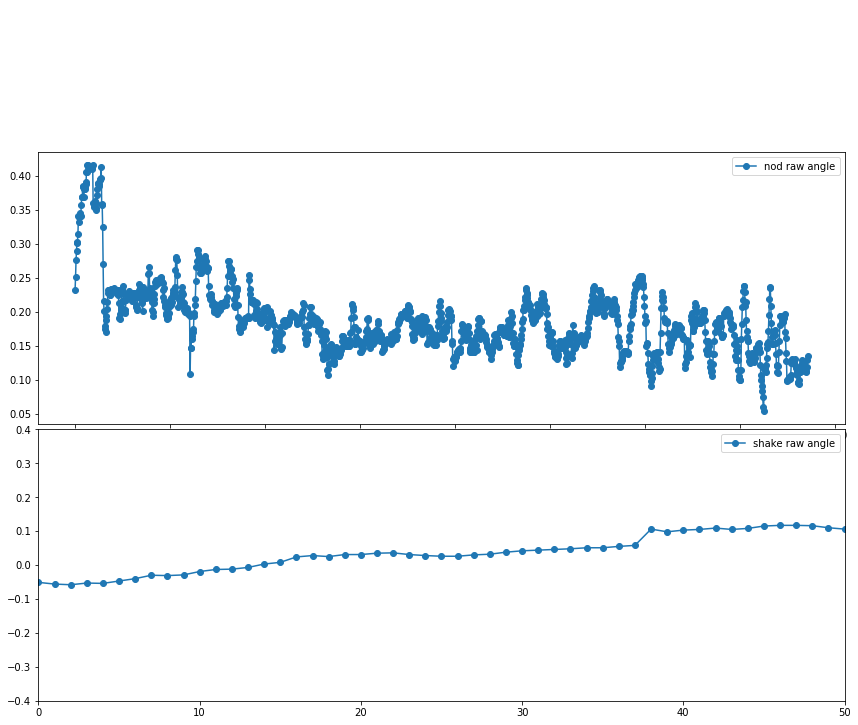

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/482/482_LastTimeHappy/482_LastTimeHappy_FACE.csv
csv frame rate: 29.999999999999996
L End reached - +
R End reached + -
[[1.0e+01 1.0e-03]
 [1.0e+01 1.0e-03]
 [1.0e+01 1.0e-03]
 ...
 [1.6e+01 1.0e-02]
 [1.6e+01 1.0e-02]
 [1.6e+01 1.0e-02]]


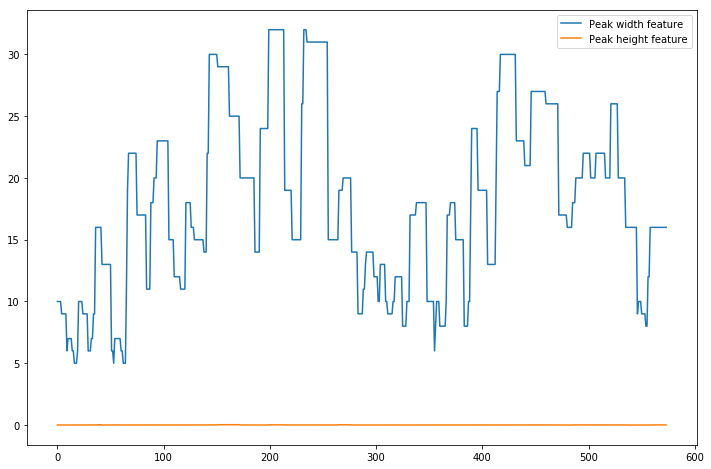

csv frame rate: 29.999999999999996
L End reached + -
R End reached - +
[[1.8e+01 1.0e-03]
 [1.8e+01 1.0e-03]
 [1.8e+01 1.0e-03]
 ...
 [9.0e+00 2.0e-03]
 [9.0e+00 2.0e-03]
 [9.0e+00 2.0e-03]]


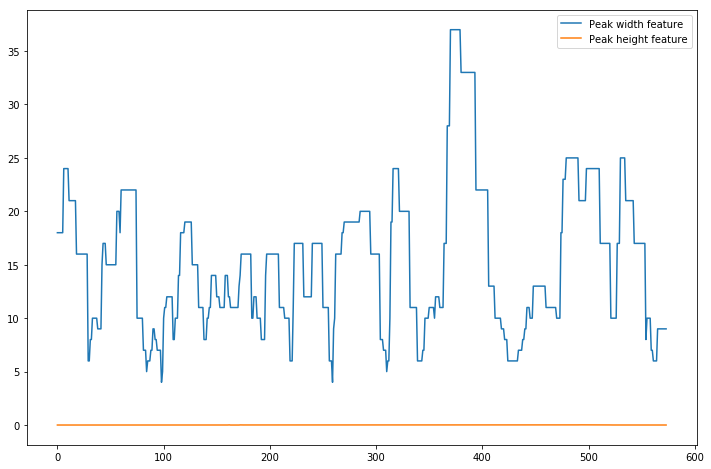


Annotations:
[0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2

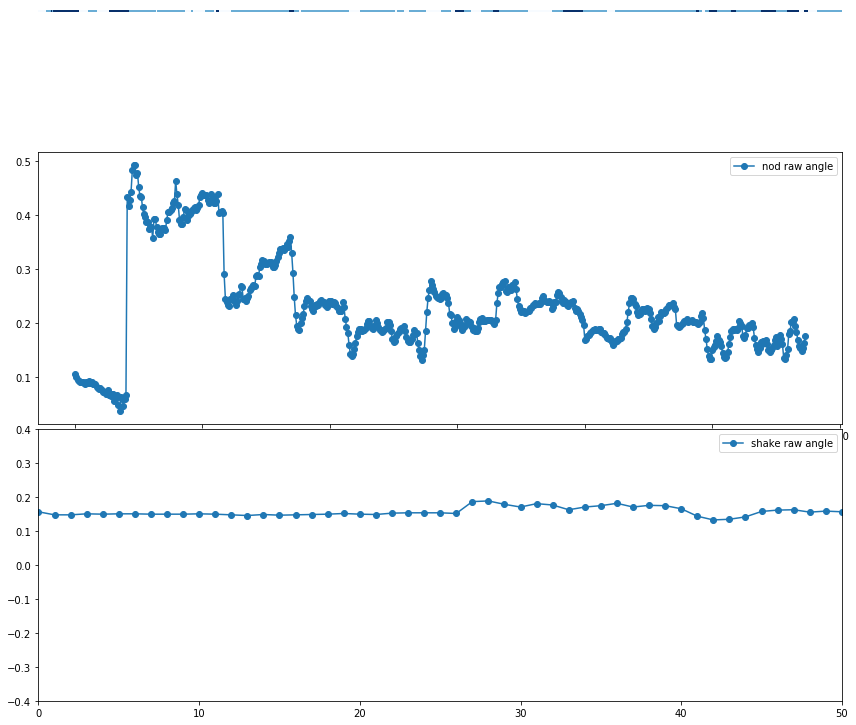

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_Guilty/717_Guilty_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.20000000e+01 4.10000000e-02]
 [1.20000000e+01 4.10000000e-02]
 [1.20000000e+01 4.10000000e-02]
 [1.20000000e+01 4.10000000e-02]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [1.10000000e+01 2.22044605e-16]
 [5.00000000e+00 2.22044605e-16]
 [8.00000000e+00 2.22044605e-16]
 [8.00000000e+00 2.22044605e-16]
 [1.10000000e+01 3.00000000e-03]
 [1.20000000e+01 7.00000000e-03]
 [1.20000000e+01 7.00000000e-03]
 [1.20000000e+01 7.00000000e-03]
 [1.20000000e+01 7.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-

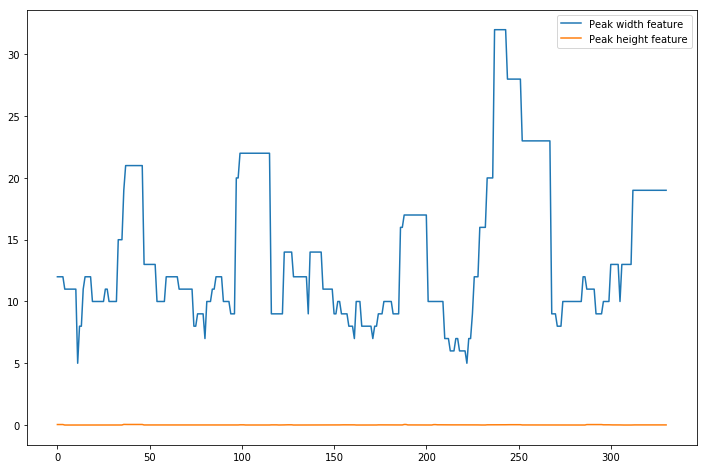

csv frame rate: 30.0
L End reached - +
R End reached - +
[[2.50000000e+01 2.10000000e-02]
 [2.50000000e+01 2.10000000e-02]
 [2.50000000e+01 2.10000000e-02]
 [2.50000000e+01 2.10000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [3.20000000e+01 4.20000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.60000000e+01 2.30000000e-02]
 [2.10000000e+01 1.00000000e-03]
 [2.10000000e+01 1.00000000e-03]
 [2.10000000e+01 1.00000000e-03]
 [2.10000000e+01 1.

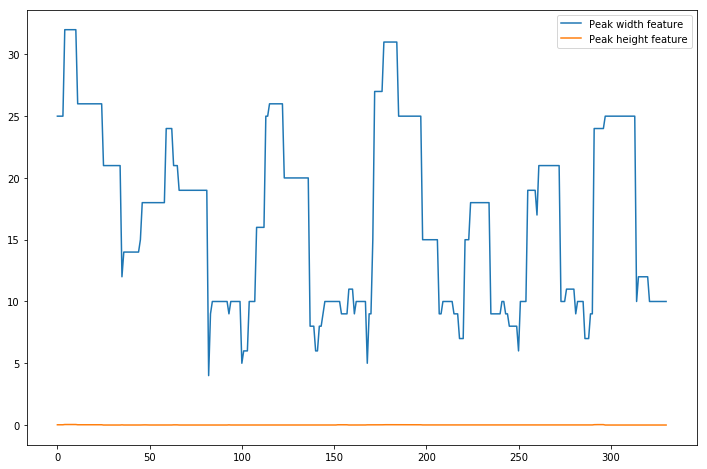


Annotations:
[1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

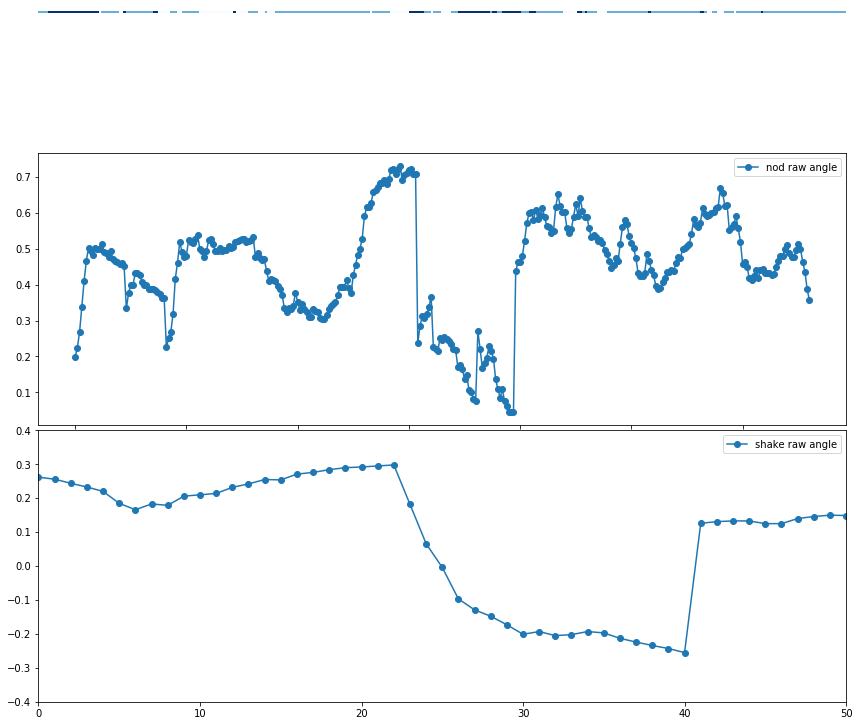

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_HardestDecision/717_HardestDecision_FACE.csv
csv frame rate: 30.00117192077816
L End reached + -
R End reached - +
[[2.30000000e+01 1.13088207e-02]
 [2.30000000e+01 1.13088207e-02]
 [2.30000000e+01 1.13088207e-02]
 [2.30000000e+01 1.13088207e-02]
 [2.30000000e+01 1.13088207e-02]
 [2.30000000e+01 1.13088207e-02]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.10000000e+01 1.50846476e-03]
 [2.30000000e+01 8.62832340e-04]
 [2.30000000e+01 8.62832340e-04]
 [2.30000000e+01 8.62832340e-04]
 [2.30000000e+01 8.62832340e-04]
 [2.40000000e+01 4.04975927e-02

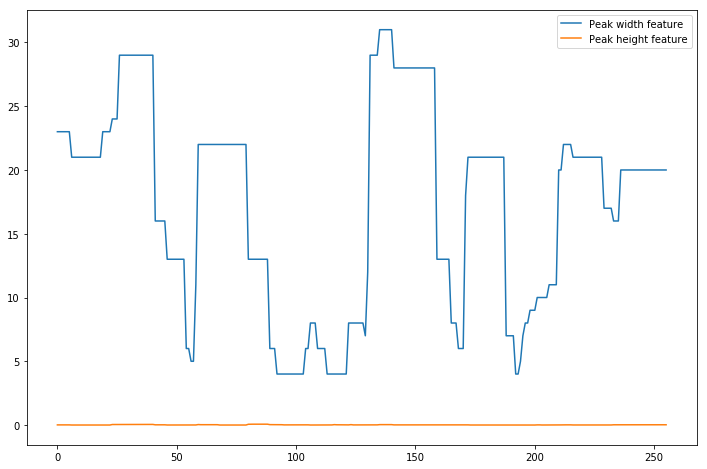

csv frame rate: 30.00117192077816
L End reached - +
R End reached - +
[[1.30000000e+01 7.78324935e-03]
 [1.30000000e+01 7.78324935e-03]
 [1.30000000e+01 7.78324935e-03]
 [1.30000000e+01 7.78324935e-03]
 [1.30000000e+01 7.78324935e-03]
 [1.40000000e+01 4.57737731e-04]
 [1.40000000e+01 4.57737731e-04]
 [1.40000000e+01 4.57737731e-04]
 [1.40000000e+01 4.57737731e-04]
 [1.40000000e+01 4.57737731e-04]
 [1.40000000e+01 4.57737731e-04]
 [1.00000000e+01 4.60216999e-03]
 [1.00000000e+01 4.60216999e-03]
 [9.00000000e+00 1.49591327e-04]
 [9.00000000e+00 1.49591327e-04]
 [9.00000000e+00 1.49591327e-04]
 [9.00000000e+00 1.49591327e-04]
 [9.00000000e+00 1.49591327e-04]
 [1.50000000e+01 4.67668470e-04]
 [1.50000000e+01 4.67668470e-04]
 [2.20000000e+01 3.90789031e-03]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10000000e+01 1.23802702e-02]
 [3.10

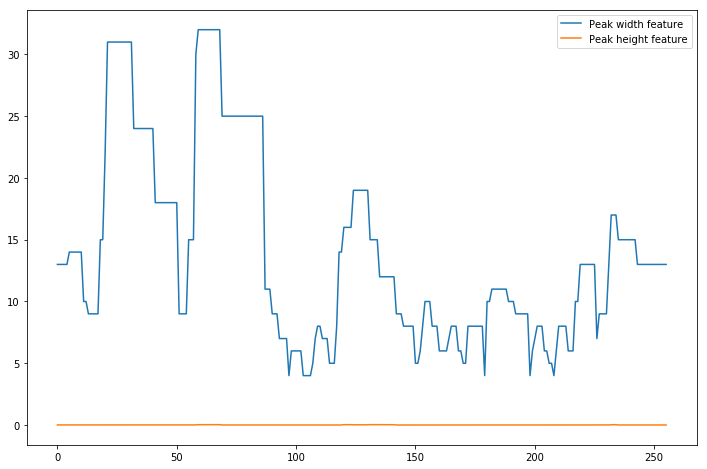


Annotations:
[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 

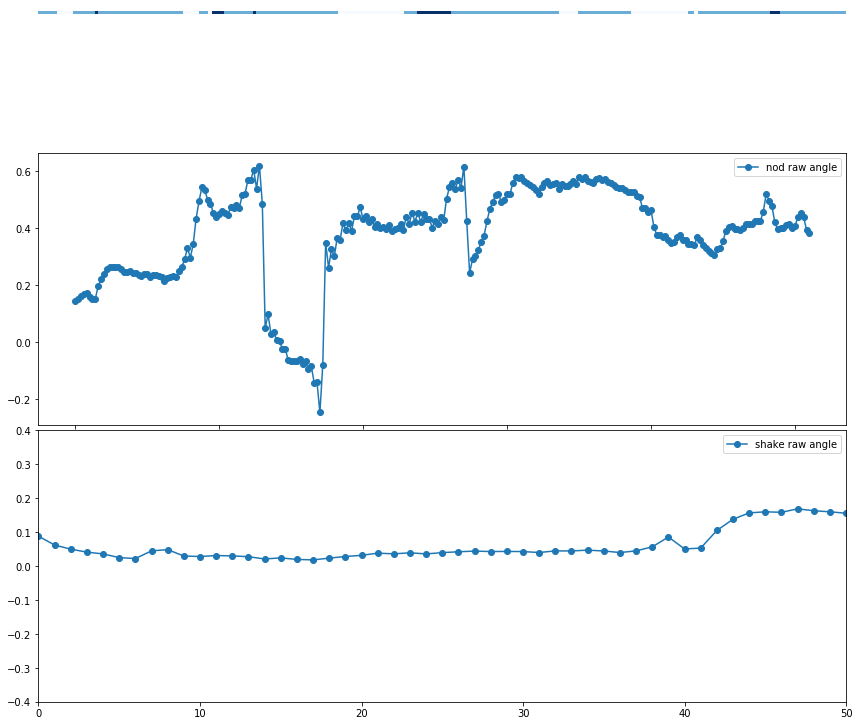

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_SituationHandledDifferent/717_SituationHandledDifferent_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached + -
[[1.1e+01 9.0e-03]
 [1.1e+01 9.0e-03]
 [1.1e+01 9.0e-03]
 ...
 [2.4e+01 2.2e-02]
 [2.4e+01 2.2e-02]
 [2.4e+01 2.2e-02]]


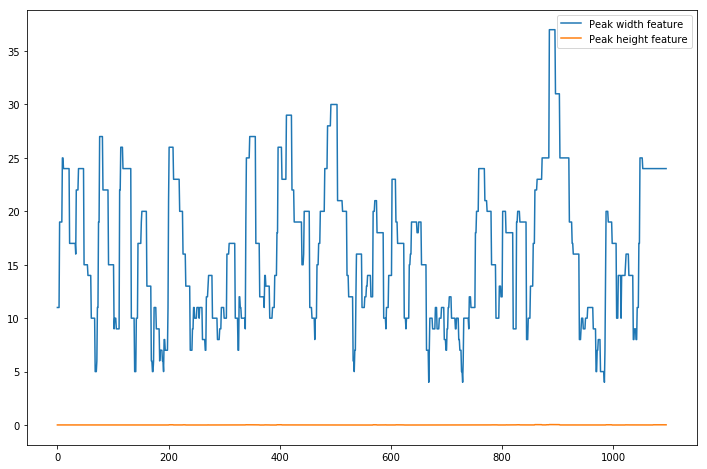

csv frame rate: 30.0
L End reached + -
R End reached + -
[[2.1e+01 6.0e-03]
 [2.1e+01 6.0e-03]
 [2.1e+01 6.0e-03]
 ...
 [2.2e+01 2.1e-02]
 [2.2e+01 2.1e-02]
 [2.2e+01 2.1e-02]]


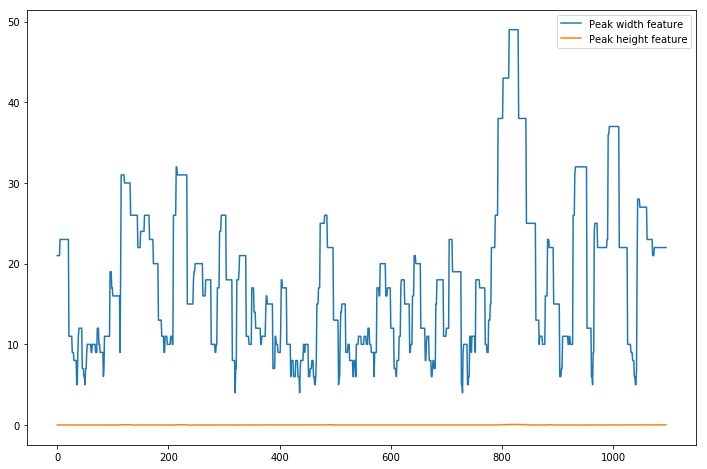


Annotations:
[1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 1

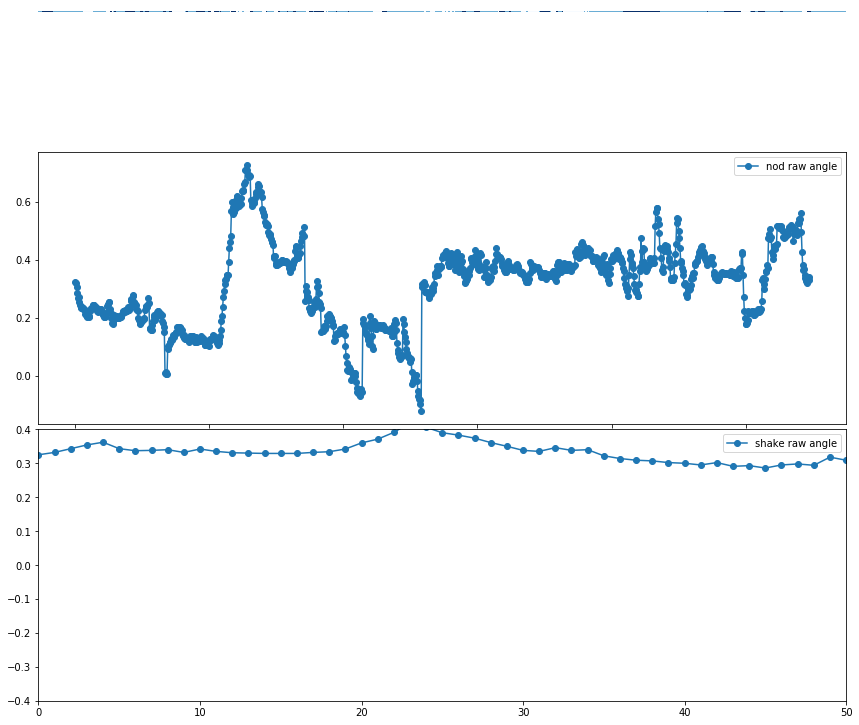

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_MostProudOf/717_MostProudOf_FACE.csv
csv frame rate: 30.00160436386973
L End reached + -
R End reached + -
[[2.70000000e+01 1.38736640e-02]
 [2.70000000e+01 1.38736640e-02]
 [2.70000000e+01 1.38736640e-02]
 [2.70000000e+01 1.38736640e-02]
 [2.70000000e+01 1.38736640e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [3.40000000e+01 1.67102097e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80000000e+01 3.11582642e-02]
 [2.80

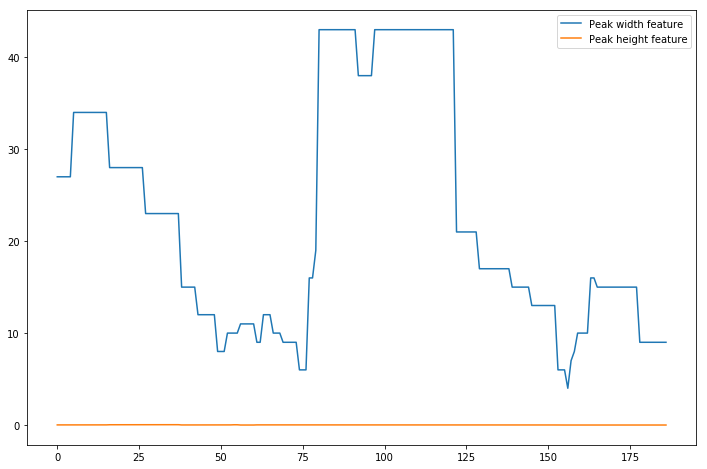

csv frame rate: 30.00160436386973
L End reached - +
R End reached - +
[[9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [9.00000000e+00 4.00449214e-03]
 [1.20000000e+01 4.00449214e-03]
 [1.20000000e+01 9.58116015e-03]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [1.20000000e+01 7.68378469e-04]
 [4.00000000e+00 7.68378469e-04]
 [7.00000000e+00 2.28576754e-03]
 [8.00000000e+00 7.96720715e-03]
 [8.00000000e+00 1.35745811e-03]
 [8.00000000e+00 1.35745811e-03]
 [8.00000000e+00 1.35745811e-03]
 [8.00000000e+00 1.35745811e-03]
 [5.00000000e+00 4.44028522e-03]
 [5.00000000e+00 4.44028522e-03]
 [1.00000000e+01 1.58592944e-03]
 [1.50

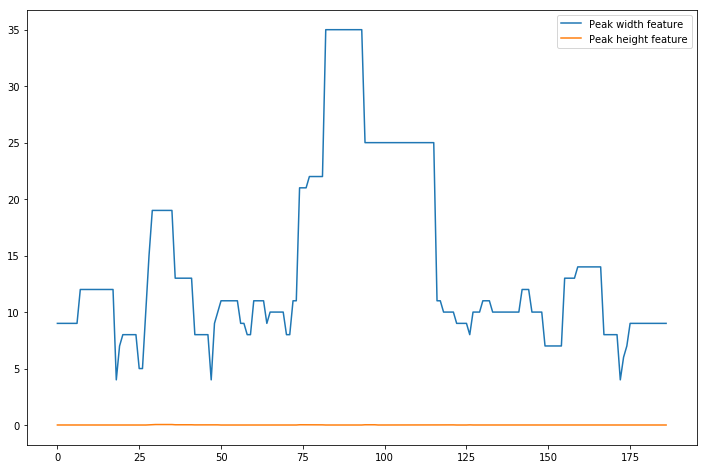


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0

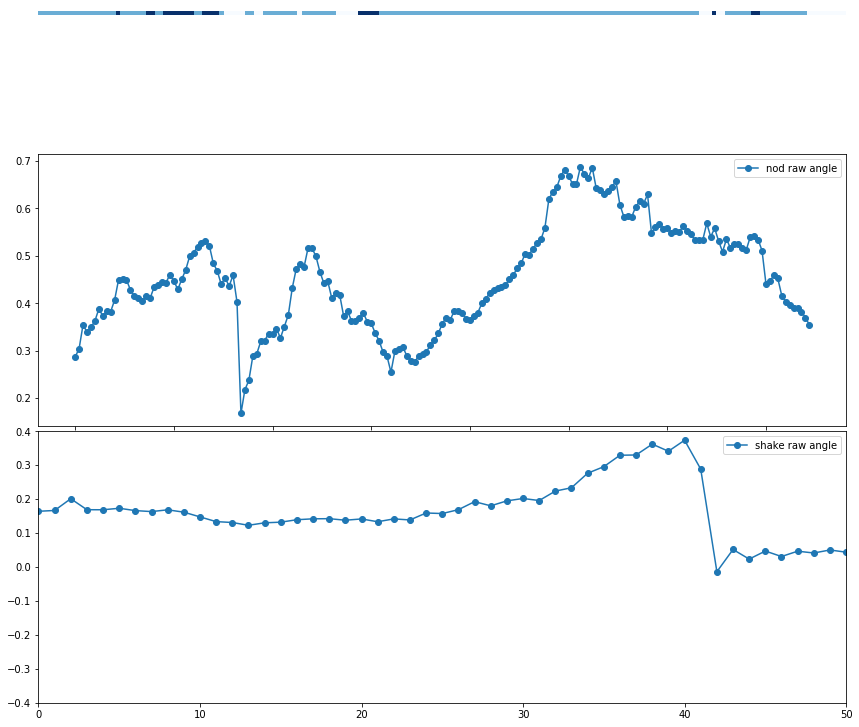

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_LastTimeHappy/717_LastTimeHappy_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached - +
[[2.20000000e+01 1.50000000e-02]
 [2.20000000e+01 1.50000000e-02]
 [2.20000000e+01 1.50000000e-02]
 [2.20000000e+01 1.50000000e-02]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [2.10000000e+01 5.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [6.00000000e+00 6.00000000e-03]
 [6.00000000e+00 6.00000000e-03]
 [6.00000000e+0

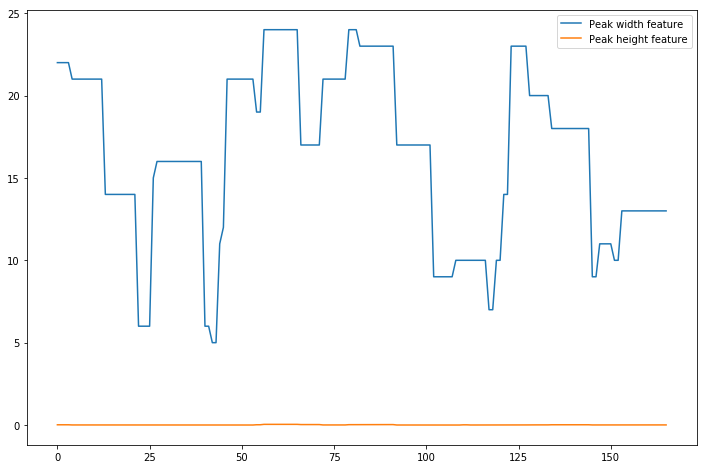

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.3e+01 1.0e-02]
 [1.3e+01 1.0e-02]
 [1.6e+01 1.3e-02]
 [1.6e+01 1.3e-02]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 [6.0e+00 4.0e-03]
 [9.0e+00 4.0e-03]
 [9.0e+00 4.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 9.0e-03]
 [1.5e+01 9.0e-03]
 [1.5e+01 9.0e-03]
 [1.5e+01 9.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [1.3e+01 4.0e-03]
 [7.0e+00 4.0e-03]
 [7.0e+00 4.0e-03]
 [7.0e+00 4.0e-03]
 [7.0e+00 4.0e-03]
 [6.0e+00 4.0e-03]
 [6.0e+00 4.0e-03]
 [6.0e+00 1.0e-03]
 [6.0e+00 1.

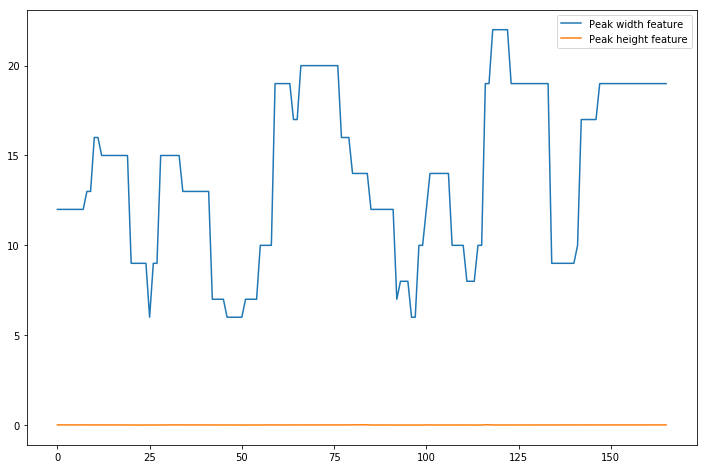


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 2, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1

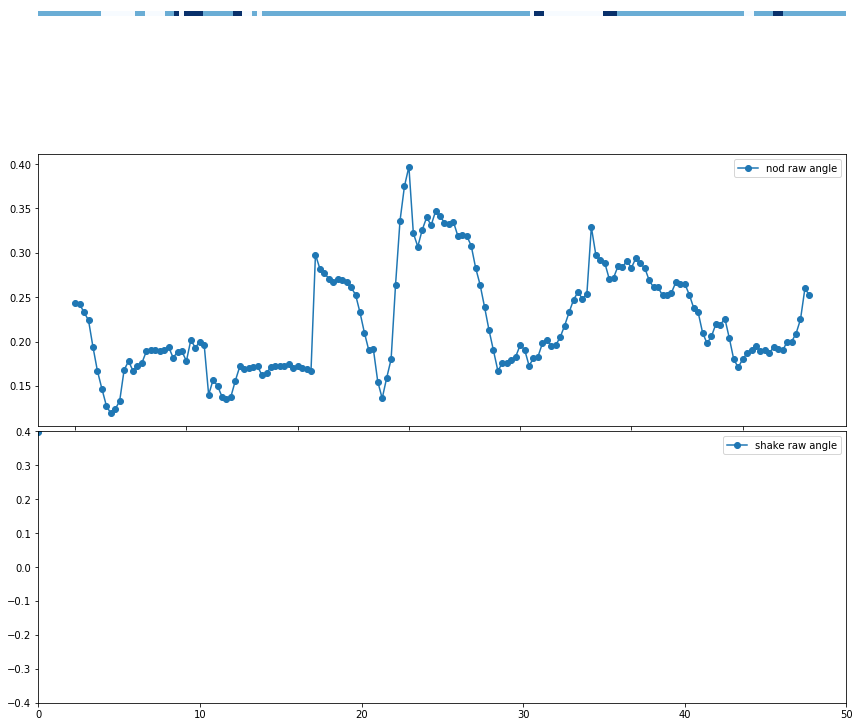

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_HowCloseToFamily/717_HowCloseToFamily_FACE.csv
csv frame rate: 30.001579030475295
L End reached + -
R End reached - +
[[1.10000000e+01 5.29780225e-03]
 [1.10000000e+01 5.29780225e-03]
 [1.10000000e+01 5.29780225e-03]
 [1.10000000e+01 5.29780225e-03]
 [1.10000000e+01 5.29780225e-03]
 [1.00000000e+01 5.29780225e-03]
 [1.00000000e+01 5.29780225e-03]
 [1.00000000e+01 5.29780225e-03]
 [8.00000000e+00 5.43183196e-03]
 [8.00000000e+00 5.43183196e-03]
 [8.00000000e+00 5.43183196e-03]
 [6.00000000e+00 4.66157666e-03]
 [6.00000000e+00 4.66157666e-03]
 [6.00000000e+00 4.66157666e-03]
 [4.00000000e+00 1.32681977e-03]
 [6.00000000e+00 1.32681977e-03]
 [1.00000000e+01 1.32681977e-03]
 [1.20000000e+01 6.48777543e-03]
 [1.20000000e+01 6.48777543e-03]
 [1.20000000e+01 6.48777543e-03]
 [1.20000000e+01 9.65619034e-03]
 [1.20000000e+01 9.65619034e-03]
 [1.20000000e+01 9.65619034e-03]
 [1.20000000e+01 9.65619034e

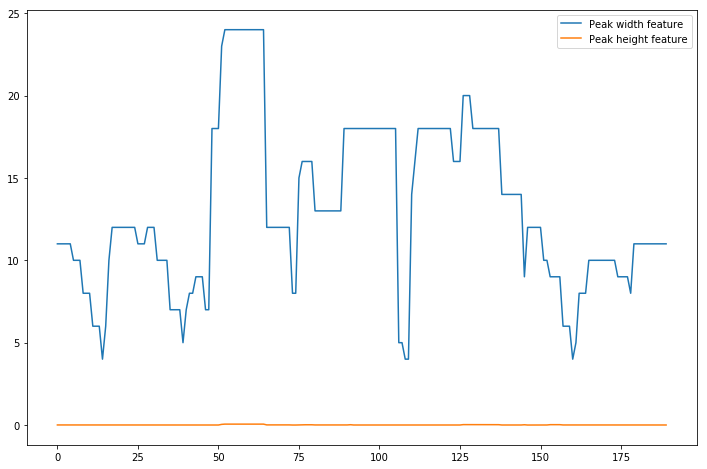

csv frame rate: 30.001579030475295
L End reached + -
R End reached + -
[[1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.70000000e+01 1.69348621e-02]
 [1.00000000e+01 4.28276430e-03]
 [1.00000000e+01 4.28276430e-03]
 [1.00000000e+01 4.28276430e-03]
 [1.00000000e+01 4.28276430e-03]
 [1.00000000e+01 4.28276430e-03]
 [1.00000000e+01 4.28276430e-03]
 [6.00000000e+00 4.28276430e-03]
 [6.00000000e+00 4.28276430e-03]
 [5.00000000e+00 4.28276430e-03]
 [8.00000000e+00 4.28276430e-03]
 [8.00000000e+00 4.28276430e-03]
 [9.00000000e+00 1.29816803e-02]
 [1.00000000e+01 4.20228683e-03]
 [1.00000000e+01 4.20228683e-03]
 [1.00000000e+01 4.20228683e-03]
 [1.00000000e+01 4.20228683e-03]
 [8.00000000e+00 5.41623292e-03]
 [8.00000000e+00 5.41623292e-03]
 [8.00000000e+00 5.41623292e-03]
 [6.0

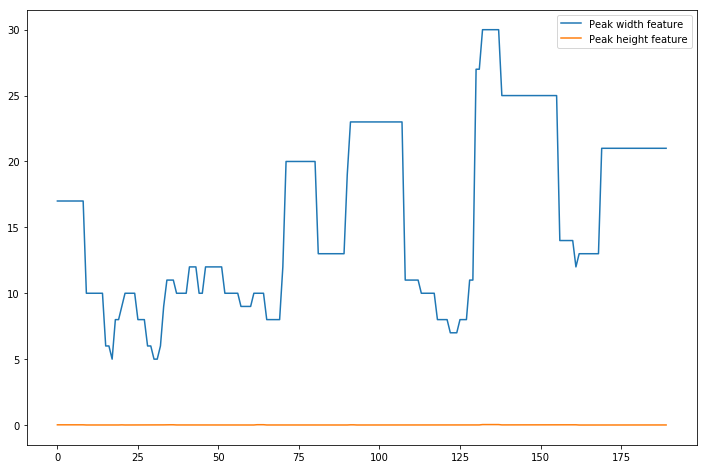


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]),

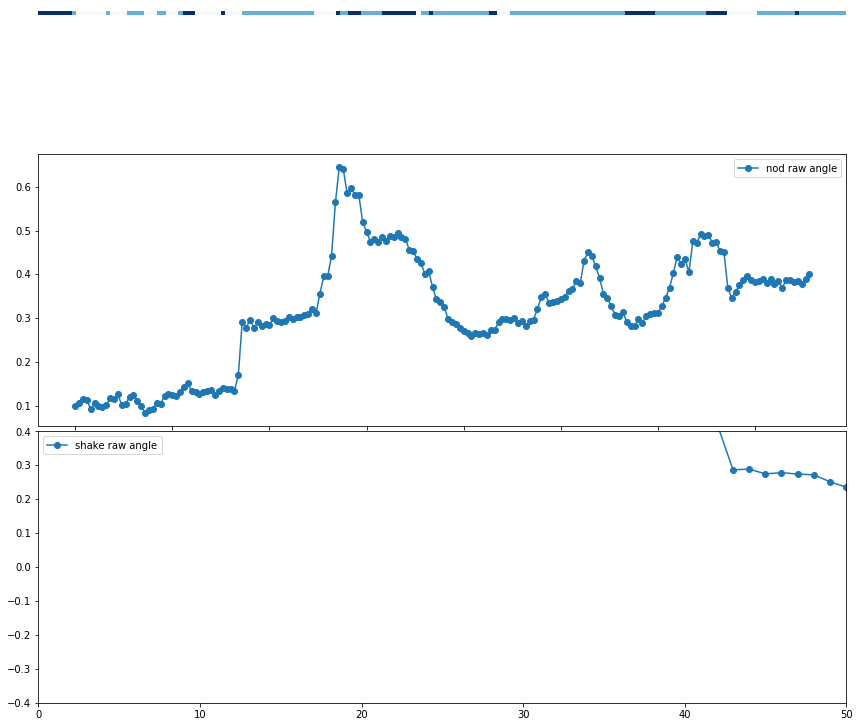

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_EventToErase/717_EventToErase_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 [1.2e+01 1.0e-02]
 ...
 [1.0e+01 2.0e-03]
 [1.0e+01 2.0e-03]
 [1.0e+01 2.0e-03]]


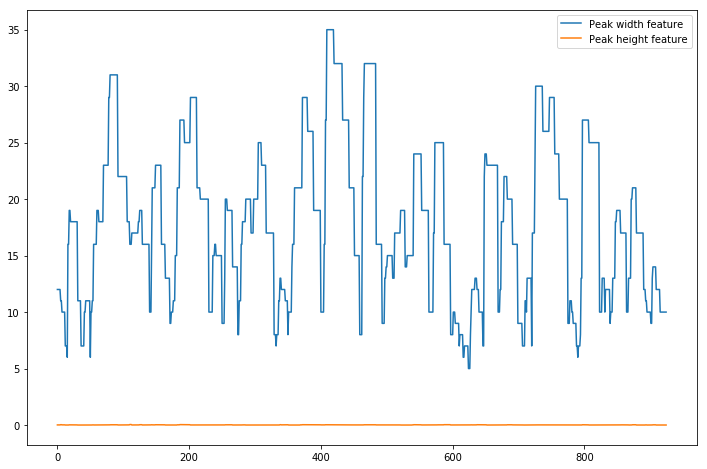

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.9e+01 3.4e-02]
 [1.9e+01 3.4e-02]
 [1.9e+01 3.4e-02]
 ...
 [1.4e+01 1.0e-03]
 [1.4e+01 1.0e-03]
 [1.4e+01 1.0e-03]]


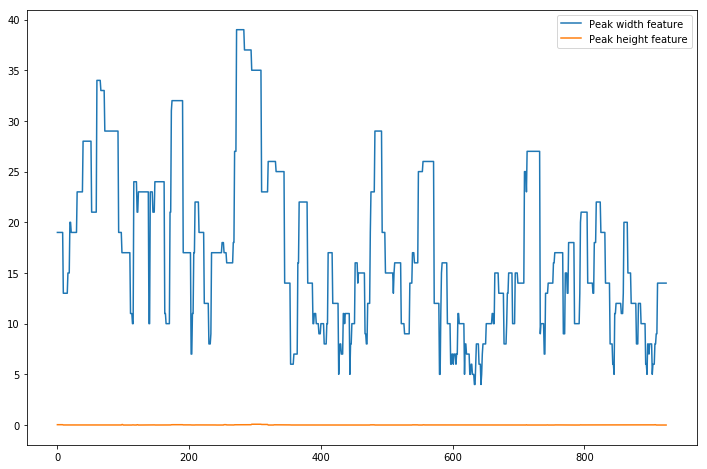


Annotations:
[2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 0, 0, 0, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1

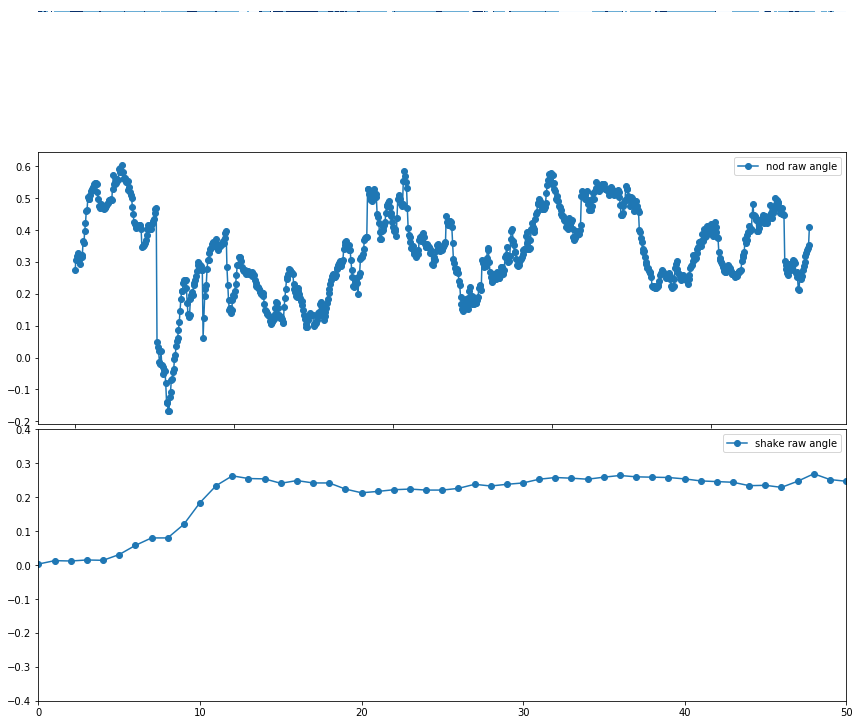

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/717/717_LastArgument/717_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.e+01 8.e-03]
 [1.e+01 8.e-03]
 [1.e+01 8.e-03]
 ...
 [8.e+00 1.e-03]
 [8.e+00 1.e-03]
 [8.e+00 1.e-03]]


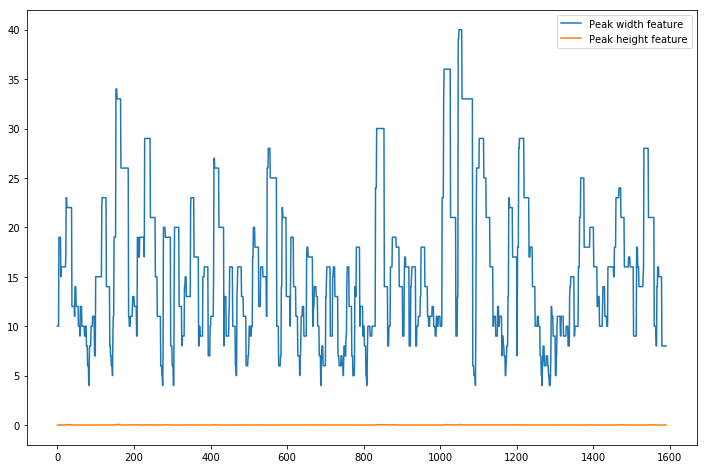

csv frame rate: 30.0
L End reached - +
R End reached + -
[[9.0e+00 9.0e-03]
 [9.0e+00 9.0e-03]
 [9.0e+00 9.0e-03]
 ...
 [2.2e+01 1.6e-02]
 [2.2e+01 1.6e-02]
 [2.2e+01 1.6e-02]]


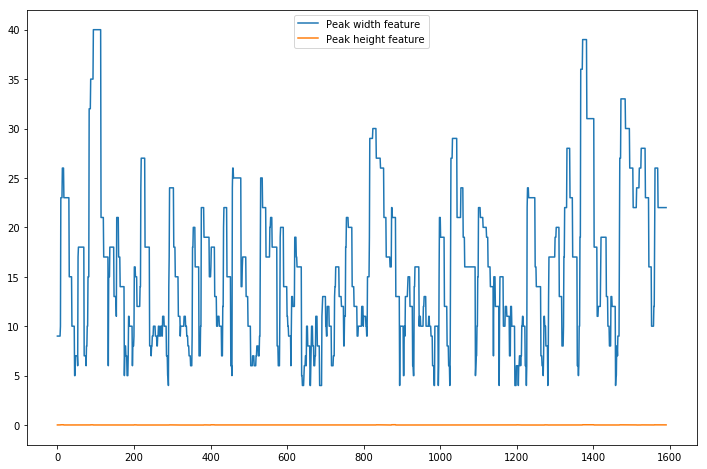


Annotations:
[0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0

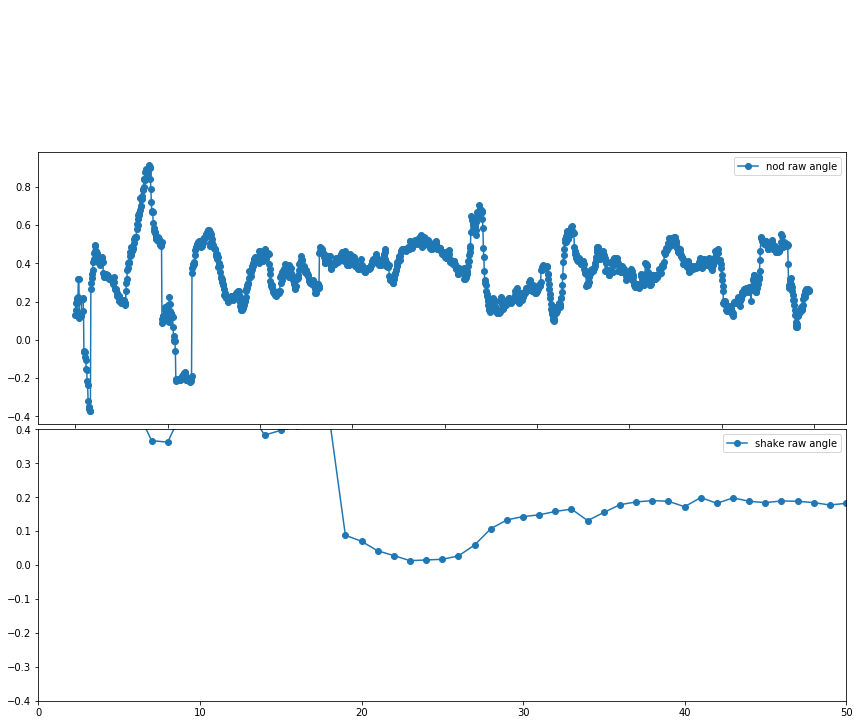

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_HardestDecision/695_HardestDecision_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.60000000e+01 3.20000000e-02]
 [1.60000000e+01 3.20000000e-02]
 [1.60000000e+01 3.20000000e-02]
 [1.60000000e+01 3.20000000e-02]
 [1.60000000e+01 3.20000000e-02]
 [1.60000000e+01 3.20000000e-02]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [1.20000000e+01 5.00000000e-03]
 [5.00000000e+00 3.00000000e-03]
 [5.00000000e+00 3.00000000e-03]
 [6.00000000e+00 4.00000000e-03]
 [7.00000000e+00 4.00000000e-03]
 [1.50000000e+01 4.00000000e-03]
 [1.50000000e+01 4.00000000e-03]
 [1.50000000e+01 4.00000000e-03]
 [2.10000000e+01 1.80000000e-02]
 [2.10000000e+01 1.80000000e-02]
 [2.90000000e+01 3.70000000e-02]
 [2.9000000

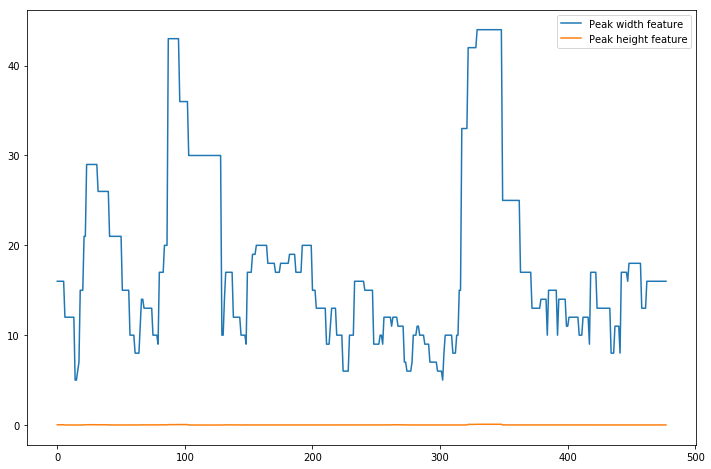

csv frame rate: 30.0
L End reached - +
R End reached + -
[[1.40000000e+01 1.10000000e-02]
 [1.40000000e+01 1.10000000e-02]
 [1.40000000e+01 1.10000000e-02]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [9.00000000e+00 3.00000000e-03]
 [9.00000000e+00 3.00000000e-03]
 [9.00000000e+00 3.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [7.00000000e+00 3.00000000e-03]
 [7.00000000e+00 2.77555756e-17]
 [7.00000000e+00 2.77555756e-17]
 [7.00000000e+00 2.77555756e-17]
 [7.00000000e+00 2.77555756e-17]
 [1.10000000e+01 2.00000000e-03]
 [2.10000000e+01 1.30000000e-02]
 [2.20000000e+01 1.30000000e-02]
 [2.20000000e+01 1.30000000e-02]
 [2.20000000e+01 1.30000000e-02]
 [2.20000000e+01 1.

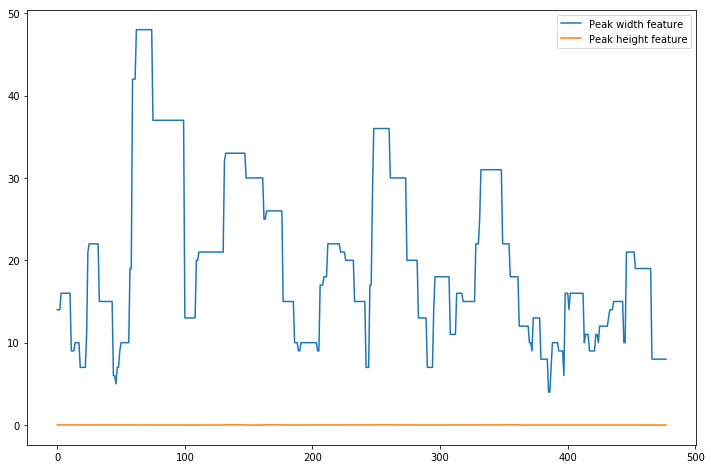


Annotations:
[1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 0, 0, 0, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

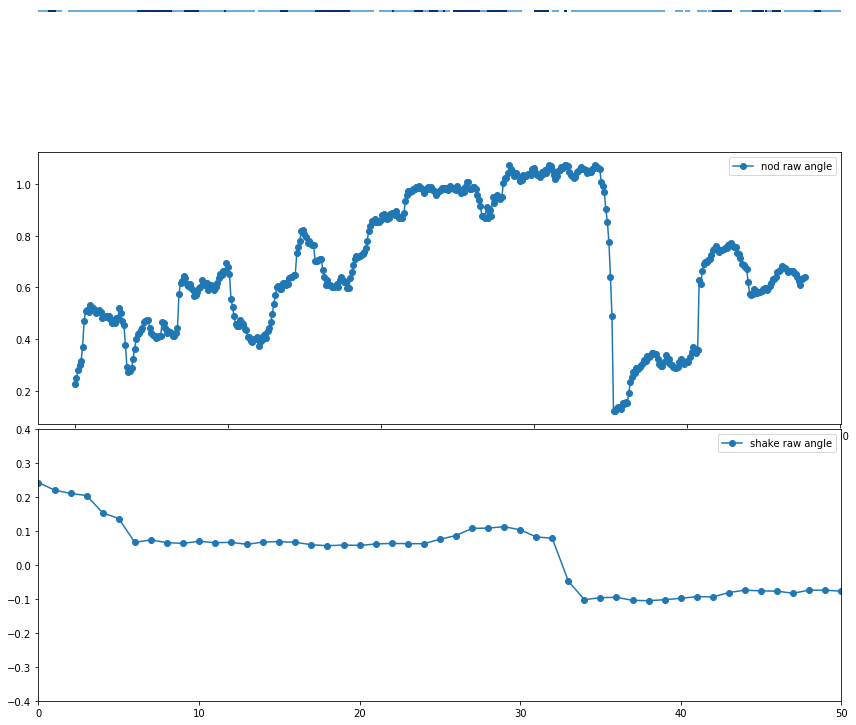

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_Guilty/695_Guilty_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 9.75234493e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.90000000e+01 3.77176473e-03]
 [1.50000000e+01 3.31015808e-02]
 [1.50000000e+01 3.31015808e-02]
 [1.50000000e+01 1.31988163e-02]
 [1.50000000e+01 1.31988163e-02]
 [1.50000000e+01 1.31988163e-02]
 [1.50000000e+01 1.31988163e-02]
 [1.50000000e+01 1.31988163e-02]
 [1.50000000e+0

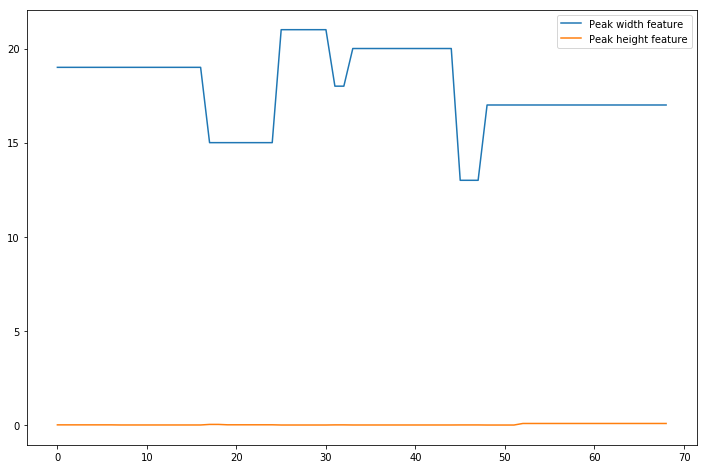

csv frame rate: 30.000000000000004
L End reached - +
R End reached + -
[[1.10000000e+01 2.42989198e-03]
 [1.10000000e+01 2.42989198e-03]
 [1.10000000e+01 2.42989198e-03]
 [1.10000000e+01 4.70837274e-04]
 [1.10000000e+01 4.70837274e-04]
 [1.10000000e+01 4.70837274e-04]
 [1.10000000e+01 4.70837274e-04]
 [1.10000000e+01 4.70837274e-04]
 [1.90000000e+01 4.70837274e-04]
 [1.90000000e+01 4.70837274e-04]
 [1.90000000e+01 4.70837274e-04]
 [2.40000000e+01 7.68534058e-03]
 [2.40000000e+01 7.68534058e-03]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.90000000e+01 1.31258680e-02]
 [2.80000000e+01 6.23262677e-03]
 [2.80000000e+01 6.23262677e-03]
 [2.8

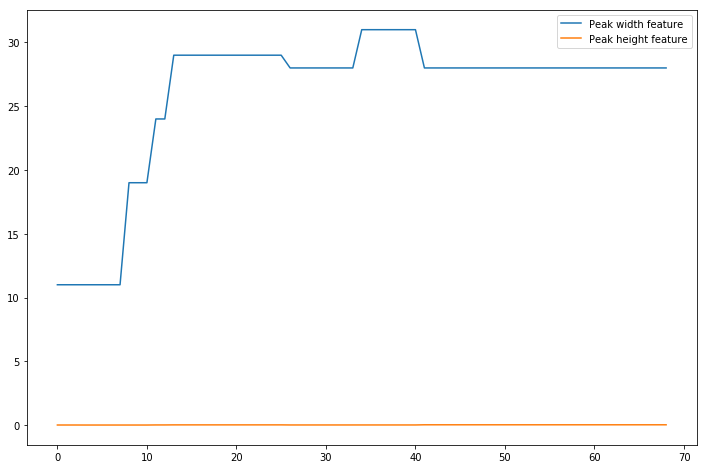


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array

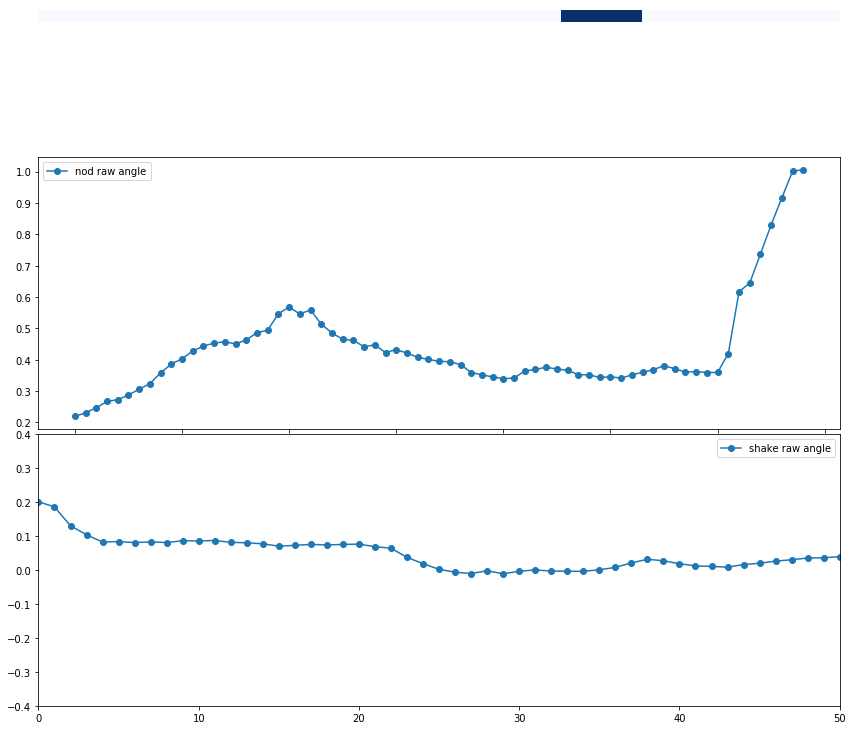

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_LastTimeHappy/695_LastTimeHappy_FACE.csv
csv frame rate: 29.998846198223145
L End reached + -
R End reached - +
[[2.50000000e+01 3.10000000e-02]
 [2.50000000e+01 3.10000000e-02]
 [2.50000000e+01 3.10000000e-02]
 [2.50000000e+01 3.10000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [2.30000000e+01 1.20000000e-02]
 [1.70000000e+01 5.55111512e-17]
 [1.70000000e+01 5.55111512e-17]
 [1.70000000e+01 5.55111512e-17]
 [1.70000000e+01 5.55111512e-17]
 

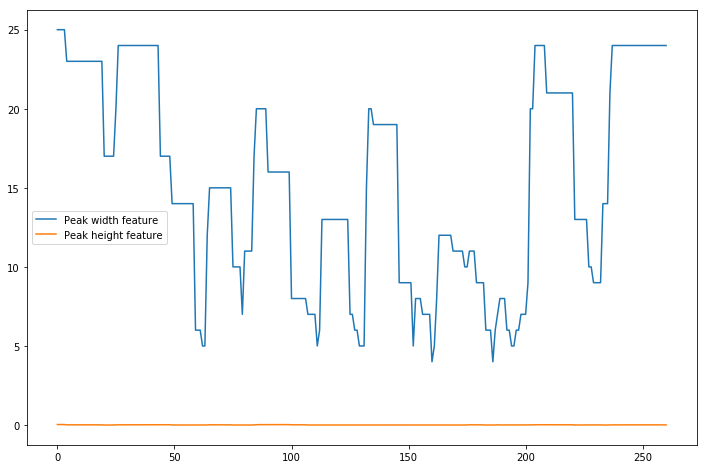

csv frame rate: 29.998846198223145
L End reached - +
R End reached + -
[[3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.10000000e+01 1.60000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.90000000e+01 1.40000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.60000000e+01 1.90000000e-02]
 [3.6

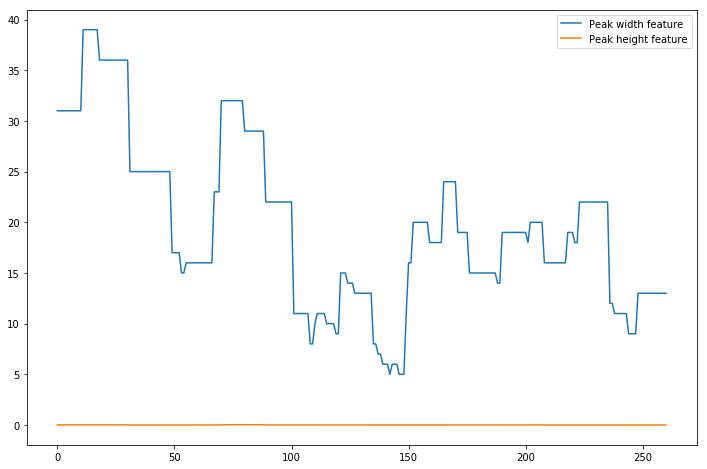


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

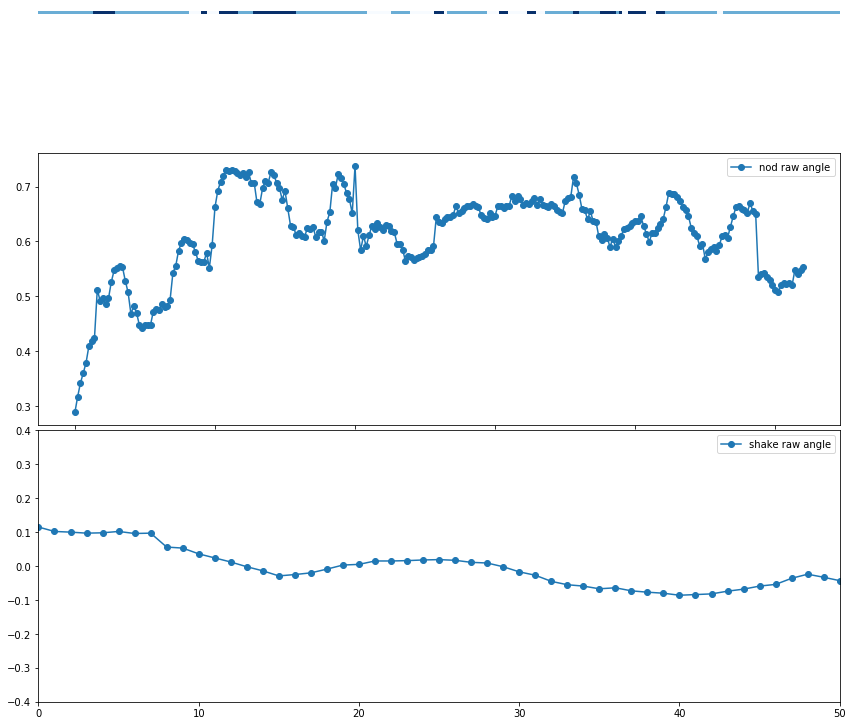

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_EventToErase/695_EventToErase_FACE.csv
csv frame rate: 30.00120004800192
L End reached + -
R End reached - +
[[1.20000000e+01 1.26389927e-02]
 [1.20000000e+01 1.26389927e-02]
 [1.20000000e+01 1.26389927e-02]
 [1.20000000e+01 1.26389927e-02]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.10000000e+01 2.56536889e-03]
 [1.00000000e+01 6.11847334e-03]
 [1.70000000e+01 1.06672687e-02]
 [1.70000000e+01 1.06672687e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.90000000e+01 1.38123339e-02]
 [1.40000000e+01 8.13496356e-03]
 [1.40000000e+01 8.13496356e-03]
 [1.40000000e+01 8.13496356e-03]
 [1.40000000e+01 8.13496356e-03]
 [1.

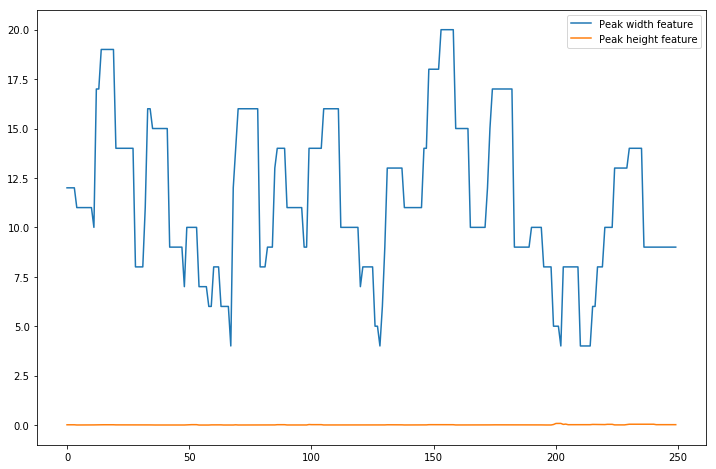

csv frame rate: 30.00120004800192
L End reached - +
R End reached - +
[[2.10000000e+01 7.55329732e-03]
 [2.10000000e+01 7.55329732e-03]
 [2.10000000e+01 7.55329732e-03]
 [2.10000000e+01 7.55329732e-03]
 [2.10000000e+01 7.55329732e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.90000000e+01 6.70112504e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [1.40000000e+01 3.71458330e-03]
 [9.00000000e+00 7.81251490e-04]
 [9.00000000e+00 7.81251490e-04]
 [1.30000000e+01 6.12645004e-04]
 [1.30000000e+01 6.12645004e-04]
 [1.30000000e+01 6.12645004e-04]
 [1.80000000e+01 1.10150507e-02]
 [1.80000000e+01 1.10150507e-02]
 [1.80

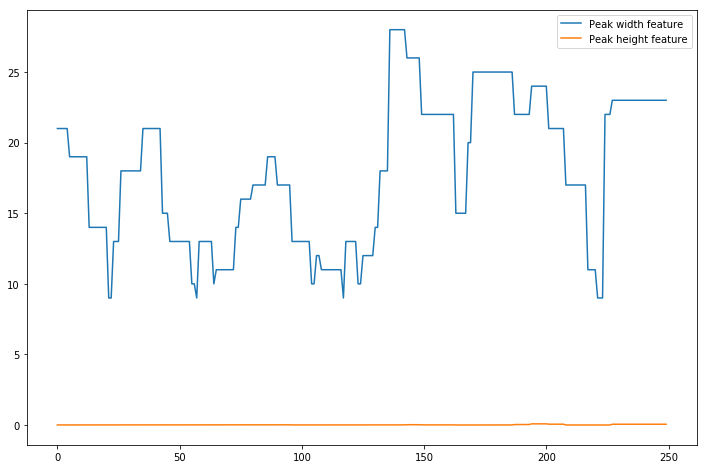


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 0, 0, 0, 2, 2, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0

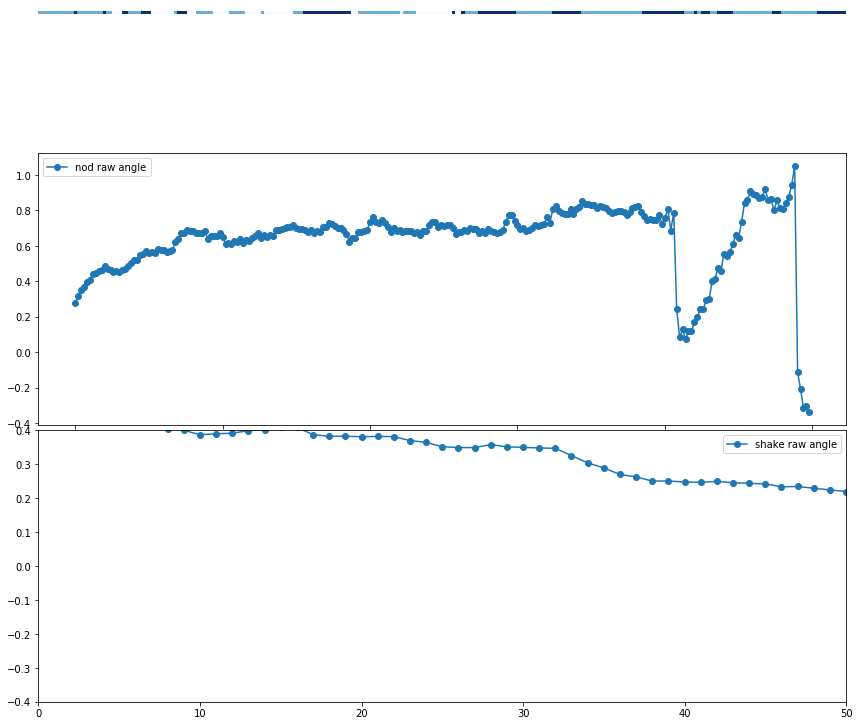

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_SituationHandledDifferent/695_SituationHandledDifferent_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.5e+01 1.8e-02]
 [1.5e+01 1.8e-02]
 [1.5e+01 1.8e-02]
 ...
 [1.6e+01 2.0e-03]
 [1.6e+01 2.0e-03]
 [1.6e+01 2.0e-03]]


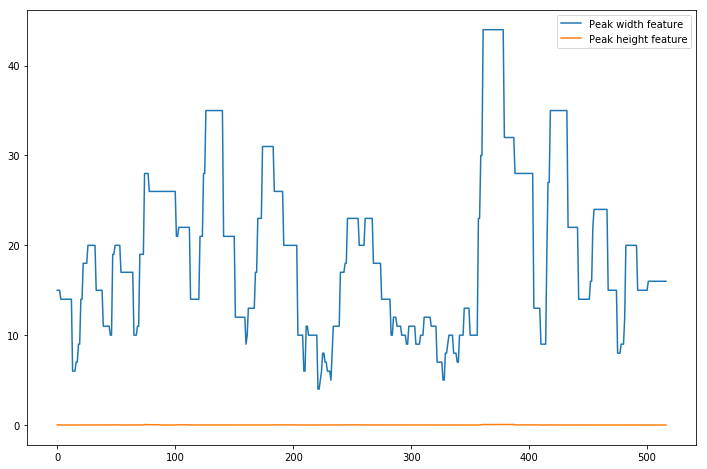

csv frame rate: 30.0
L End reached + -
R End reached - +
[[2.4e+01 6.0e-03]
 [2.4e+01 6.0e-03]
 [2.4e+01 6.0e-03]
 ...
 [1.1e+01 2.0e-03]
 [1.1e+01 2.0e-03]
 [1.1e+01 2.0e-03]]


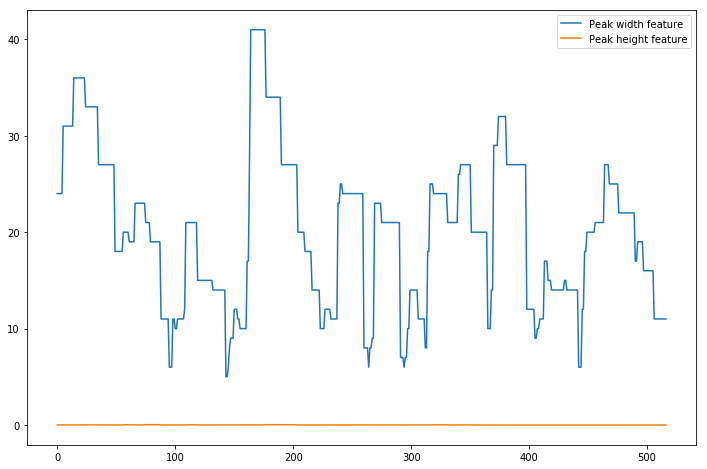


Annotations:
[1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

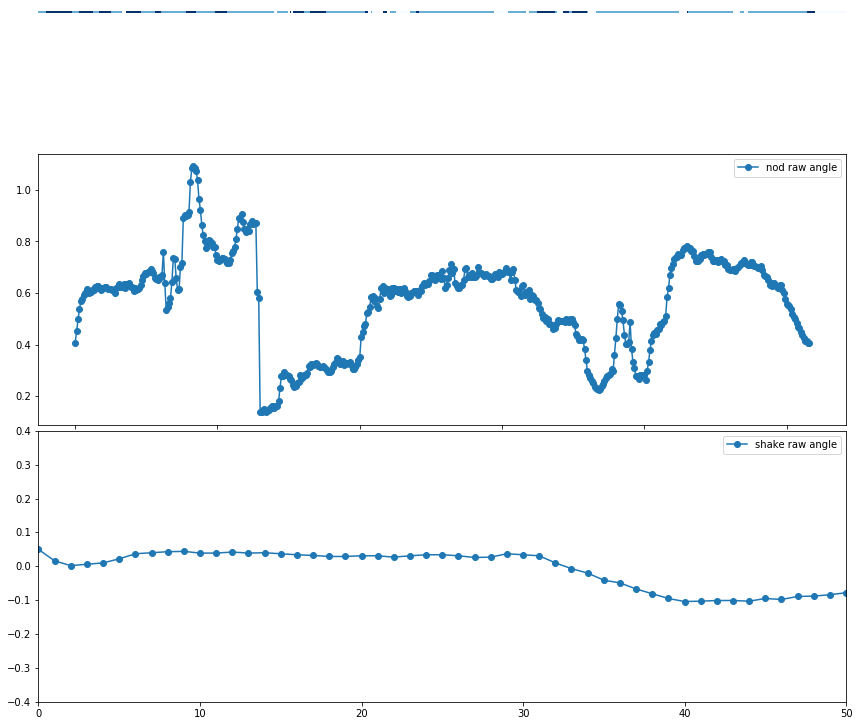

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_LastArgument/695_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.5e+01 1.2e-02]
 [1.5e+01 1.2e-02]
 [1.5e+01 1.2e-02]
 ...
 [2.5e+01 1.0e-03]
 [2.5e+01 1.0e-03]
 [2.5e+01 1.0e-03]]


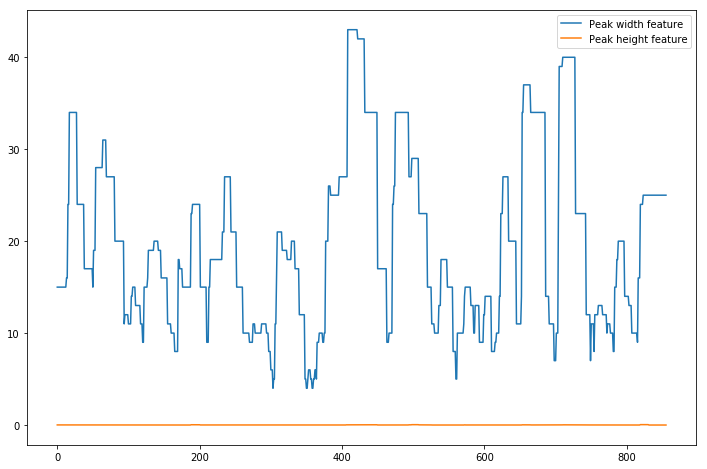

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.40000000e+01 3.00000000e-03]
 [1.40000000e+01 3.00000000e-03]
 [1.40000000e+01 3.00000000e-03]
 ...
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]]


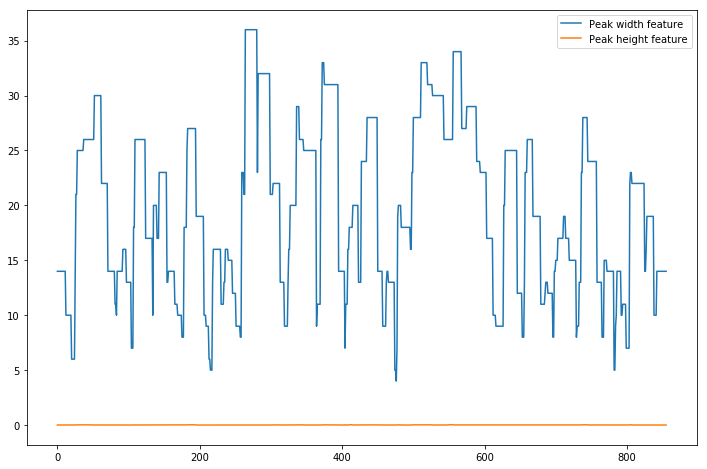


Annotations:
[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

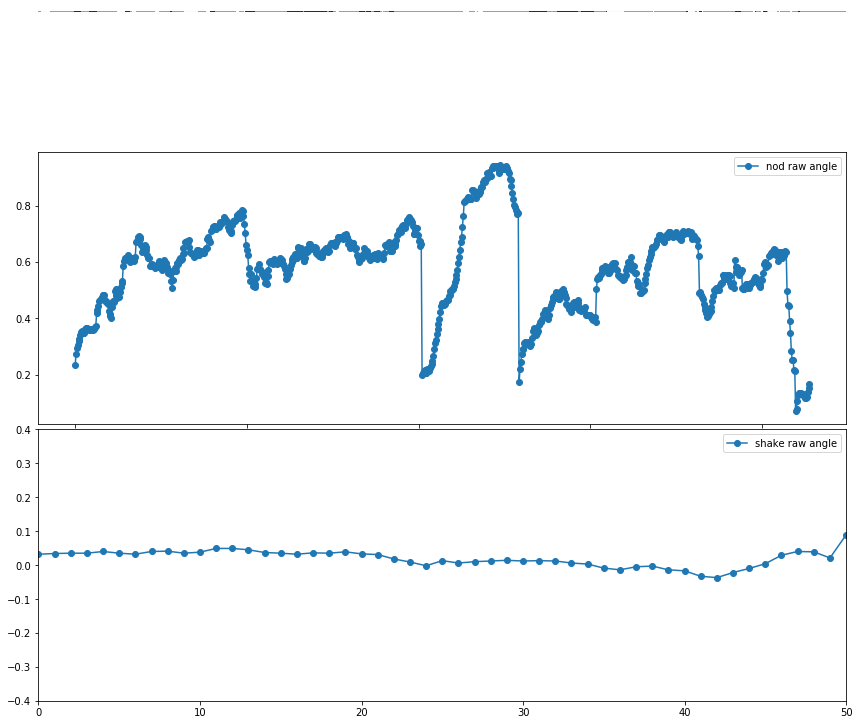

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_HowCloseToFamily/695_HowCloseToFamily_FACE.csv
csv frame rate: 30.0
[[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]


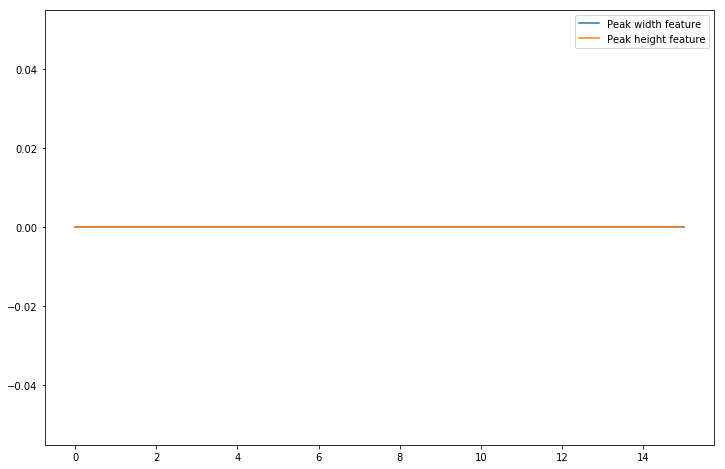

csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]
 [1.5e+01 5.0e-03]]


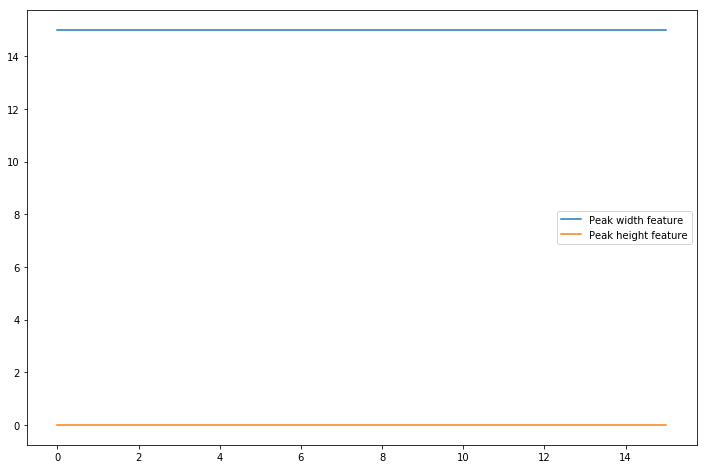


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.])]


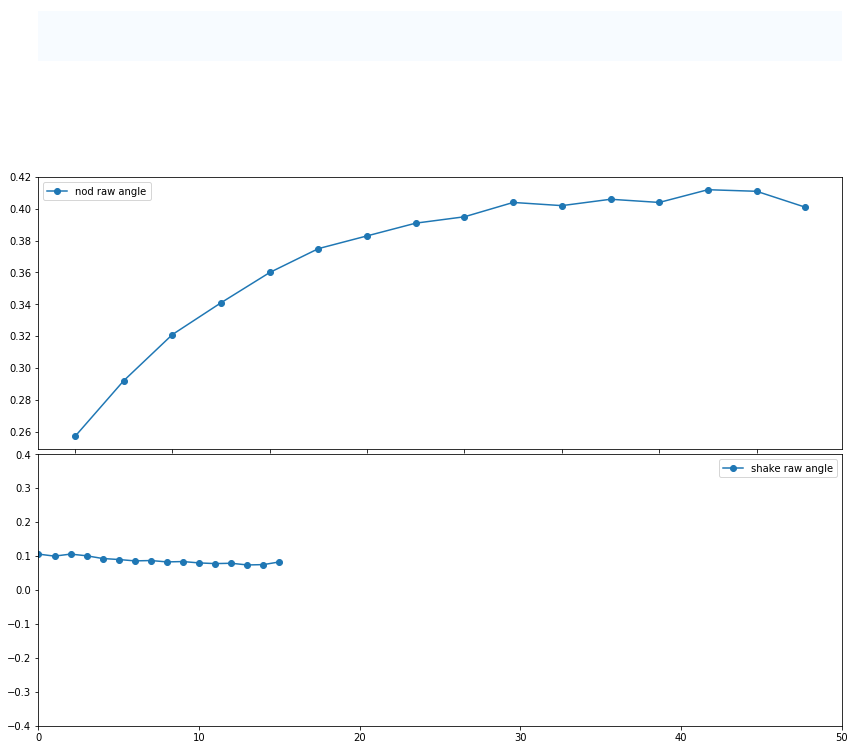

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/695/695_MostProudOf/695_MostProudOf_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[4.40000000e+01 4.90000000e-02]
 [4.40000000e+01 4.90000000e-02]
 [4.40000000e+01 4.90000000e-02]
 [4.40000000e+01 4.90000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.20000000e-02]
 [4.40000000e+01 4.

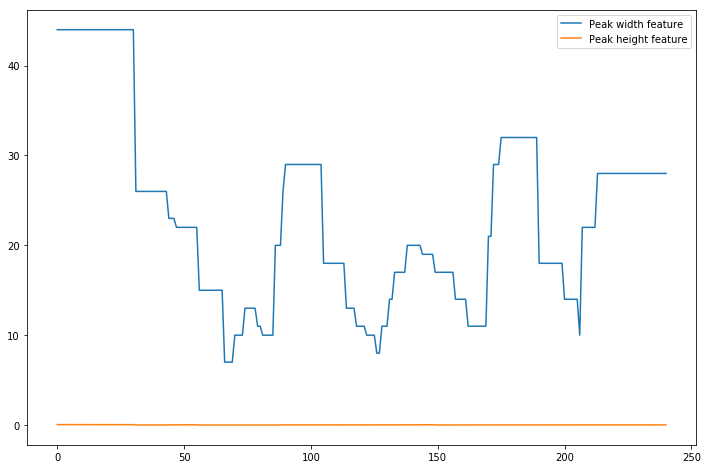

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.50000000e+01 1.11022302e-16]
 [1.70000000e+01 7.00000000e-03]
 [1.70000000e+01 7.00000000e-03]
 [1.70000000e+01 7.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.00000000e-03]
 [2.90000000e+01 9.

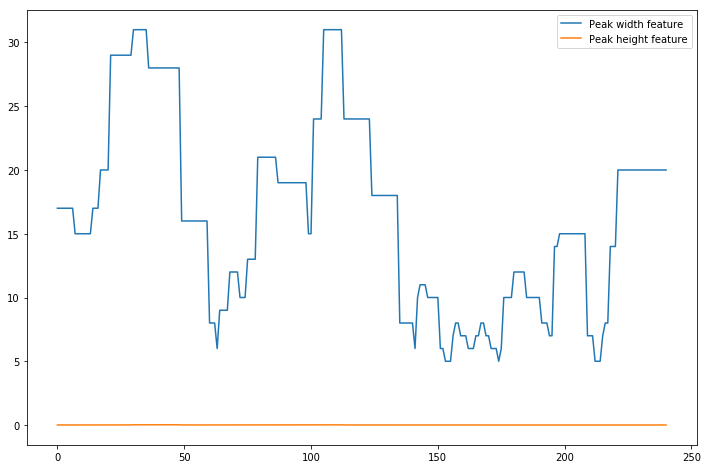


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1.,

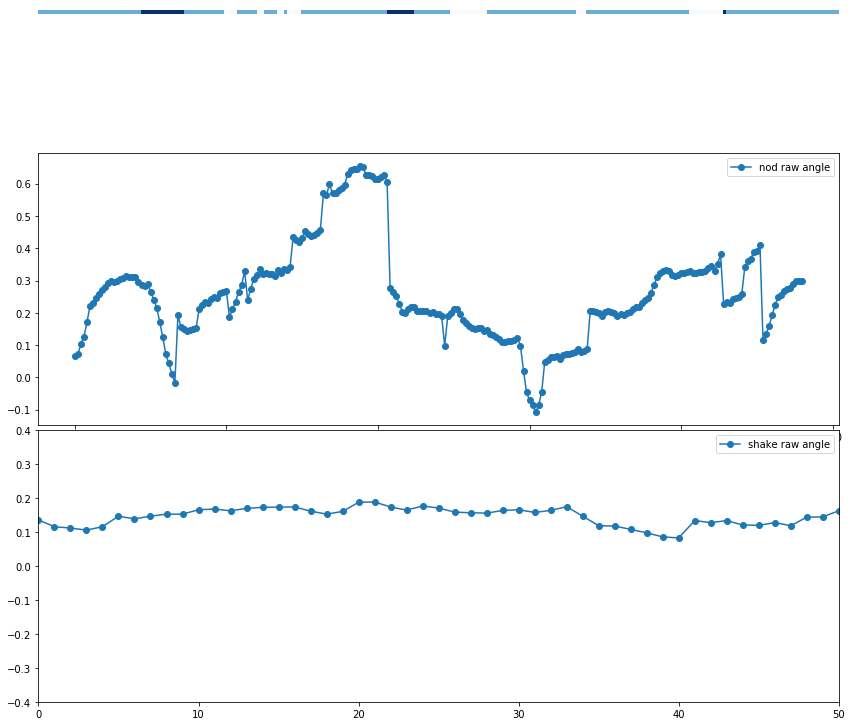

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_HardestDecision/708_HardestDecision_FACE.csv
csv frame rate: 29.99953416872409
L End reached + -
R End reached + -
[[1.8e+01 8.0e-03]
 [1.8e+01 8.0e-03]
 [1.8e+01 8.0e-03]
 ...
 [2.4e+01 1.1e-02]
 [2.4e+01 1.1e-02]
 [2.4e+01 1.1e-02]]


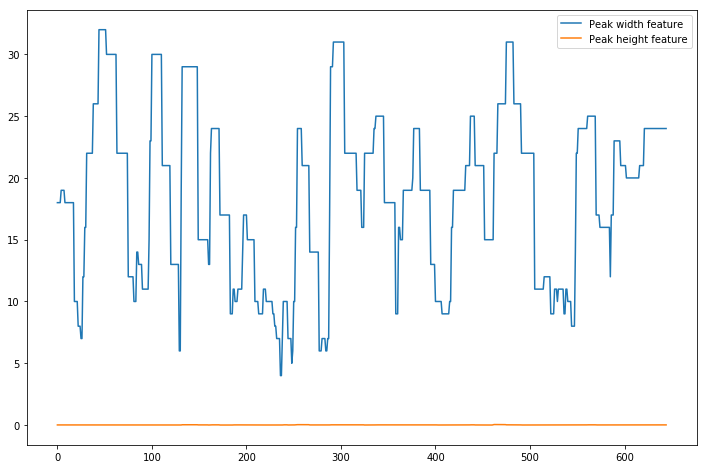

csv frame rate: 29.99953416872409
L End reached - +
R End reached - +
[[2.1e+01 1.1e-02]
 [2.1e+01 1.1e-02]
 [2.1e+01 1.1e-02]
 ...
 [1.5e+01 3.0e-03]
 [1.5e+01 3.0e-03]
 [1.5e+01 3.0e-03]]


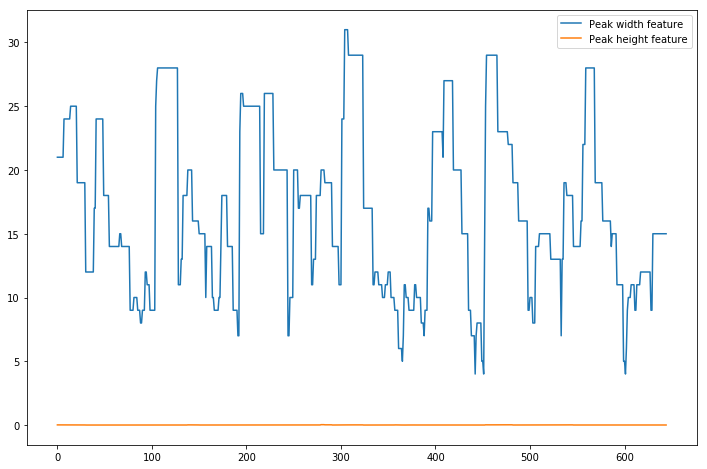


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

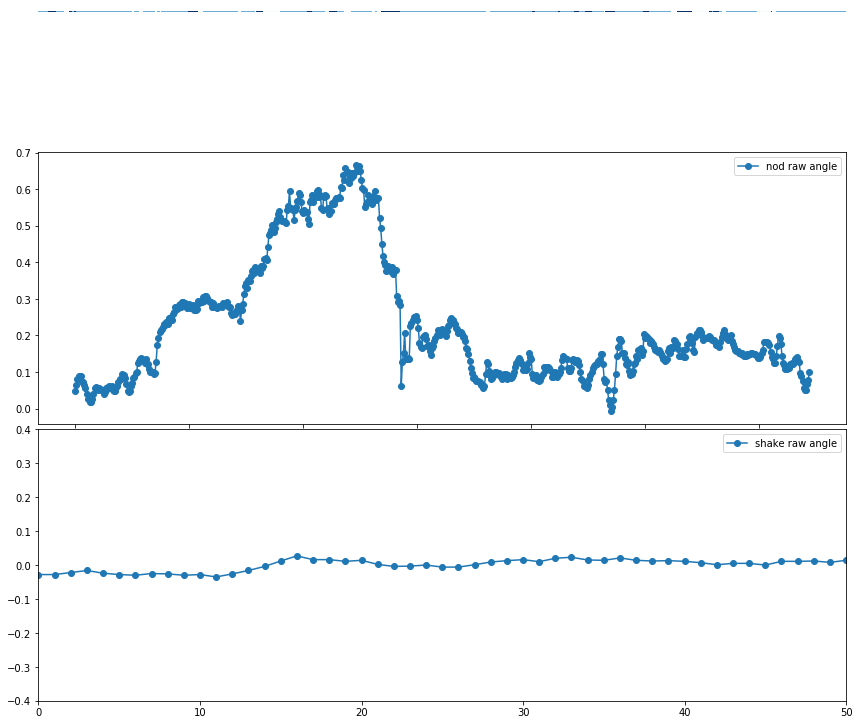

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_Guilty/708_Guilty_FACE.csv
csv frame rate: 29.999999999999996
L End reached - +
R End reached - +
[[2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.7e+01 7.0e-03]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [2.3e+01 1.6e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.7e+01 2.1e-02]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [9.0e+00 1.6e-02]
 [9.0e+00 1.6e-02]
 [9.0e+00 1.6e-02]
 [9.0e+00 1.6e-02]
 [9.0e+00 1.6e-02]
 [1.0e+01 6.0e-03]
 [1.0e+01 6.0e-03]
 [1.0e+01

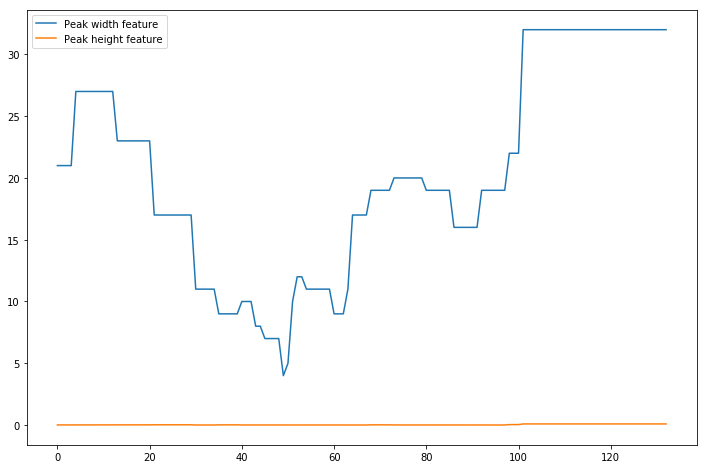

csv frame rate: 29.999999999999996
L End reached - +
R End reached - +
[[2.30000000e+01 6.00000000e-03]
 [2.30000000e+01 6.00000000e-03]
 [2.30000000e+01 6.00000000e-03]
 [2.30000000e+01 6.00000000e-03]
 [2.30000000e+01 6.00000000e-03]
 [2.30000000e+01 6.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [2.10000000e+01 7.00000000e-03]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [1.60000000e+01 1.73472348e-17]
 [8.00000000e+00 6.07153217e-18]
 [8.00000000e+00 6.07153217e-18]
 [8.00000000e+00 6.07153217e-18]
 [6.00000000e+00 6.07153217e-18]
 [6.00000000e+00 6.07153217e-18]
 [6.0

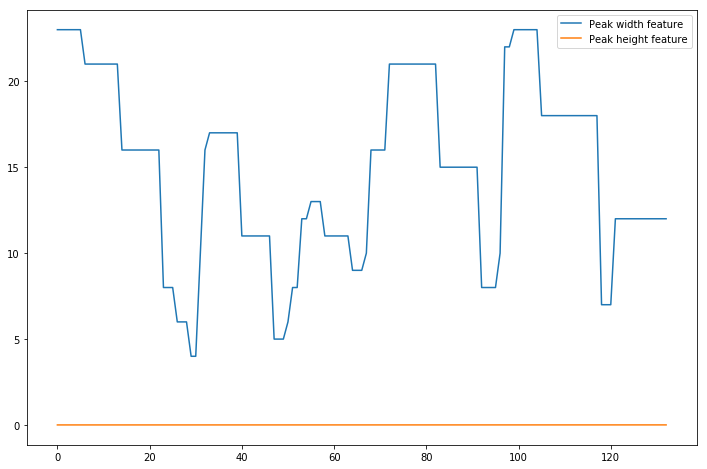


Annotations:
[1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), ar

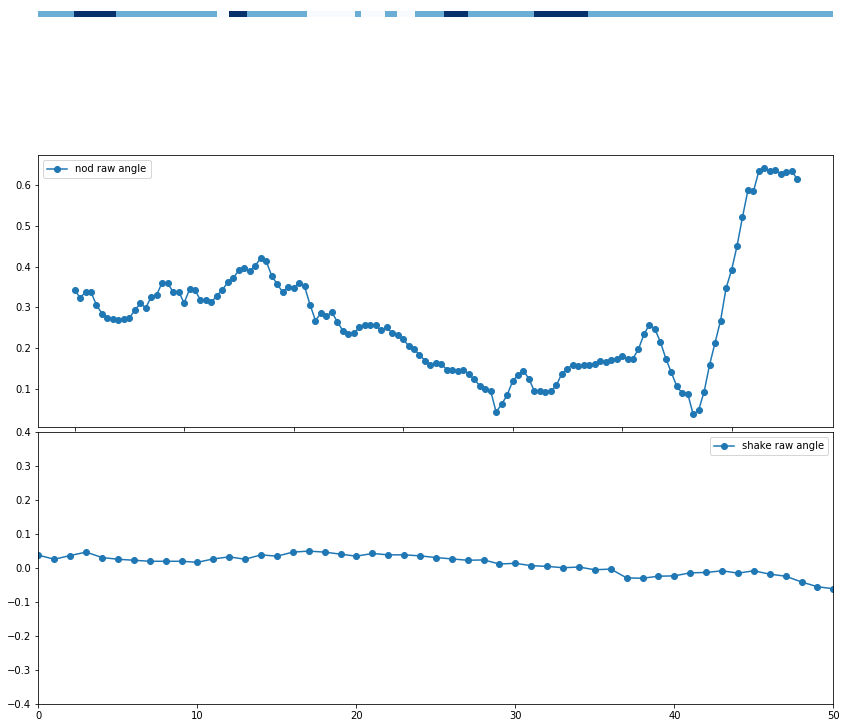

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_MostProudOf/708_MostProudOf_FACE.csv
csv frame rate: 29.997345367666583
L End reached + -
R End reached - +
[[3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.6e+01 2.1e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [3.8e+01 3.9e-02]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.1e+01 9.0e-03]
 [2.2e+01 2.0e-03]
 [2.2e+01 2.0e-03]
 [2.2e+01 2.0e-03]
 [2.2e+01 2.0e-03]
 [2.2e+01 2.0e-03]
 [2.2e+01 2.0e-03]

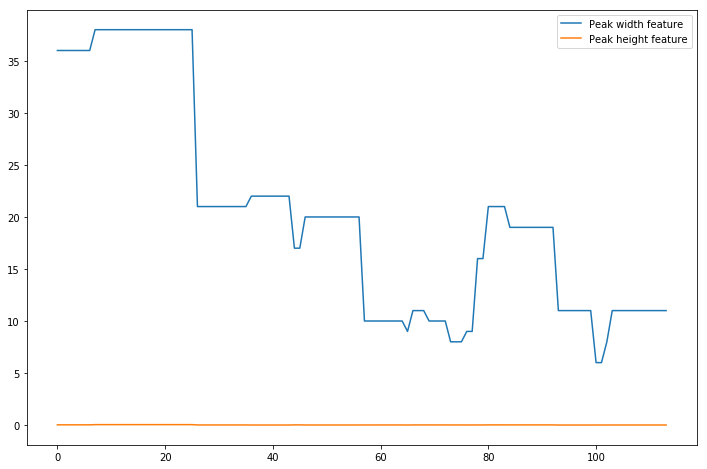

csv frame rate: 29.997345367666583
L End reached + -
R End reached + -
[[8.00000000e+00 5.00000000e-03]
 [8.00000000e+00 5.00000000e-03]
 [8.00000000e+00 5.00000000e-03]
 [8.00000000e+00 5.00000000e-03]
 [6.00000000e+00 3.00000000e-03]
 [6.00000000e+00 3.00000000e-03]
 [6.00000000e+00 3.00000000e-03]
 [5.00000000e+00 3.00000000e-03]
 [6.00000000e+00 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.80000000e+01 2.22044605e-16]
 [1.80000000e+01 2.22044605e-16]
 [1.80000000e+01 2.22044605e-16]
 [1.80000000e+01 2.22044605e-16]
 [1.80000000e+01 2.22044605e-16]
 [1.80000000e+01 2.22044605e-16]
 [1.40000000e+01 7.00000000e-03]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.90000000e+01 2.77555756e-17]
 [1.9

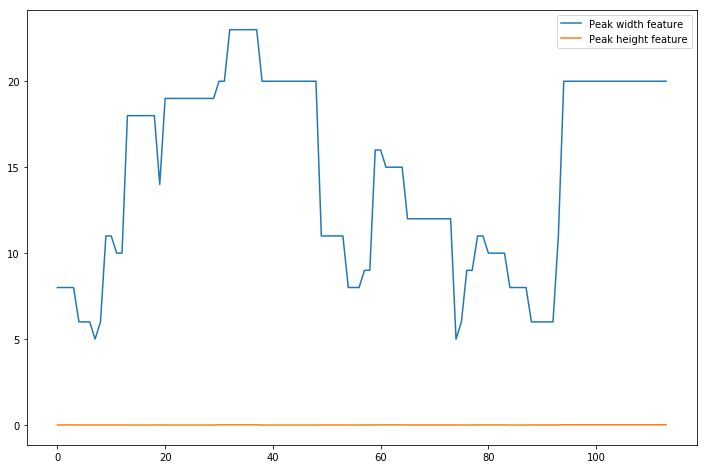


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

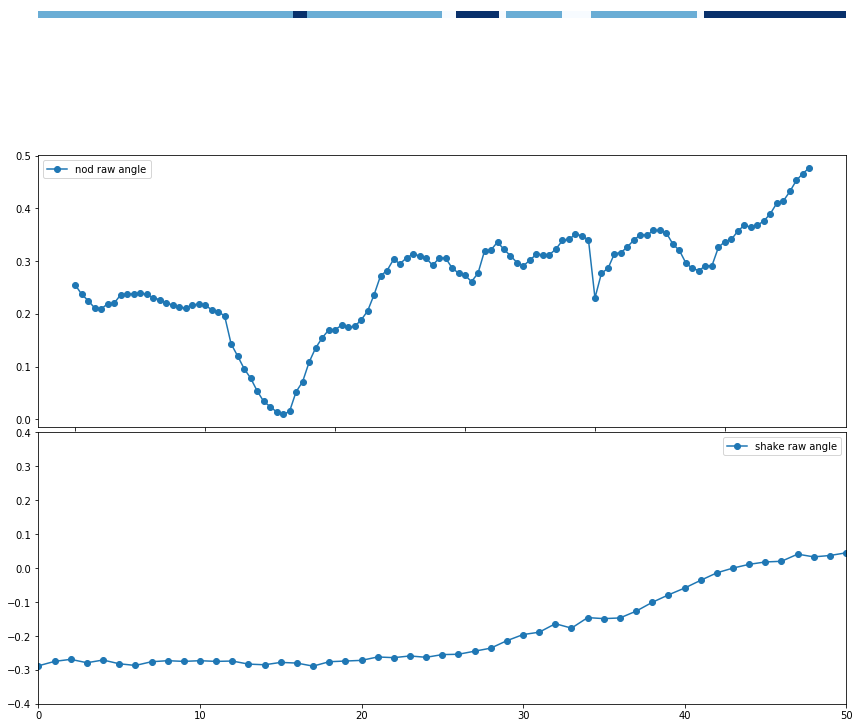

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_EventToErase/708_EventToErase_FACE.csv
csv frame rate: 29.998872222848764
L End reached - +
R End reached + -
[[3.00000000e+01 4.00000000e-03]
 [3.00000000e+01 4.00000000e-03]
 [3.00000000e+01 4.00000000e-03]
 [3.00000000e+01 4.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [3.20000000e+01 6.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2.90000000e+01 5.00000000e-03]
 [2

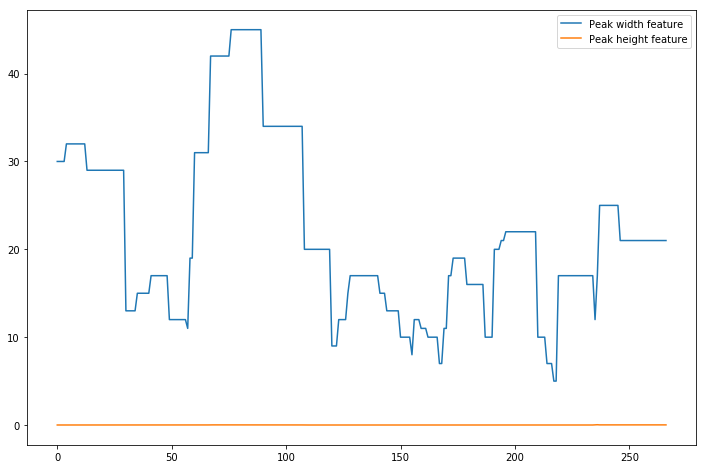

csv frame rate: 29.998872222848764
L End reached - +
R End reached - +
[[8.00000000e+00 6.00000000e-03]
 [8.00000000e+00 6.00000000e-03]
 [8.00000000e+00 6.00000000e-03]
 [8.00000000e+00 6.00000000e-03]
 [8.00000000e+00 4.00000000e-03]
 [8.00000000e+00 4.00000000e-03]
 [7.00000000e+00 4.00000000e-03]
 [7.00000000e+00 4.00000000e-03]
 [6.00000000e+00 1.00000000e-03]
 [6.00000000e+00 1.00000000e-03]
 [6.00000000e+00 1.00000000e-03]
 [1.50000000e+01 1.00000000e-03]
 [1.50000000e+01 1.20000000e-02]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 7.00000000e-03]
 [1.00000000e+01 7.00000000e-03]
 [9.0

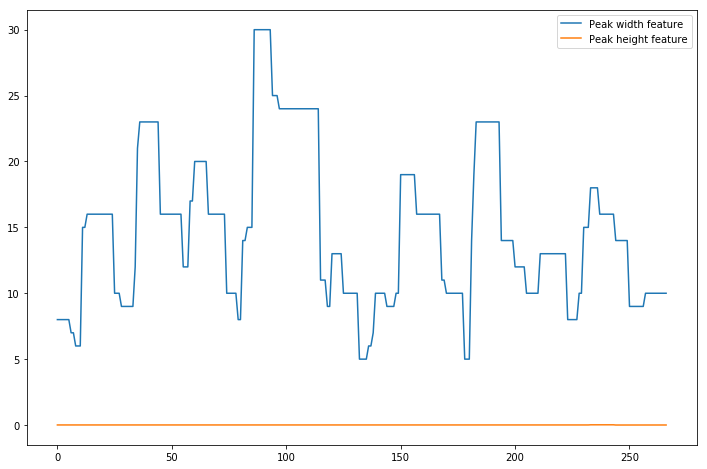


Annotations:
[2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]),

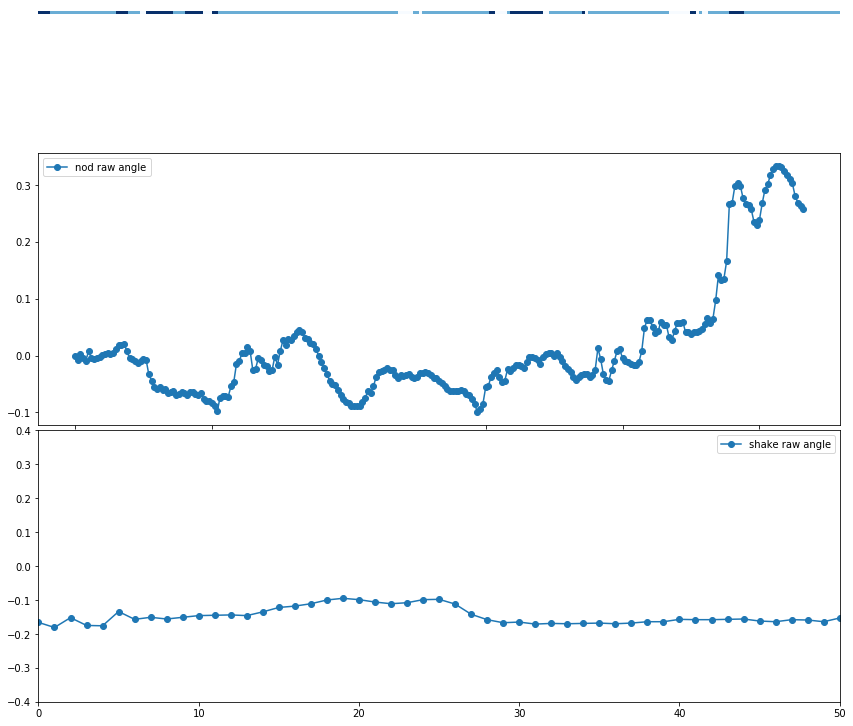

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_LastTimeHappy/708_LastTimeHappy_FACE.csv
csv frame rate: 30.002362390739425
L End reached + -
R End reached + -
[[1.40000000e+01 8.57918258e-03]
 [1.40000000e+01 8.57918258e-03]
 [1.40000000e+01 8.57918258e-03]
 [1.40000000e+01 8.57918258e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [1.60000000e+01 1.23527205e-03]
 [9.00000000e+00 1.26480734e-02]
 [1.30000000e+01 3.81899898e-03]
 [1.30000000e+01 3.81899898e-03]
 [1.30000000e+01 3.81899898e-03]
 [1.30000000e+01 3.81899898e-03]
 [1.30000000e+01 3.81899898e-03]
 [9.00000000e+00 1.29274026e-03]
 [9.00000000e+00 1.29274026e-03]
 [1.40000000e+01 2.52305348e-04]
 [1.40000000e+01 2.52305348e-04]
 [1.40000000e+01 2.52305348e-04]
 

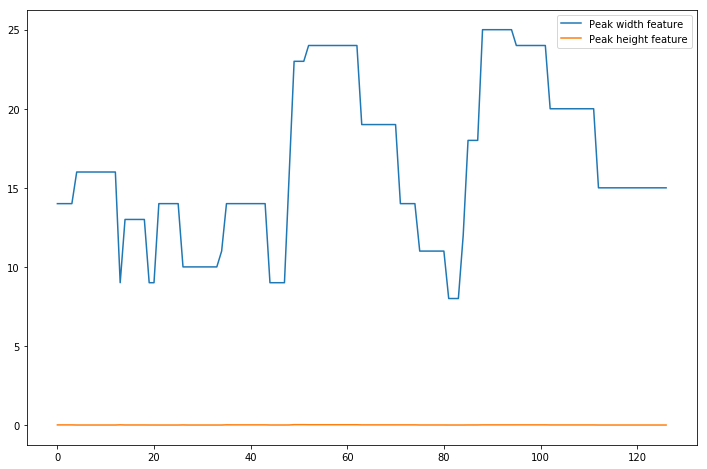

csv frame rate: 30.002362390739425
L End reached + -
R End reached + -
[[2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [2.10000000e+01 1.88000762e-02]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [1.40000000e+01 3.07093012e-03]
 [9.00000000e+00 3.07093012e-03]
 [1.00000000e+01 2.97487515e-03]
 [1.00000000e+01 2.97487515e-03]
 [1.00000000e+01 2.97487515e-03]
 [1.00000000e+01 1.46065081e-03]
 [1.00000000e+01 1.46065081e-03]
 [1.00000000e+01 1.46065081e-03]
 [1.00000000e+01 1.46065081e-03]
 [7.0

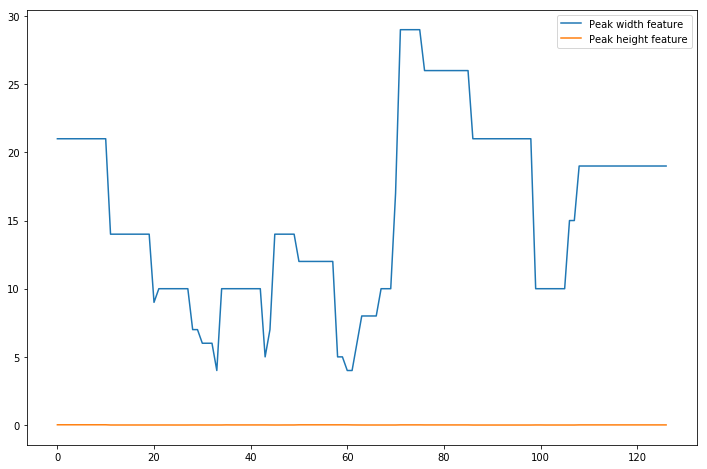


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]),

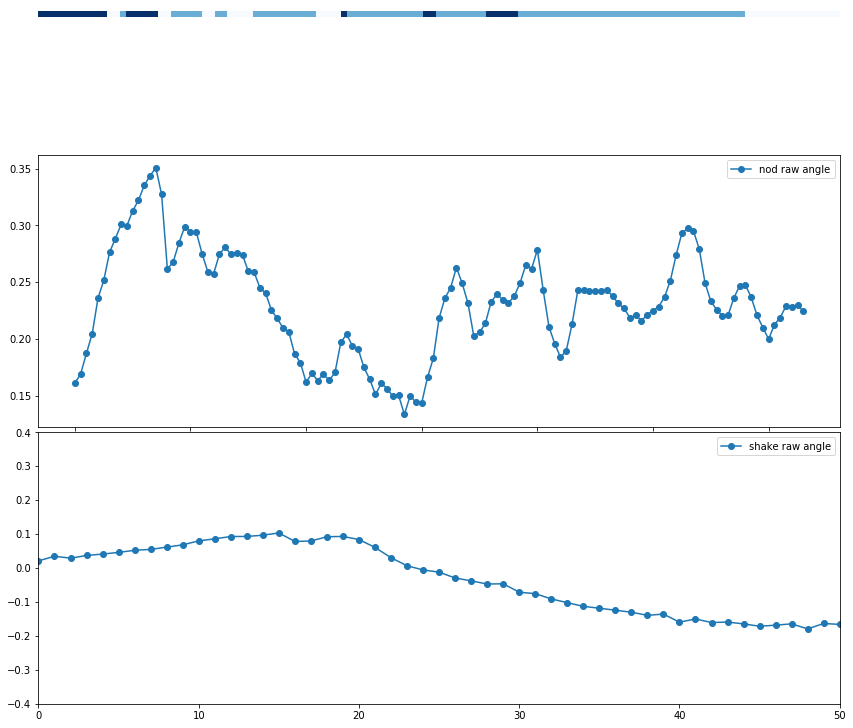

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_SituationHandledDifferent/708_SituationHandledDifferent_FACE.csv
csv frame rate: 29.999681193611124
L End reached + -
R End reached + -
[[1.6e+01 6.0e-03]
 [1.6e+01 6.0e-03]
 [1.6e+01 6.0e-03]
 ...
 [1.2e+01 1.0e-03]
 [1.2e+01 1.0e-03]
 [1.2e+01 1.0e-03]]


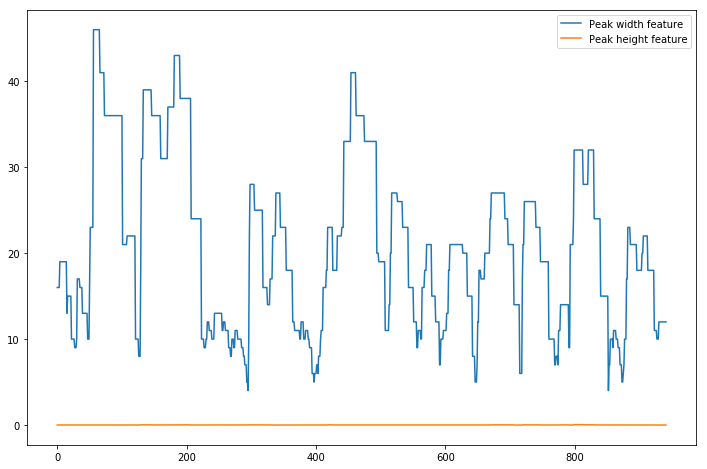

csv frame rate: 29.999681193611124
L End reached + -
R End reached + -
[[1.40000000e+01 5.55111512e-17]
 [1.40000000e+01 5.55111512e-17]
 [1.40000000e+01 5.55111512e-17]
 ...
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]]


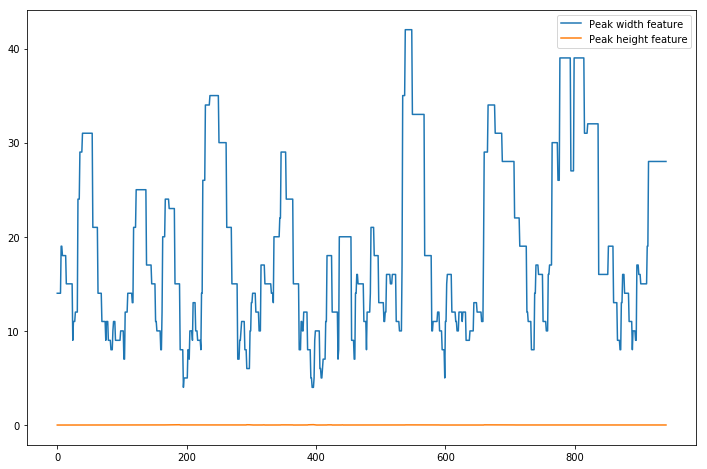


Annotations:
[2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1

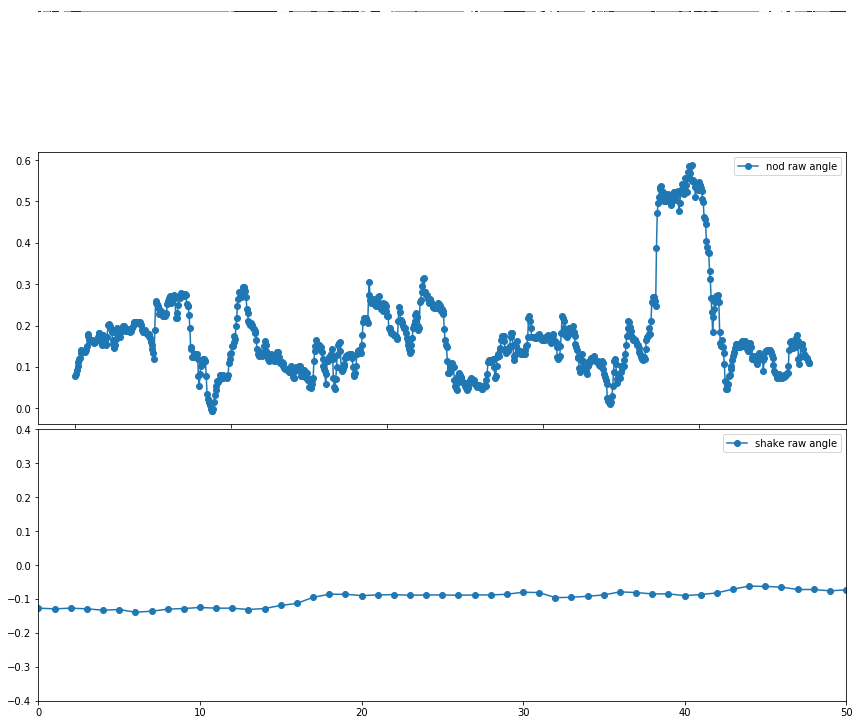

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_LastArgument/708_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.5e+01 6.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.4e+01 9.0e-03]
 [2.4e+01 9.0e-03]
 [2.4e+01 9.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3.0e-03]
 [3.4e+01 3

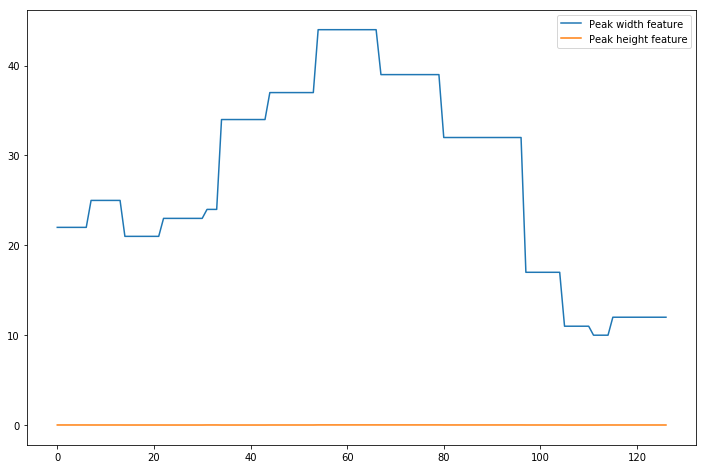

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.30000000e+01 6.00000000e-03]
 [1.30000000e+01 6.00000000e-03]
 [1.20000000e+01 6.00000000e-03]
 [1.20000000e+01 6.00000000e-03]
 [1.20000000e+01 6.00000000e-03]
 [1.20000000e+01 6.00000000e-03]
 [1.20000000e+01 6.00000000e-03]
 [1.00000000e+01 2.08166817e-17]
 [1.00000000e+01 2.08166817e-17]
 [1.00000000e+01 2.08166817e-17]
 [1.00000000e+01 2.08166817e-17]
 [1.00000000e+01 2.08166817e-17]
 [1.50000000e+01 1.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.00000000e-03]
 [1.60000000e+01 3.

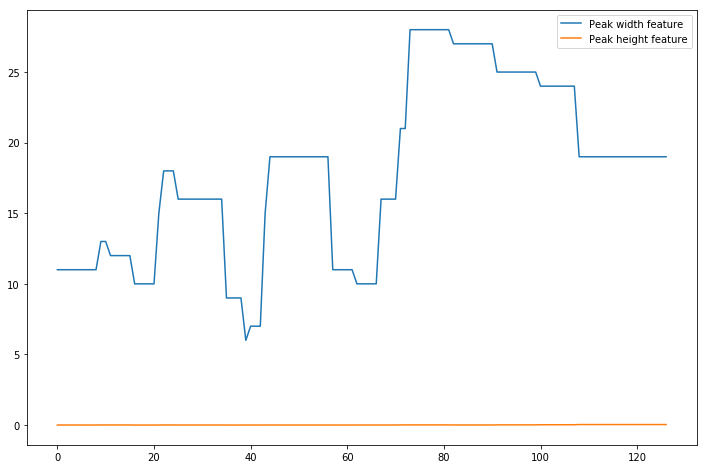


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]),

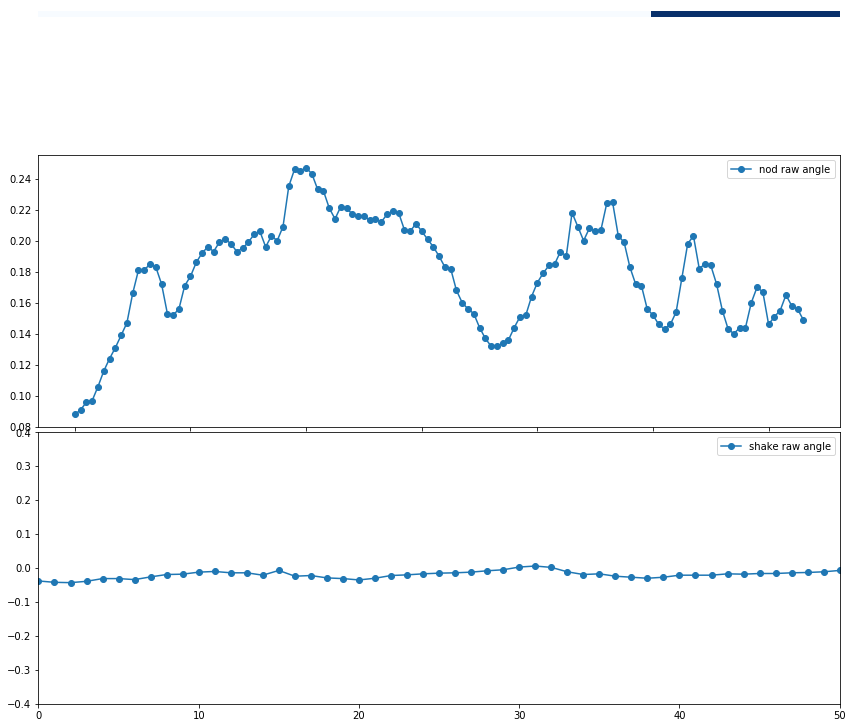

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/708/708_HowCloseToFamily/708_HowCloseToFamily_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached - +
[[3.0e+01 3.0e-03]
 [3.0e+01 3.0e-03]
 [3.0e+01 3.0e-03]
 ...
 [2.4e+01 1.2e-02]
 [2.4e+01 1.2e-02]
 [2.4e+01 1.2e-02]]


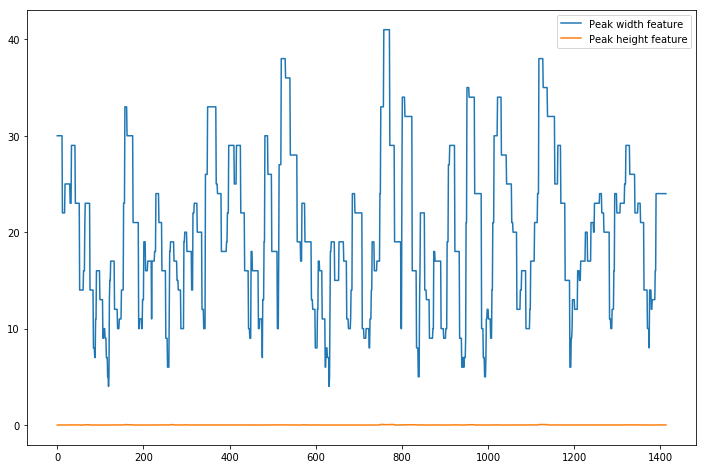

csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.3e+01 1.0e-03]
 [1.3e+01 1.0e-03]
 [1.3e+01 1.0e-03]
 ...
 [2.5e+01 3.2e-02]
 [2.5e+01 3.2e-02]
 [2.5e+01 3.2e-02]]


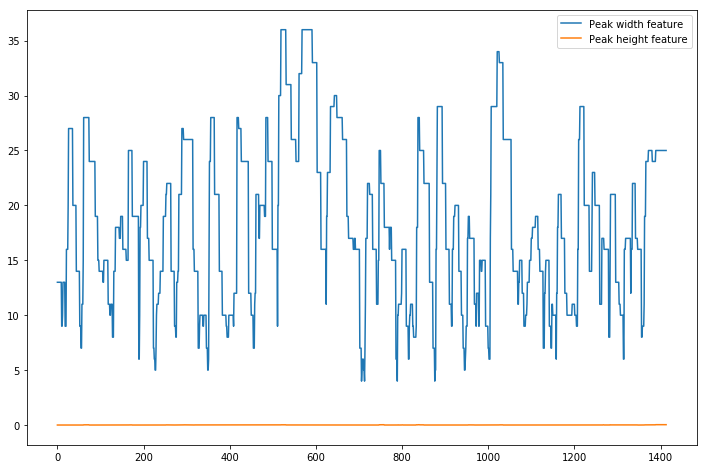


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1

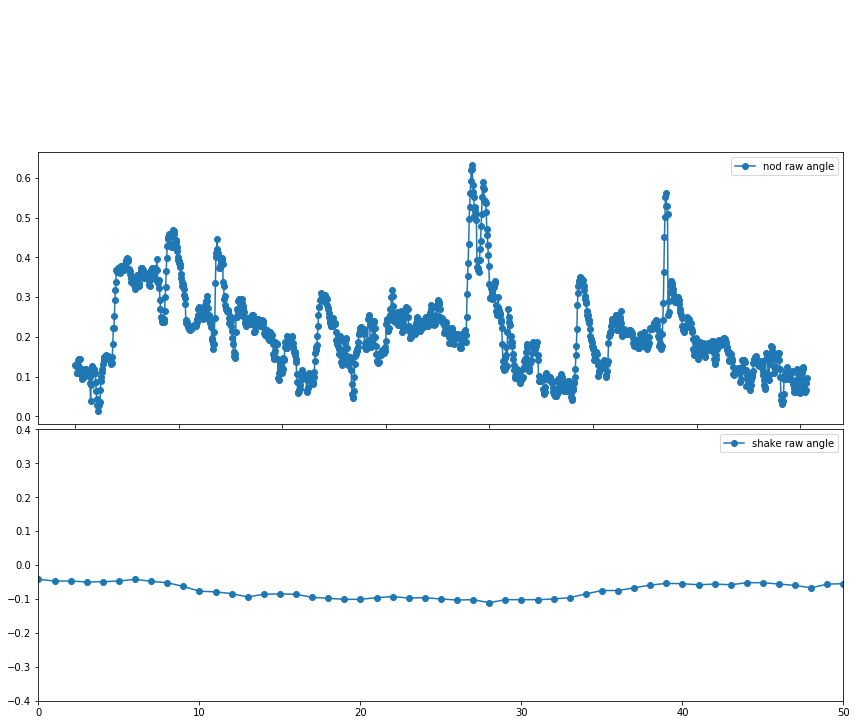

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_LastTimeHappy/422_LastTimeHappy_FACE.csv
csv frame rate: 30.000722908985757
L End reached + -
R End reached + -
[[2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [2.30000000e+01 5.25505968e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.50000000e+01 1.04489163e-03]
 [1.10000000e+01 7.16058848e-04]
 [1.10000000e+01 7.16058848e-04]
 [1.10000000e+01 7.16058848e-04]
 [1.10000000e+01 7.16058848e-04]
 [1.10000000e+01 7.16058848e-04]
 [1.10000000e+01 7.16058848e-04]
 [1.00000000e+01 3.35771309e-03]
 

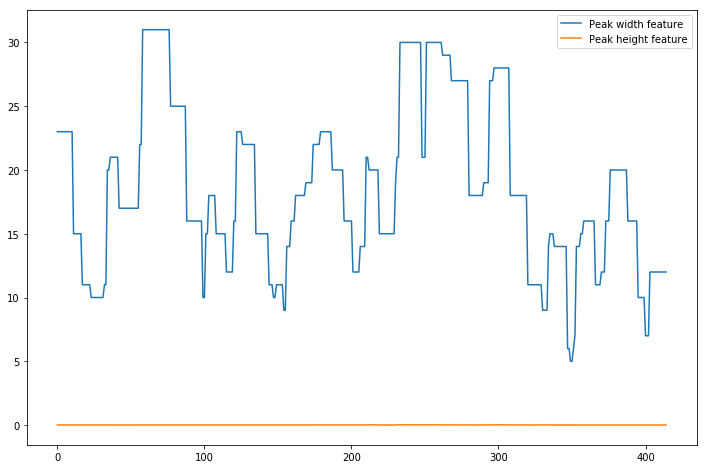

csv frame rate: 30.000722908985757
L End reached - +
R End reached + -
[[7.00000000e+00 2.00748532e-03]
 [7.00000000e+00 2.00748532e-03]
 [7.00000000e+00 2.00748532e-03]
 [7.00000000e+00 2.00748532e-03]
 [5.00000000e+00 2.00748532e-03]
 [5.00000000e+00 2.00748532e-03]
 [8.00000000e+00 1.21353212e-03]
 [1.50000000e+01 2.76470766e-03]
 [1.60000000e+01 5.99710619e-03]
 [1.60000000e+01 5.99710619e-03]
 [1.60000000e+01 5.99710619e-03]
 [1.60000000e+01 5.99710619e-03]
 [1.60000000e+01 5.99710619e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [1.30000000e+01 1.55281489e-03]
 [9.00000000e+00 1.72795388e-03]
 [9.00000000e+00 1.72795388e-03]
 [1.50000000e+01 1.88959495e-03]
 [1.50000000e+01 1.88959495e-03]
 [1.40000000e+01 2.81271811e-03]
 [1.40000000e+01 2.81271811e-03]
 [1.40000000e+01 2.81271811e-03]
 [1.4

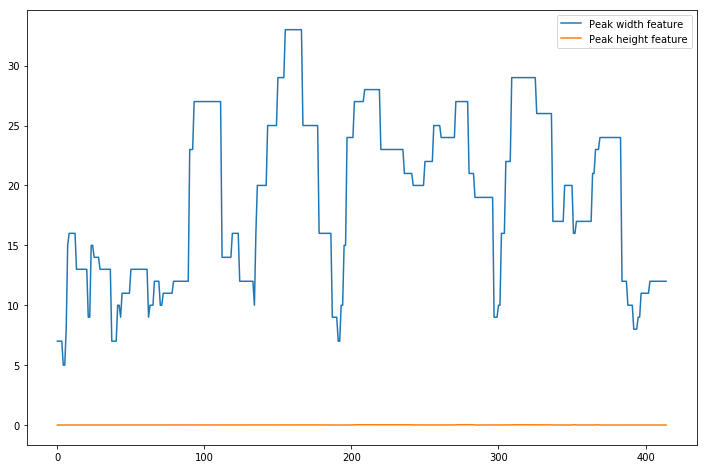


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1

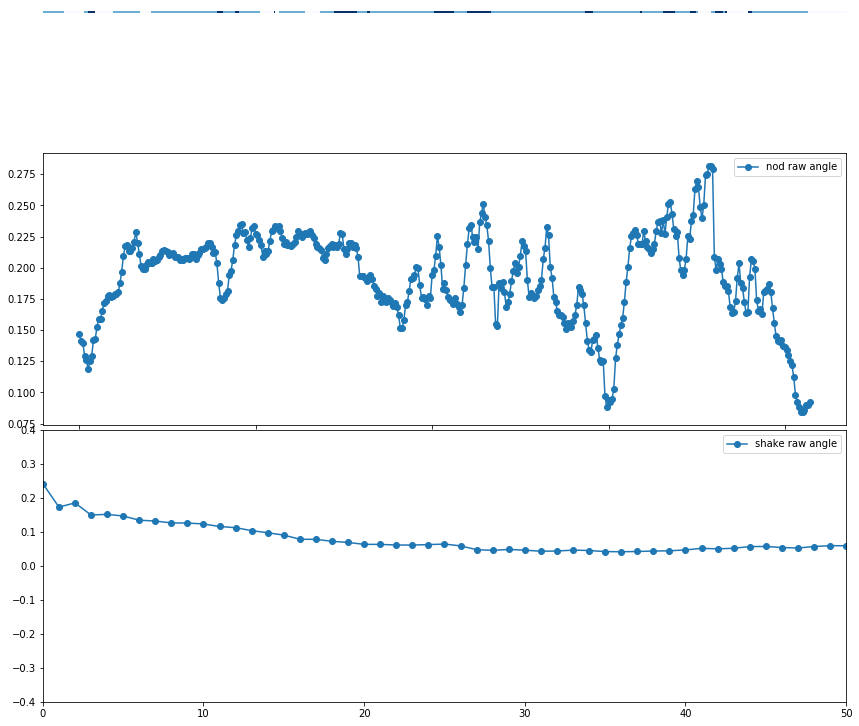

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_SituationHandledDifferent/422_SituationHandledDifferent_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[3.00000000e+01 1.20155734e-02]
 [3.00000000e+01 1.20155734e-02]
 [3.00000000e+01 1.20155734e-02]
 ...
 [2.70000000e+01 7.00654172e-03]
 [2.70000000e+01 7.00654172e-03]
 [2.70000000e+01 7.00654172e-03]]


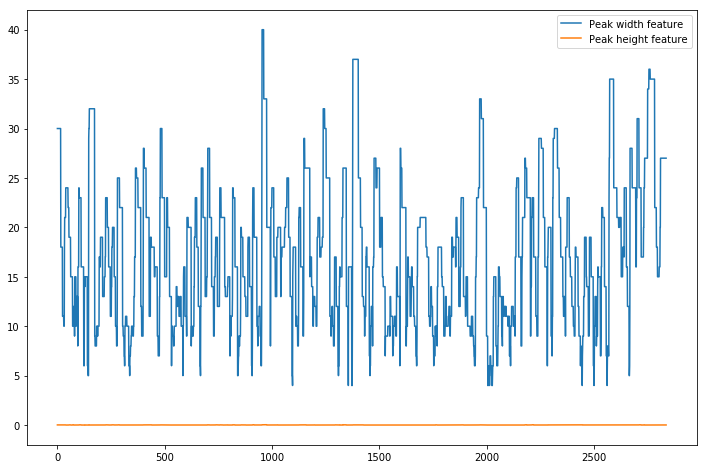

csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[2.80000000e+01 1.78751544e-02]
 [2.80000000e+01 1.78751544e-02]
 [2.80000000e+01 1.78751544e-02]
 ...
 [1.10000000e+01 3.97195706e-03]
 [1.10000000e+01 3.97195706e-03]
 [1.10000000e+01 3.97195706e-03]]


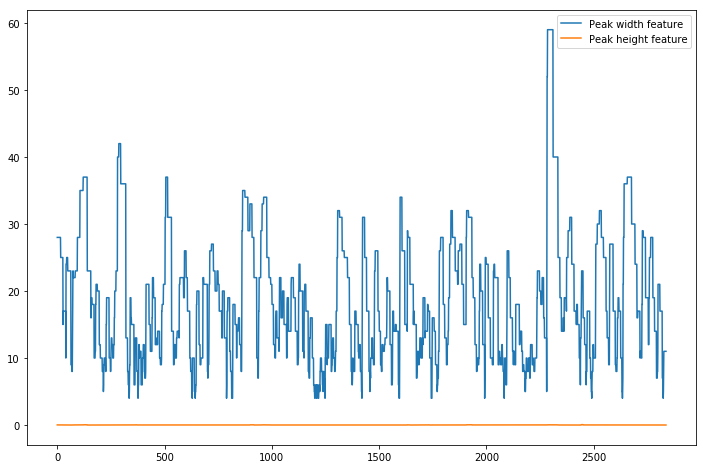


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 2, 2, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0

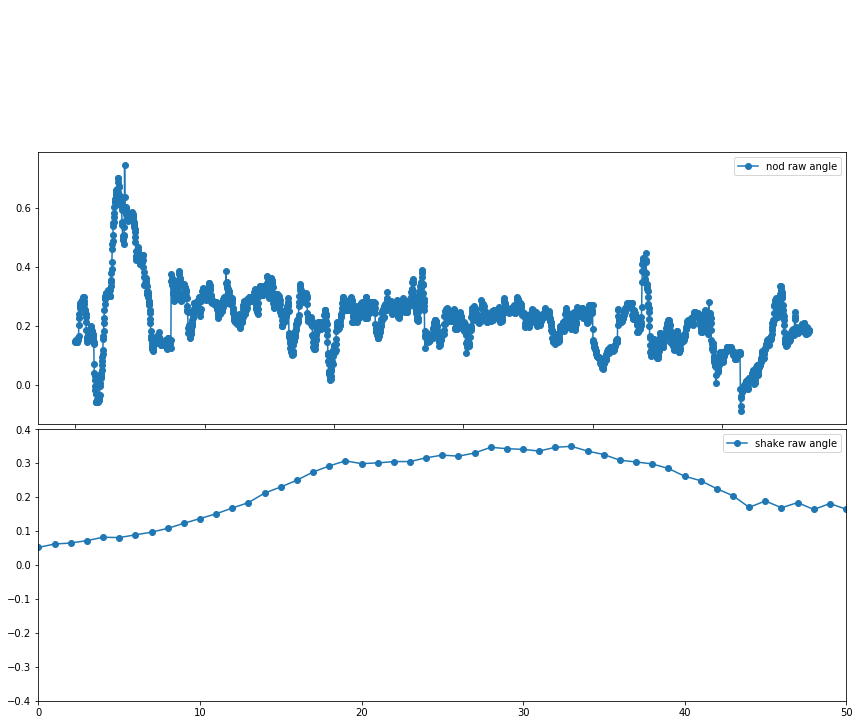

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_LastArgument/422_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached + -
[[2.80000000e+01 2.10000000e-02]
 [2.80000000e+01 2.10000000e-02]
 [2.80000000e+01 2.10000000e-02]
 [2.80000000e+01 2.10000000e-02]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [3.50000000e+01 1.00000000e-03]
 [1.70000000e+01 

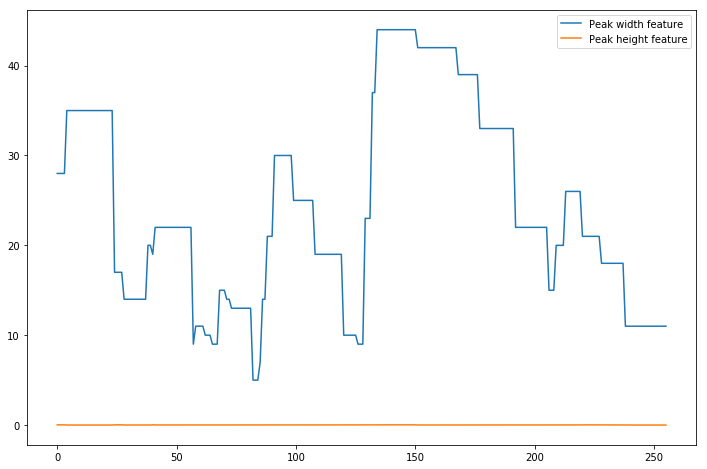

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.20000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [2.90000000e+01 1.40000000e-02]
 [2.90000000e+01 1.40000000e-02]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.80000000e+01 5.00000000e-03]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.66533454e-16]
 [2.10000000e+01 1.

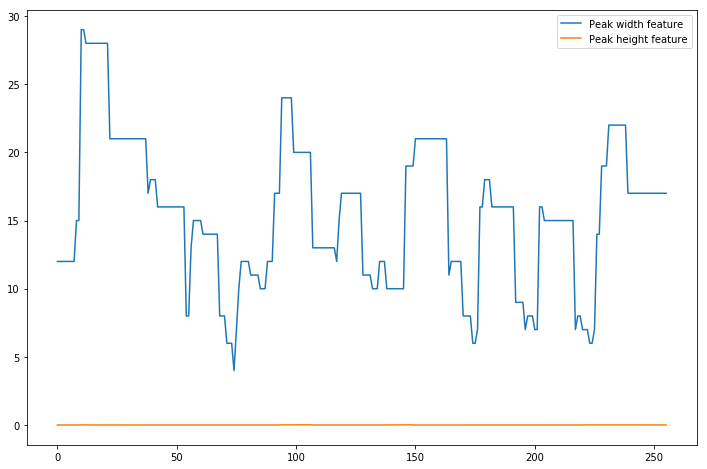


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 

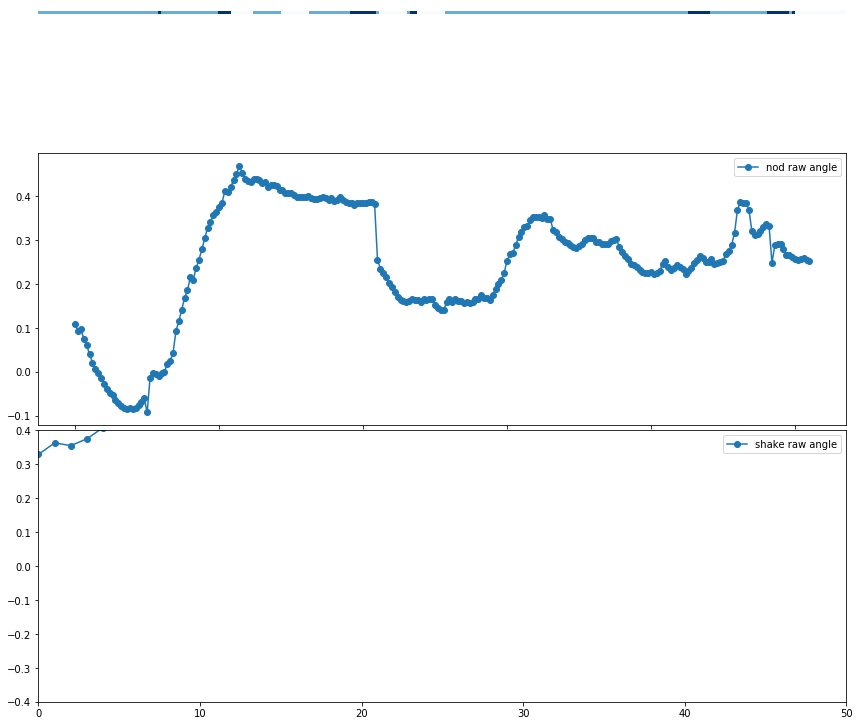

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_EventToErase/422_EventToErase_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached - +
[[4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [4.20000000e+01 3.90000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 1.40000000e-02]
 [3.30000000e+01 

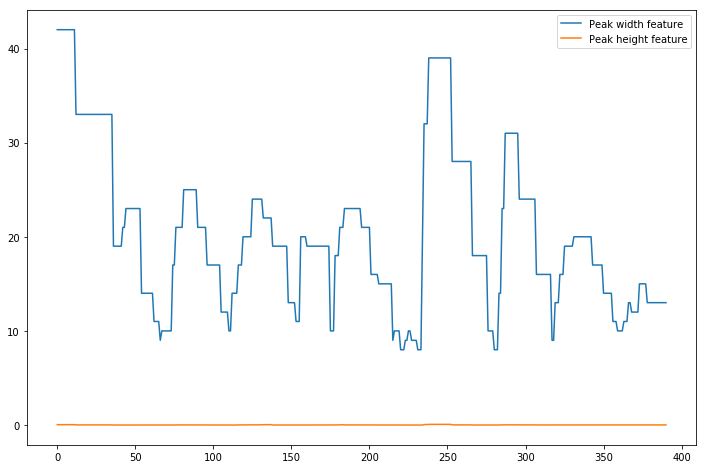

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.00000000e+01 1.00000000e-02]
 [1.00000000e+01 1.00000000e-02]
 [1.00000000e+01 1.00000000e-02]
 [1.00000000e+01 1.00000000e-02]
 [1.00000000e+01 1.00000000e-02]
 [1.30000000e+01 7.00000000e-03]
 [1.30000000e+01 7.00000000e-03]
 [1.30000000e+01 7.00000000e-03]
 [1.10000000e+01 2.00000000e-02]
 [1.10000000e+01 2.00000000e-02]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [2.20000000e+01 3.00000000e-03]
 [2.60000000e+01 2.60000000e-02]
 [2.60000000e+01 2.60000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.90000000e-02]
 [2.50000000e+01 1.

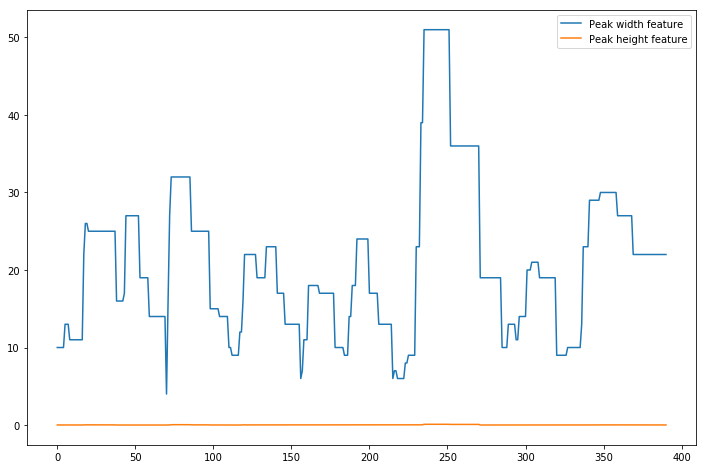


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1

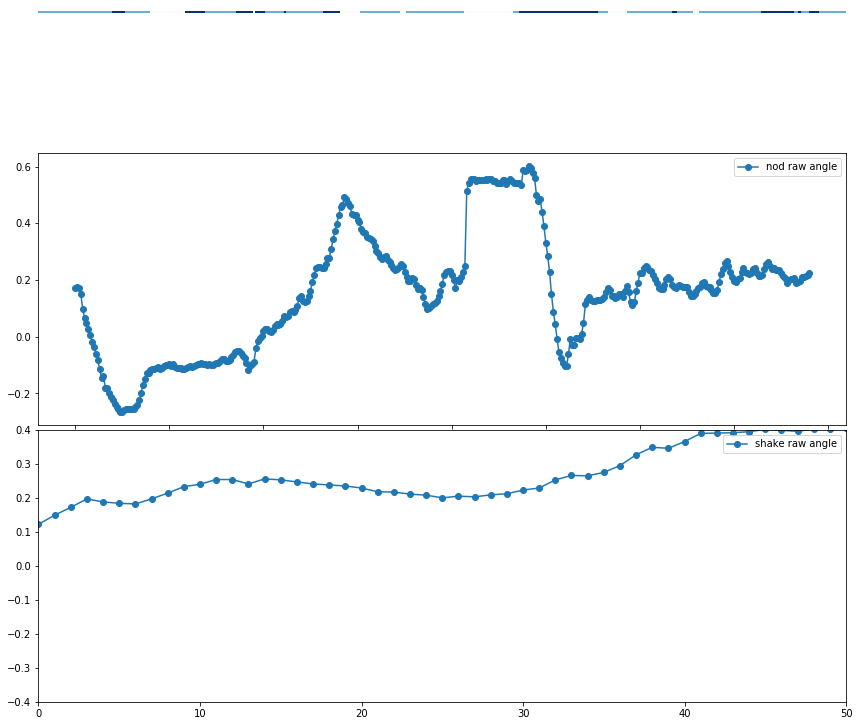

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_HardestDecision/422_HardestDecision_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached + -
[[2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.30000000e+01 8.32667268e-17]
 [1.00000000e+01 1.00000000e-03]
 [1.10000000e+01 4.00000000e-03]
 [1.10000000e+01 4.00000000e-03]
 [1.20000000e+01 5.55111512e-16]
 [1.2000000

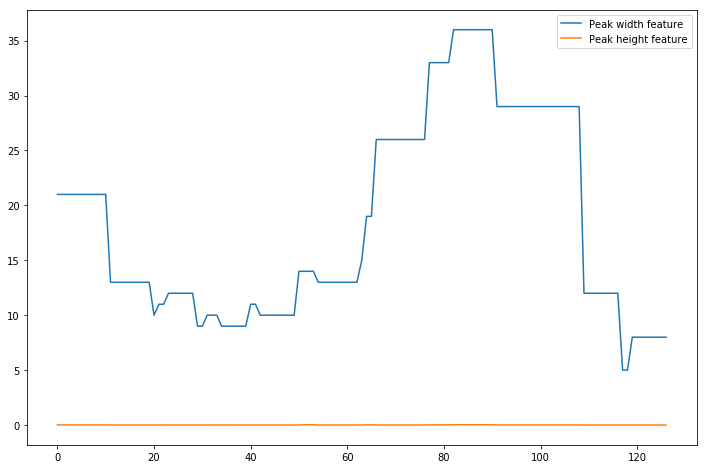

csv frame rate: 30.0
L End reached + -
R End reached + -
[[3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [3.70000000e+01 5.40000000e-02]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.00000000e-03]
 [2.90000000e+01 4.

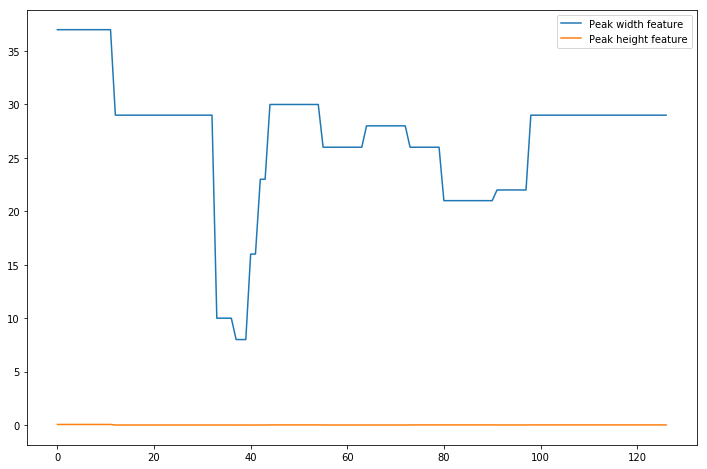


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]),

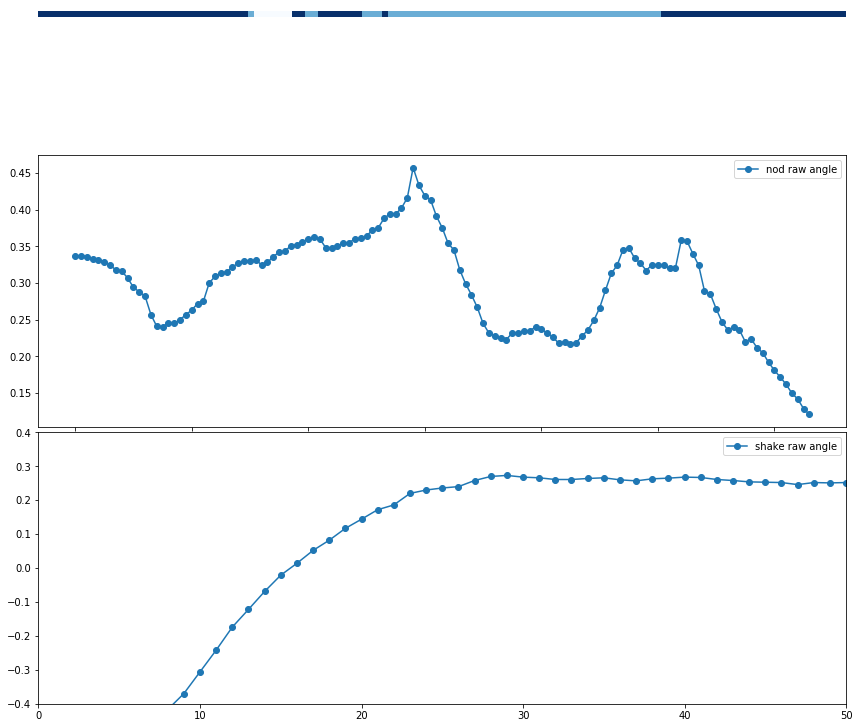

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/422/422_MostProudOf/422_MostProudOf_FACE.csv
csv frame rate: 30.00028302153794
L End reached - +
R End reached + -
[[2.10000000e+01 6.97283193e-03]
 [2.10000000e+01 6.97283193e-03]
 [2.10000000e+01 6.97283193e-03]
 ...
 [1.70000000e+01 1.95153083e-03]
 [1.70000000e+01 1.95153083e-03]
 [1.70000000e+01 1.95153083e-03]]


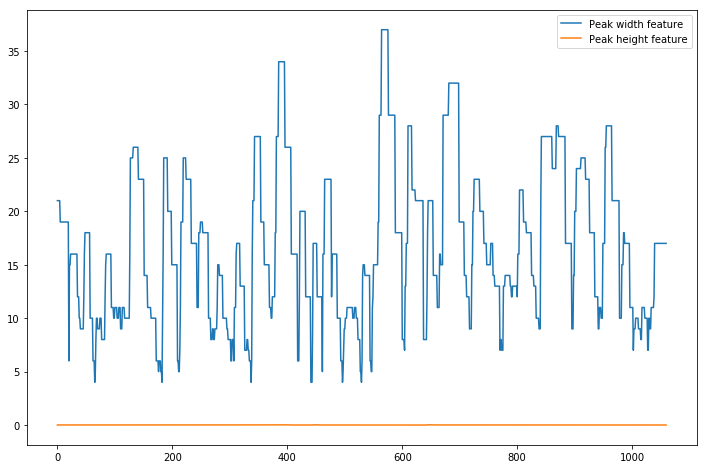

csv frame rate: 30.00028302153794
L End reached + -
R End reached + -
[[1.60000000e+01 1.56582130e-02]
 [1.60000000e+01 1.56582130e-02]
 [1.60000000e+01 1.56582130e-02]
 ...
 [1.10000000e+01 8.46874702e-03]
 [1.10000000e+01 8.46874702e-03]
 [1.10000000e+01 8.46874702e-03]]


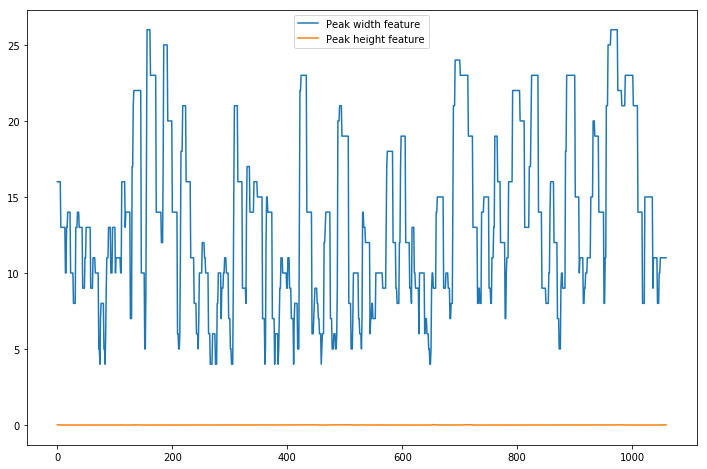


Annotations:
[1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 0, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0

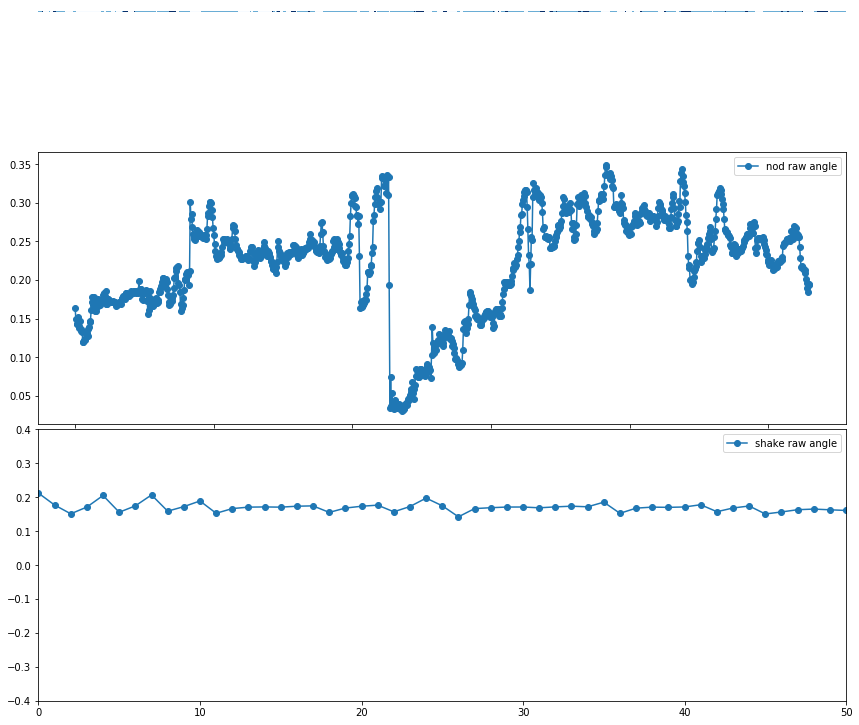

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_LastTimeHappy/427_LastTimeHappy_FACE.csv
csv frame rate: 29.99925188898032
L End reached + -
R End reached + -
[[1.30000000e+01 6.66133815e-16]
 [1.30000000e+01 6.66133815e-16]
 [1.30000000e+01 6.66133815e-16]
 [1.30000000e+01 6.66133815e-16]
 [1.30000000e+01 6.66133815e-16]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.20000000e+01 8.00000000e-03]
 [1.20000000e+01 8.00000000e-03]
 [1.20000000e+01 8.00000000e-03]
 [1.20000000e+01 8.00000000e-03]
 [1.20000000e+01 8.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [1.70000000e+01 5.00000000e-03]
 [

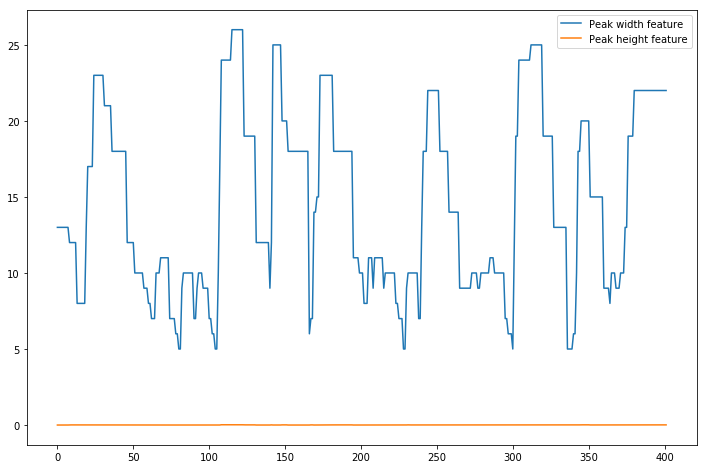

csv frame rate: 29.99925188898032
L End reached - +
R End reached + -
[[1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.00000000e+01 5.00000000e-03]
 [1.00000000e+01 5.00000000e-03]
 [1.00000000e+01 5.00000000e-03]
 [1.00000000e+01 5.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 8.00000000e-03]
 [1.10000000e+01 8.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [8.00000000e+00 4.00000000e-03]
 [1.30000000e+01 4.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30

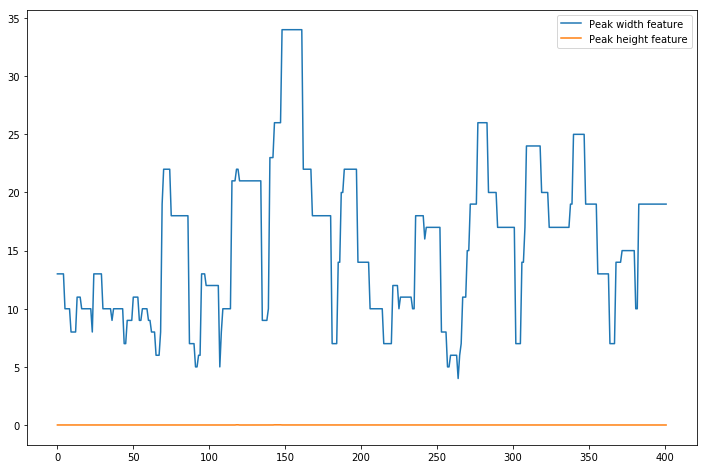


Annotations:
[0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 2, 2, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0

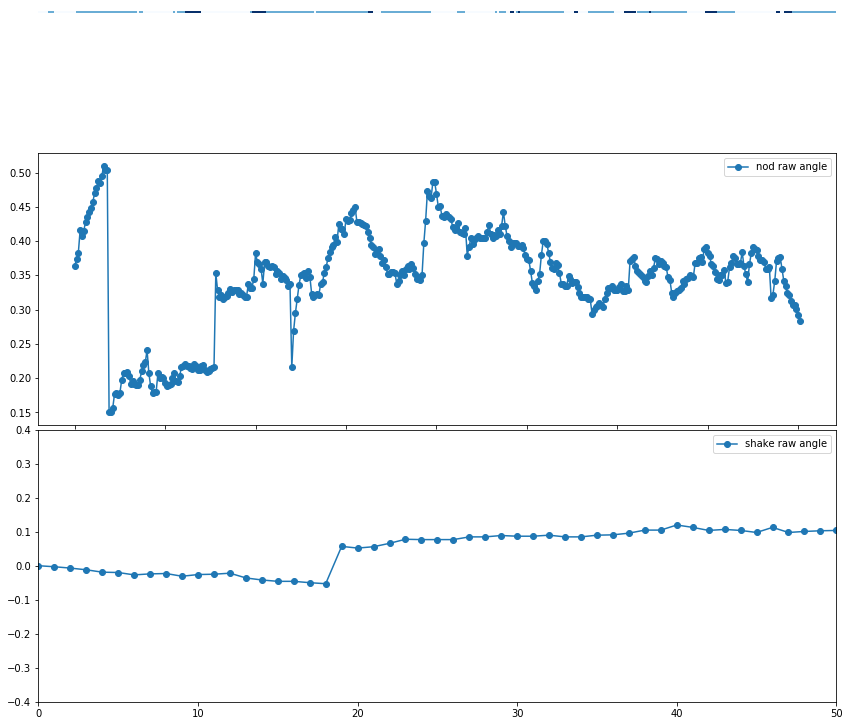

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_SituationHandledDifferent/427_SituationHandledDifferent_FACE.csv
csv frame rate: 30.001507613447917
L End reached - +
R End reached - +
[[1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.20000000e+01 5.79245565e-03]
 [1.00000000e+01 1.53398460e-03]
 [1.00000000e+01 1.53398460e-03]
 [1.00000000e+01 1.53398460e-03]
 [1.20000000e+01 3.76806815e-03]
 [1.90000000e+01 6.76800719e-03]
 [1.90000000e+01 6.76800719e-03]
 [1.90000000e+01 6.76800719e-03]
 [1.90000000e+01 6.76800719e-03]
 [1.90000000e+01 6.76800719e-03]
 [1.50000000e+01 5.58712755e-03]
 [1.50000000e+01 5.58712755e-03]
 [1.50000000e+01 5.58712755e-03]
 [1.50000000e+01 5.58712755e-03]
 [1.50000000e+01 5.58712755e-03]
 [1.10000000e+01 1.32135905e-03]
 [1.100000

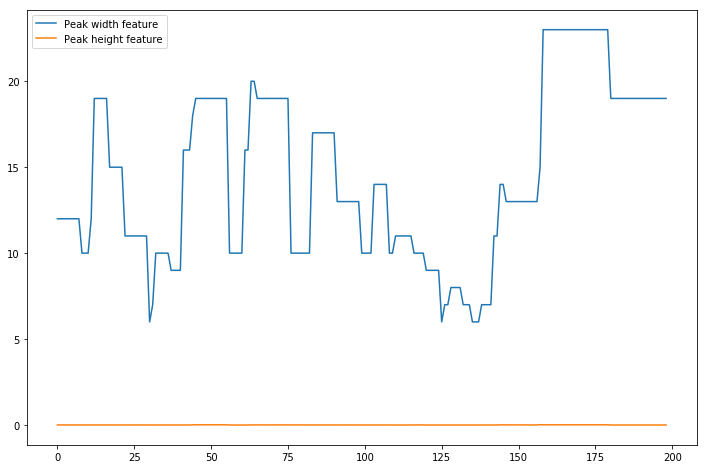

csv frame rate: 30.001507613447917
L End reached + -
R End reached + -
[[9.00000000e+00 2.54474041e-03]
 [9.00000000e+00 2.54474041e-03]
 [9.00000000e+00 2.54474041e-03]
 [9.00000000e+00 2.54474041e-03]
 [9.00000000e+00 2.54474041e-03]
 [2.00000000e+01 2.59963788e-03]
 [2.00000000e+01 2.59963788e-03]
 [2.00000000e+01 2.59963788e-03]
 [2.30000000e+01 2.09425619e-02]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [2.30000000e+01 8.41528894e-03]
 [9.00000000e+00 5.88930571e-04]
 [9.00000000e+00 5.88930571e-04]
 [9.00000000e+00 5.88930571e-04]
 [9.00000000e+00 5.88930571e-04]
 [9.0

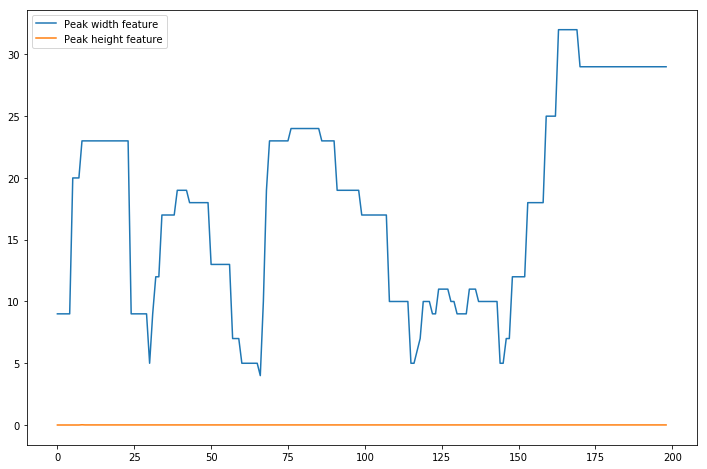


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0.,

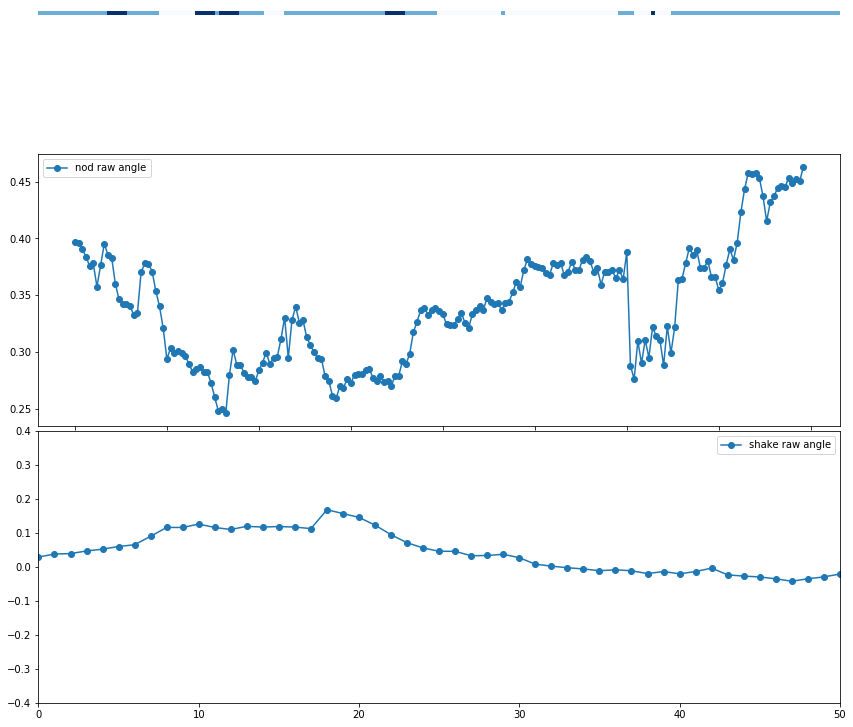

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_EventToErase/427_EventToErase_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[2.30000000e+01 8.00000000e-03]
 [2.30000000e+01 8.00000000e-03]
 [2.30000000e+01 8.00000000e-03]
 [2.30000000e+01 8.00000000e-03]
 [2.30000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [4.00000000e+00 3.00000000e-03]
 [6.00000000e+00 

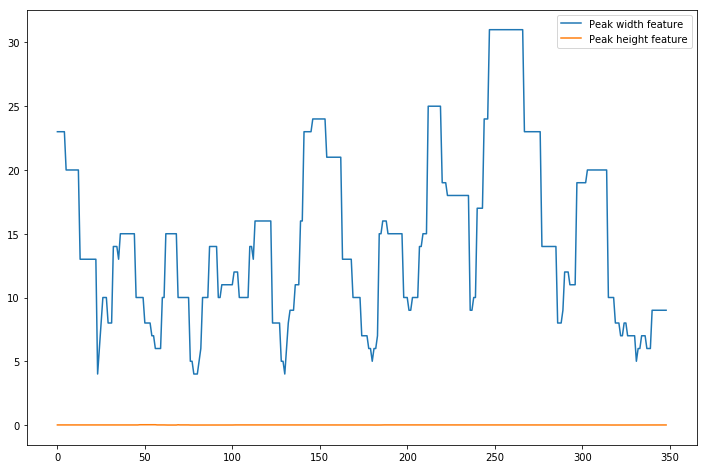

csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.40000000e+01 1.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [2.60000000e+01 1.40000000e-02]
 [2.60000000e+01 1.40000000e-02]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.00000000e-03]
 [3.00000000e+01 9.

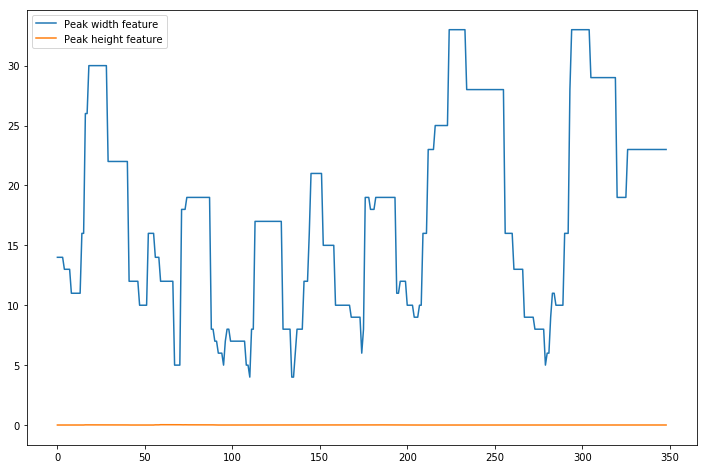


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 2, 2, 2

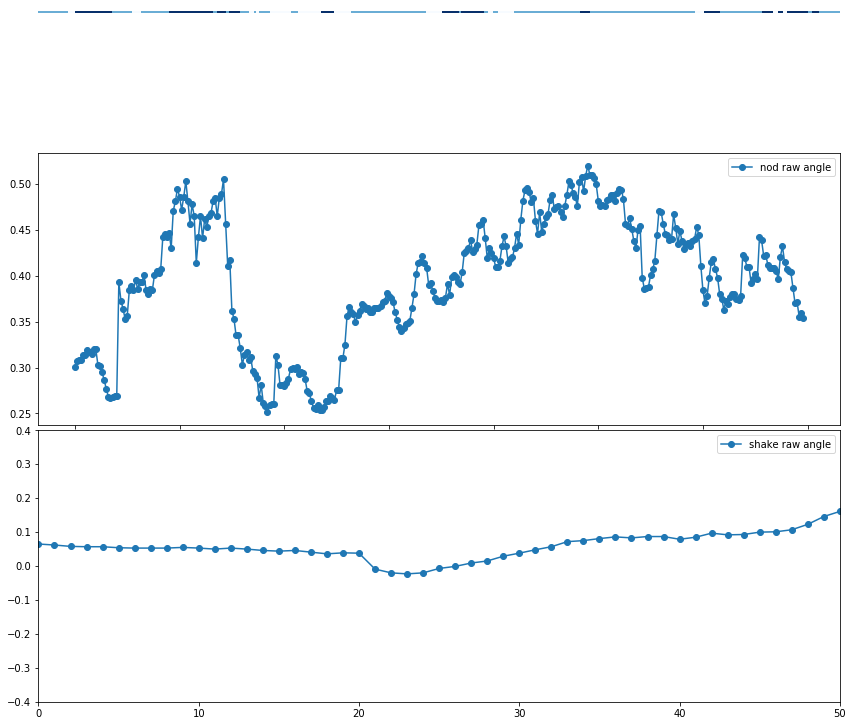

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_LastArgument/427_LastArgument_FACE.csv
csv frame rate: 30.00194817845315
L End reached - +
R End reached + -
[[2.30000000e+01 9.84749525e-03]
 [2.30000000e+01 9.84749525e-03]
 [2.30000000e+01 9.84749525e-03]
 [2.30000000e+01 9.84749525e-03]
 [2.30000000e+01 9.84749525e-03]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.50000000e+01 1.55776594e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [2.00000000e+01 1.08267869e-02]
 [1.00000000e+01 3.05593868e-03]
 [1.

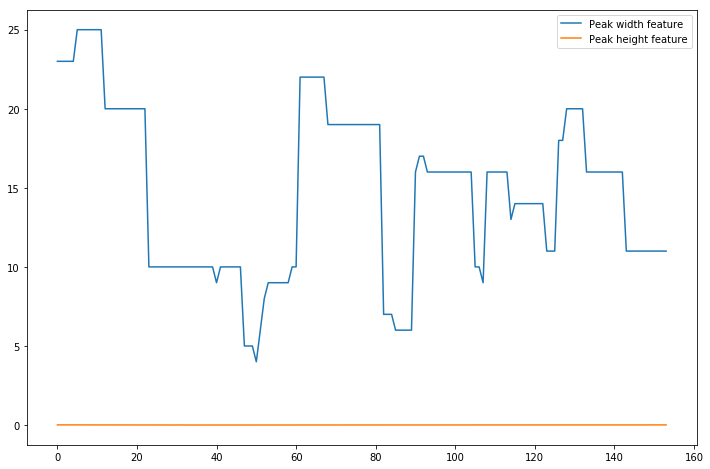

csv frame rate: 30.00194817845315
L End reached - +
R End reached - +
[[1.60000000e+01 4.06279028e-03]
 [1.60000000e+01 4.06279028e-03]
 [1.60000000e+01 4.06279028e-03]
 [1.60000000e+01 4.06279028e-03]
 [1.50000000e+01 6.25782769e-03]
 [1.50000000e+01 6.25782769e-03]
 [1.50000000e+01 6.25782769e-03]
 [1.50000000e+01 6.25782769e-03]
 [1.50000000e+01 6.25782769e-03]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.20000000e+01 3.91266555e-04]
 [1.90000000e+01 1.29910156e-03]
 [1.90000000e+01 1.29910156e-03]
 [2.10000000e+01 1.12422163e-02]
 [2.10000000e+01 1.12422163e-02]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00000000e+01 3.12831825e-03]
 [2.00

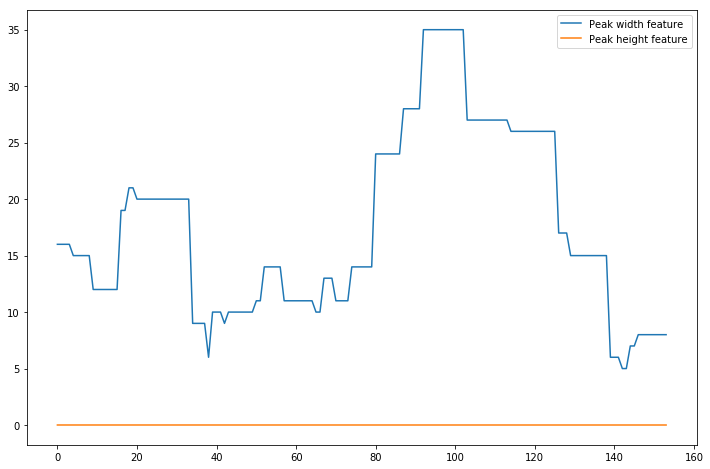


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), ar

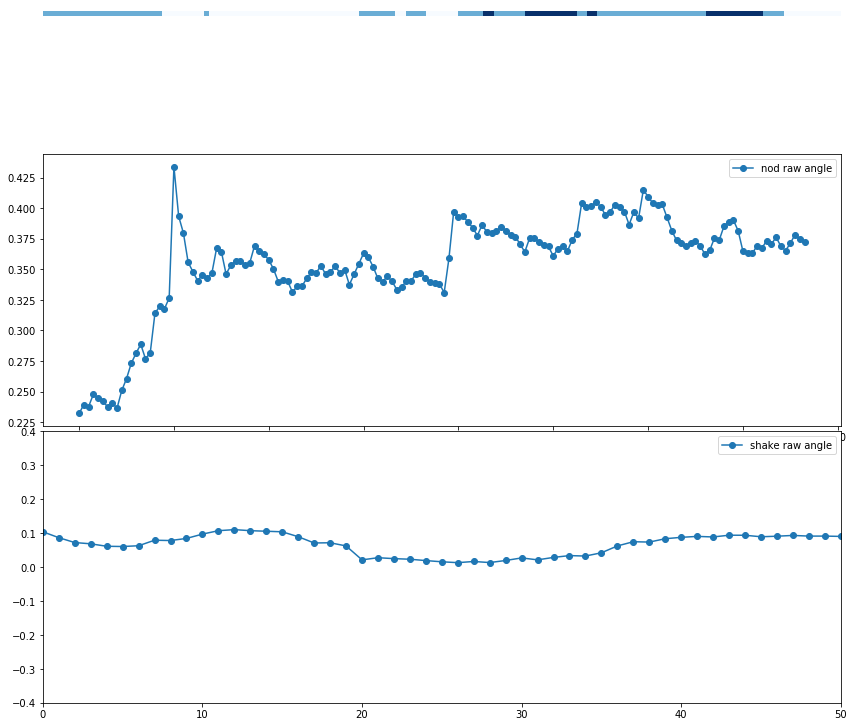

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_MostProudOf/427_MostProudOf_FACE.csv
csv frame rate: 30.00230786983614
L End reached + -
R End reached - +
[[1.30000000e+01 3.78596551e-03]
 [1.30000000e+01 3.78596551e-03]
 [1.30000000e+01 3.78596551e-03]
 [1.30000000e+01 3.78596551e-03]
 [1.30000000e+01 3.78596551e-03]
 [1.30000000e+01 3.78596551e-03]
 [1.00000000e+01 3.91626705e-03]
 [1.00000000e+01 3.91626705e-03]
 [9.00000000e+00 9.27684380e-04]
 [9.00000000e+00 9.27684380e-04]
 [9.00000000e+00 9.27684380e-04]
 [9.00000000e+00 9.27684380e-04]
 [9.00000000e+00 9.27684380e-04]
 [1.40000000e+01 9.27684380e-04]
 [1.40000000e+01 9.27684380e-04]
 [1.90000000e+01 5.30290536e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90000000e+01 2.35037021e-03]
 [1.90

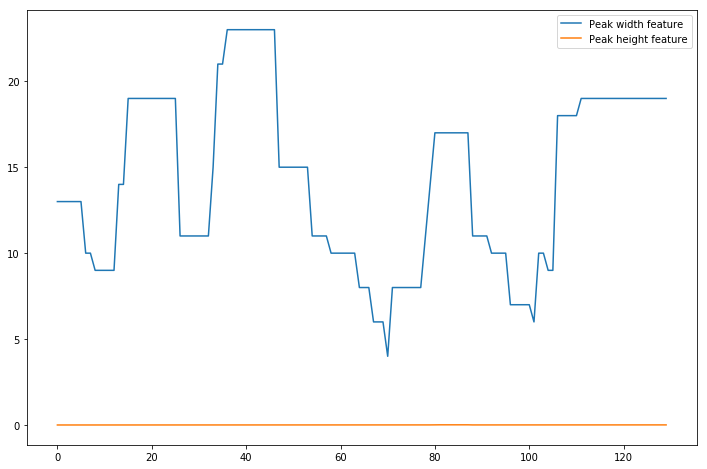

csv frame rate: 30.00230786983614
L End reached - +
R End reached + -
[[1.90000000e+01 6.40128653e-03]
 [1.90000000e+01 6.40128653e-03]
 [1.90000000e+01 6.40128653e-03]
 [1.90000000e+01 6.40128653e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.90000000e+01 2.00406266e-03]
 [1.40000000e+01 8.09422206e-04]
 [1.40000000e+01 8.09422206e-04]
 [1.40000000e+01 8.09422206e-04]
 [1.40000000e+01 8.09422206e-04]
 [1.40000000e+01 8.09422206e-04]
 [1.00000000e+01 2.49972391e-03]
 [1.00000000e+01 2.49972391e-03]
 [1.00000000e+01 2.49972391e-03]
 [1.00000000e+01 8.49106852e-04]
 [1.00000000e+01 8.49106852e-04]
 [1.00000000e+01 8.49106852e-04]
 [1.00000000e+01 8.49106852e-04]
 [1.00000000e+01 8.49106852e-04]
 [7.00000000e+00 8.87525997e-04]
 [7.00

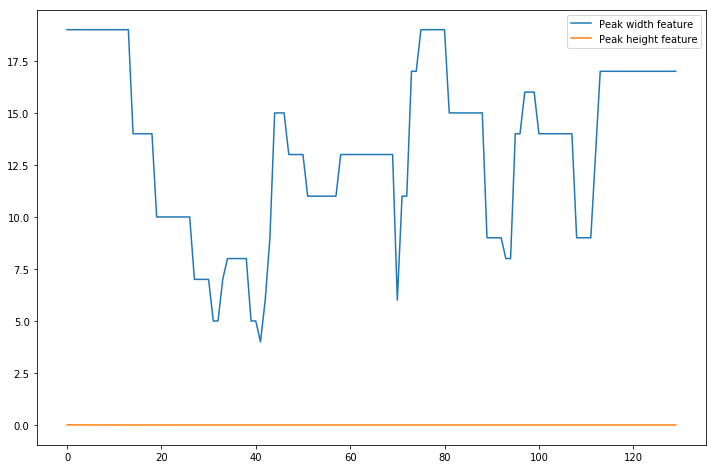


Annotations:
[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 1, 1, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([0., 

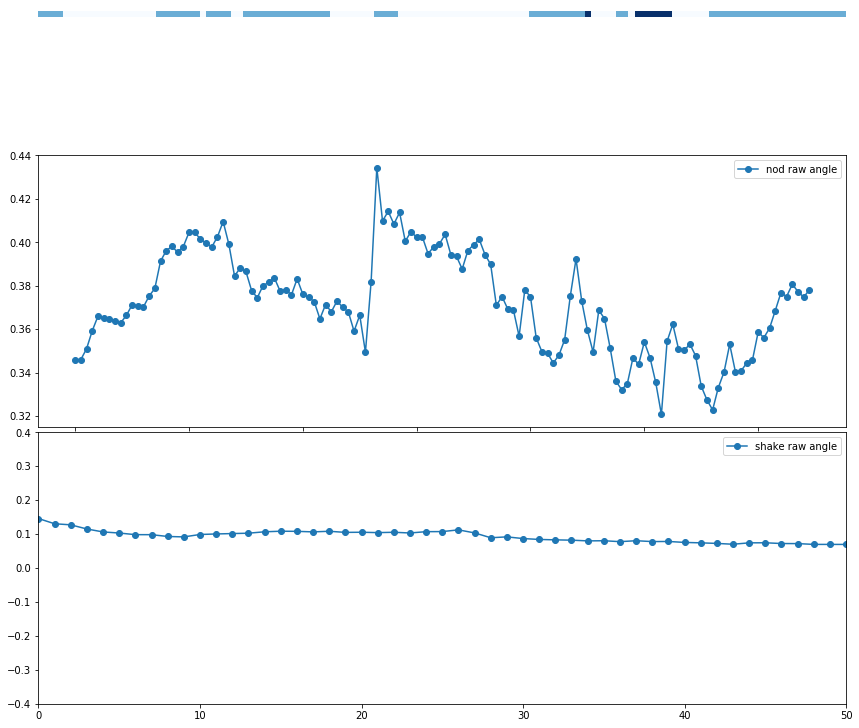

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_HardestDecision/427_HardestDecision_FACE.csv
csv frame rate: 29.999026005649164
L End reached + -
R End reached - +
[[2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.20000000e+01 9.00000000e-03]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 2.20000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.60000000e+01 3.00000000e-02]
 [2.70000000e+01 1.60000000e-02]
 [2.70000000e+01 1.60000000e-0

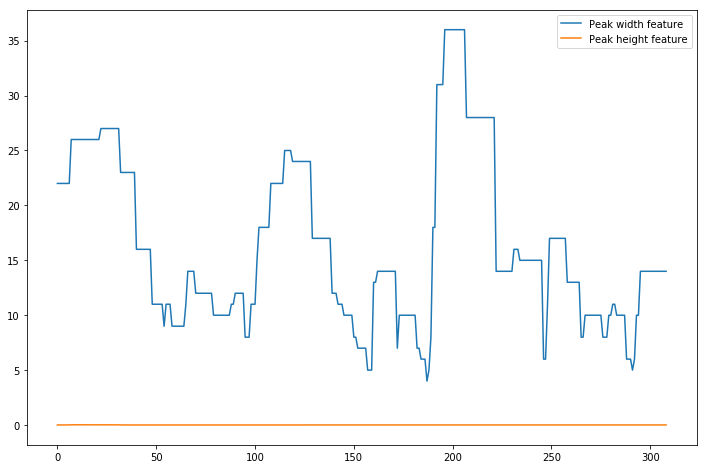

csv frame rate: 29.999026005649164
L End reached + -
R End reached - +
[[1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [1.30000000e+01 2.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.40000000e+01 6.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.60000000e+01 2.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.3

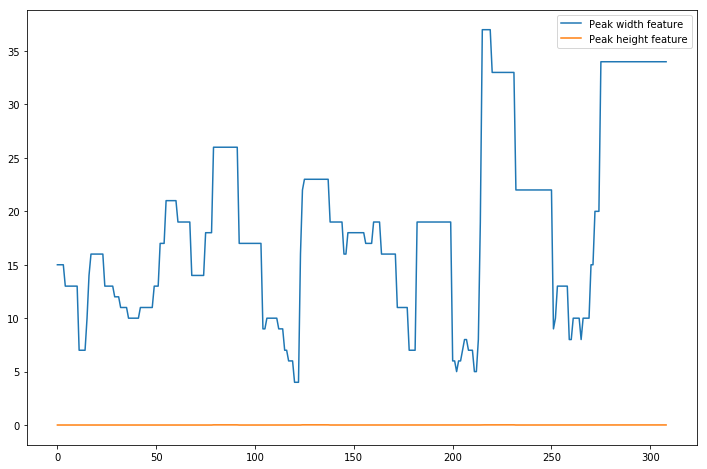


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]),

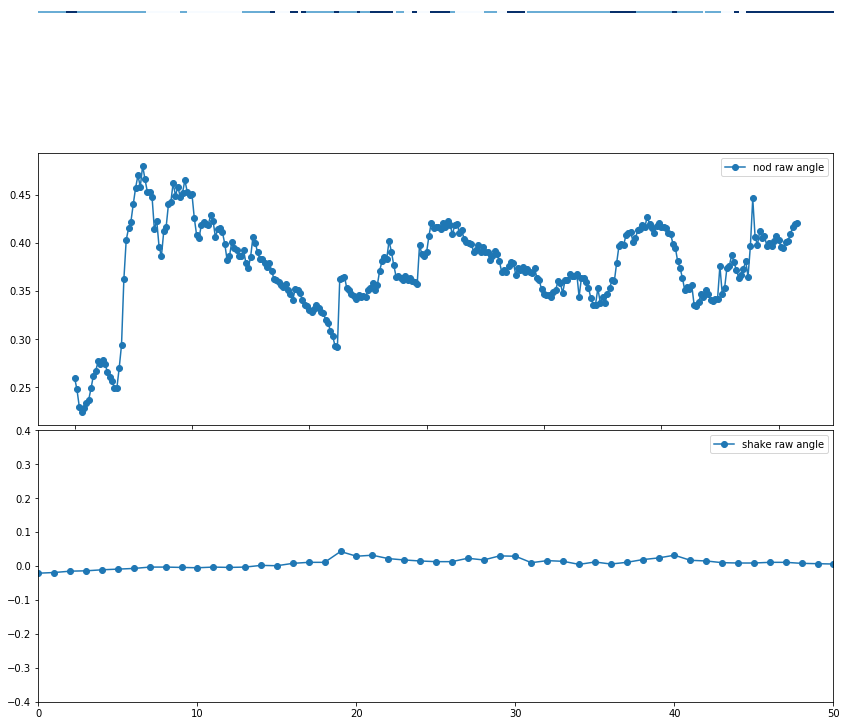

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/427/427_HowCloseToFamily/427_HowCloseToFamily_FACE.csv
csv frame rate: 29.997272975184078
L End reached + -
R End reached + -
[[2.5e+01 1.4e-02]
 [2.5e+01 1.4e-02]
 [2.5e+01 1.4e-02]
 [2.5e+01 1.4e-02]
 [2.5e+01 1.4e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [2.2e+01 2.3e-02]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [1.3e+01 2.0e-03]
 [4.0e+00 2.0e-03]
 [4.0e+00 2.0e-03]
 [1.5e+01 2.0e-03]
 [1.8e+01 1.3e-02]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [2.0e+01 1.0e-03]
 [9.0e+0

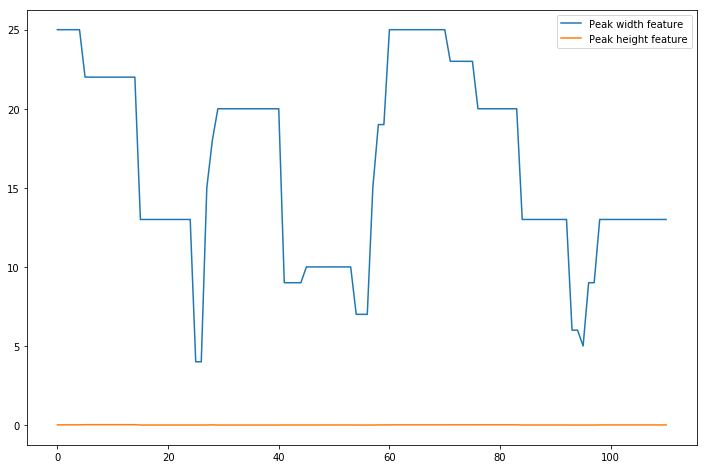

csv frame rate: 29.997272975184078
L End reached - +
R End reached - +
[[2.10000000e+01 1.10000000e-02]
 [2.10000000e+01 1.10000000e-02]
 [2.10000000e+01 1.10000000e-02]
 [2.10000000e+01 1.10000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [2.10000000e+01 1.20000000e-02]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [1.80000000e+01 7.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [2.10000000e+01 3.00000000e-03]
 [1.8

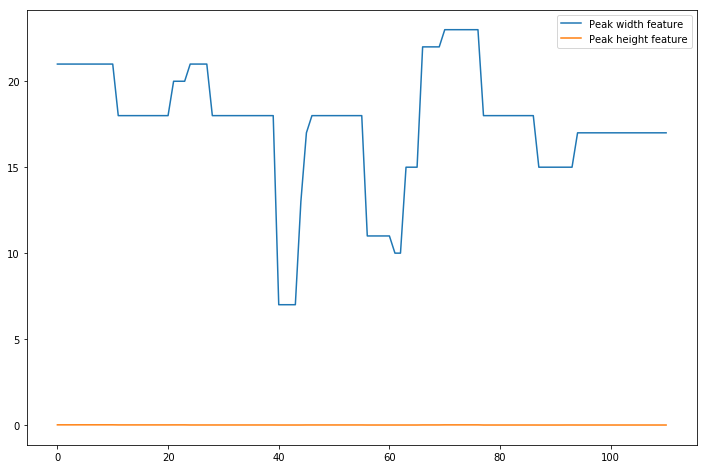


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array

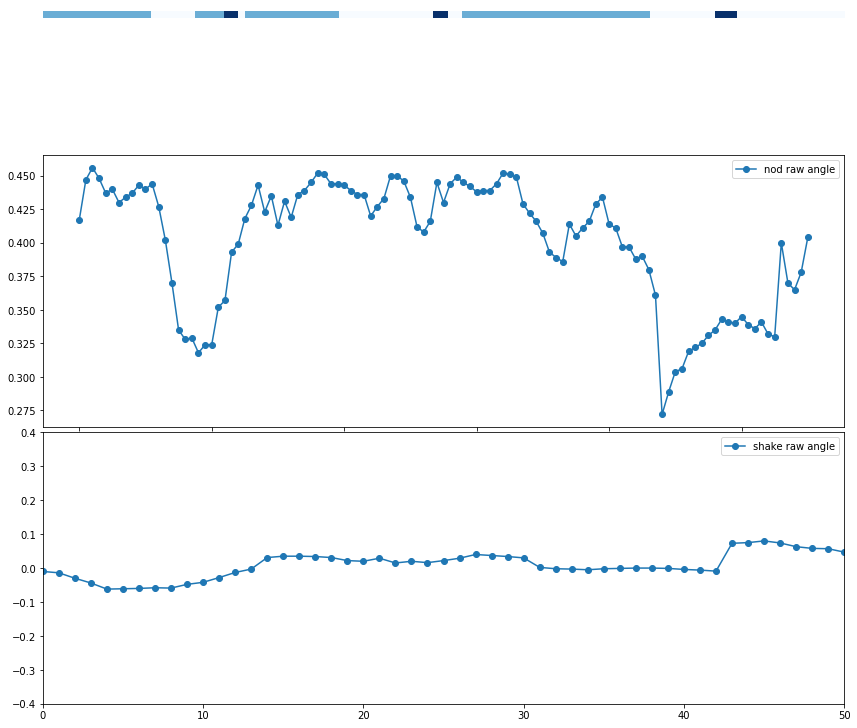

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_HardestDecision/697_HardestDecision_FACE.csv
csv frame rate: 30.00044379354724
L End reached + -
R End reached + -
[[1.70000000e+01 7.06561481e-03]
 [1.70000000e+01 7.06561481e-03]
 [1.70000000e+01 7.06561481e-03]
 ...
 [1.30000000e+01 1.59399865e-02]
 [1.30000000e+01 1.59399865e-02]
 [1.30000000e+01 1.59399865e-02]]


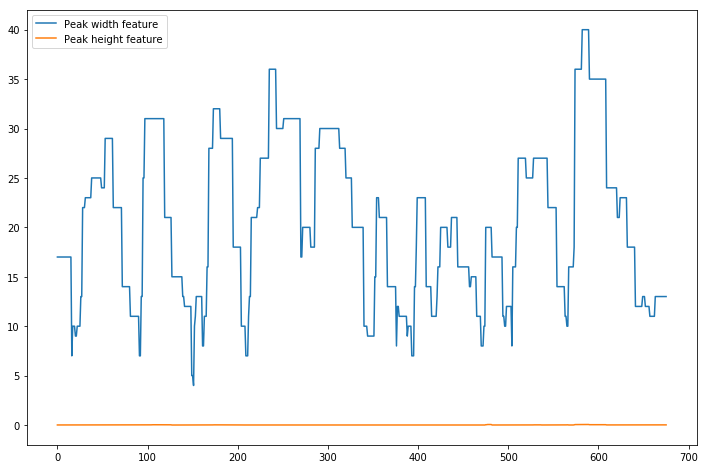

csv frame rate: 30.00044379354724
L End reached - +
R End reached - +
[[1.90000000e+01 9.43680878e-03]
 [1.90000000e+01 9.43680878e-03]
 [1.90000000e+01 9.43680878e-03]
 ...
 [2.00000000e+01 4.00017158e-04]
 [2.00000000e+01 4.00017158e-04]
 [2.00000000e+01 4.00017158e-04]]


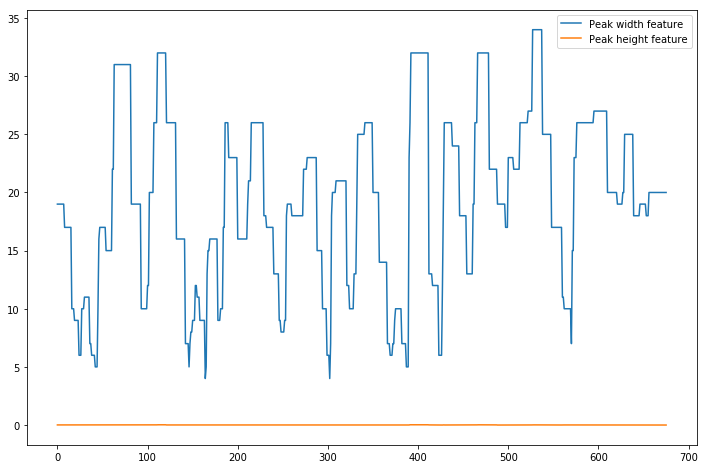


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

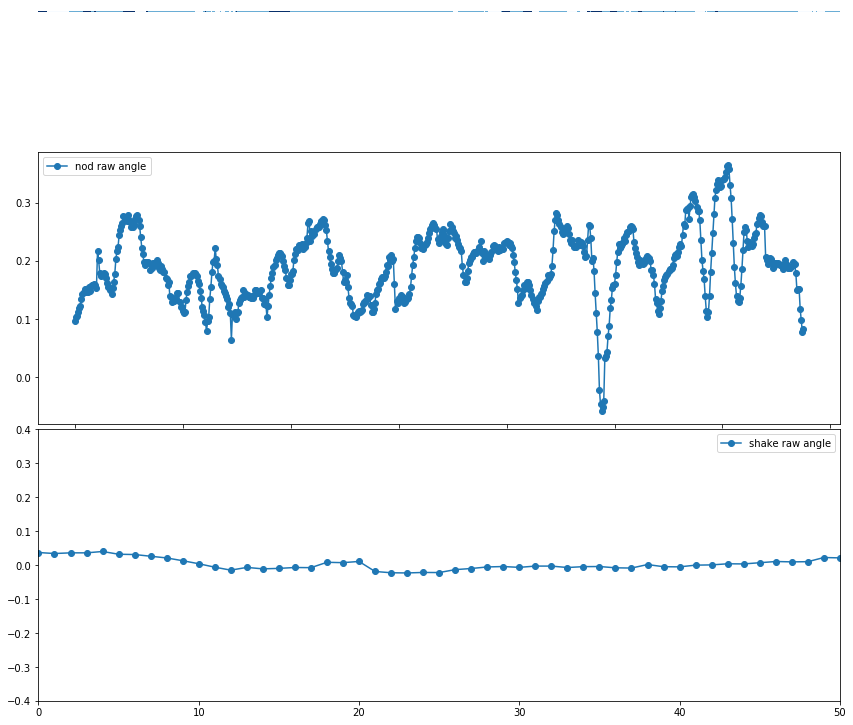

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_EventToErase/697_EventToErase_FACE.csv
csv frame rate: 30.00061602907657
L End reached + -
R End reached + -
[[2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.00000000e+01 1.62849646e-03]
 [2.20000000e+01 1.62849646e-03]
 [2.20000000e+01 1.62849646e-03]
 [2.20000000e+01 1.62849646e-03]
 [2.20000000e+01 1.62849646e-03]
 [2.90000000e+01 2.35316426e-02]
 [3.70000000e+01 1.80260576e-02]
 [3.70000000e+01 1.80260576e-02]
 [3.70000000e+01 1.80260576e-02]
 [3.70000000e+01 1.80260576e-02]
 [3.

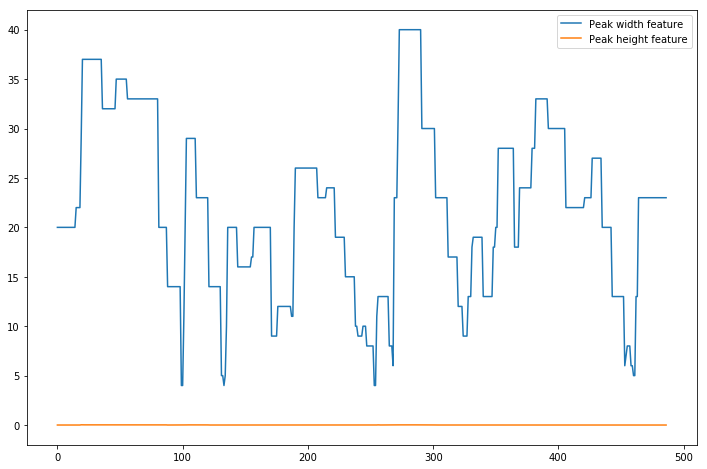

csv frame rate: 30.00061602907657
L End reached - +
R End reached + -
[[1.70000000e+01 3.35278423e-03]
 [1.70000000e+01 3.35278423e-03]
 [1.70000000e+01 3.35278423e-03]
 [1.70000000e+01 3.35278423e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [3.20000000e+01 5.03658571e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.80000000e+01 9.77741323e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50000000e+01 6.09732508e-03]
 [2.50

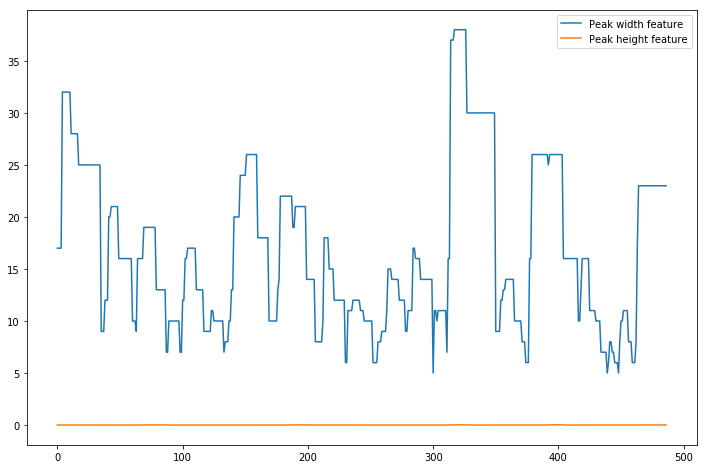


Annotations:
[2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

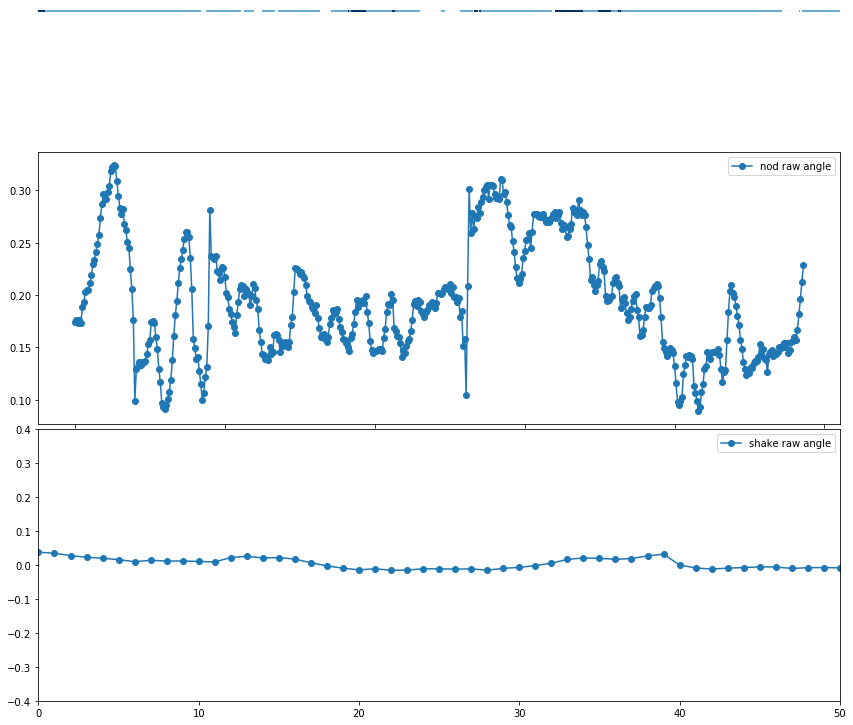

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_Guilty/697_Guilty_FACE.csv
csv frame rate: 29.999546834639965
L End reached + -
R End reached + -
[[3.4e+01 1.6e-02]
 [3.4e+01 1.6e-02]
 [3.4e+01 1.6e-02]
 ...
 [1.7e+01 2.0e-03]
 [1.7e+01 2.0e-03]
 [1.7e+01 2.0e-03]]


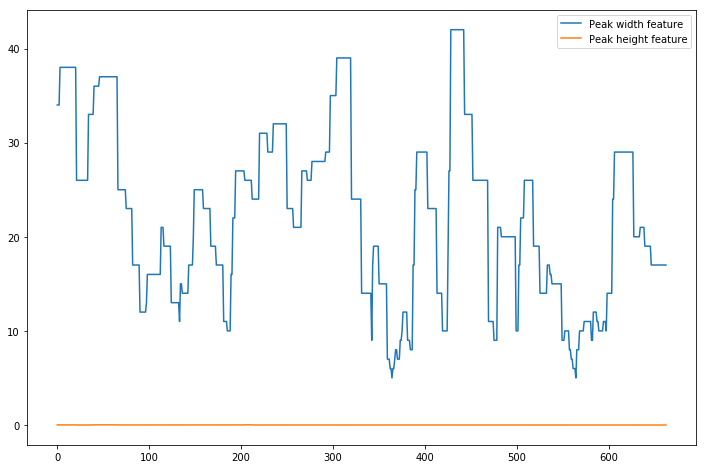

csv frame rate: 29.999546834639965
L End reached + -
R End reached + -
[[8.0000000e+00 7.2858386e-17]
 [8.0000000e+00 7.2858386e-17]
 [8.0000000e+00 7.2858386e-17]
 ...
 [9.0000000e+00 4.0000000e-03]
 [9.0000000e+00 4.0000000e-03]
 [9.0000000e+00 4.0000000e-03]]


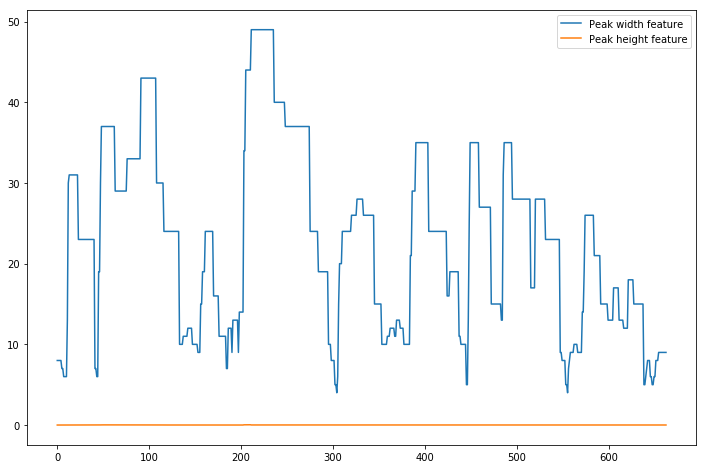


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

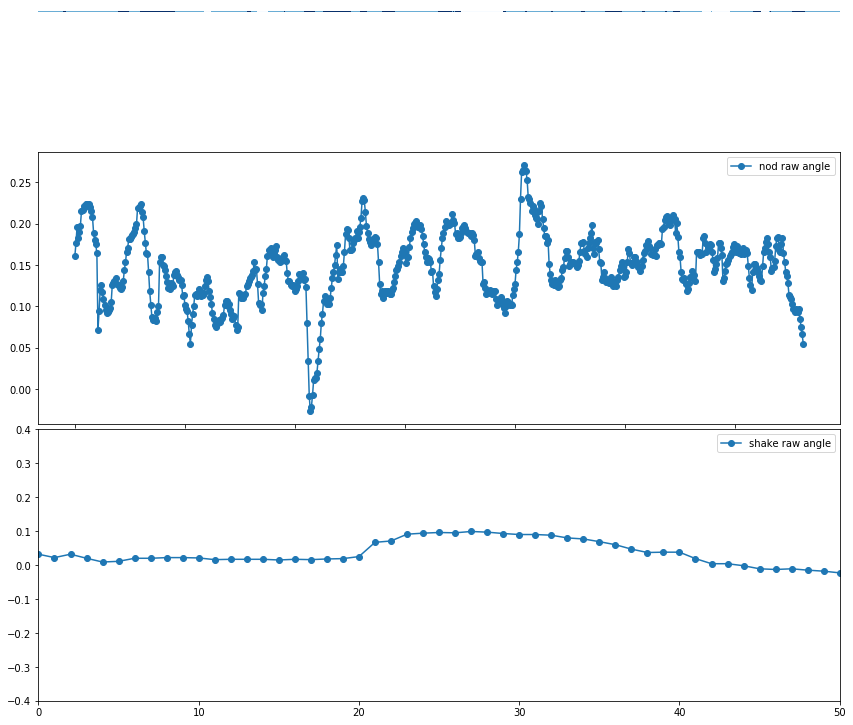

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_LastTimeHappy/697_LastTimeHappy_FACE.csv
csv frame rate: 29.999604226857166
L End reached + -
R End reached + -
[[1.4e+01 3.0e-03]
 [1.4e+01 3.0e-03]
 [1.4e+01 3.0e-03]
 ...
 [1.4e+01 2.0e-03]
 [1.4e+01 2.0e-03]
 [1.4e+01 2.0e-03]]


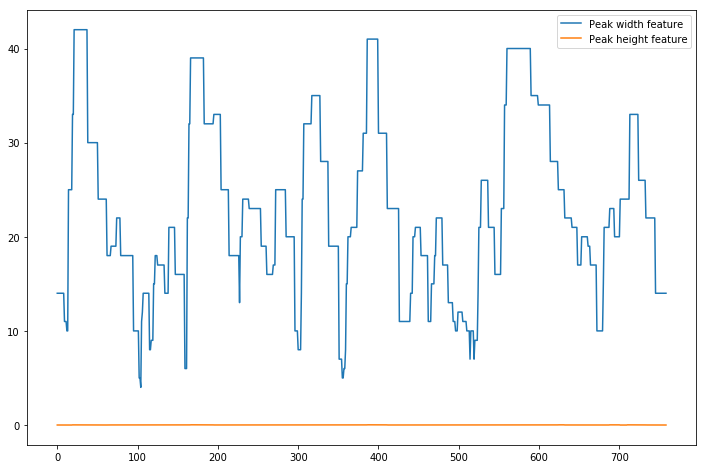

csv frame rate: 29.999604226857166
L End reached + -
R End reached + -
[[2.0e+01 3.0e-03]
 [2.0e+01 3.0e-03]
 [2.0e+01 3.0e-03]
 ...
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]]


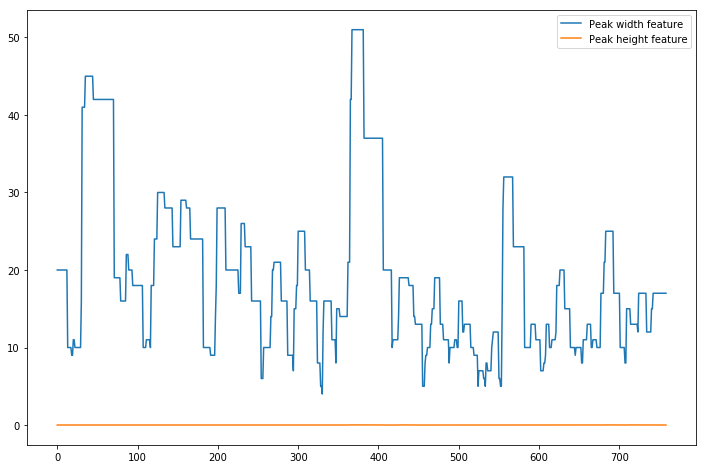


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

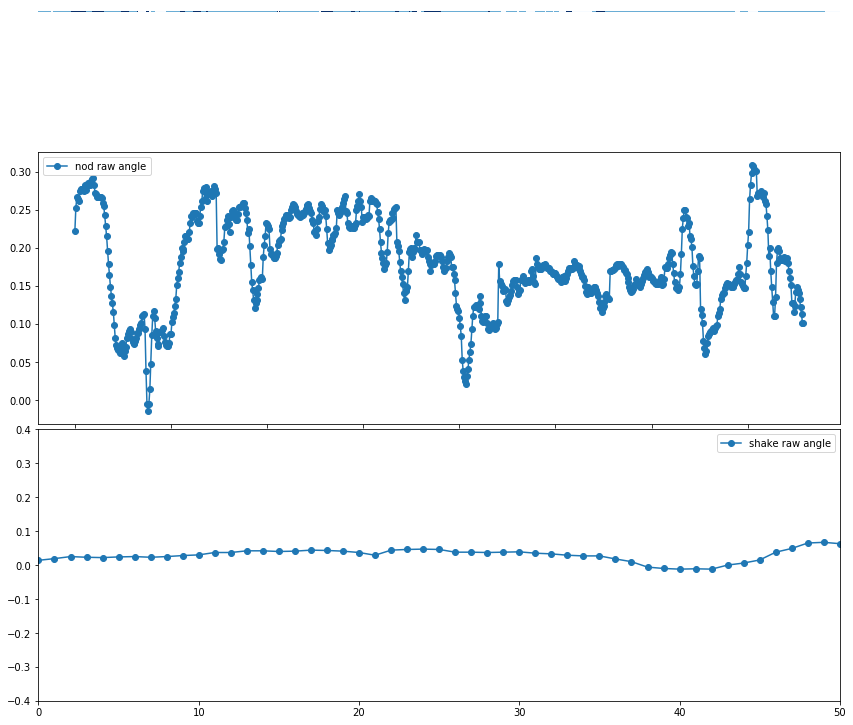

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_LastArgument/697_LastArgument_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.90000000e+01 4.00000000e-03]
 [1.90000000e+01 4.00000000e-03]
 [1.90000000e+01 4.00000000e-03]
 [2.80000000e+01 1.20000000e-02]
 [2.80000000e+01 1.20000000e-02]
 [2.80000000e+01 1.20000000e-02]
 [2.80000000e+01 1.20000000e-02]
 [2.80000000e+01 1.20000000e-02]
 [2.80000000e+01 1.20000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [2.50000000e+01 2.00000000e-02]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 

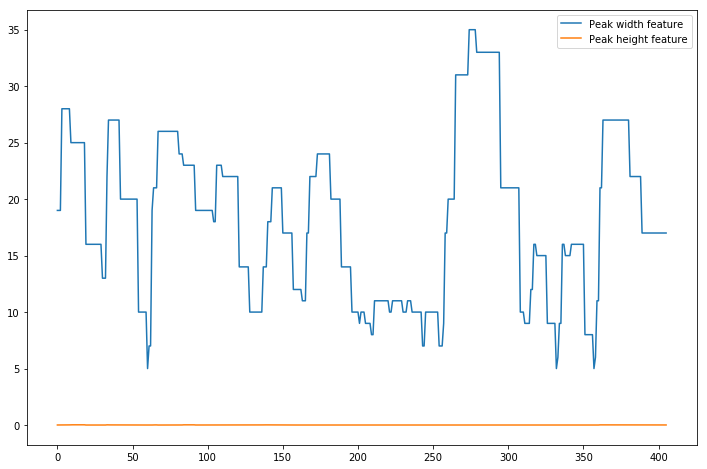

csv frame rate: 30.0
L End reached - +
R End reached - +
[[9.00000000e+00 5.55111512e-17]
 [9.00000000e+00 5.55111512e-17]
 [9.00000000e+00 5.55111512e-17]
 [9.00000000e+00 5.55111512e-17]
 [9.00000000e+00 5.55111512e-17]
 [1.00000000e+01 5.55111512e-17]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 6.00000000e-03]
 [1.10000000e+01 6.00000000e-03]
 [1.10000000e+01 6.00000000e-03]
 [1.10000000e+01 6.00000000e-03]
 [1.10000000e+01 6.00000000e-03]
 [9.00000000e+00 6.00000000e-03]
 [9.00000000e+00 6.00000000e-03]
 [1.00000000e+01 6.93889390e-17]
 [1.00000000e+01 6.93889390e-17]
 [1.00000000e+01 6.93889390e-17]
 [1.00000000e+01 2.77555756e-17]
 [1.00000000e+01 2.77555756e-17]
 [1.00000000e+01 2.77555756e-17]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.10000000e+01 5.

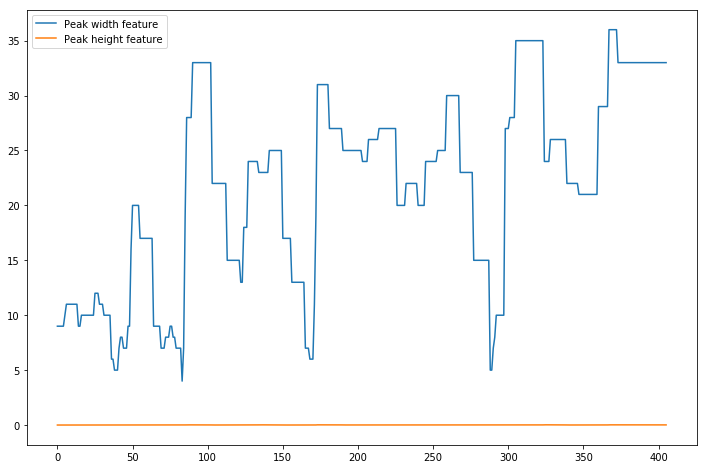


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1

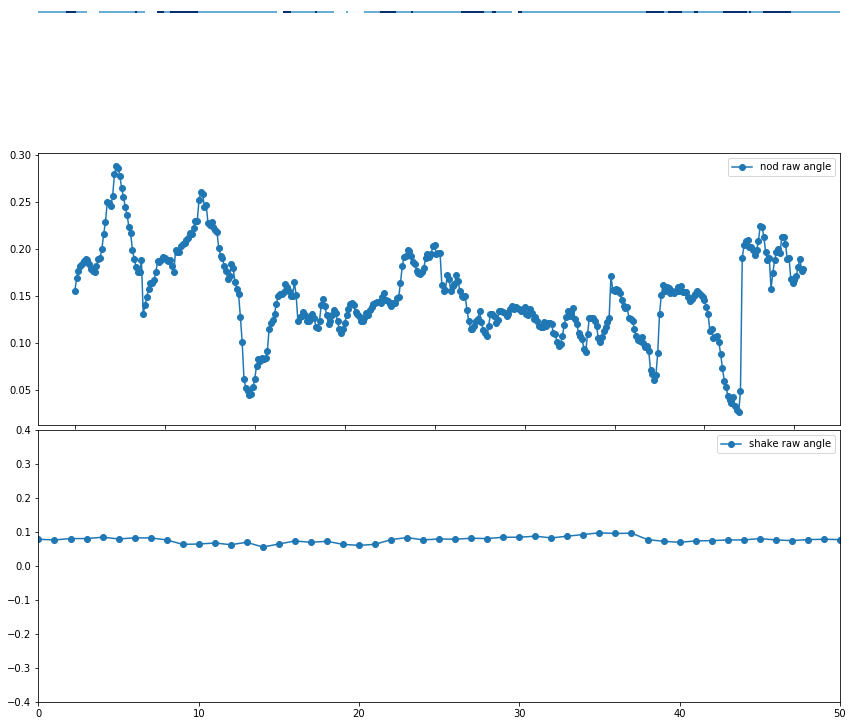

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_HowCloseToFamily/697_HowCloseToFamily_FACE.csv
csv frame rate: 30.0004360528496
L End reached + -
R End reached - +
[[1.10000000e+01 1.09160940e-03]
 [1.10000000e+01 1.09160940e-03]
 [1.10000000e+01 1.09160940e-03]
 ...
 [2.80000000e+01 1.50892405e-02]
 [2.80000000e+01 1.50892405e-02]
 [2.80000000e+01 1.50892405e-02]]


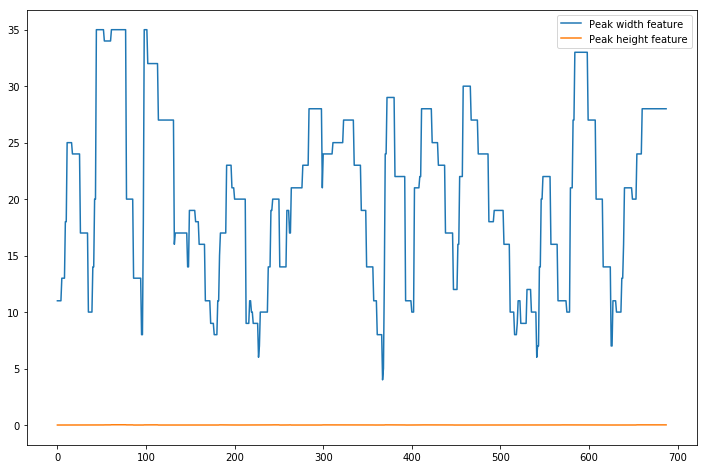

csv frame rate: 30.0004360528496
L End reached + -
R End reached - +
[[1.50000000e+01 2.78519642e-04]
 [1.50000000e+01 2.78519642e-04]
 [1.50000000e+01 2.78519642e-04]
 ...
 [1.00000000e+01 9.96933974e-04]
 [1.00000000e+01 9.96933974e-04]
 [1.00000000e+01 9.96933974e-04]]


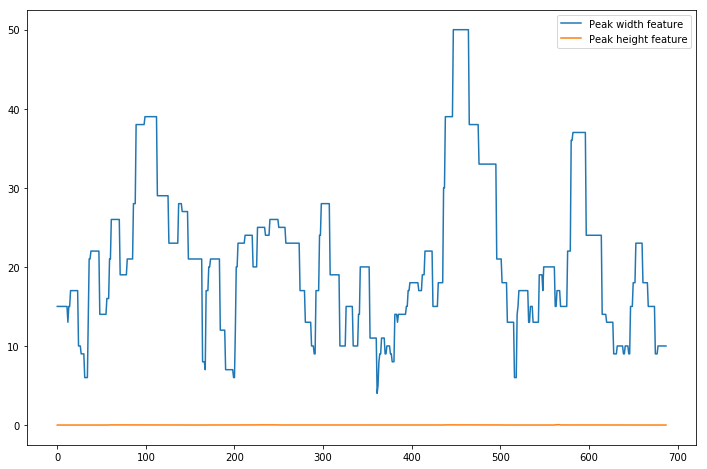


Annotations:
[2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 0, 0, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

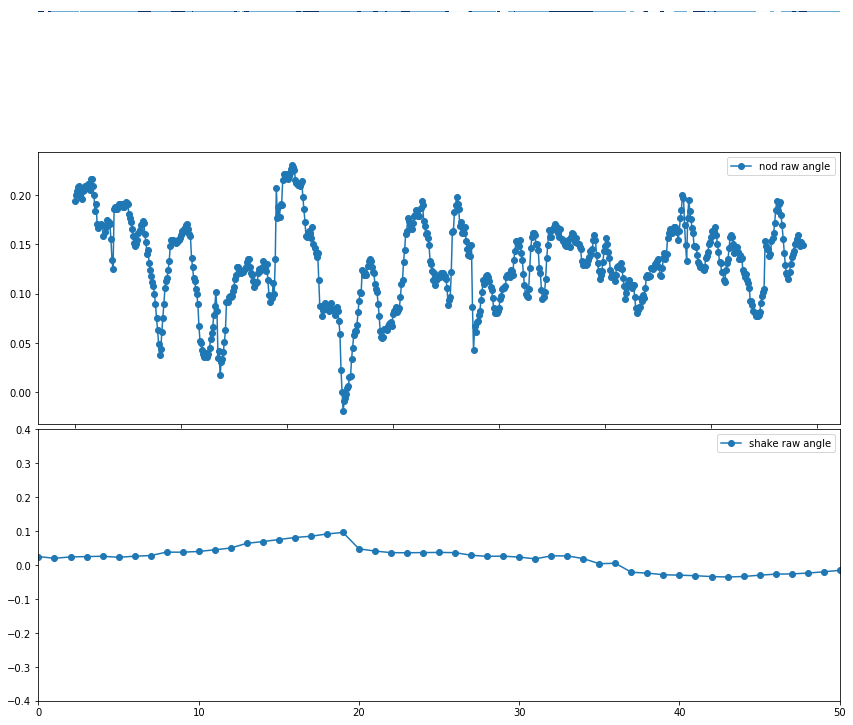

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_MostProudOf/697_MostProudOf_FACE.csv
csv frame rate: 30.002479543763943
L End reached - +
R End reached - +
[[1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [1.30000000e+01 1.21558275e-04]
 [4.00000000e+00 1.21558275e-04]
 [5.00000000e+00 2.41849579e-03]
 [5.00000000e+00 2.64375225e-03]
 [6.00000000e+00 1.37956453e-05]
 [6.00000000e+00 1.37956453e-05]
 [5.00000000e+00 1.37956453e-05]
 [5.00000000e+00 1.37956453e-05]
 [5.00000000e+00 1.37956453e-05]
 [4.00000000e+00 1.37956453e-05]
 [4.00000000e+00 1.37956453e-05]
 [4.00000000e+00 1.37956453e-05]
 [9.00000000e+00 1.37956453e-05]
 [1.00000000e+01 5.18883829e-03]
 [1.0

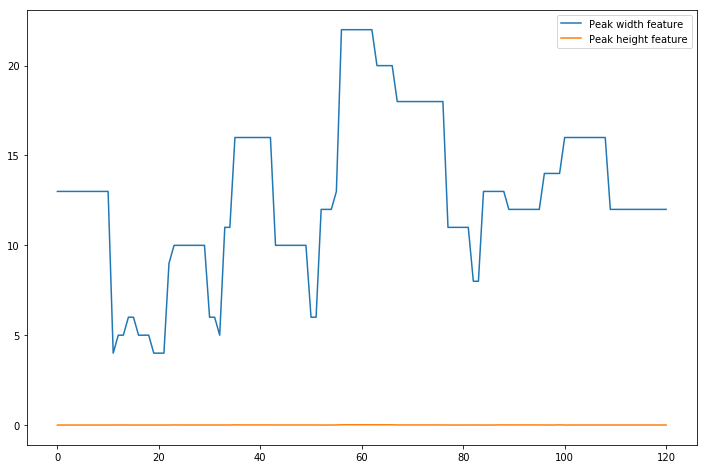

csv frame rate: 30.002479543763943
L End reached + -
R End reached - +
[[1.00000000e+01 1.51277471e-03]
 [1.00000000e+01 1.51277471e-03]
 [1.00000000e+01 1.51277471e-03]
 [1.00000000e+01 1.51277471e-03]
 [1.00000000e+01 1.51277471e-03]
 [7.00000000e+00 8.73946549e-04]
 [7.00000000e+00 8.73946549e-04]
 [7.00000000e+00 7.94662694e-04]
 [7.00000000e+00 7.94662694e-04]
 [7.00000000e+00 7.94662694e-04]
 [1.00000000e+01 7.94662694e-04]
 [1.00000000e+01 2.98342835e-03]
 [1.00000000e+01 2.98342835e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.40000000e+01 2.04502286e-03]
 [1.50000000e+01 2.92633359e-03]
 [2.20000000e+01 2.14435802e-02]
 [2.20000000e+01 2.14435802e-02]
 [2.20000000e+01 2.14435802e-02]
 [2.20000000e+01 2.14435802e-02]
 [2.20000000e+01 2.14435802e-02]
 [2.20000000e+01 2.14435802e-02]
 [1.80000000e+01 2.21723674e-02]
 [1.80000000e+01 2.21723674e-02]
 [1.8

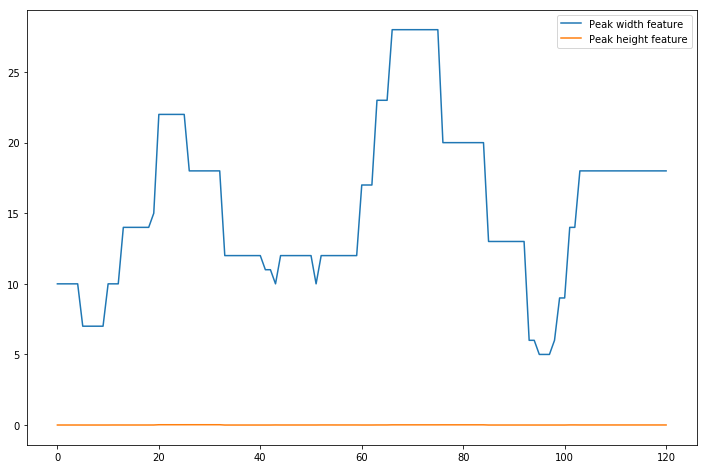


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.

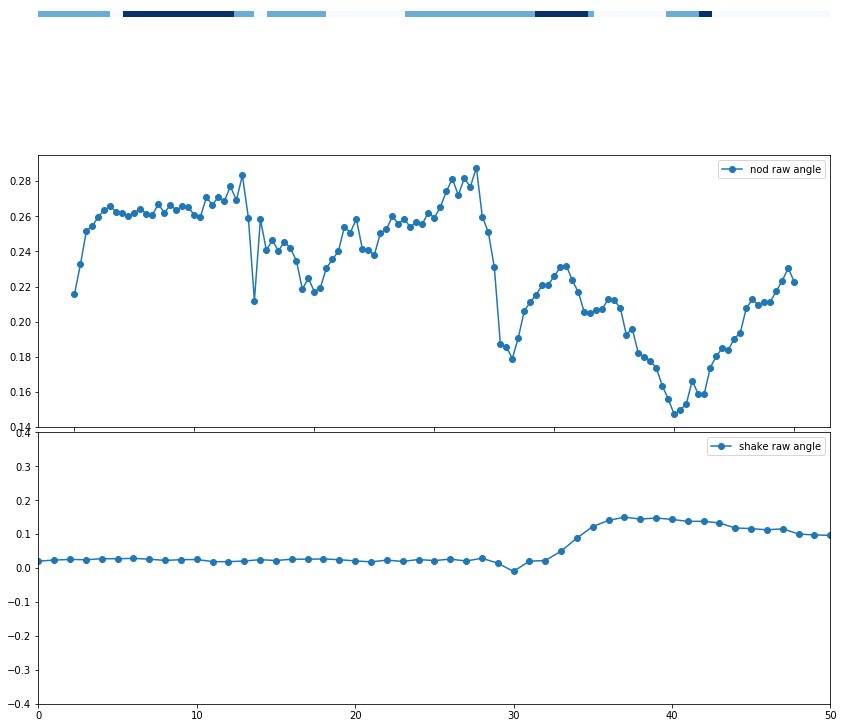

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/697/697_SituationHandledDifferent/697_SituationHandledDifferent_FACE.csv
csv frame rate: 30.000824198466994
L End reached - +
R End reached - +
[[3.00000000e+01 9.01436154e-03]
 [3.00000000e+01 9.01436154e-03]
 [3.00000000e+01 9.01436154e-03]
 [3.00000000e+01 9.01436154e-03]
 [3.00000000e+01 9.01436154e-03]
 [3.00000000e+01 9.01436154e-03]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.40000000e+01 1.09391825e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.20000000e+01 1.83589600e-02]
 [3.200000

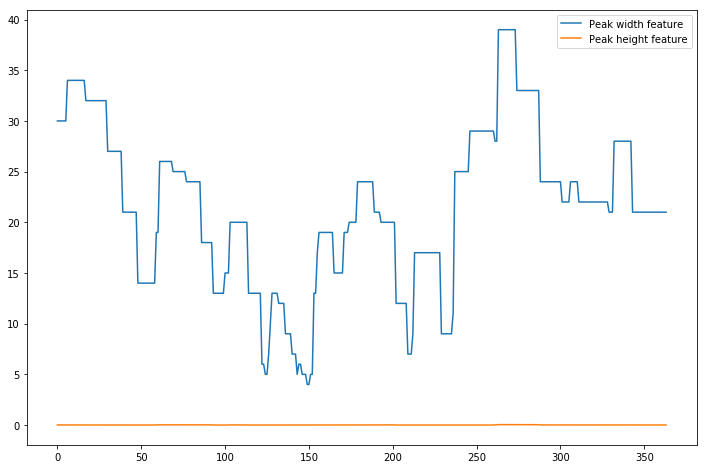

csv frame rate: 30.000824198466994
L End reached - +
R End reached - +
[[2.50000000e+01 1.26999188e-02]
 [2.50000000e+01 1.26999188e-02]
 [2.50000000e+01 1.26999188e-02]
 [2.50000000e+01 1.26999188e-02]
 [2.50000000e+01 1.26999188e-02]
 [2.50000000e+01 1.26999188e-02]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 7.98559881e-03]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [3.30000000e+01 1.09277347e-02]
 [2.80000000e+01 1.04308727e-02]
 [2.80000000e+01 1.04308727e-02]
 [2.80000000e+01 1.04308727e-02]
 [2.8

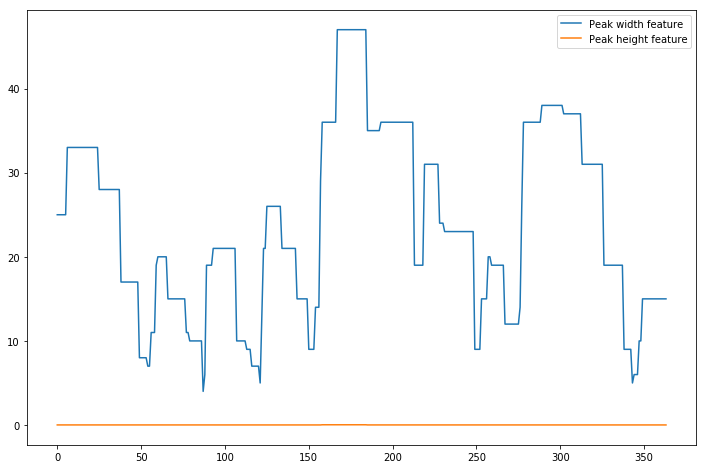


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 1, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1

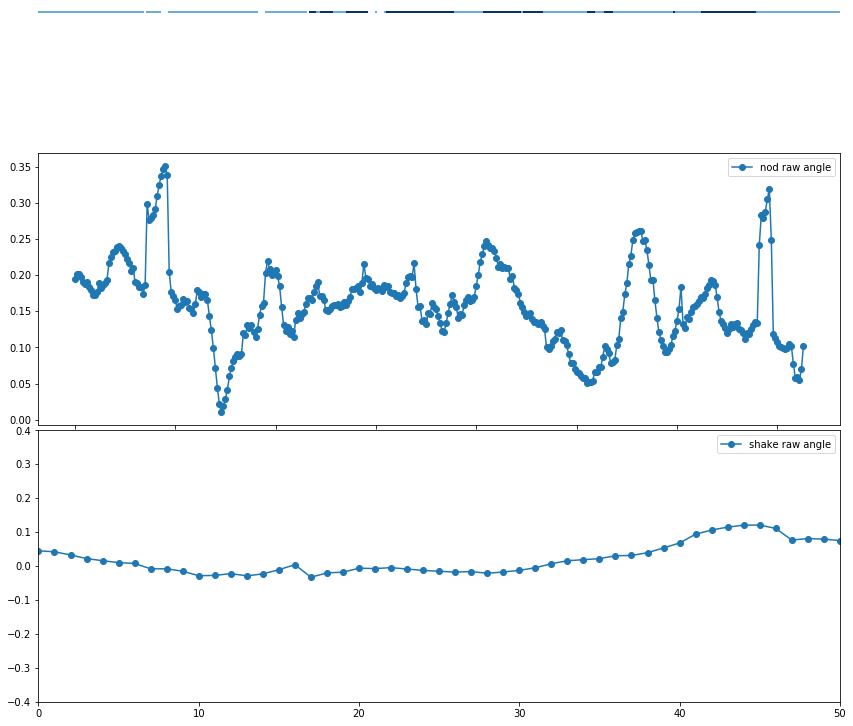

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_LastArgument/705_LastArgument_FACE.csv
csv frame rate: 29.998064640990904
L End reached + -
R End reached - +
[[2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.90000000e+01 3.30000000e-02]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [2.00000000e+01 5.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1.30000000e+01 3.00000000e-03]
 [1

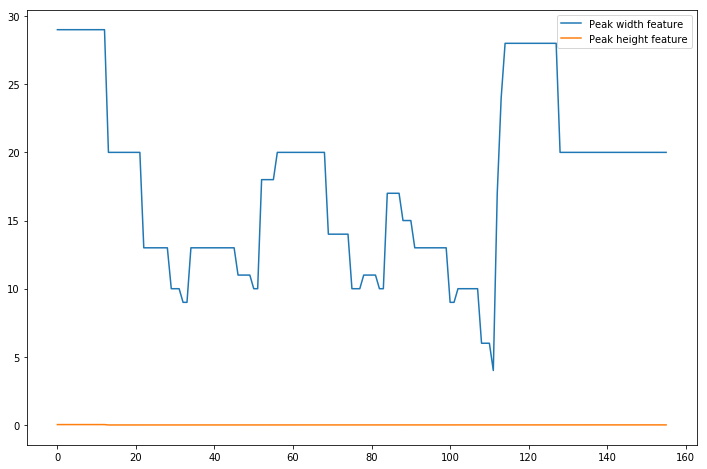

csv frame rate: 29.998064640990904
L End reached + -
R End reached - +
[[1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [2.0e+01 4.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.8e+01 2.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.8e+01 3.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [3.3e+01 6.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03

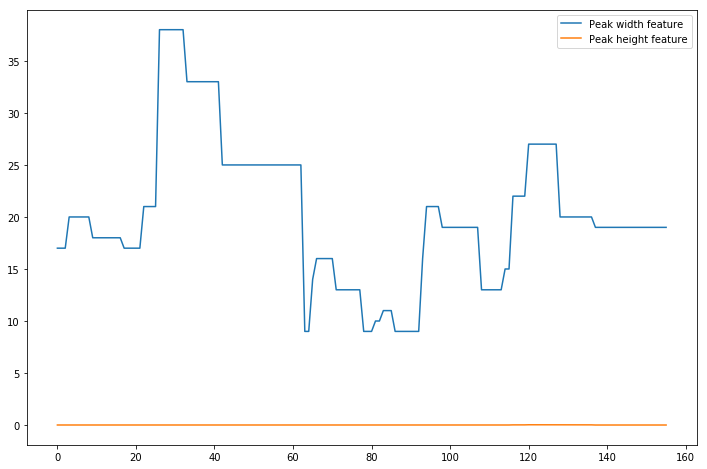


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.

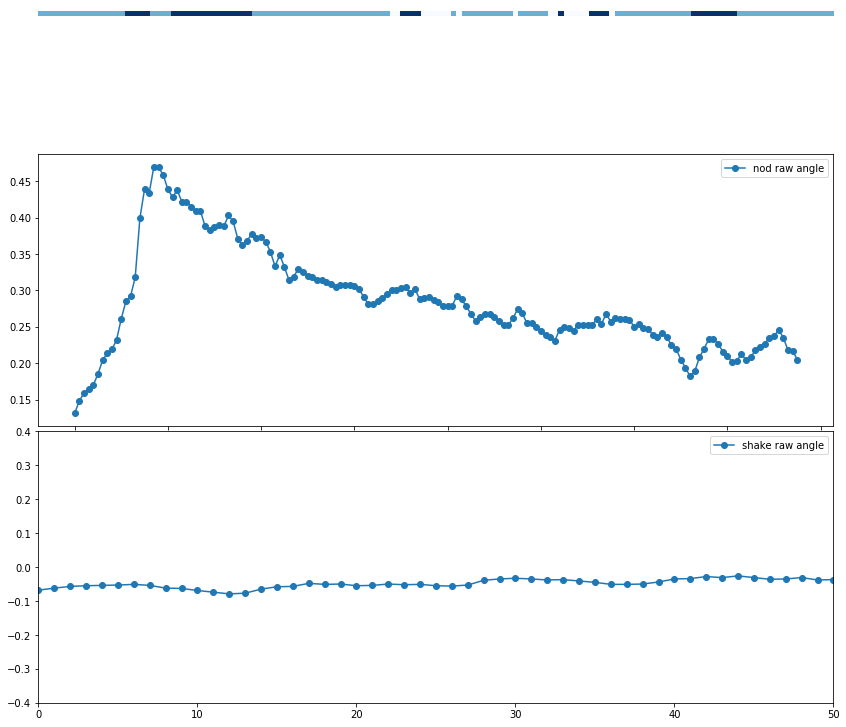

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_HardestDecision/705_HardestDecision_FACE.csv
csv frame rate: 30.002158428663932
L End reached + -
R End reached - +
[[8.00000000e+00 4.62578831e-03]
 [8.00000000e+00 4.62578831e-03]
 [8.00000000e+00 4.62578831e-03]
 [8.00000000e+00 4.62578831e-03]
 [8.00000000e+00 4.62578831e-03]
 [5.00000000e+00 6.16173174e-04]
 [8.00000000e+00 6.16173174e-04]
 [8.00000000e+00 6.16173174e-04]
 [1.30000000e+01 6.16173174e-04]
 [1.40000000e+01 4.32526940e-03]
 [1.40000000e+01 4.32526940e-03]
 [1.40000000e+01 4.32526940e-03]
 [1.40000000e+01 4.32526940e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.60000000e+01 2.43492024e-03]
 [1.70000000e+01 2.54486344e-03]
 [1.70000000e+01 2.54486344e-03]
 [2.30000000e+01 3.66107372e-03]
 [2.30000000e+01 3.66107372e-0

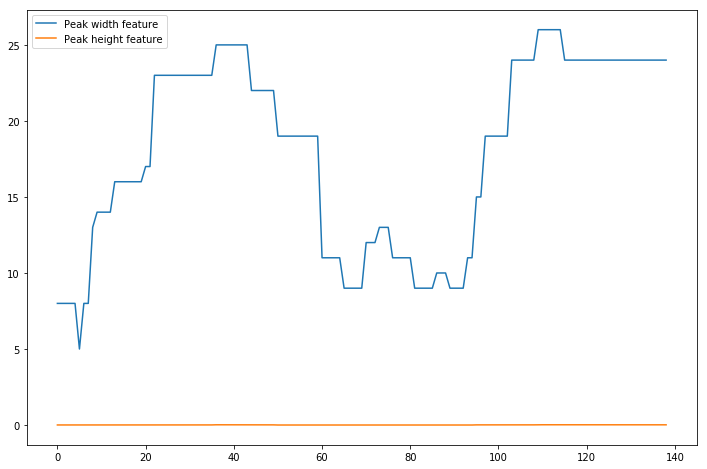

csv frame rate: 30.002158428663932
L End reached + -
R End reached + -
[[1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.70000000e+01 2.38121449e-03]
 [1.00000000e+01 2.01442097e-03]
 [1.00000000e+01 2.01442097e-03]
 [1.00000000e+01 2.01442097e-03]
 [1.00000000e+01 2.01442097e-03]
 [7.00000000e+00 4.47284023e-03]
 [7.00000000e+00 4.47284023e-03]
 [9.00000000e+00 1.69380316e-03]
 [9.00000000e+00 1.69380316e-03]
 [9.00000000e+00 1.69380316e-03]
 [1.50000000e+01 1.97806249e-03]
 [1.50000000e+01 1.39158222e-03]
 [1.50000000e+01 1.39158222e-03]
 [1.50000000e+01 1.39158222e-03]
 [1.50000000e+01 1.39158222e-03]
 [1.20000000e+01 5.35593008e-04]
 [1.20000000e+01 5.35593008e-04]
 [1.20000000e+01 5.35593008e-04]
 [1.2

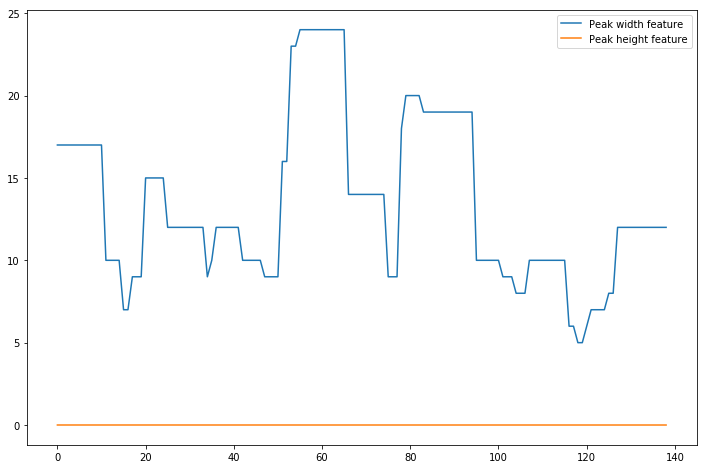


Annotations:
[0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 0., 1.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array

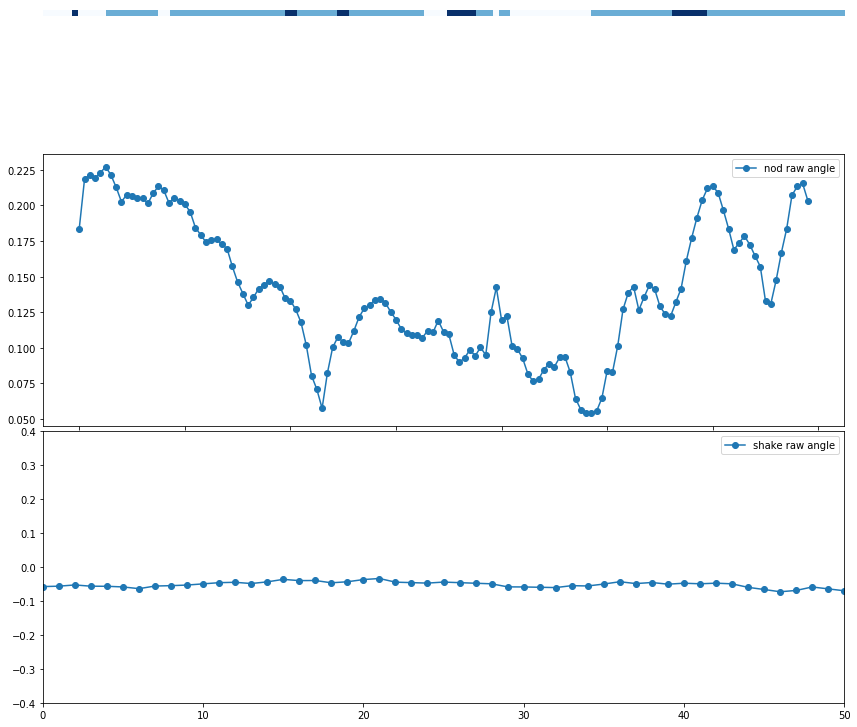

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_SituationHandledDifferent/705_SituationHandledDifferent_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached + -
[[3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [3.20000000e+01 7.00000000e-03]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [2.80000000e+01 1.10000000e-02]
 [3.50000000e+01 9.00000

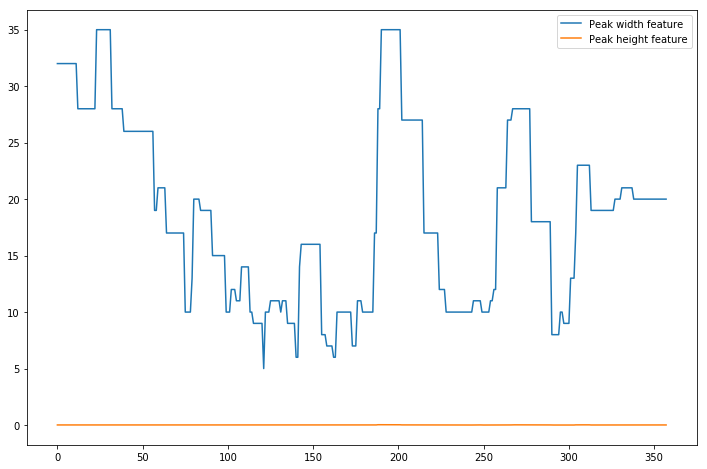

csv frame rate: 30.0
L End reached + -
R End reached - +
[[1.90000000e+01 1.00000000e-03]
 [1.90000000e+01 1.00000000e-03]
 [1.90000000e+01 1.00000000e-03]
 [2.60000000e+01 3.90000000e-02]
 [2.60000000e+01 3.90000000e-02]
 [2.60000000e+01 3.90000000e-02]
 [2.60000000e+01 3.90000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.90000000e+01 4.40000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.50000000e+01 1.80000000e-02]
 [2.80000000e+01 1.

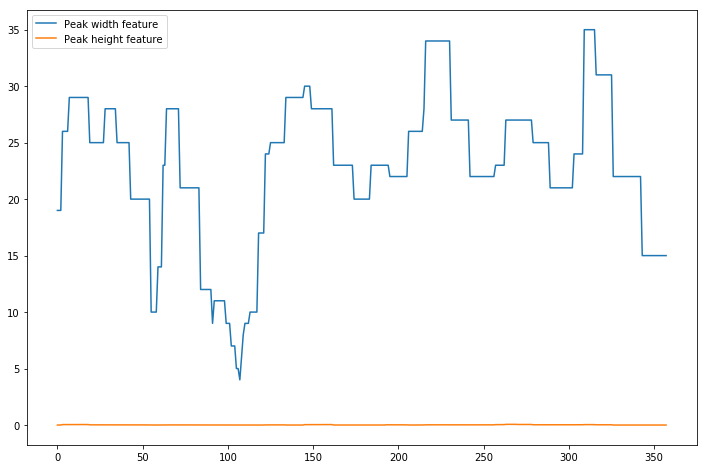


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

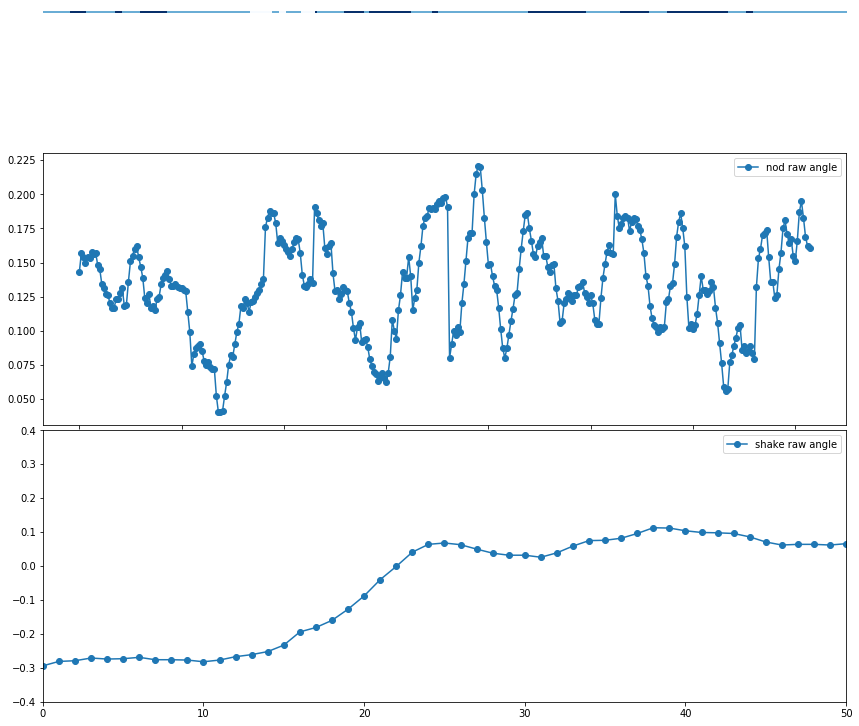

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_EventToErase/705_EventToErase_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 6.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.80000000e+01 8.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.20000000e+01 3.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.00000000e+01 7.00000000e-03]
 [1.00000000e+01 7.00000000e-03]
 [1.00000000e+01 

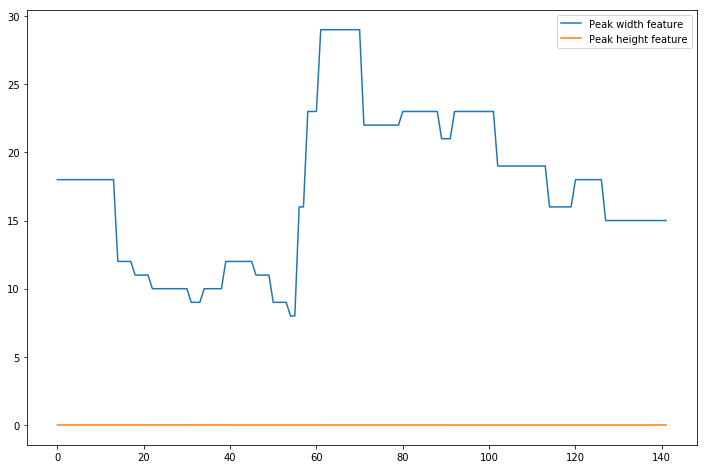

csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.9e+01 3.0e-03]
 [1.9e+01 3.0e-03]
 [1.9e+01 3.0e-03]
 [1.9e+01 3.0e-03]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [1.4e+01 1.2e-02]
 [2.1e+01 3.0e-03]
 [2.1e+01 3.0e-03]
 [2.1e+01 3.0e-03]
 [2.1e+01 3.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 8.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [1.0e+01 4.0e-03]
 [1.0e+01 4.0e-03]
 [1.0e+01 4.0e-03]
 [1.0e+01 4.0e-03]
 [1.0e+01 4.0e-03]
 [1.0e+01 2.0e-03]
 [1.0e+01 2.0e-03]
 [9.0e+00 2.0e-03]
 [9.0e+00 2.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.

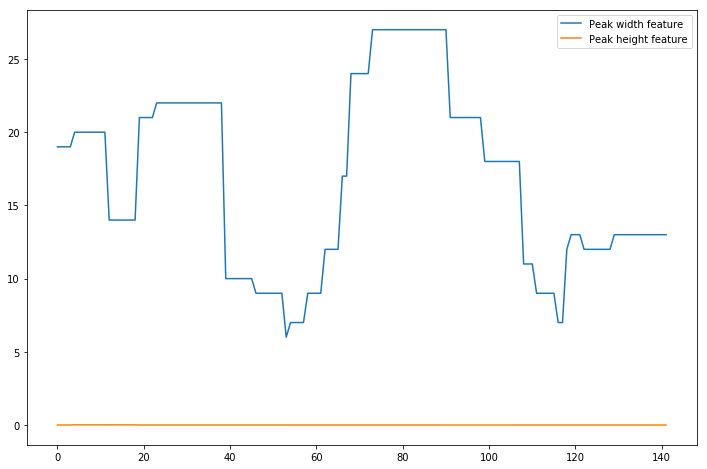


Annotations:
[1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

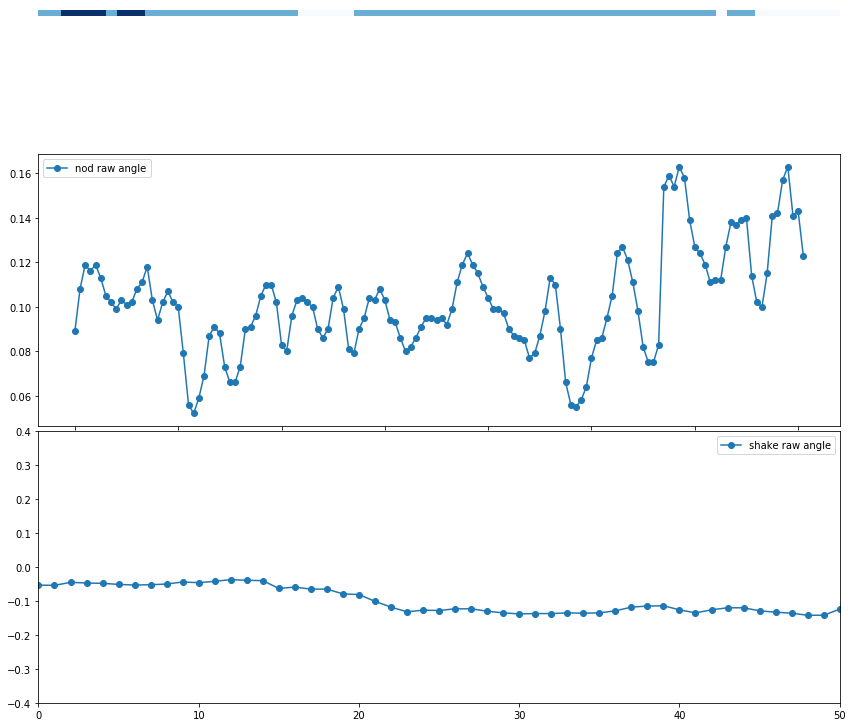

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_MostProudOf/705_MostProudOf_FACE.csv
csv frame rate: 30.008110300081107
L End reached - +
R End reached - +
[[1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.60000000e+01 2.26795421e-02]
 [1.00000000e+01 1.42095657e-02]
 [1.00000000e+01 1.42095657e-02]
 [1.00000000e+01 1.42095657e-02]
 [1.00000000e+01 1.42095657e-02]
 [1.10000000e+01 1.05410814e-02]
 [1.10000000e+01 1.05410814e-02]
 [1.10000000e+01 1.05410814e-02]
 [1.10000000e+01 1.05410814e-02]
 [1.50000000e+01 1.36583265e-02]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.00000000e+01 6.76494522e-03]
 [2.0

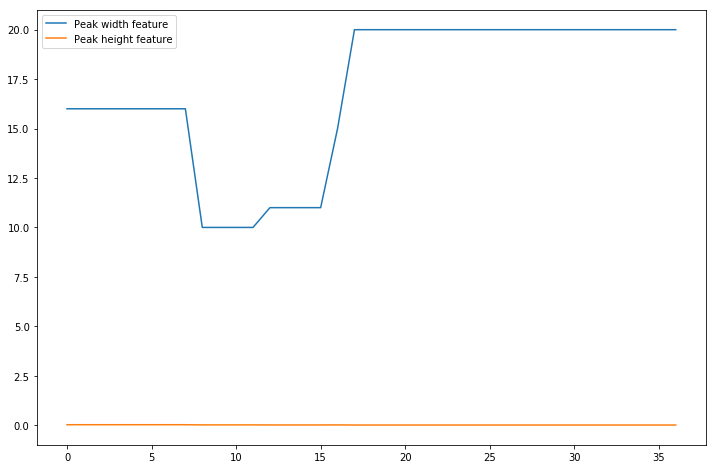

csv frame rate: 30.008110300081107
L End reached + -
R End reached - +
[[2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.20000000e+01 1.53920114e-02]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.70000000e+01 5.89874999e-03]
 [2.7

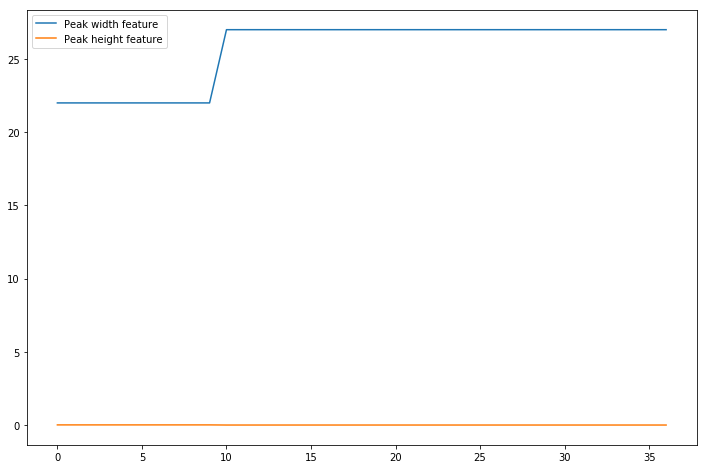


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.])]


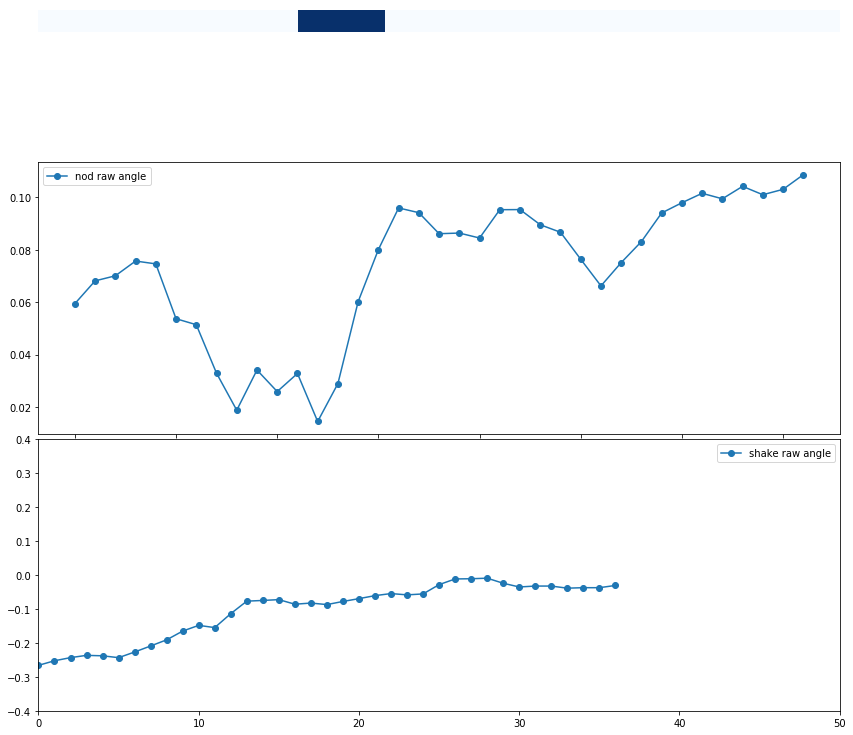

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_Guilty/705_Guilty_FACE.csv
csv frame rate: 30.000000000000004
L End reached - +
R End reached + -
[[1.70000000e+01 1.30896894e-03]
 [1.70000000e+01 1.30896894e-03]
 [1.70000000e+01 1.30896894e-03]
 [1.70000000e+01 1.30896894e-03]
 [1.70000000e+01 1.30896894e-03]
 [1.70000000e+01 1.30896894e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.40000000e+01 1.67937009e-03]
 [1.10000000e+01 7.59555839e-04]
 [1.10000000e+01 7.59555839e-04]
 [1.10000000e+01 7.59555839e-04]
 [1.10000000e+01 7.59555839e-04]
 [1.10000000e+01 7.59555839e-04]
 [1.40000000e+01 8.54906192e-03]
 [1.40000000e+01 8.54906192e-03]
 [1.60000000e+01 1.44328319e-02]
 [1.60000000e+01 1.44328319e-02]
 [1.60000000e+01 1.44328319e-02]
 [1.90000000e+01 1.68607761e-03]
 [1.90000000e+01 1.68607761e-03]
 [1.90000000e+0

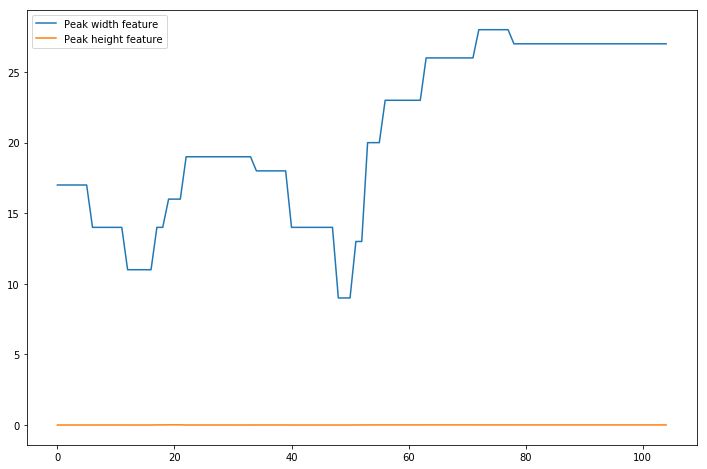

csv frame rate: 30.000000000000004
L End reached - +
R End reached + -
[[2.00000000e+01 9.64479810e-03]
 [2.00000000e+01 9.64479810e-03]
 [2.00000000e+01 9.64479810e-03]
 [2.00000000e+01 9.64479810e-03]
 [2.00000000e+01 9.64479810e-03]
 [2.00000000e+01 9.64479810e-03]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.89149855e-02]
 [2.10000000e+01 3.60298447e-02]
 [2.10000000e+01 3.60298447e-02]
 [2.10000000e+01 3.60298447e-02]
 [2.10000000e+01 3.60298447e-02]
 [2.10000000e+01 3.60298447e-02]
 [2.10000000e+01 3.60298447e-02]
 [1.90000000e+01 7.66791090e-03]
 [1.90000000e+01 7.66791090e-03]
 [1.90000000e+01 7.66791090e-03]
 [1.90000000e+01 7.66791090e-03]
 [1.90000000e+01 7.66791090e-03]
 [1.90000000e+01 7.66791090e-03]
 [1.60000000e+01 3.40939088e-03]
 [1.60000000e+01 3.40939088e-03]
 [1.6

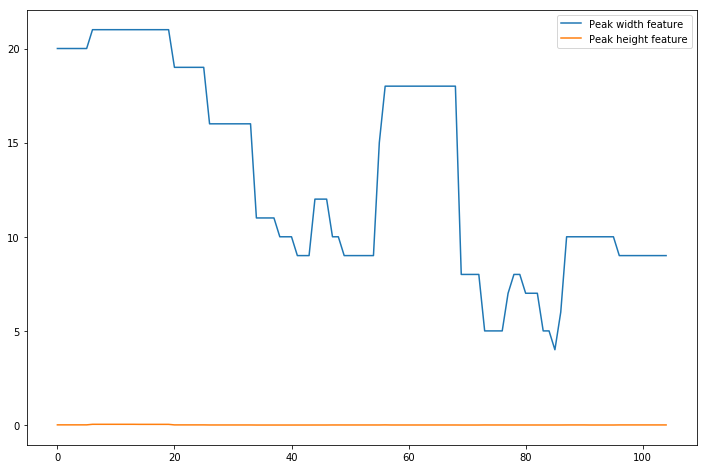


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), ar

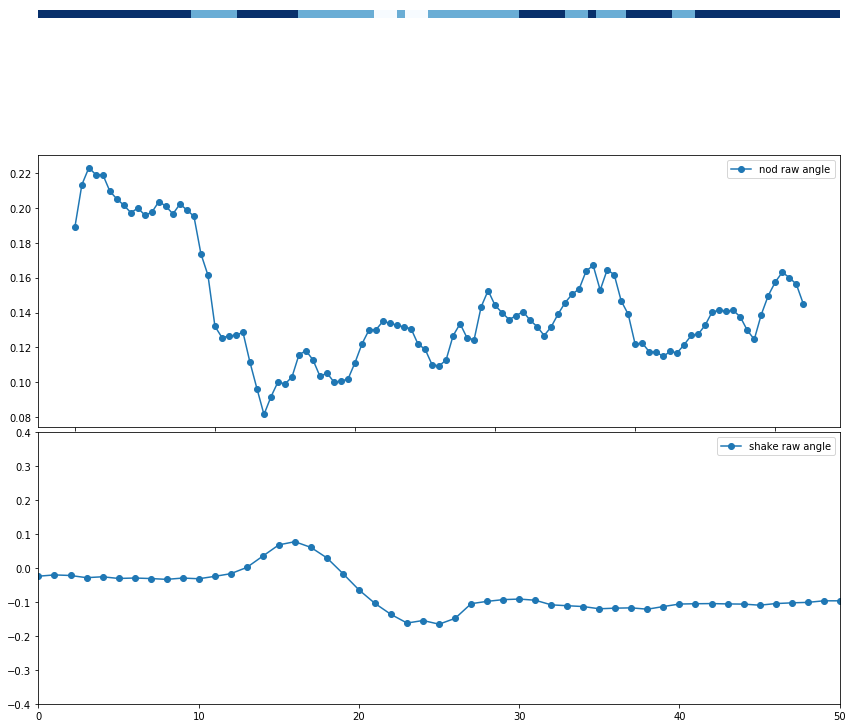

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_HowCloseToFamily/705_HowCloseToFamily_FACE.csv
csv frame rate: 30.008110300081107
L End reached - +
R End reached + -
[[1.10000000e+01 1.05080185e-03]
 [1.10000000e+01 1.05080185e-03]
 [1.10000000e+01 1.05080185e-03]
 [1.10000000e+01 1.05080185e-03]
 [1.10000000e+01 1.05080185e-03]
 [1.20000000e+01 1.81084060e-03]
 [1.30000000e+01 1.20058573e-02]
 [1.30000000e+01 1.20058573e-02]
 [1.30000000e+01 1.20058573e-02]
 [1.30000000e+01 1.20058573e-02]
 [1.30000000e+01 1.20058573e-02]
 [1.00000000e+01 4.89547776e-03]
 [1.00000000e+01 4.89547776e-03]
 [1.00000000e+01 4.89547776e-03]
 [1.00000000e+01 4.89547776e-03]
 [1.00000000e+01 4.89547776e-03]
 [1.30000000e+01 4.89547776e-03]
 [1.30000000e+01 4.89547776e-03]
 [1.90000000e+01 1.28342610e-02]
 [1.90000000e+01 1.28342610e-02]
 [1.90000000e+01 1.28342610e-02]
 [1.90000000e+01 1.28342610e-02]
 [1.90000000e+01 1.28342610e-02]
 [1.90000000e+01 1.28342610e

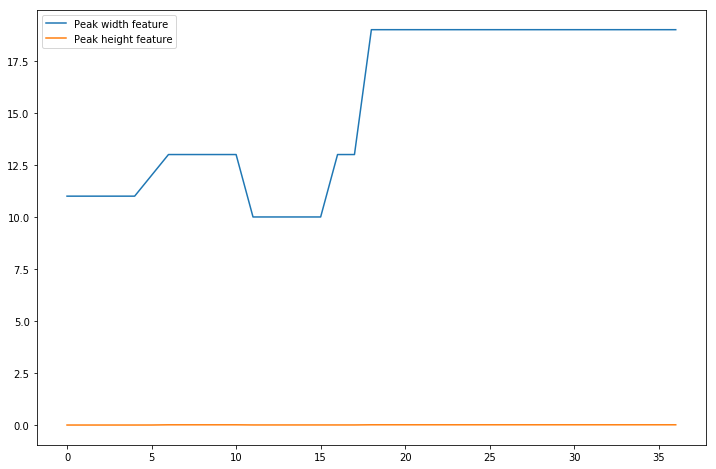

csv frame rate: 30.008110300081107
L End reached + -
R End reached - +
[[1.50000000e+01 5.94542068e-05]
 [1.50000000e+01 5.94542068e-05]
 [1.50000000e+01 5.94542068e-05]
 [1.50000000e+01 5.94542068e-05]
 [2.10000000e+01 6.19468675e-03]
 [2.10000000e+01 6.19468675e-03]
 [2.10000000e+01 6.19468675e-03]
 [2.10000000e+01 6.19468675e-03]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.60000000e+01 1.65138930e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.20000000e+01 1.11191333e-02]
 [2.2

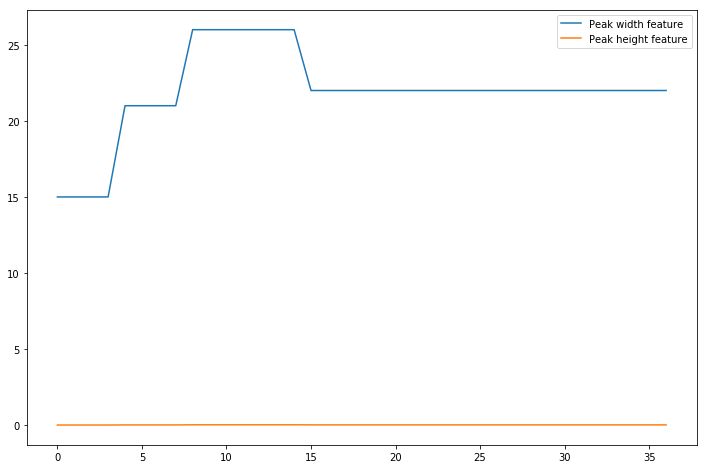


Annotations:
[2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.])]


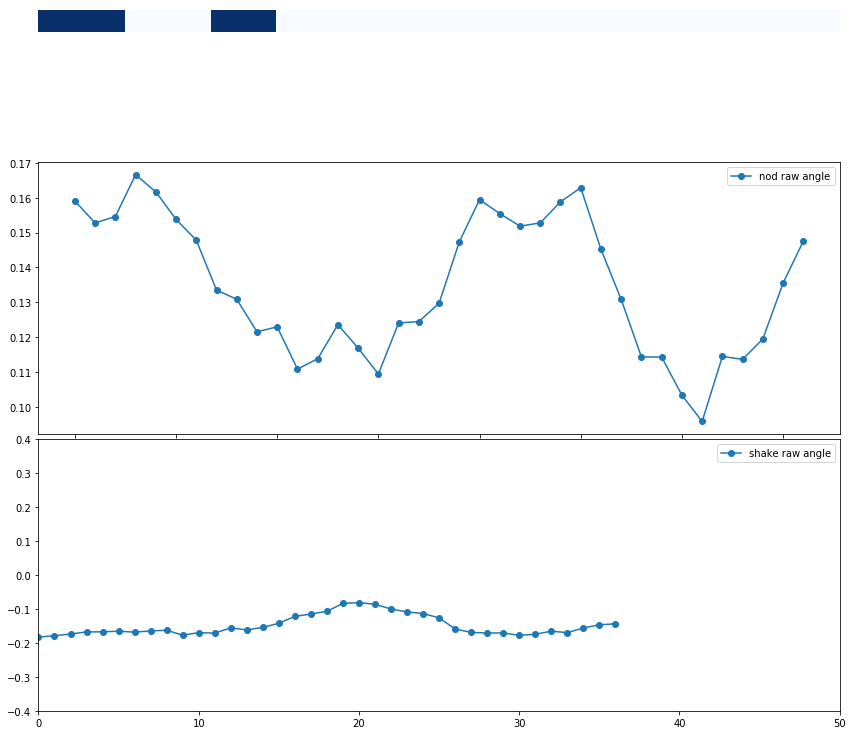

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/705/705_LastTimeHappy/705_LastTimeHappy_FACE.csv
csv frame rate: 30.000000000000004
L End reached + -
R End reached + -
[[1.10000000e+01 4.18628014e-03]
 [1.10000000e+01 4.18628014e-03]
 [1.10000000e+01 4.18628014e-03]
 [1.10000000e+01 4.18628014e-03]
 [1.10000000e+01 4.18628014e-03]
 [1.00000000e+01 4.18628014e-03]
 [1.00000000e+01 4.18628014e-03]
 [1.00000000e+01 1.15040189e-03]
 [1.00000000e+01 1.15040189e-03]
 [1.00000000e+01 1.15040189e-03]
 [1.00000000e+01 1.15040189e-03]
 [1.00000000e+01 2.24029712e-04]
 [1.00000000e+01 2.24029712e-04]
 [1.00000000e+01 2.24029712e-04]
 [1.50000000e+01 4.48693769e-03]
 [1.50000000e+01 4.48693769e-03]
 [1.40000000e+01 4.68240474e-03]
 [1.40000000e+01 4.68240474e-03]
 [1.40000000e+01 4.68240474e-03]
 [1.40000000e+01 4.68240474e-03]
 [1.20000000e+01 9.50599360e-04]
 [1.20000000e+01 9.50599360e-04]
 [1.20000000e+01 9.50599360e-04]
 [1.20000000e+01 9.50599360e-04]
 

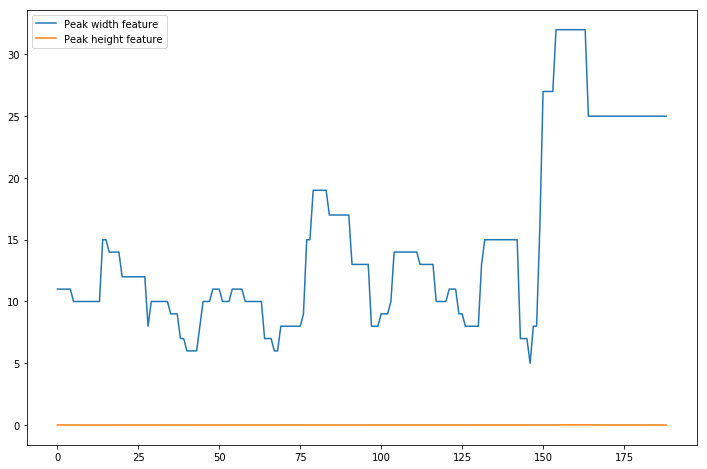

csv frame rate: 30.000000000000004
L End reached + -
R End reached + -
[[2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [2.10000000e+01 4.59919924e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.50000000e+01 1.39129408e-02]
 [1.00000000e+01 1.28002657e-03]
 [1.00000000e+01 1.28002657e-03]
 [1.00000000e+01 1.28002657e-03]
 [1.00000000e+01 1.28002657e-03]
 [1.00000000e+01 1.28002657e-03]
 [8.00000000e+00 1.26985332e-02]
 [8.00000000e+00 1.26985332e-02]
 [2.00000000e+01 1.14185067e-02]
 [2.00000000e+01 1.14185067e-02]
 [1.90000000e+01 8.85217722e-03]
 [1.90000000e+01 8.85217722e-03]
 [1.90000000e+01 8.85217722e-03]
 [1.7

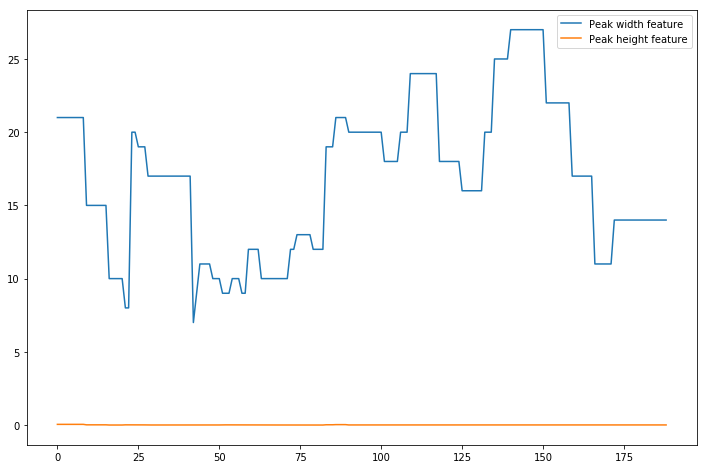


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), ar

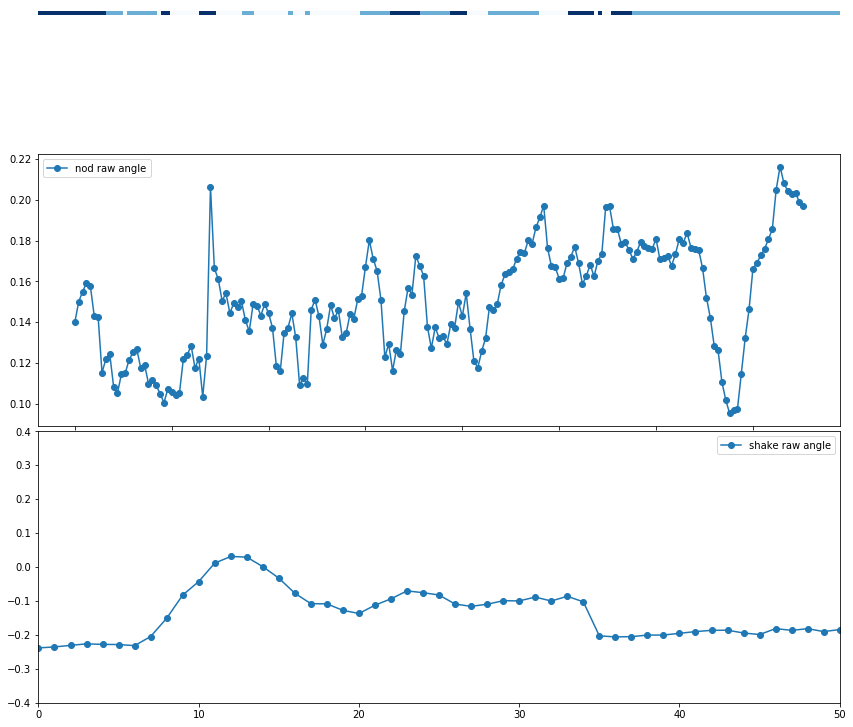

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_HowCloseToFamily/702_HowCloseToFamily_FACE.csv
csv frame rate: 29.998846198223145
L End reached - +
R End reached + -
[[3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [3.30000000e+01 3.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e

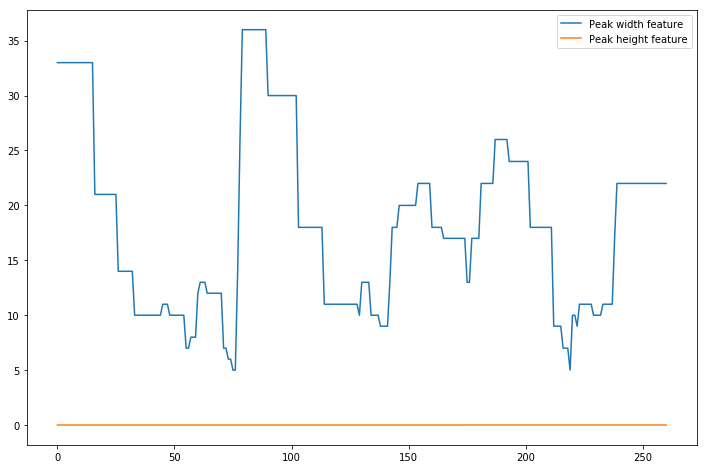

csv frame rate: 29.998846198223145
L End reached - +
R End reached + -
[[1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [1.60000000e+01 1.00000000e-03]
 [2.20000000e+01 7.00000000e-03]
 [2.20000000e+01 7.00000000e-03]
 [2.20000000e+01 7.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.60000000e+01 3.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.70000000e+01 4.00000000e-03]
 [2.3

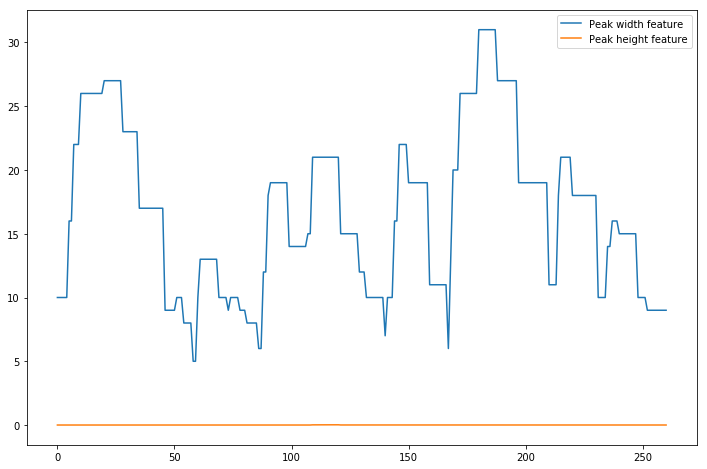


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

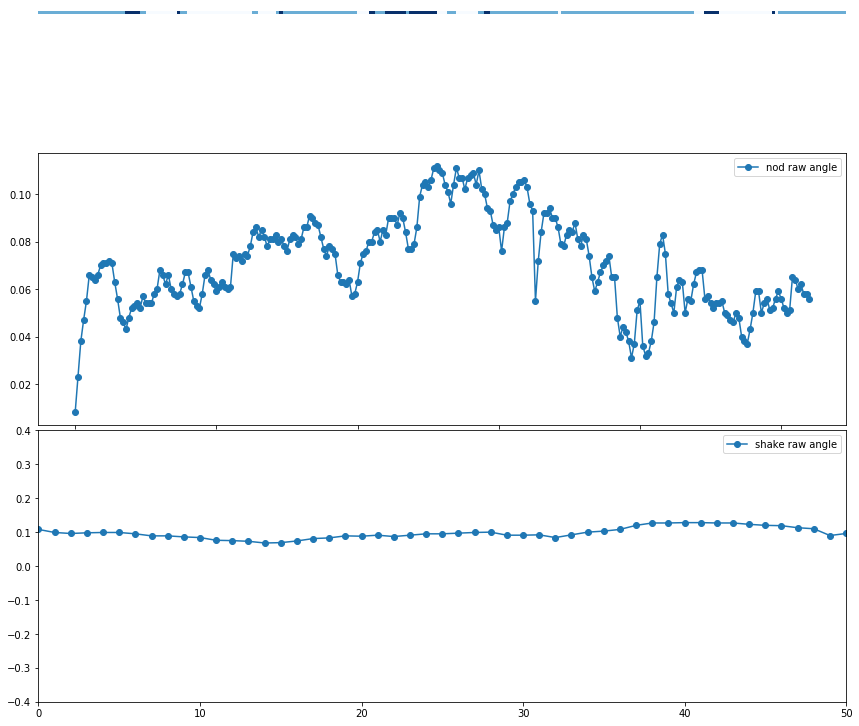

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_LastArgument/702_LastArgument_FACE.csv
csv frame rate: 30.00109493047192
L End reached + -
R End reached - +
[[9.00000000e+00 3.21144726e-03]
 [9.00000000e+00 3.21144726e-03]
 [9.00000000e+00 3.21144726e-03]
 [9.00000000e+00 3.21144726e-03]
 [9.00000000e+00 3.21144726e-03]
 [6.00000000e+00 1.24685661e-03]
 [6.00000000e+00 1.24685661e-03]
 [6.00000000e+00 1.24685661e-03]
 [4.00000000e+00 1.59876409e-03]
 [6.00000000e+00 2.74040871e-03]
 [8.00000000e+00 2.74040871e-03]
 [9.00000000e+00 4.09024713e-04]
 [9.00000000e+00 4.09024713e-04]
 [9.00000000e+00 4.09024713e-04]
 [1.00000000e+01 2.20739338e-04]
 [1.00000000e+01 2.20739338e-04]
 [1.00000000e+01 2.20739338e-04]
 [9.00000000e+00 1.65529565e-03]
 [9.00000000e+00 1.65529565e-03]
 [9.00000000e+00 3.72349318e-04]
 [9.00000000e+00 3.72349318e-04]
 [9.00000000e+00 3.72349318e-04]
 [9.00000000e+00 3.72349318e-04]
 [7.00000000e+00 3.72349318e-04]
 [7.

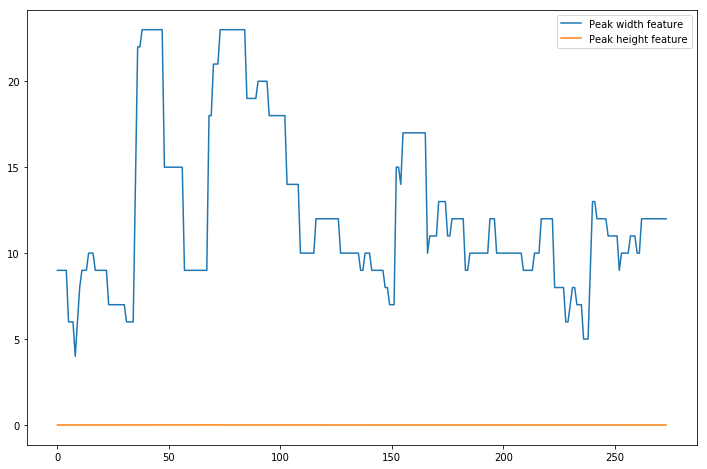

csv frame rate: 30.00109493047192
L End reached + -
R End reached + -
[[1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.30000000e+01 5.86370964e-05]
 [1.00000000e+01 1.13037902e-04]
 [1.00000000e+01 1.13037902e-04]
 [1.00000000e+01 1.13037902e-04]
 [1.00000000e+01 1.13037902e-04]
 [8.00000000e+00 1.68904993e-04]
 [8.00000000e+00 1.68904993e-04]
 [1.00000000e+01 1.68904993e-04]
 [1.00000000e+01 1.68904993e-04]
 [1.00000000e+01 1.68904993e-04]
 [9.00000000e+00 1.61160751e-03]
 [9.00000000e+00 1.61160751e-03]
 [9.00000000e+00 7.95599445e-04]
 [9.00000000e+00 7.95599445e-04]
 [9.00000000e+00 7.95599445e-04]
 [9.00000000e+00 7.95599445e-04]
 [8.00000000e+00 3.33605324e-04]
 [8.00000000e+00 3.33605324e-04]
 [9.00000000e+00 3.33605324e-04]
 [9.00000000e+00 3.33605324e-04]
 [1.40000000e+01 3.33605324e-04]
 [1.40000000e+01 3.33605324e-04]
 [1.40

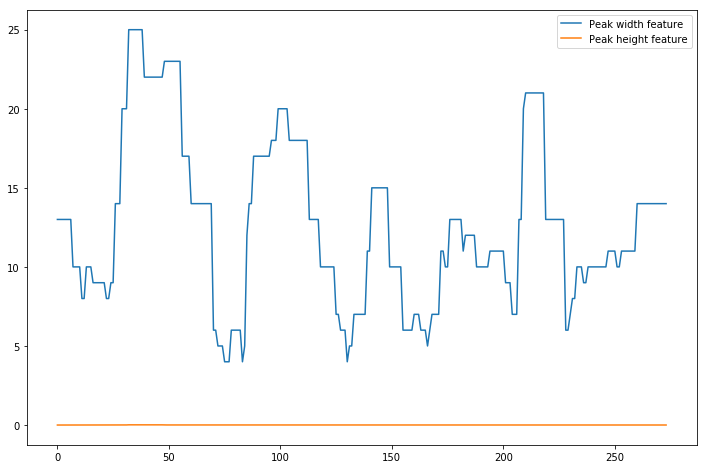


Annotations:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]),

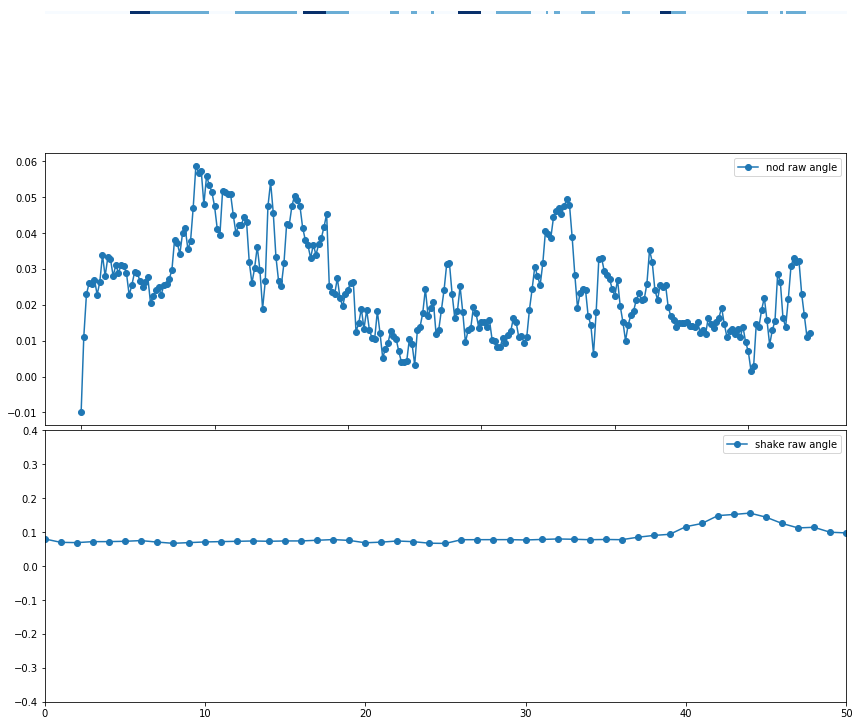

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_SituationHandledDifferent/702_SituationHandledDifferent_FACE.csv
csv frame rate: 30.002479543763943
L End reached + -
R End reached + -
[[1.80000000e+01 8.77535867e-03]
 [1.80000000e+01 8.77535867e-03]
 [1.80000000e+01 8.77535867e-03]
 [1.80000000e+01 8.77535867e-03]
 [1.80000000e+01 8.77535867e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [1.50000000e+01 7.40323183e-03]
 [9.00000000e+00 2.74487168e-03]
 [9.00000000e+00 2.74487168e-03]
 [9.00000000e+00 2.74487168e-03]
 [9.00000000e+00 2.74487168e-03]
 [9.00000000e+00 2.74487168e-03]
 [9.00000000e+00 2.74487168e-03]
 [1.00000000e+01 1.80487013e-03]
 [1.00000000e+01 5.32786612e-03]
 [1.10000000e+01 1.64587003e-03]
 [1.10000000e+01 1.64587003e-03]
 [1.10000000e+01 1.64587003e-03]
 [1.100000

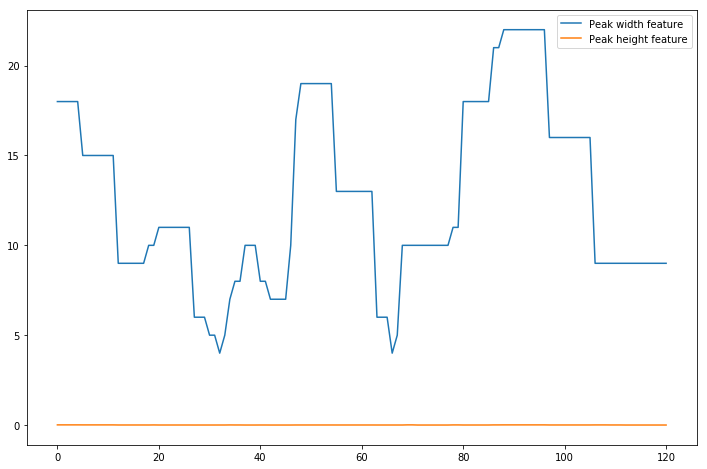

csv frame rate: 30.002479543763943
L End reached - +
R End reached + -
[[1.20000000e+01 2.68617922e-03]
 [1.20000000e+01 2.68617922e-03]
 [1.20000000e+01 2.68617922e-03]
 [1.20000000e+01 2.68617922e-03]
 [1.20000000e+01 2.68617922e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.40000000e+01 1.06171143e-03]
 [1.00000000e+01 3.35847916e-03]
 [1.10000000e+01 4.35864529e-03]
 [1.10000000e+01 4.35864529e-03]
 [1.10000000e+01 4.35864529e-03]
 [1.10000000e+01 4.35864529e-03]
 [1.10000000e+01 4.35864529e-03]
 [1.10000000e+01 4.35864529e-03]
 [7.00000000e+00 4.30666648e-04]
 [7.00000000e+00 4.30666648e-04]
 [1.00000000e+01 4.30666648e-04]
 [1.00000000e+01 4.30666648e-04]
 [9.00000000e+00 4.19928690e-03]
 [9.00000000e+00 4.19928690e-03]
 [8.00000000e+00 2.96803204e-03]
 [8.00000000e+00 2.96803204e-03]
 [8.00000000e+00 2.96803204e-03]
 [8.00000000e+00 2.96803204e-03]
 [8.0

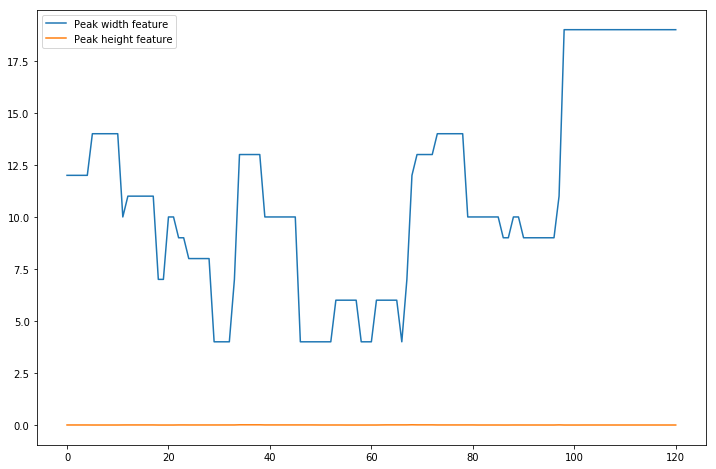


Annotations:
[1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.

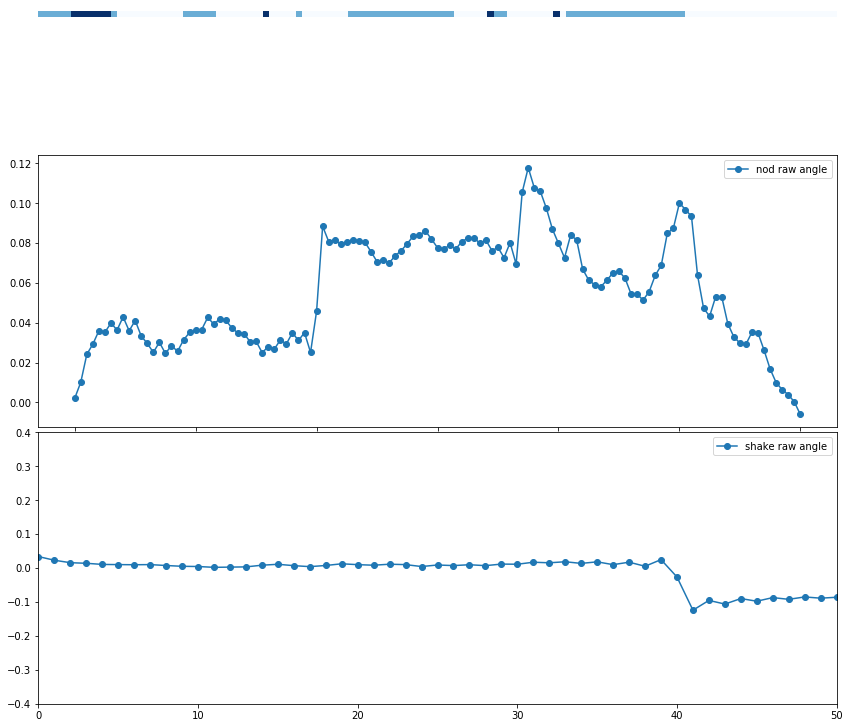

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_Guilty/702_Guilty_FACE.csv
csv frame rate: 30.00103809820409
L End reached + -
R End reached + -
[[1.90000000e+01 1.00365879e-02]
 [1.90000000e+01 1.00365879e-02]
 [1.90000000e+01 1.00365879e-02]
 [1.90000000e+01 1.00365879e-02]
 [1.90000000e+01 1.00365879e-02]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.70000000e+01 7.39562179e-04]
 [1.10000000e+01 3.91911612e-03]
 [1.10000000e+01 3.91911612e-03]
 [1.10000000e+01 3.91911612e-03]
 [1.00000000e+01 5.93770472e-03]
 [1.00000000e+01 5.93770472e-03]
 [1.20000000e+01 3.38354537e-03]
 [1.20000000e+01 3.38354537e-03]
 [1.20000000e+01 3.38354537e-03]
 [1.20000000e+01

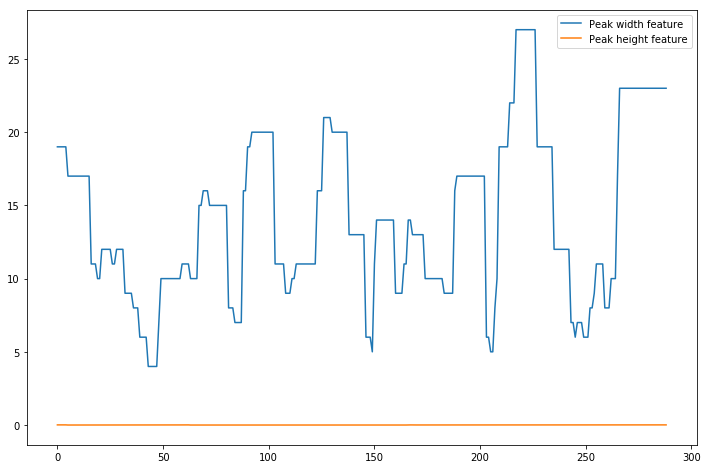

csv frame rate: 30.00103809820409
L End reached - +
R End reached + -
[[2.90000000e+01 2.76146693e-02]
 [2.90000000e+01 2.76146693e-02]
 [2.90000000e+01 2.76146693e-02]
 [2.90000000e+01 2.76146693e-02]
 [2.90000000e+01 2.76146693e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.80000000e+01 1.00887657e-02]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20000000e+01 9.64841609e-03]
 [3.20

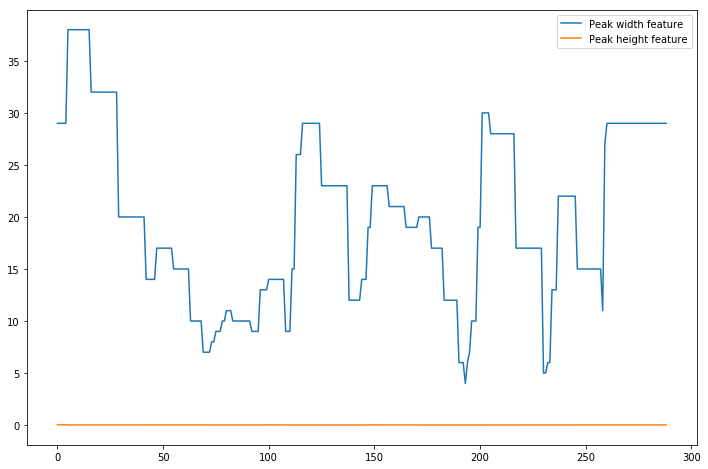


Annotations:
[1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

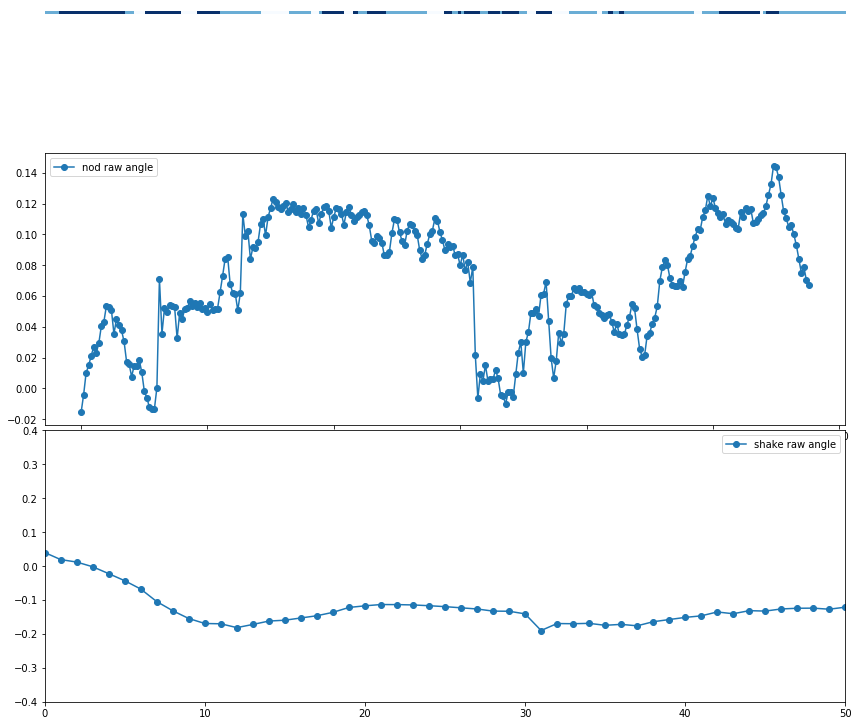

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_HardestDecision/702_HardestDecision_FACE.csv
csv frame rate: 29.994643813604714
L End reached + -
R End reached - +
[[1.1e+01 3.0e-03]
 [1.1e+01 3.0e-03]
 [1.1e+01 3.0e-03]
 [1.1e+01 3.0e-03]
 [2.0e+01 2.0e-03]
 [2.0e+01 2.0e-03]
 [2.0e+01 2.0e-03]
 [2.0e+01 2.0e-03]
 [2.0e+01 2.0e-03]
 [2.2e+01 2.2e-02]
 [2.2e+01 2.2e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [2.6e+01 1.3e-02]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.6e+01 5.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [1.1e+01 4.0e-03]
 [6.0e+00 8.0e-03]
 [6.0e+00 8.0e-03]
 [5.0e+00 4.0e-03]
 [5.0e+00 4.0e-03]
 [6.0e+00 1.0e-03]
 [7.0e+00 

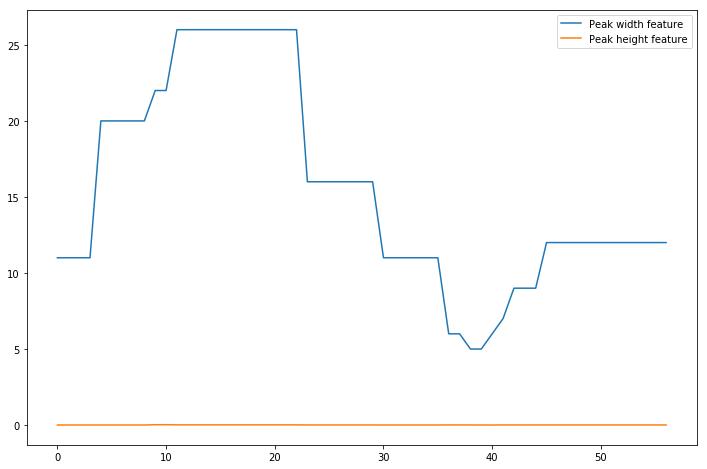

csv frame rate: 29.994643813604714
L End reached + -
R End reached - +
[[5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [5.1e+01 1.8e-02]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03]
 [2.5e+01 4.0e-03

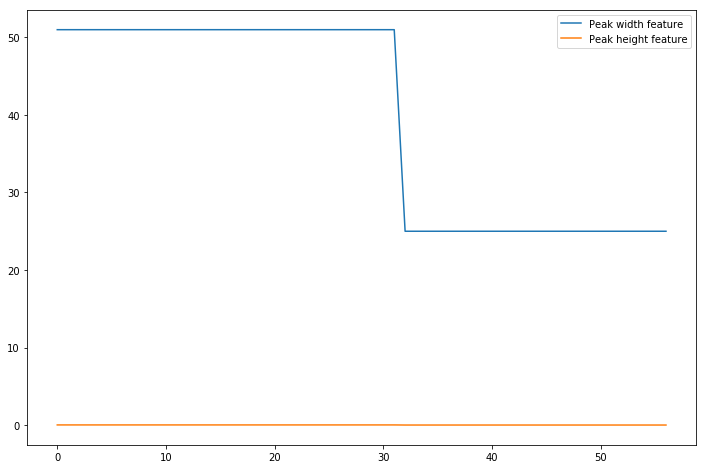


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]),

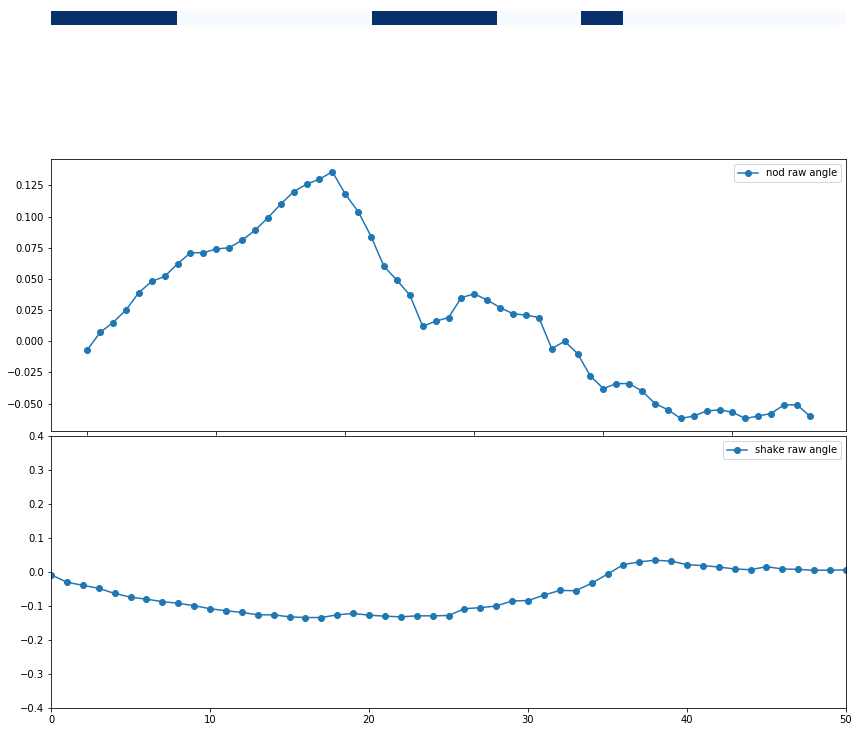

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_EventToErase/702_EventToErase_FACE.csv
csv frame rate: 30.003093102381687
L End reached + -
R End reached - +
[[3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [3.30000000e+01 2.34225218e-02]
 [1.70000000e+01 1.61669164e-03]
 [1.70000000e+01 1.61669164e-03]
 [1.70000000e+01 1.61669164e-03]
 [1.70000000e+01 1.61669164e-03]
 [1.70000000e+01 1.61669164e-03]
 [1.70000000e+01 1.61669164e-03]
 [1

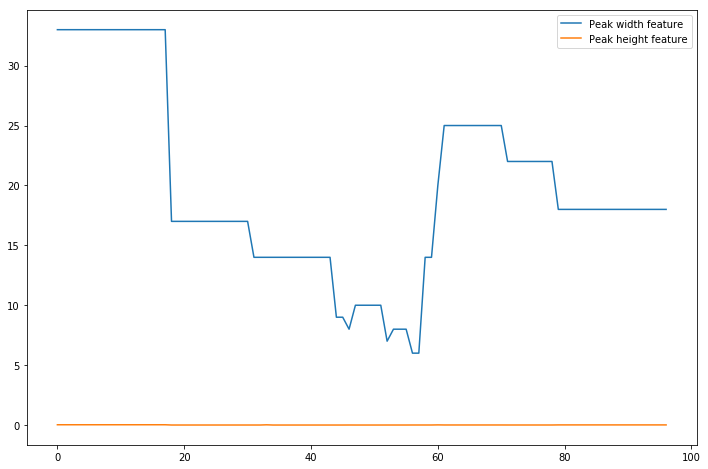

csv frame rate: 30.003093102381687
L End reached - +
R End reached - +
[[1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.30000000e+01 9.47591369e-04]
 [1.10000000e+01 3.61696191e-03]
 [1.10000000e+01 3.61696191e-03]
 [1.00000000e+01 4.50087944e-03]
 [1.00000000e+01 4.50087944e-03]
 [1.00000000e+01 4.50087944e-03]
 [1.00000000e+01 4.50087944e-03]
 [1.80000000e+01 7.46101470e-05]
 [1.80000000e+01 7.46101470e-05]
 [1.80000000e+01 7.46101470e-05]
 [1.80000000e+01 7.46101470e-05]
 [2.20000000e+01 1.85821978e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.70000000e+01 1.15187331e-02]
 [2.7

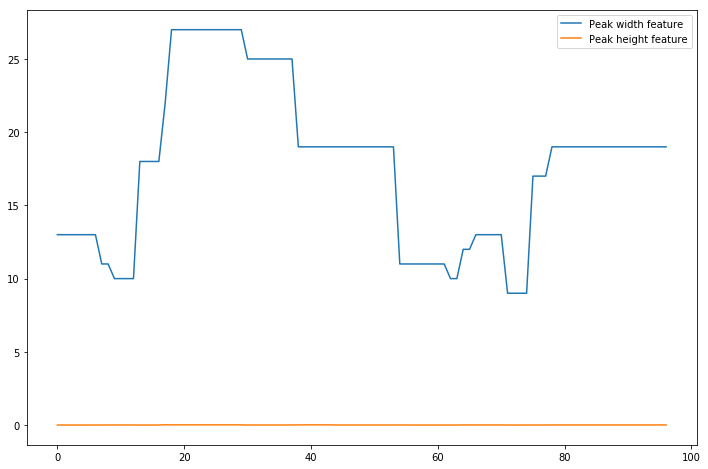


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array

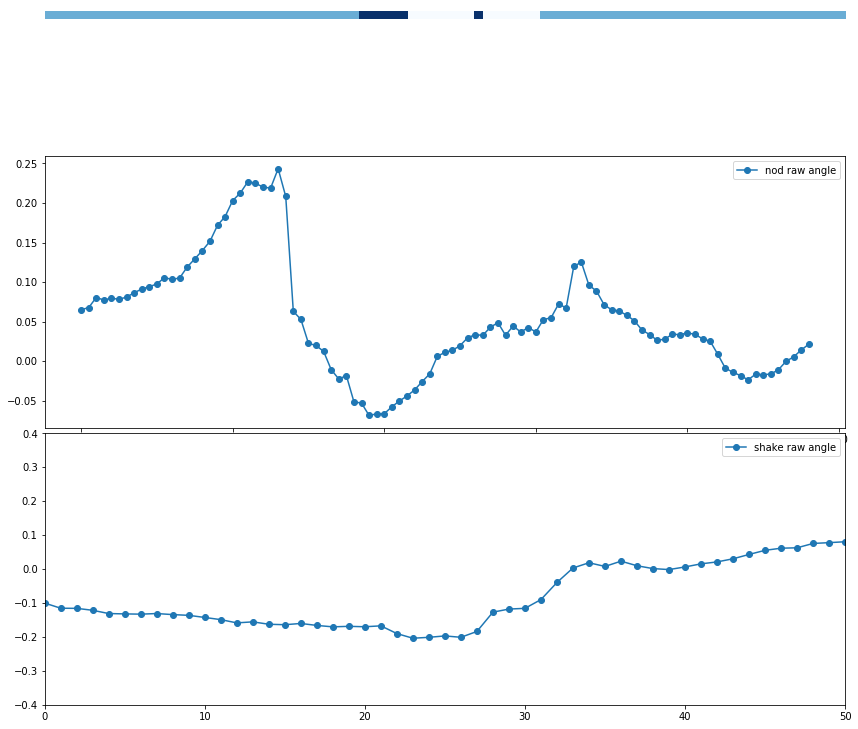

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/702/702_LastTimeHappy/702_LastTimeHappy_FACE.csv
csv frame rate: 29.99906252929596
L End reached - +
R End reached + -
[[1.10000000e+01 5.20417043e-18]
 [1.10000000e+01 5.20417043e-18]
 [1.10000000e+01 5.20417043e-18]
 [1.10000000e+01 5.20417043e-18]
 [1.00000000e+01 1.90819582e-17]
 [1.00000000e+01 1.90819582e-17]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 4.00000000e-03]
 [1.10000000e+01 4.00000000e-03]
 [1.10000000e+01 4.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [

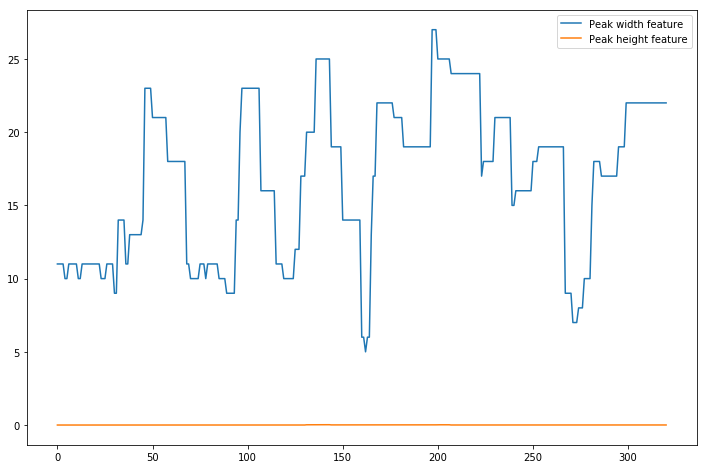

csv frame rate: 29.99906252929596
L End reached + -
R End reached + -
[[2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [2.00000000e+01 1.00000000e-03]
 [1.50000000e+01 1.00000000e-03]
 [1.50000000e+01 5.00000000e-03]
 [1.50000000e+01 5.00000000e-03]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90000000e+01 3.81639165e-17]
 [1.90

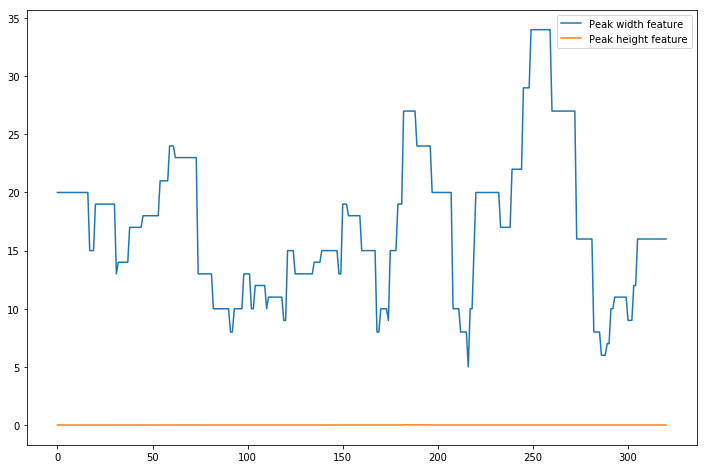


Annotations:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array

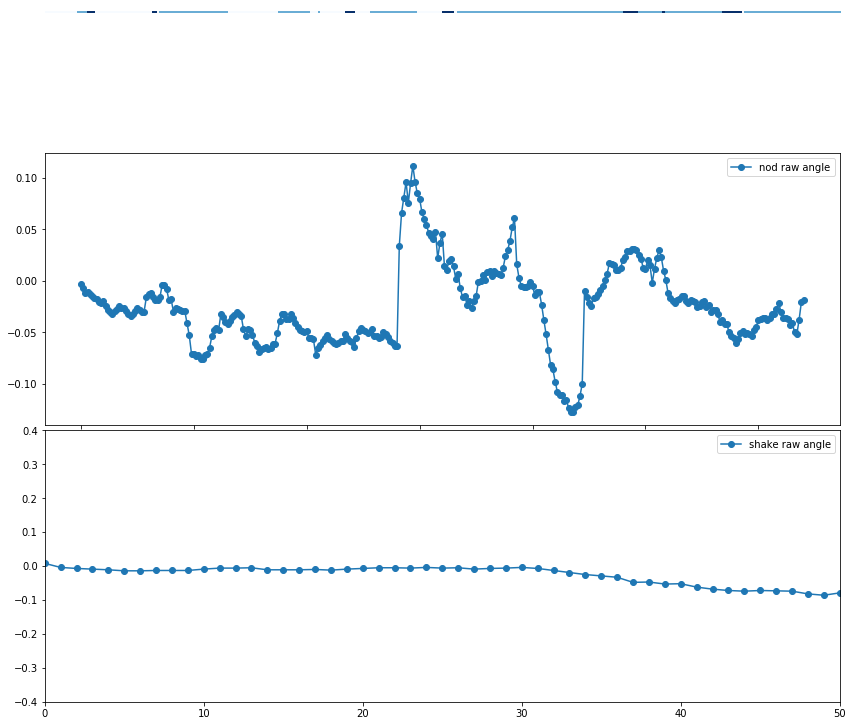

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_HowCloseToFamily/653_HowCloseToFamily_FACE.csv
csv frame rate: 30.002419549963708
L End reached - +
R End reached + -
[[1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.80000000e+01 1.47276102e-02]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [1.40000000e+01 9.54966397e-04]
 [8.00000000e+00 4.10342403e-04]
 [8.00000000e+00 4.10342403e-04]
 [1.40000000e+01 1.08728112e-03]
 [1.40000000e+01 1.08728112e-03]
 [2.20000000e+01 5.86045937e-03]
 [2.20000000e+01 5.86045937e-03]
 [2.20000000e+01 5.86045937e-03]
 [2.00000000e+01 9.49102237e

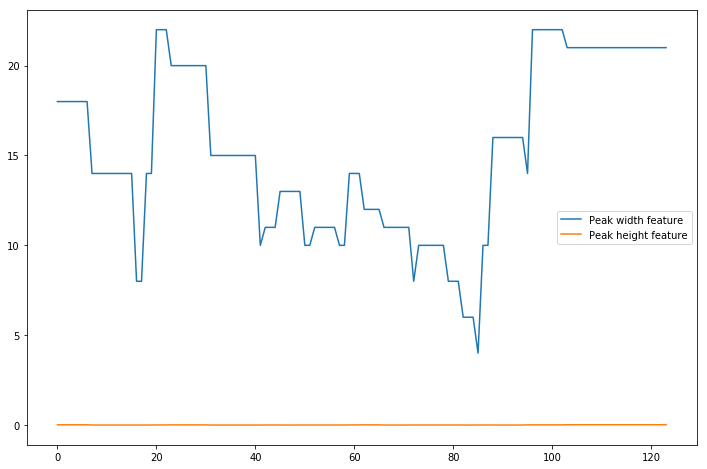

csv frame rate: 30.002419549963708
L End reached - +
R End reached + -
[[9.00000000e+00 1.52087408e-03]
 [9.00000000e+00 1.52087408e-03]
 [9.00000000e+00 1.52087408e-03]
 [9.00000000e+00 1.52087408e-03]
 [1.00000000e+01 1.68148497e-04]
 [1.00000000e+01 1.68148497e-04]
 [1.00000000e+01 1.68148497e-04]
 [1.00000000e+01 8.12765748e-04]
 [1.00000000e+01 8.12765748e-04]
 [1.00000000e+01 8.12765748e-04]
 [1.00000000e+01 8.12765748e-04]
 [1.00000000e+01 8.12765748e-04]
 [1.00000000e+01 8.12765748e-04]
 [7.00000000e+00 6.15871112e-04]
 [7.00000000e+00 6.15871112e-04]
 [7.00000000e+00 6.15871112e-04]
 [5.00000000e+00 2.98765345e-03]
 [5.00000000e+00 2.98765345e-03]
 [5.00000000e+00 1.48540050e-03]
 [6.00000000e+00 1.00782587e-03]
 [8.00000000e+00 6.94167244e-04]
 [8.00000000e+00 6.94167244e-04]
 [1.10000000e+01 6.94167244e-04]
 [1.10000000e+01 6.94167244e-04]
 [1.00000000e+01 1.62058674e-03]
 [1.00000000e+01 1.62058674e-03]
 [1.00000000e+01 1.62058674e-03]
 [2.80000000e+01 2.42789515e-04]
 [2.8

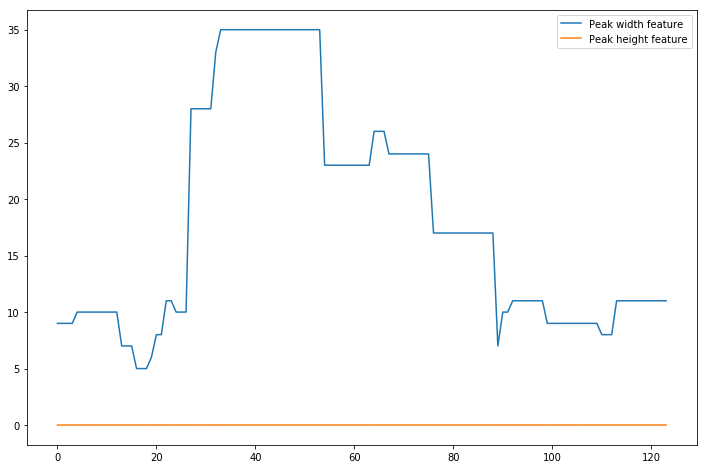


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0

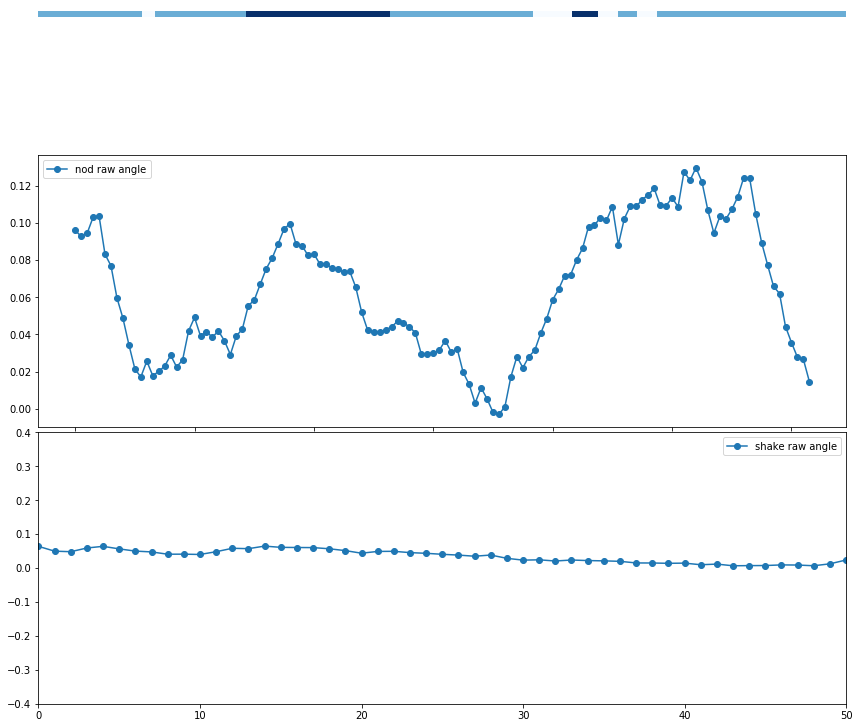

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_SituationHandledDifferent/653_SituationHandledDifferent_FACE.csv
csv frame rate: 30.000000000000004
L End reached - +
R End reached - +
[[1.30000000e+01 3.22420042e-03]
 [1.30000000e+01 3.22420042e-03]
 [1.30000000e+01 3.22420042e-03]
 [1.30000000e+01 3.22420042e-03]
 [1.30000000e+01 3.22420042e-03]
 [1.30000000e+01 3.22420042e-03]
 [1.40000000e+01 1.51579927e-04]
 [1.40000000e+01 1.51579927e-04]
 [1.40000000e+01 1.51579927e-04]
 [1.40000000e+01 1.51579927e-04]
 [1.40000000e+01 1.51579927e-04]
 [2.50000000e+01 1.23949937e-02]
 [2.50000000e+01 1.23949937e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.20000000e+01 2.20849136e-02]
 [3.30000000e+01 2.07637219e-02]
 [3.30000000e+01 2.07637219e-02]
 [3.30000000e+01 2.07637219e-02]
 [3.30000000e+01 2.07637219e-02]
 [3.300000

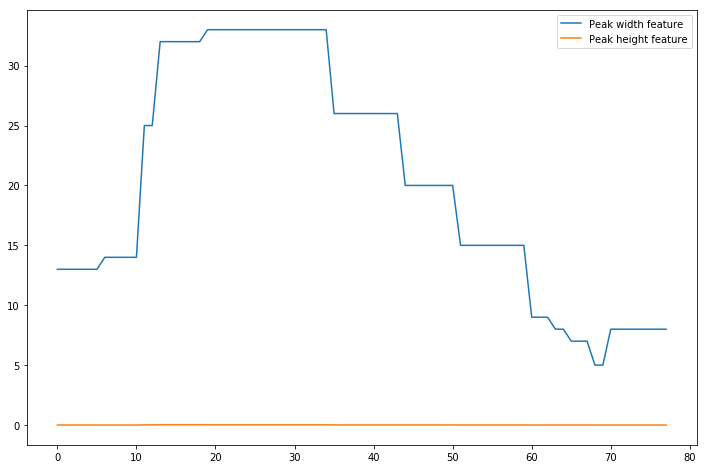

csv frame rate: 30.000000000000004
L End reached + -
R End reached - +
[[4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.60000000e+01 3.25710056e-02]
 [4.6

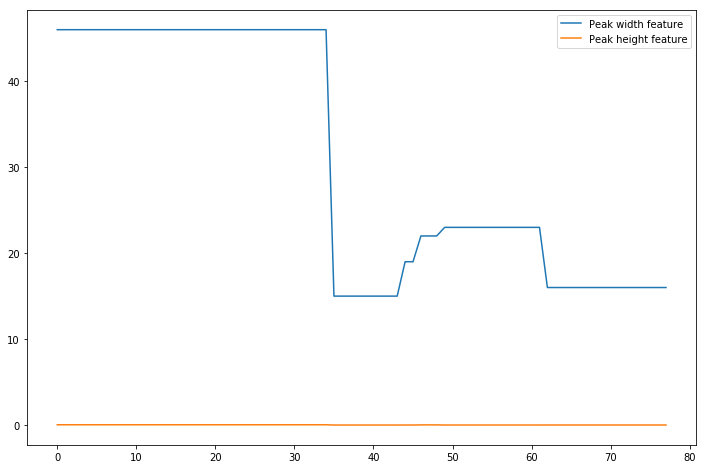


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]),

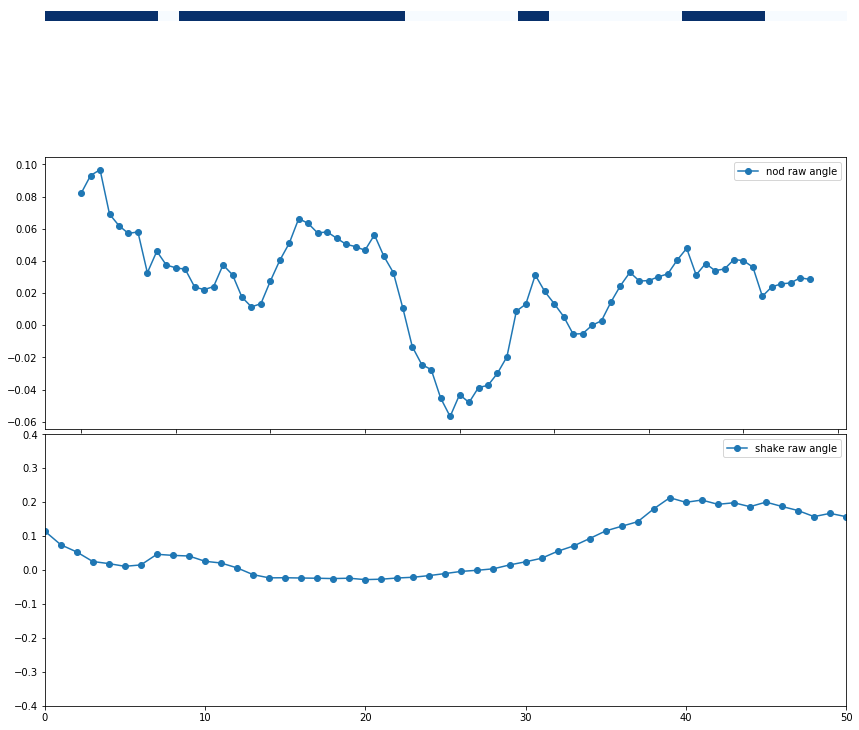

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_LastTimeHappy/653_LastTimeHappy_FACE.csv
csv frame rate: 29.999246250094217
L End reached - +
R End reached - +
[[9.00000000e+00 2.77555756e-17]
 [9.00000000e+00 2.77555756e-17]
 [9.00000000e+00 2.77555756e-17]
 [9.00000000e+00 2.77555756e-17]
 [9.00000000e+00 2.00000000e-03]
 [9.00000000e+00 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.10000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.80000000e+01 1.20000000e-02]
 [1.80000000e+01 1.20000000e-02]
 

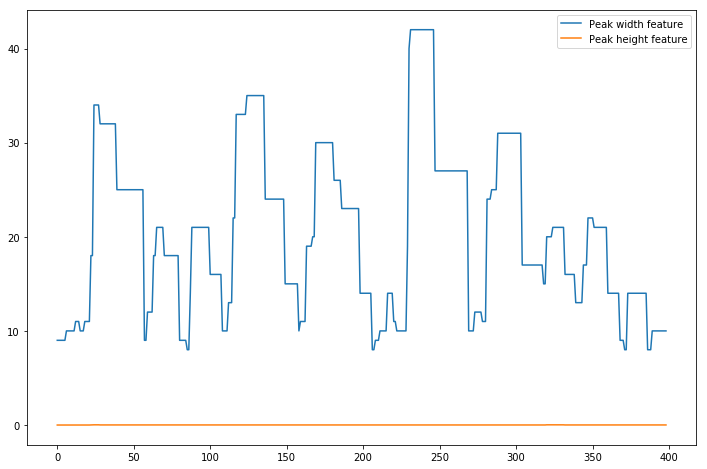

csv frame rate: 29.999246250094217
L End reached - +
R End reached + -
[[1.80000000e+01 2.50000000e-02]
 [1.80000000e+01 2.50000000e-02]
 [1.80000000e+01 2.50000000e-02]
 [1.80000000e+01 2.50000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.20000000e+01 1.90000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.90000000e+01 2.70000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [2.30000000e+01 2.00000000e-02]
 [1.70000000e+01 1.00000000e-03]
 [1.70000000e+01 1.00000000e-03]
 [1.70000000e+01 1.00000000e-03]
 [1.7

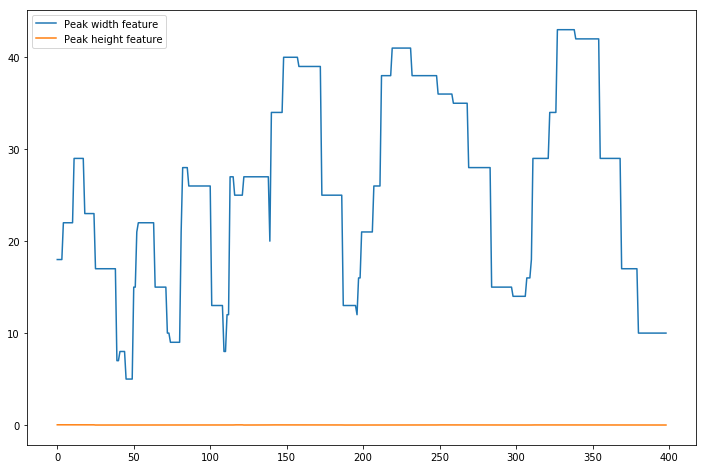


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1

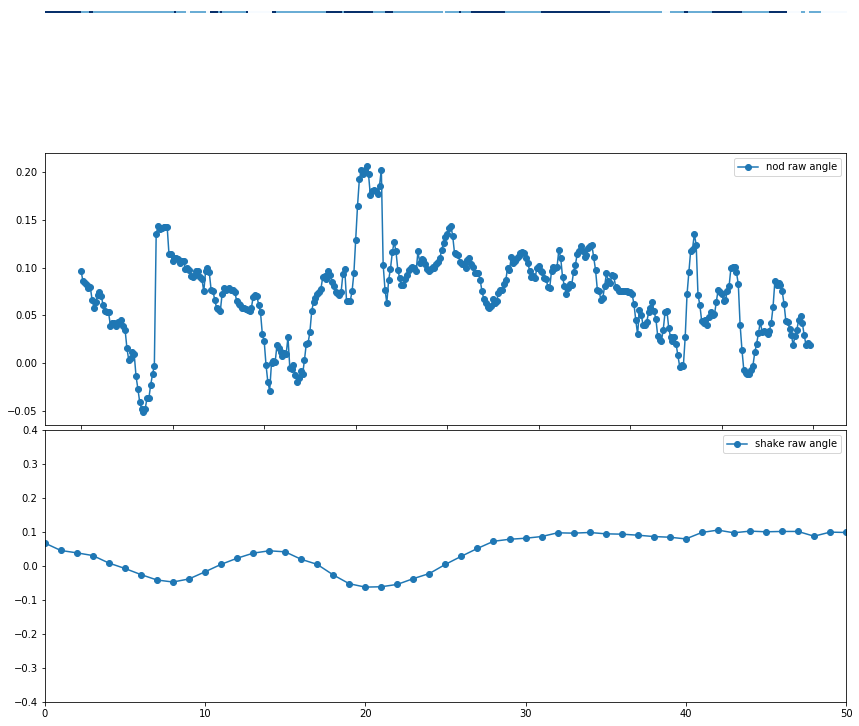

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_LastArgument/653_LastArgument_FACE.csv
csv frame rate: 29.999999999999996
L End reached - +
R End reached - +
[[1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [8.00000000e+00 2.00000000e-03]
 [8.00000000e+00 2.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.20000000e+01 1.52655666e-16]
 [1.20000000e+01 1.52655666e-16]
 [1

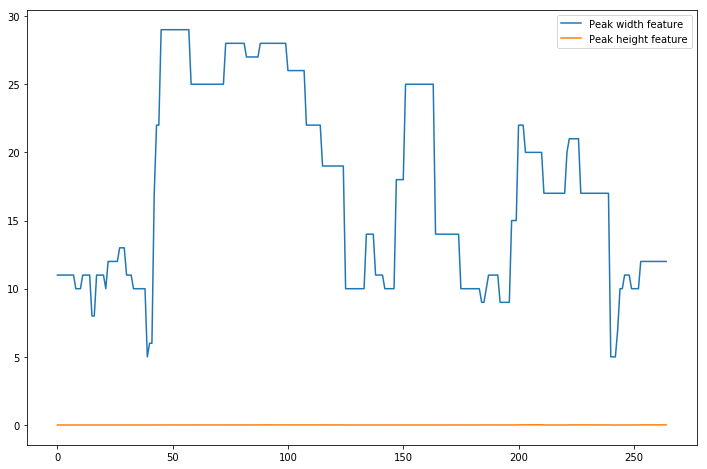

csv frame rate: 29.999999999999996
L End reached + -
R End reached + -
[[1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.00000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 3.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.00000000e+01 4.00000000e-03]
 [1.20000000e+01 1.00000000e-03]
 [1.20000000e+01 1.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.10000000e+01 2.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.20000000e+01 1.00000000e-03]
 [2.00000000e+01 8.00000000e-03]
 [3.0

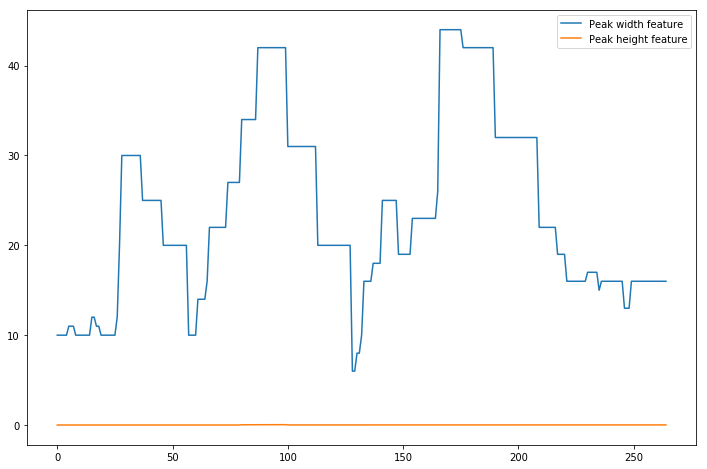


Annotations:
[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array

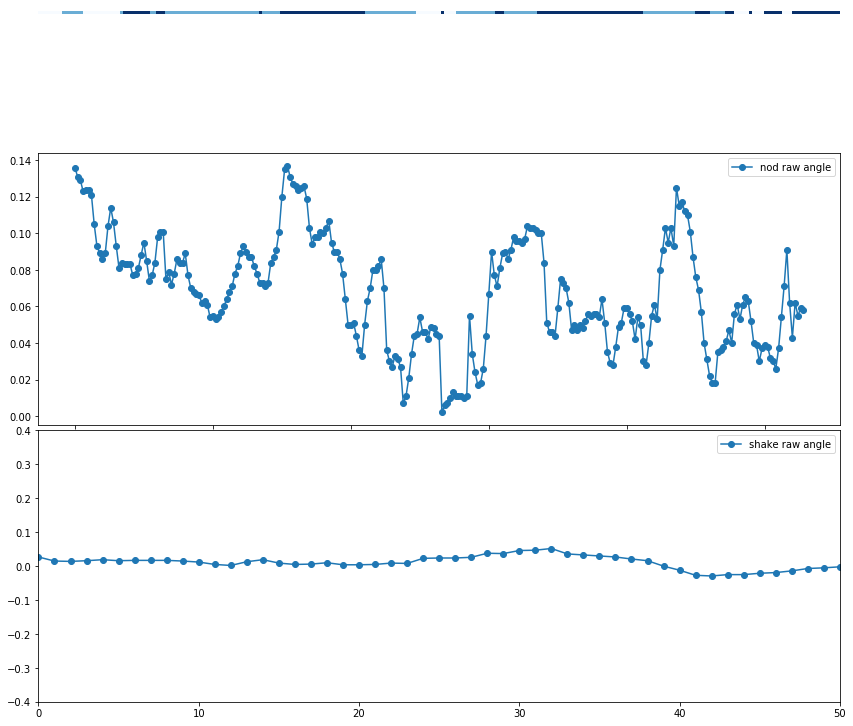

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_Guilty/653_Guilty_FACE.csv
csv frame rate: 30.005455537370427
L End reached + -
R End reached - +
[[2.40000000e+01 9.47471053e-03]
 [2.40000000e+01 9.47471053e-03]
 [2.40000000e+01 9.47471053e-03]
 [2.40000000e+01 9.47471053e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [2.40000000e+01 7.80425484e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.80000000e+01 3.05591733e-03]
 [1.10000000e+0

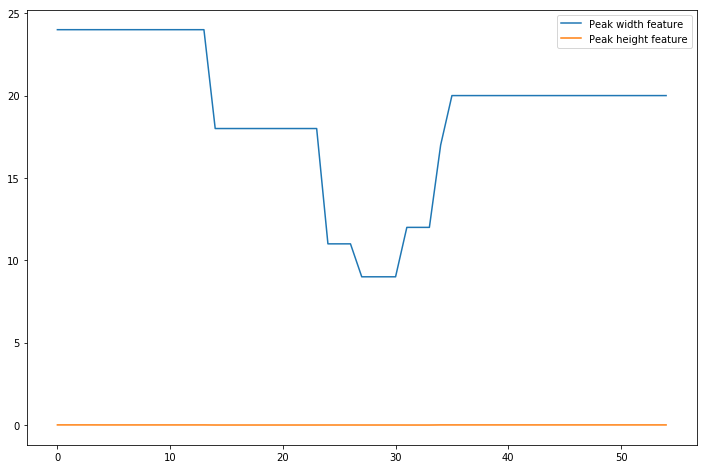

csv frame rate: 30.005455537370427
L End reached - +
R End reached - +
[[2.00000000e+01 2.26811562e-02]
 [2.00000000e+01 2.26811562e-02]
 [2.00000000e+01 2.26811562e-02]
 [2.00000000e+01 2.26811562e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [2.30000000e+01 2.15944806e-02]
 [1.30000000e+01 6.96447170e-03]
 [1.30000000e+01 6.96447170e-03]
 [1.30000000e+01 6.96447170e-03]
 [1.30000000e+01 6.96447170e-03]
 [1.30000000e+01 6.96447170e-03]
 [1.90000000e+01 3.43585741e-04]
 [1.90000000e+01 3.43585741e-04]
 [1.90000000e+01 3.43585741e-04]
 [1.90000000e+01 3.43585741e-04]
 [1.90000000e+01 3.43585741e-04]
 [1.90000000e+01 3.43585741e-04]
 [1.60000000e+01 6.83466855e-03]
 [1.60000000e+01 7.90562384e-03]
 [1.6

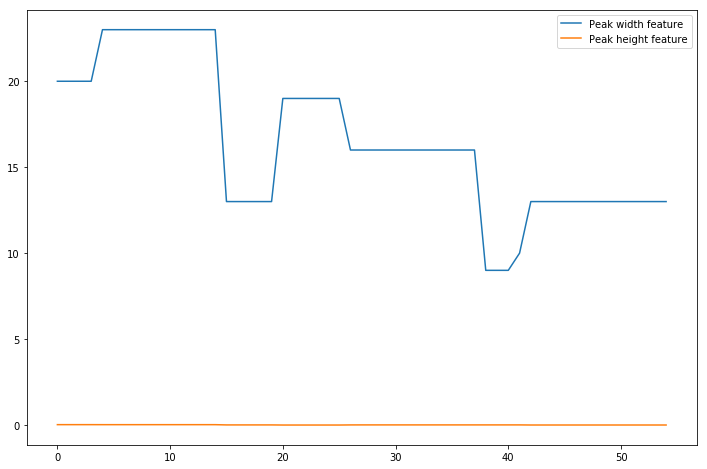


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array

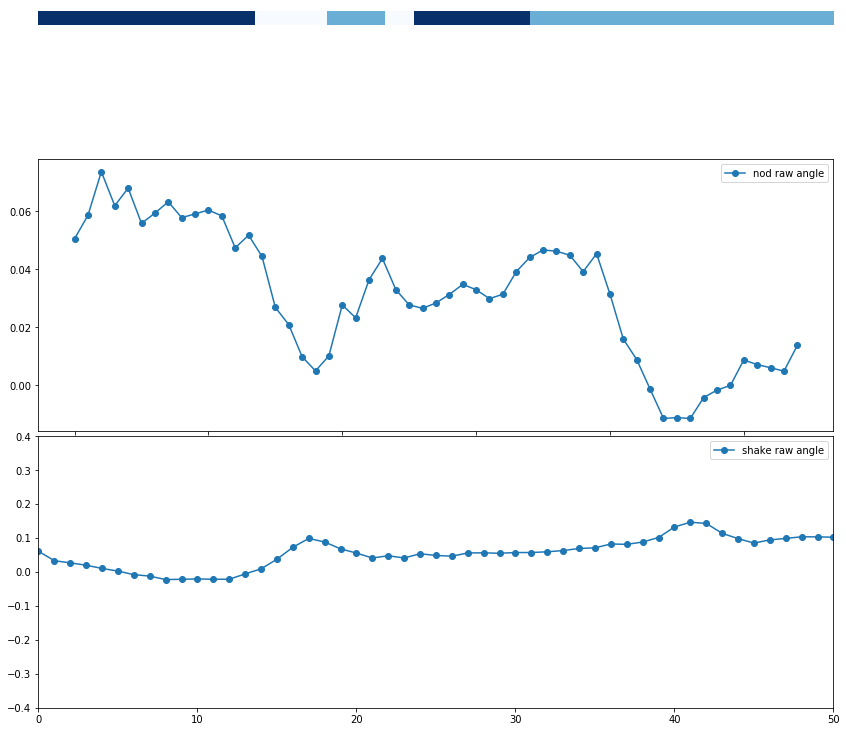

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/653/653_MostProudOf/653_MostProudOf_FACE.csv
csv frame rate: 30.002112824846815
L End reached - +
R End reached - +
[[8.00000000e+00 4.91854212e-03]
 [8.00000000e+00 4.91854212e-03]
 [8.00000000e+00 4.91854212e-03]
 [8.00000000e+00 4.91854212e-03]
 [8.00000000e+00 4.91854212e-03]
 [1.20000000e+01 5.62336795e-04]
 [1.20000000e+01 5.62336795e-04]
 [2.40000000e+01 7.49713258e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [3.10000000e+01 8.31049809e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.80000000e+01 5.21300367e-03]
 [2.8

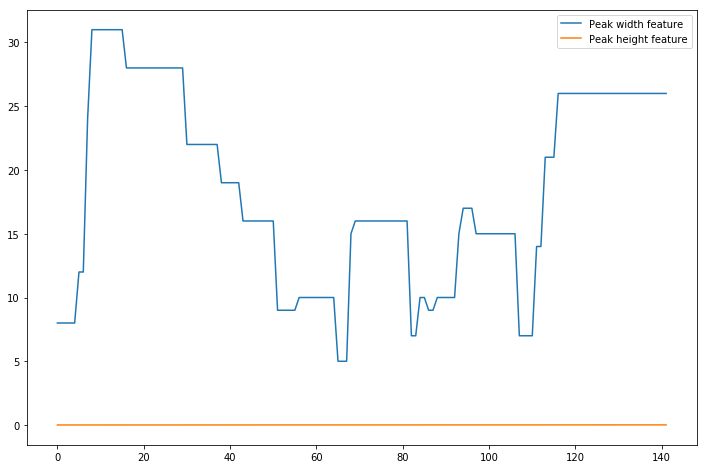

csv frame rate: 30.002112824846815
L End reached + -
R End reached + -
[[1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [1.30000000e+01 2.92814231e-05]
 [8.00000000e+00 2.92814231e-05]
 [8.00000000e+00 2.92814231e-05]
 [8.00000000e+00 6.57204730e-03]
 [1.80000000e+01 4.85459471e-03]
 [1.80000000e+01 4.85459471e-03]
 [1.80000000e+01 4.85459471e-03]
 [1.80000000e+01 4.85459471e-03]
 [2.10000000e+01 5.01686775e-03]
 [2.10000000e+01 5.01686775e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.60000000e+01 1.29691046e-03]
 [2.6

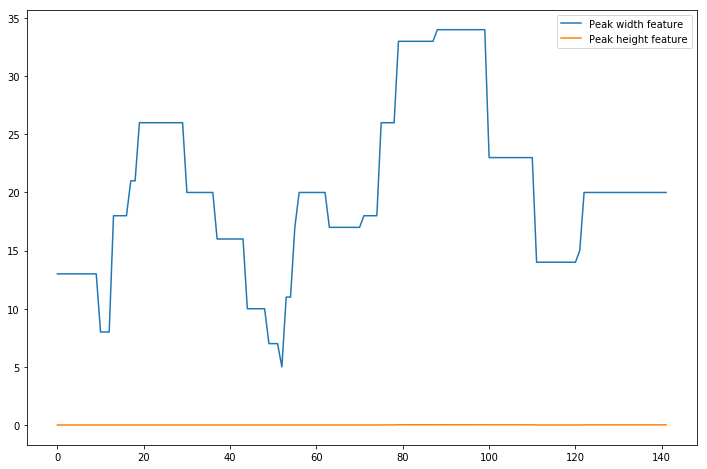


Annotations:
[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]

Probabilities:
[array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([1., 0., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

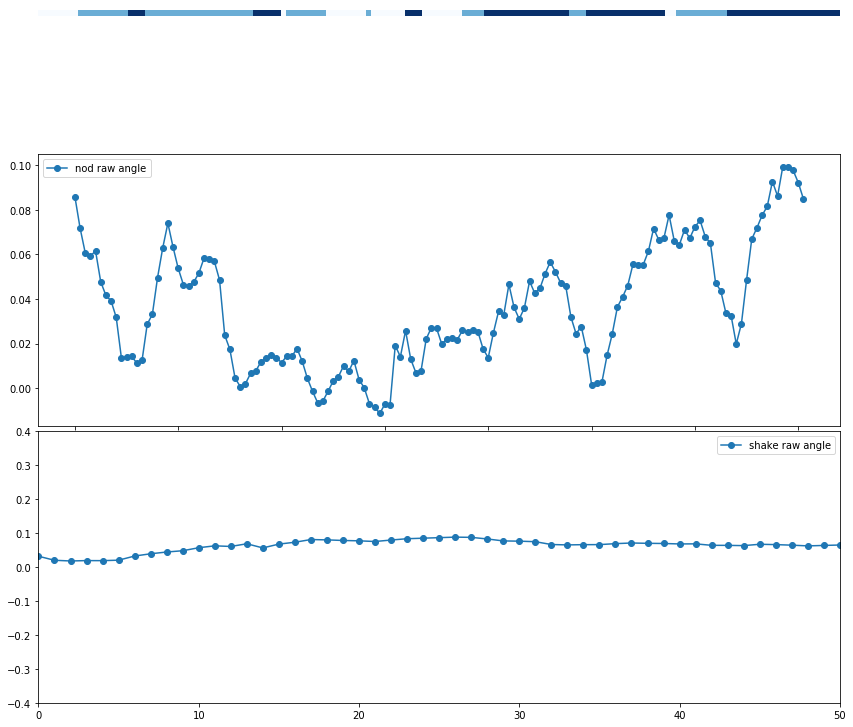

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/366/366_Guilty/366_Guilty_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.2e+01 1.9e-02]
 [1.2e+01 1.9e-02]
 [1.2e+01 1.9e-02]
 ...
 [1.5e+01 7.0e-03]
 [1.5e+01 7.0e-03]
 [1.5e+01 7.0e-03]]


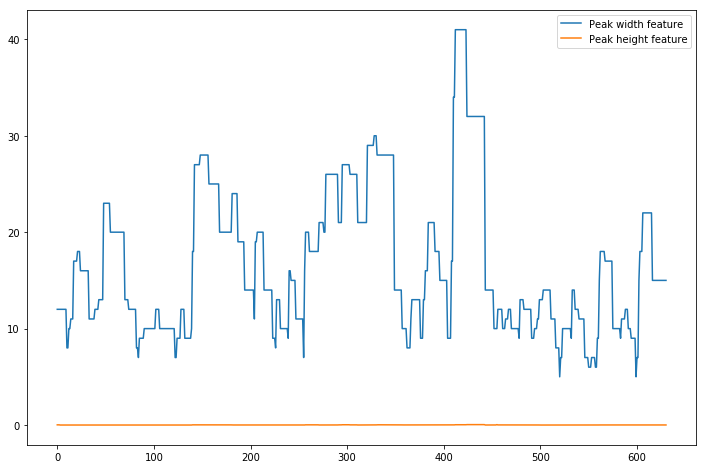

csv frame rate: 30.0
L End reached + -
R End reached + -
[[2.5e+01 9.0e-03]
 [2.5e+01 9.0e-03]
 [2.5e+01 9.0e-03]
 ...
 [2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]]


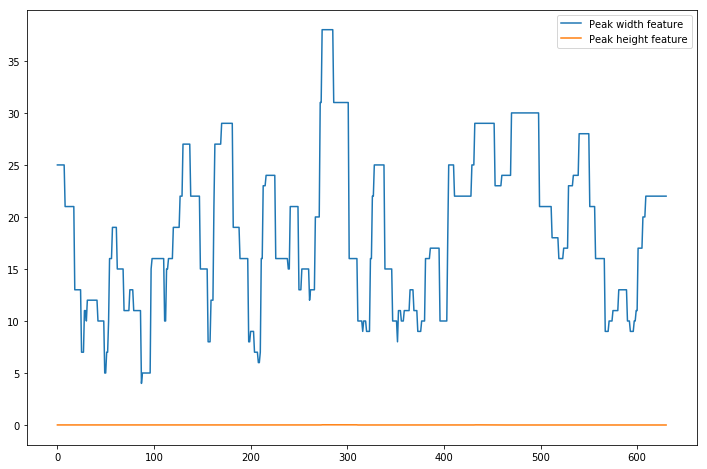


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1

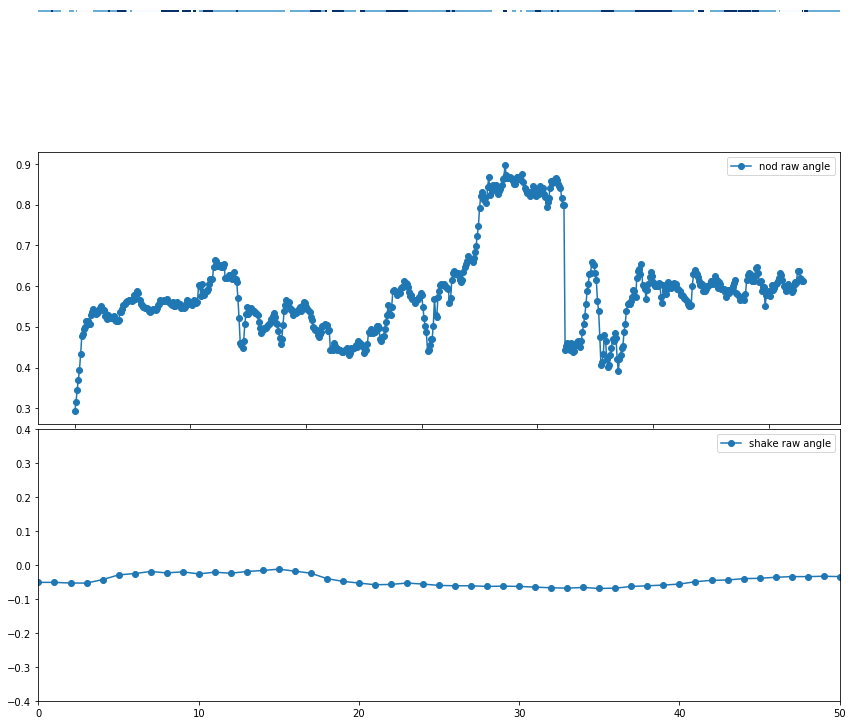

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/366/366_EventToErase/366_EventToErase_FACE.csv
csv frame rate: 30.000697690643968
L End reached + -
R End reached - +
[[8.00000000e+00 8.07413463e-04]
 [8.00000000e+00 8.07413463e-04]
 [8.00000000e+00 8.07413463e-04]
 [8.00000000e+00 8.07413463e-04]
 [6.00000000e+00 8.07413463e-04]
 [6.00000000e+00 8.07413463e-04]
 [6.00000000e+00 8.07413463e-04]
 [4.00000000e+00 1.35816545e-03]
 [5.00000000e+00 1.35816545e-03]
 [5.00000000e+00 1.35816545e-03]
 [1.00000000e+01 4.00674446e-03]
 [1.00000000e+01 4.00674446e-03]
 [1.40000000e+01 6.16548378e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 3.34832461e-03]
 [1.90000000e+01 4.78487412e-03]
 [1.90000000e+01 4.78487412e-03]
 [1.90000000e+01 4.78487412e-03]
 [1.90000000e+01 4.78487412e-03]
 [1.90000000e+01 4.78487412e-03]
 [1

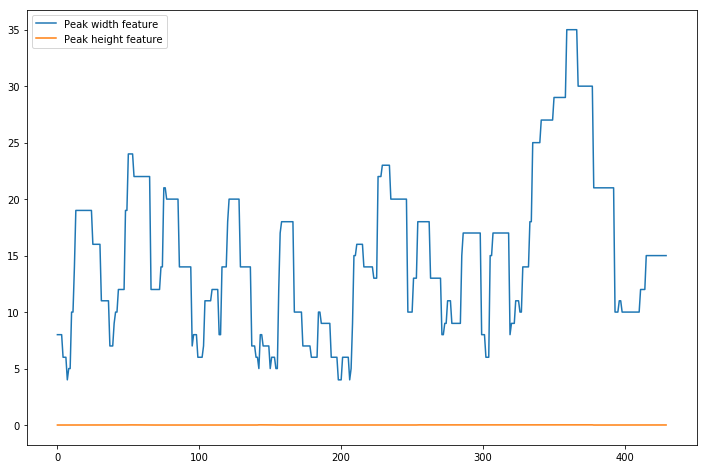

csv frame rate: 30.000697690643968
L End reached - +
R End reached + -
[[7.00000000e+00 7.68711824e-05]
 [7.00000000e+00 7.68711824e-05]
 [7.00000000e+00 7.68711824e-05]
 [7.00000000e+00 7.68711824e-05]
 [7.00000000e+00 7.68711824e-05]
 [4.00000000e+00 7.68711824e-05]
 [4.00000000e+00 7.68711824e-05]
 [5.00000000e+00 2.74773276e-04]
 [5.00000000e+00 8.02554189e-04]
 [6.00000000e+00 8.02554189e-04]
 [6.00000000e+00 8.02554189e-04]
 [7.00000000e+00 8.02554189e-04]
 [9.00000000e+00 7.42747329e-04]
 [9.00000000e+00 7.42747329e-04]
 [9.00000000e+00 1.21399802e-03]
 [9.00000000e+00 1.21399802e-03]
 [9.00000000e+00 1.21399802e-03]
 [1.00000000e+01 1.21399802e-03]
 [1.00000000e+01 1.21399802e-03]
 [1.00000000e+01 1.21399802e-03]
 [9.00000000e+00 2.96152148e-03]
 [9.00000000e+00 2.96152148e-03]
 [1.20000000e+01 3.00786098e-03]
 [1.20000000e+01 3.00786098e-03]
 [1.20000000e+01 3.00786098e-03]
 [1.20000000e+01 3.00786098e-03]
 [1.00000000e+01 3.17847664e-03]
 [1.00000000e+01 3.17847664e-03]
 [1.0

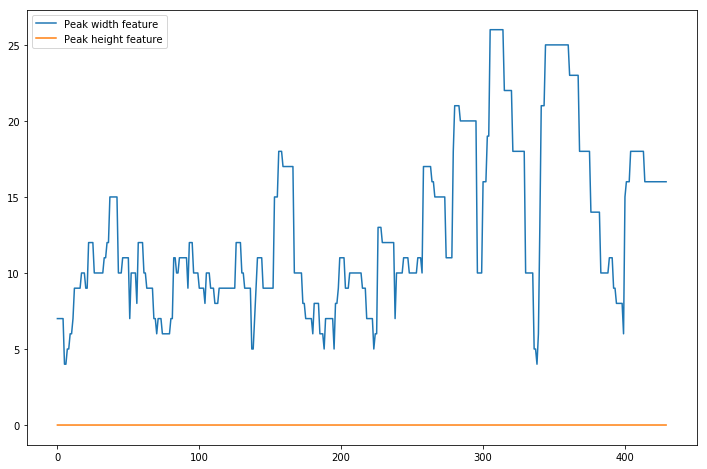


Annotations:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0

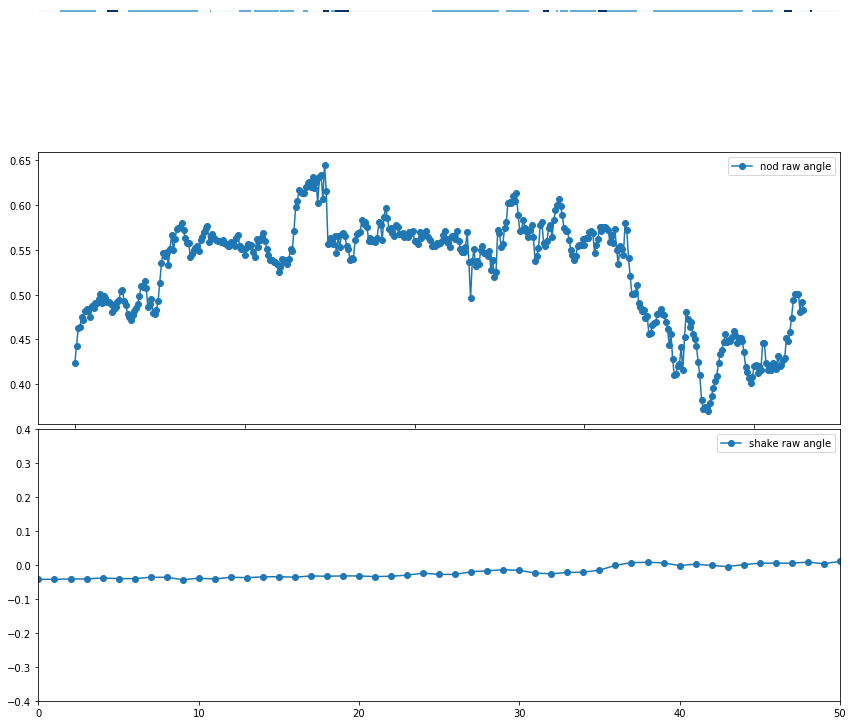

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/366/366_LastArgument/366_LastArgument_FACE.csv
csv frame rate: 30.000244301663695
L End reached + -
R End reached - +
[[8.00000000e+00 2.60041240e-03]
 [8.00000000e+00 2.60041240e-03]
 [8.00000000e+00 2.60041240e-03]
 ...
 [1.60000000e+01 1.36145928e-02]
 [1.60000000e+01 1.36145928e-02]
 [1.60000000e+01 1.36145928e-02]]


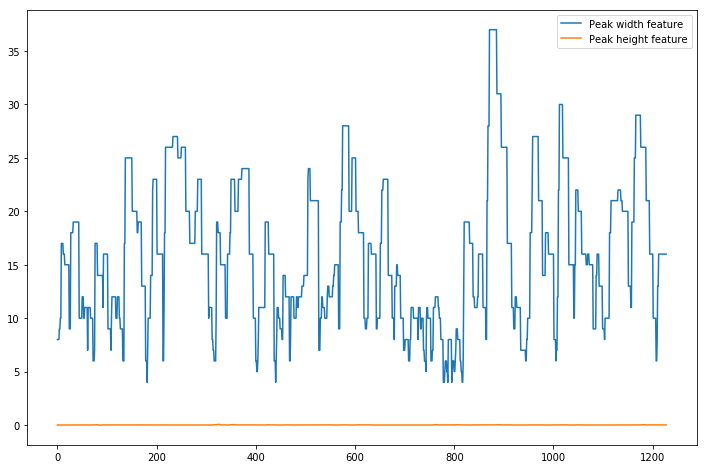

csv frame rate: 30.000244301663695
L End reached + -
R End reached + -
[[1.40000000e+01 3.25638361e-03]
 [1.40000000e+01 3.25638361e-03]
 [1.40000000e+01 3.25638361e-03]
 ...
 [1.70000000e+01 2.86222406e-03]
 [1.70000000e+01 2.86222406e-03]
 [1.70000000e+01 2.86222406e-03]]


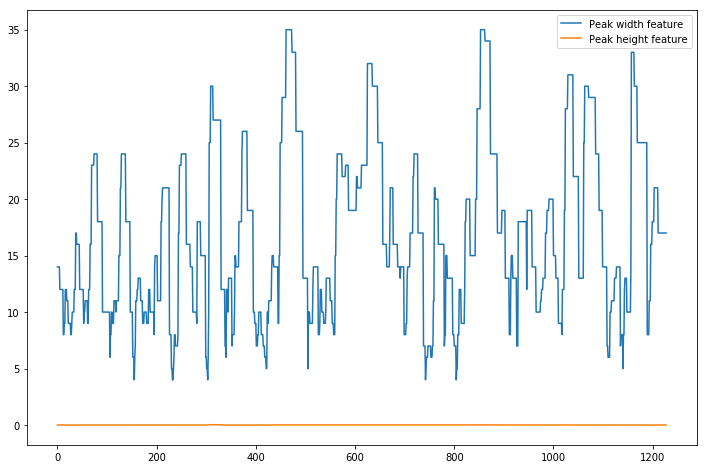


Annotations:
[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2

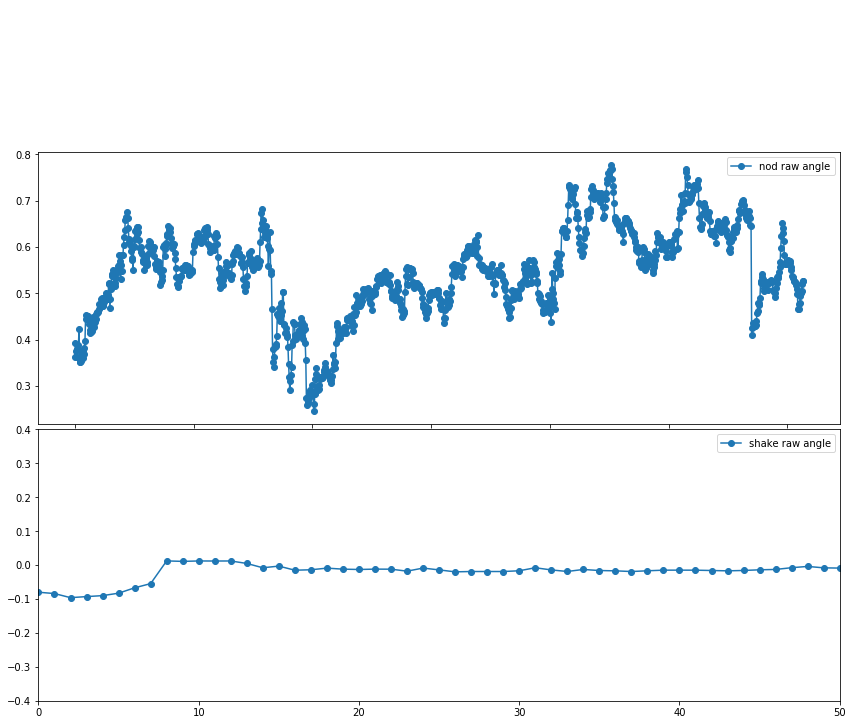

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/366/366_HowCloseToFamily/366_HowCloseToFamily_FACE.csv
csv frame rate: 30.000631592244048
L End reached - +
R End reached + -
[[2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [2.20000000e+01 9.82118250e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.70000000e+01 9.49296209e-03]
 [1.20000000e+01 2.20644485e-03]
 [1.20000000e+01 2.20644485e-03]
 [1.20000000e+01 2.20644485e-03]
 [1.20000000e+01 2.20644485e-03]
 [1.20000000e+01 2.20644485e-03]
 [1.20000000e+01 2.20644485e-03]
 [9.00000000e+00 2.20644485e-03]
 [9.00000000e+00 2.20644485e

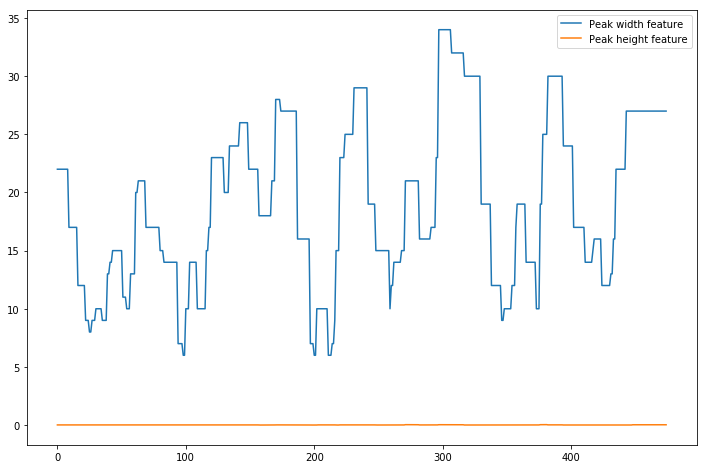

csv frame rate: 30.000631592244048
L End reached + -
R End reached + -
[[1.90000000e+01 9.98040975e-04]
 [1.90000000e+01 9.98040975e-04]
 [1.90000000e+01 9.98040975e-04]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.80000000e+01 3.52725848e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.60000000e+01 6.78383794e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.50000000e+01 5.83208880e-03]
 [2.5

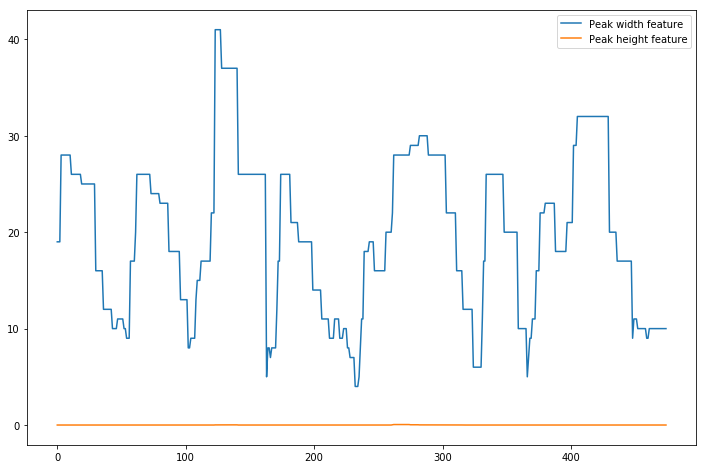


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2

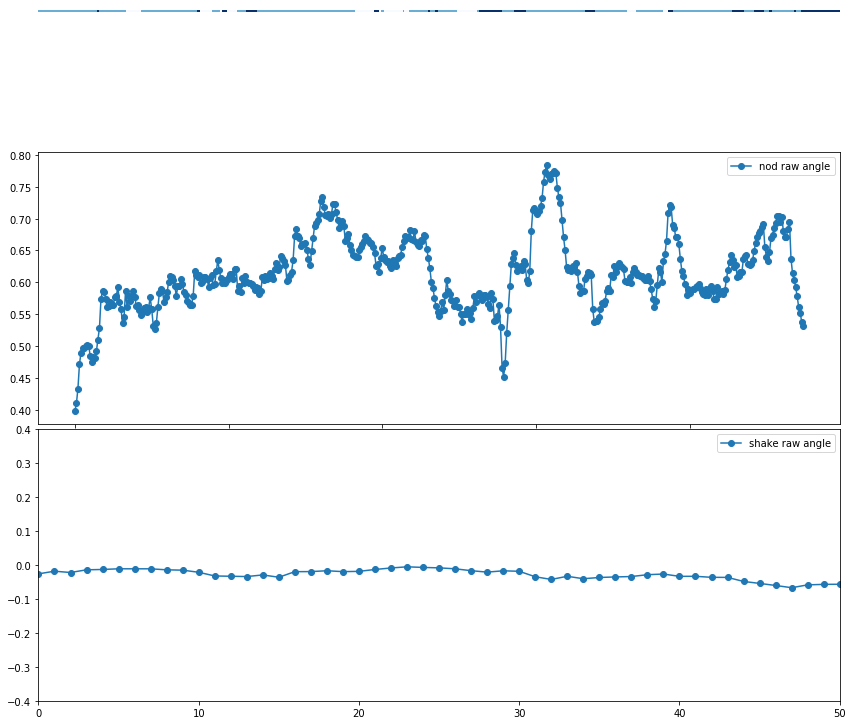

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/366/366_MostProudOf/366_MostProudOf_FACE.csv
csv frame rate: 29.99958449328957
L End reached - +
R End reached - +
[[1.3e+01 1.0e-03]
 [1.3e+01 1.0e-03]
 [1.3e+01 1.0e-03]
 ...
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]
 [2.1e+01 4.0e-03]]


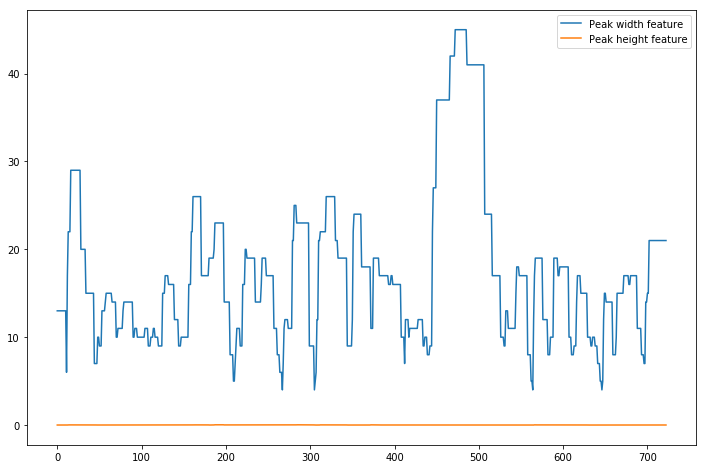

csv frame rate: 29.99958449328957
L End reached - +
R End reached + -
[[2.8e+01 6.0e-03]
 [2.8e+01 6.0e-03]
 [2.8e+01 6.0e-03]
 ...
 [1.1e+01 3.0e-03]
 [1.1e+01 3.0e-03]
 [1.1e+01 3.0e-03]]


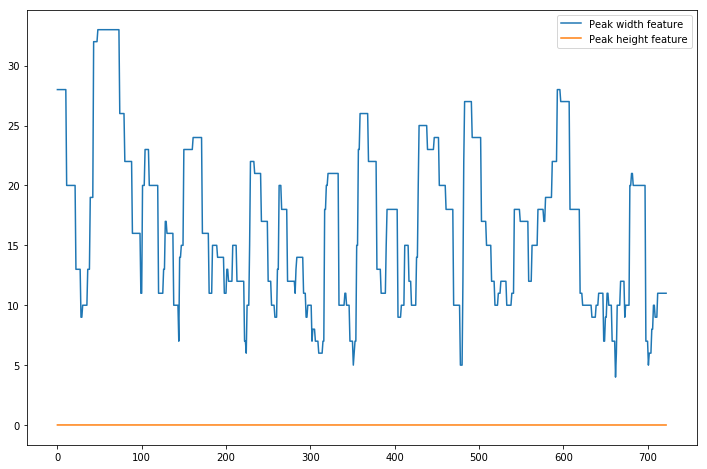


Annotations:
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 1, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1

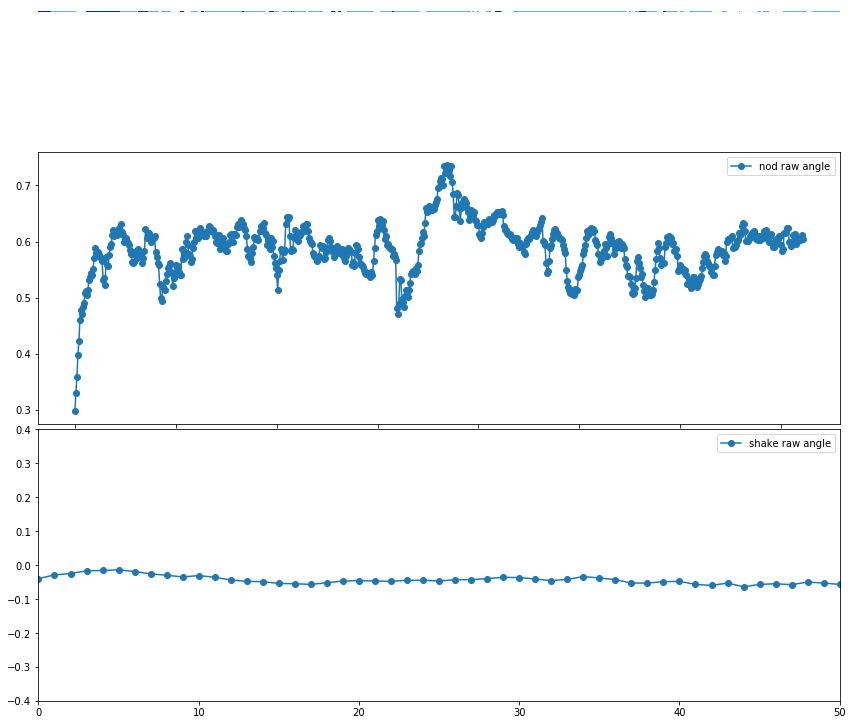

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_MostProudOf/445_MostProudOf_FACE.csv
csv frame rate: 30.001119444755403
L End reached + -
R End reached - +
[[1.90000000e+01 1.47500366e-02]
 [1.90000000e+01 1.47500366e-02]
 [1.90000000e+01 1.47500366e-02]
 [1.90000000e+01 1.47500366e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [2.00000000e+01 1.78353324e-02]
 [1.20000000e+01 1.13114760e-02]
 [1.20000000e+01 1.13114760e-02]
 [1.20000000e+01 1.13114760e-02]
 [1.20000000e+01 1.13114760e-02]
 [1.10000000e+01 6.59488228e-04]
 [1.10000000e+01 6.59488228e-04]
 [1.10000000e+01 6.59488228e-04]
 [1.10000000e+01 6.59488228e-04]
 [1.10000000e+01 9.81038952e-04]
 [1.1

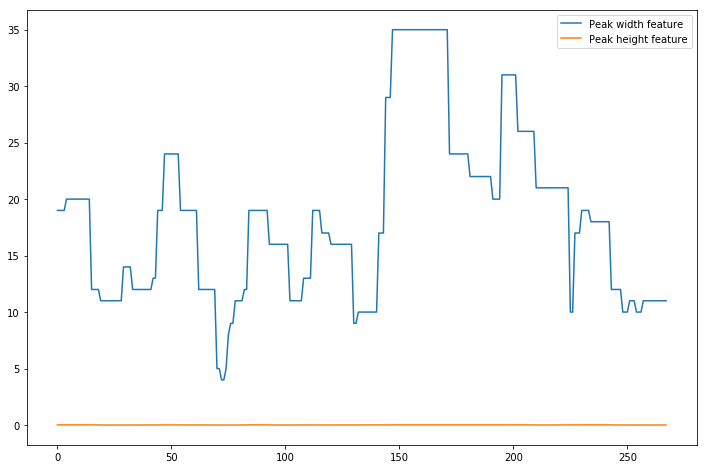

csv frame rate: 30.001119444755403
L End reached - +
R End reached - +
[[1.60000000e+01 6.52263488e-03]
 [1.60000000e+01 6.52263488e-03]
 [1.60000000e+01 6.52263488e-03]
 [1.60000000e+01 6.52263488e-03]
 [1.60000000e+01 6.52263488e-03]
 [1.70000000e+01 7.15278625e-03]
 [1.70000000e+01 7.15278625e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.60000000e+01 3.99267527e-03]
 [1.10000000e+01 3.99267527e-03]
 [1.10000000e+01 3.99267527e-03]
 [1.10000000e+01 3.99267527e-03]
 [1.10000000e+01 3.99267527e-03]
 [1.10000000e+01 3.99267527e-03]
 [1.00000000e+01 4.00605788e-03]
 [1.10000000e+01 3.18258698e-03]
 [1.10000000e+01 3.18258698e-03]
 [1.10000000e+01 3.18258698e-03]
 [1.10000000e+01 3.18258698e-03]
 [1.00000000e+01 4.33439317e-04]
 [1.00000000e+01 4.33439317e-04]
 [1.0

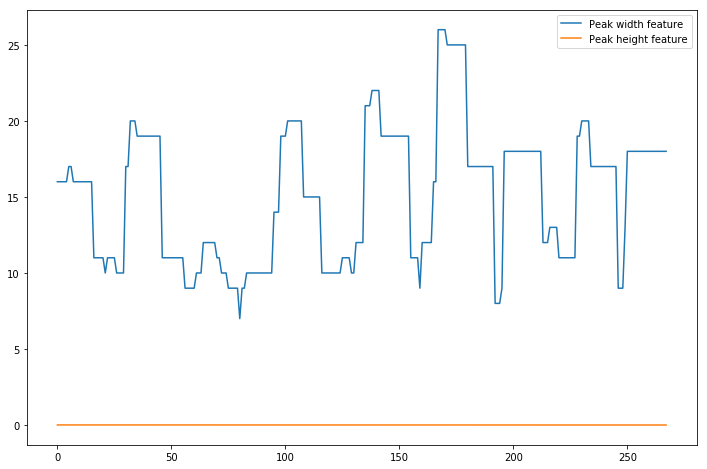


Annotations:
[2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Probabilities:
[array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 0., 1.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.

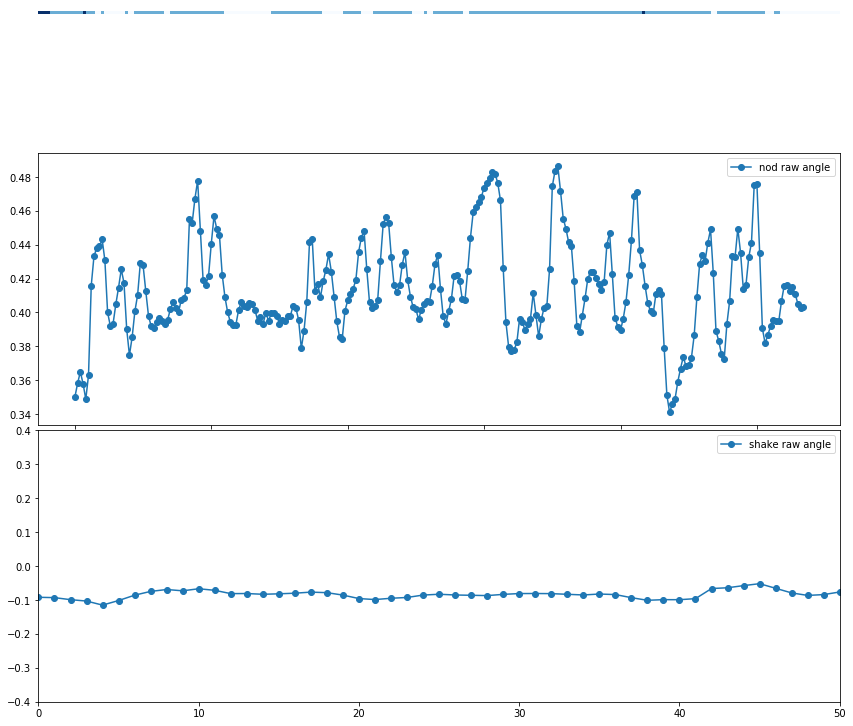

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_Guilty/445_Guilty_FACE.csv
csv frame rate: 29.99944030894946
L End reached - +
R End reached + -
[[1.4e+01 1.0e-03]
 [1.4e+01 1.0e-03]
 [1.4e+01 1.0e-03]
 ...
 [1.8e+01 1.2e-02]
 [1.8e+01 1.2e-02]
 [1.8e+01 1.2e-02]]


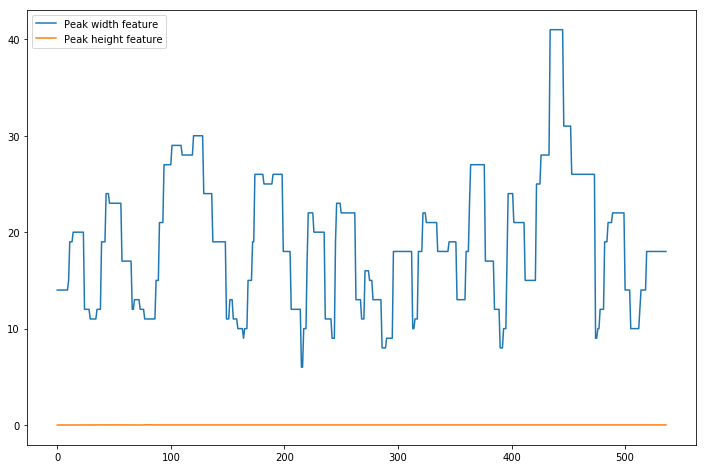

csv frame rate: 29.99944030894946
L End reached + -
R End reached - +
[[2.5e+01 3.0e-03]
 [2.5e+01 3.0e-03]
 [2.5e+01 3.0e-03]
 ...
 [1.2e+01 4.0e-03]
 [1.2e+01 4.0e-03]
 [1.2e+01 4.0e-03]]


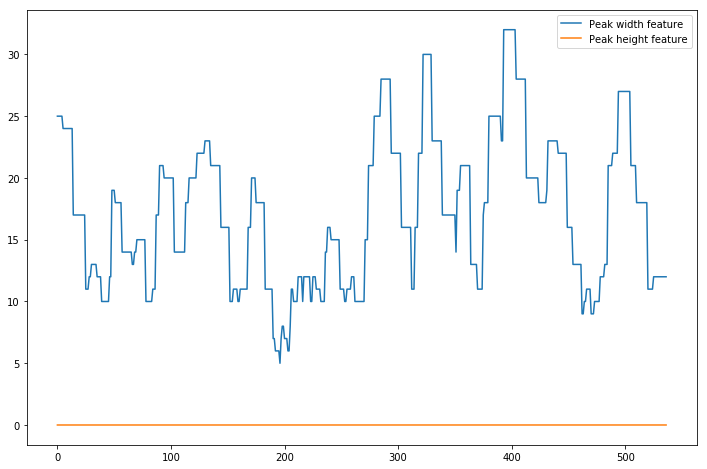


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

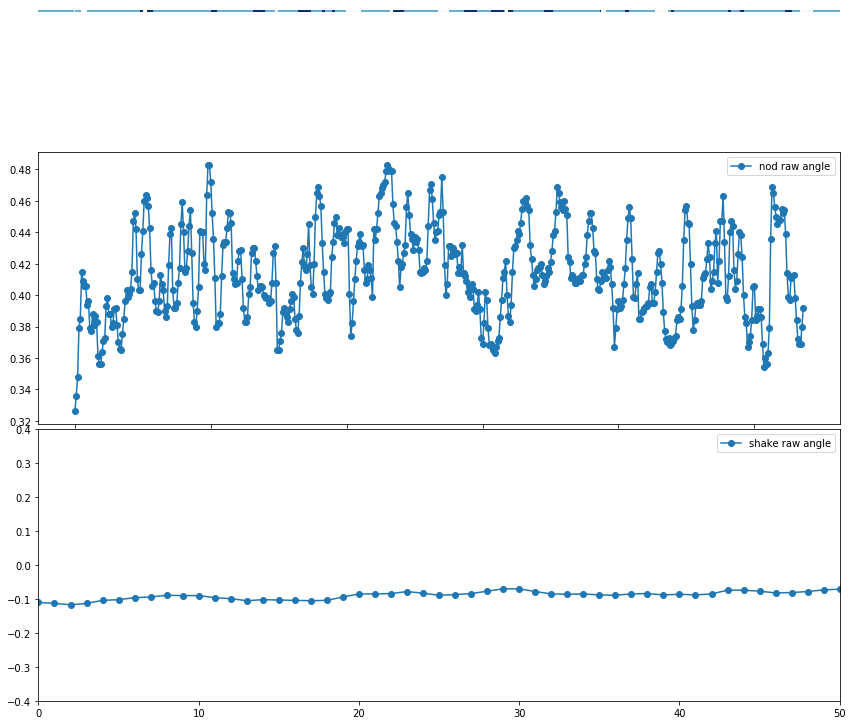

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_LastTimeHappy/445_LastTimeHappy_FACE.csv
csv frame rate: 30.00099671085419
L End reached + -
R End reached + -
[[2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.30000000e+01 1.59152050e-02]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [2.00000000e+01 7.86882124e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.60000000e+01 7.88352486e-03]
 [1.10000000e+01 8.25360248e-03]
 [

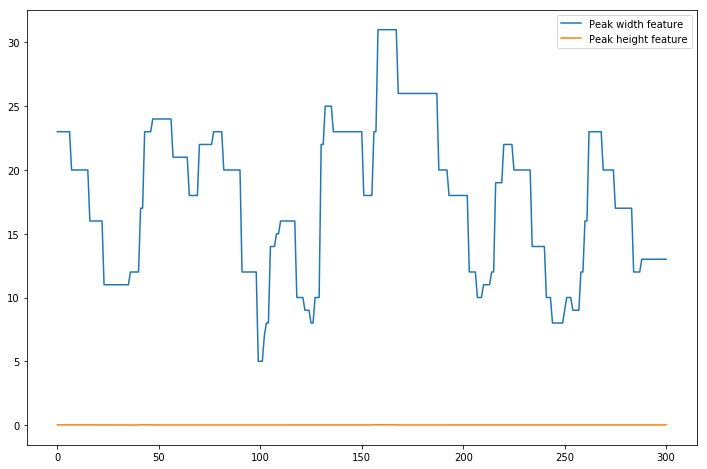

csv frame rate: 30.00099671085419
L End reached + -
R End reached + -
[[2.40000000e+01 4.87874937e-03]
 [2.40000000e+01 4.87874937e-03]
 [2.40000000e+01 4.87874937e-03]
 [2.40000000e+01 4.87874937e-03]
 [2.40000000e+01 4.87874937e-03]
 [2.40000000e+01 4.87874937e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [2.20000000e+01 5.40434799e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [1.50000000e+01 1.47493734e-03]
 [2.30000000e+01 2.83606663e-03]
 [2.30000000e+01 2.83606663e-03]
 [2.30000000e+01 2.83606663e-03]
 [2.90000000e+01 7.32035298e-03]
 [2.90

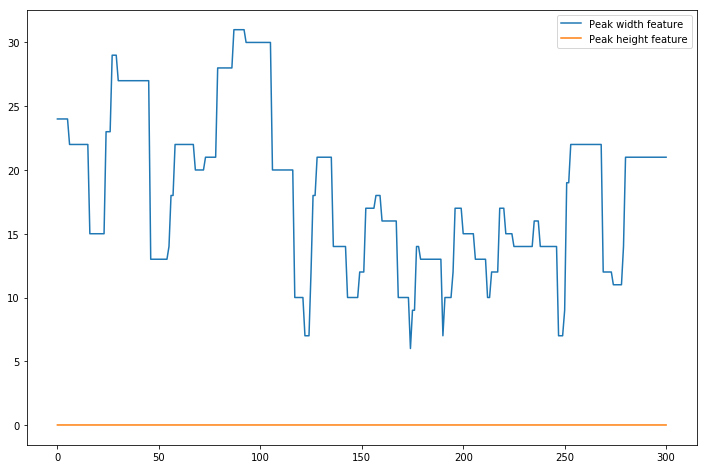


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), ar

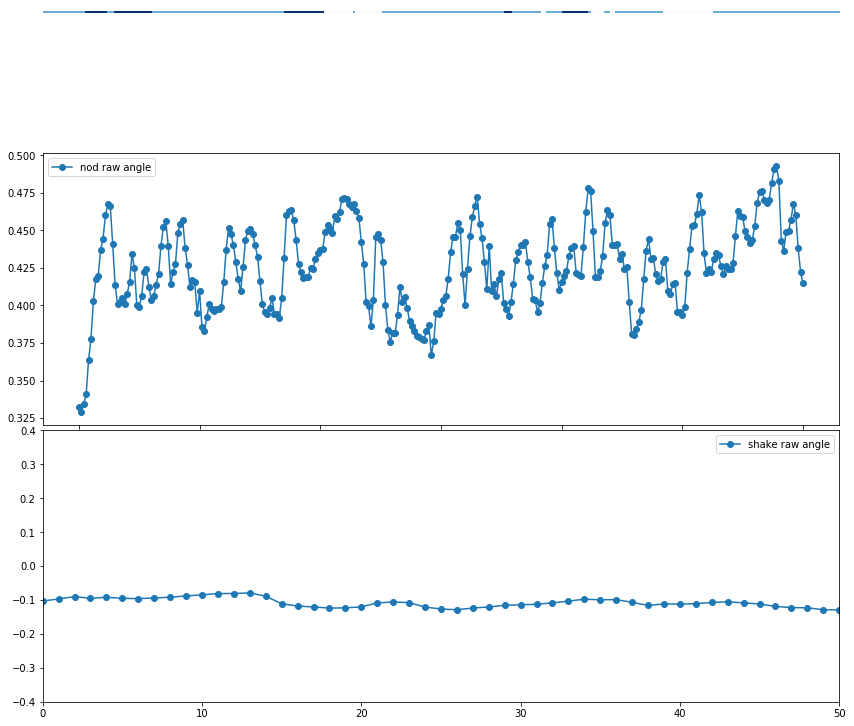

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_SituationHandledDifferent/445_SituationHandledDifferent_FACE.csv
csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.30000000e+01 5.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [1.10000000e+01 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [7.00000000e+00 2.00000000e-03]
 [5.00000000e+00 1.00000000e-03]
 [5.00000000e+00 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.40000000e+01 4.00000000e-03]
 [2.20000000e+01 2.00000000e-03]
 [2.20000000e+01 2.00000000e-03]
 [2.20000000e+01 2.00000

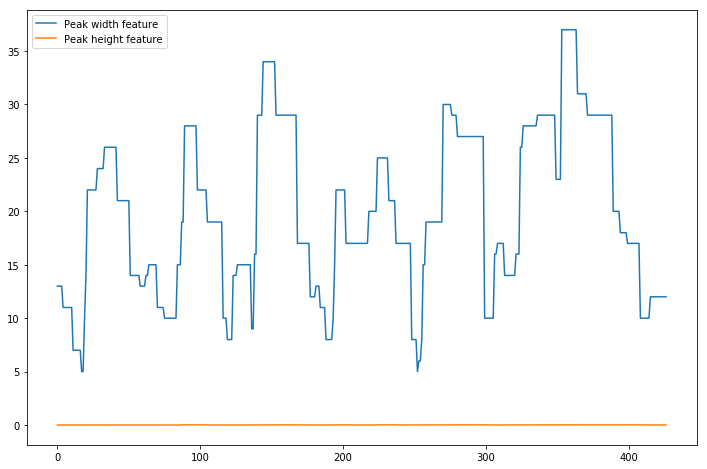

csv frame rate: 30.0
L End reached + -
R End reached + -
[[1.60000000e+01 5.00000000e-03]
 [1.60000000e+01 5.00000000e-03]
 [1.60000000e+01 5.00000000e-03]
 [1.60000000e+01 5.00000000e-03]
 [1.60000000e+01 5.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [9.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [1.30000000e+01 1.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 3.00000000e-03]
 [1.50000000e+01 3.00000000e-03]
 [1.50000000e+01 3.00000000e-03]
 [1.50000000e+01 3.00000000e-03]
 [1.50000000e+01 3.00000000e-03]
 [1.50000000e+01 3.

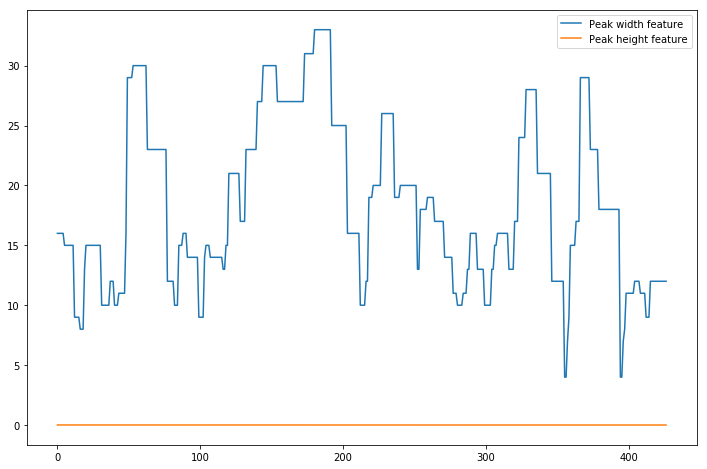


Annotations:
[0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1

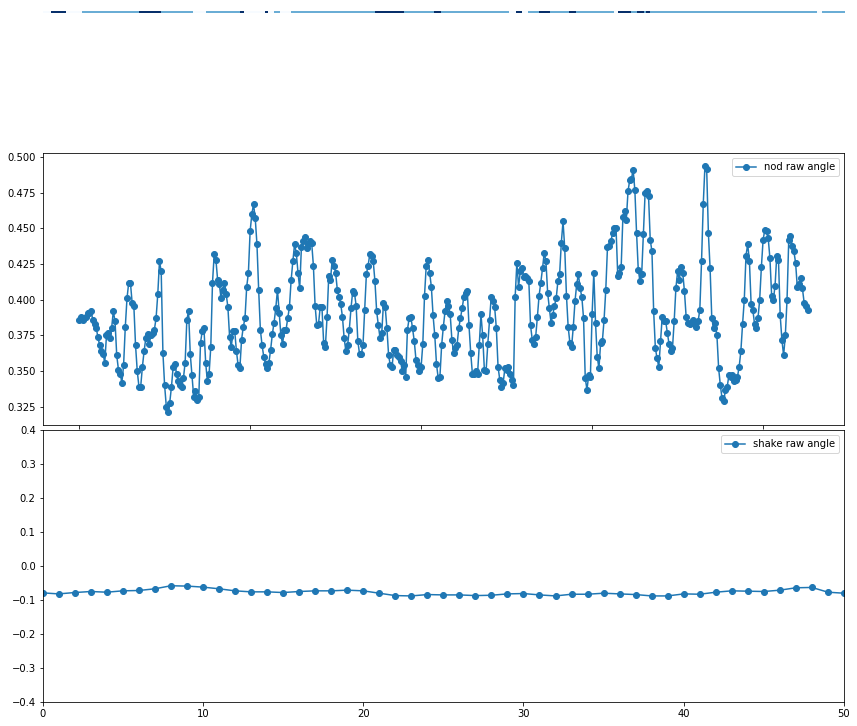

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_HardestDecision/445_HardestDecision_FACE.csv
csv frame rate: 29.99945554527141
L End reached + -
R End reached - +
[[9.0e+00 7.0e-03]
 [9.0e+00 7.0e-03]
 [9.0e+00 7.0e-03]
 ...
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]
 [2.0e+01 1.6e-02]]


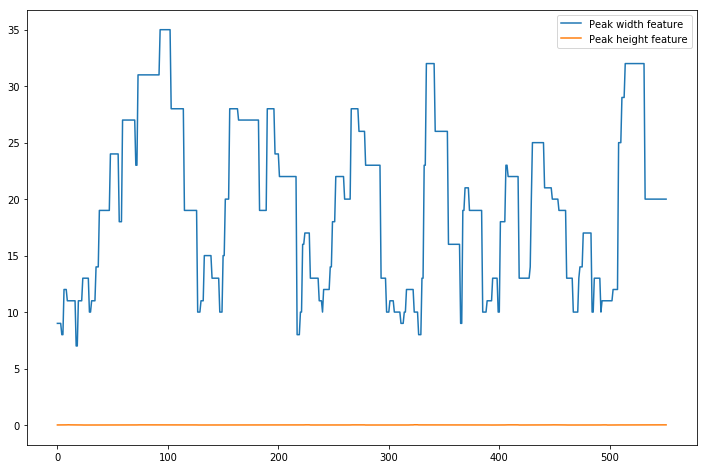

csv frame rate: 29.99945554527141
L End reached + -
R End reached - +
[[1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 [1.7e+01 3.0e-03]
 ...
 [2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]
 [2.2e+01 4.0e-03]]


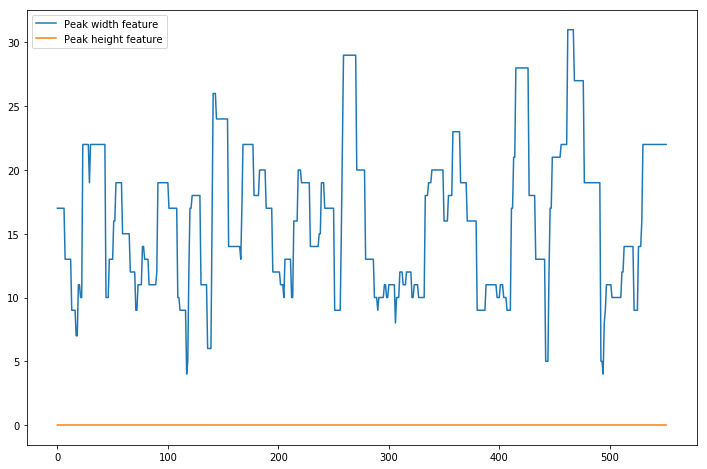


Annotations:
[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0

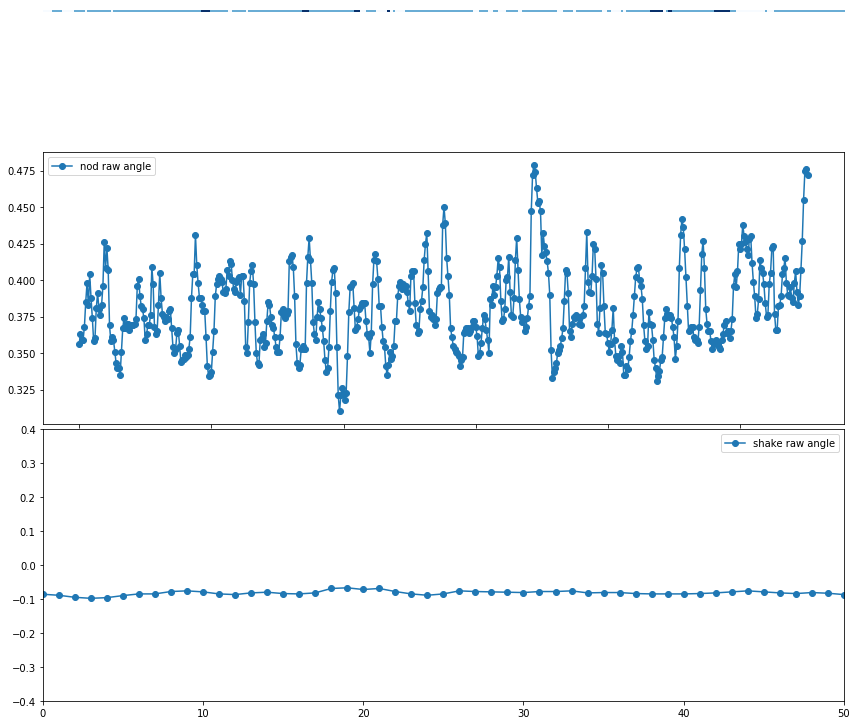

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_LastArgument/445_LastArgument_FACE.csv
csv frame rate: 30.000656469506993
L End reached - +
R End reached + -
[[2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [2.30000000e+01 7.94491506e-03]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.70000000e+01 1.39025699e-02]
 [1.00000000e+01 1.31225069e-02]
 [1.00000000e+01 1.31225069e-02]
 [1.00000000e+01 1.31225069e-02]
 [1.00000000e+01 1.39754530e-02]
 [1

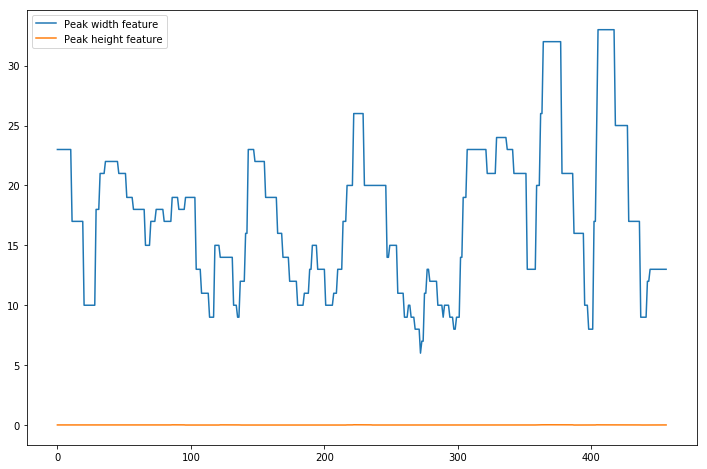

csv frame rate: 30.000656469506993
L End reached + -
R End reached + -
[[2.10000000e+01 4.03407456e-03]
 [2.10000000e+01 4.03407456e-03]
 [2.10000000e+01 4.03407456e-03]
 [2.10000000e+01 4.03407456e-03]
 [2.10000000e+01 4.03407456e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.90000000e+01 4.55029250e-03]
 [1.00000000e+01 4.55029250e-03]
 [1.00000000e+01 4.55029250e-03]
 [1.00000000e+01 4.55029250e-03]
 [1.60000000e+01 2.54332578e-03]
 [1.60000000e+01 2.54332578e-03]
 [1.60000000e+01 5.21239930e-03]
 [1.60000000e+01 5.21239930e-03]
 [1.60000000e+01 5.21239930e-03]
 [1.60000000e+01 5.21239930e-03]
 [1.30000000e+01 1.78548866e-03]
 [1.3

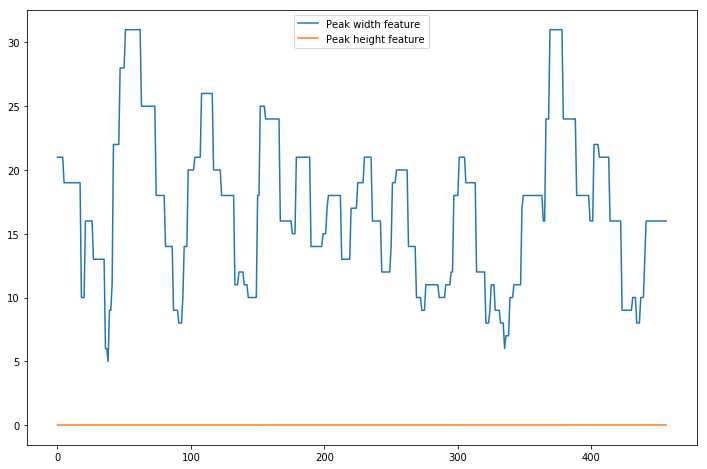


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

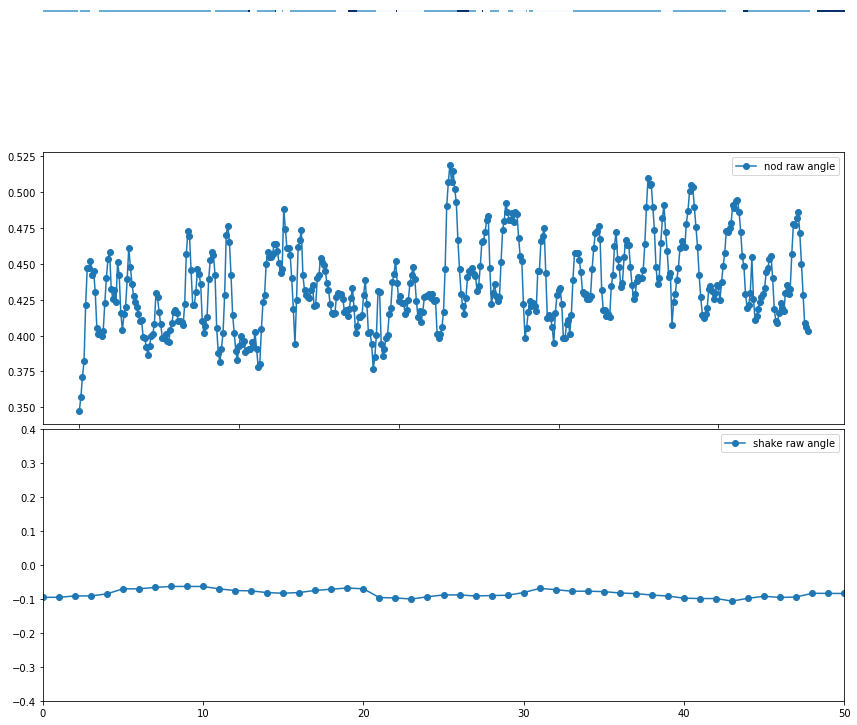

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/445/445_EventToErase/445_EventToErase_FACE.csv
csv frame rate: 30.0
L End reached - +
R End reached + -
[[1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [1.50000000e+01 2.00000000e-03]
 [2.30000000e+01 1.00000000e-02]
 [2.30000000e+01 1.00000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 1.20000000e-02]
 [2.60000000e+01 

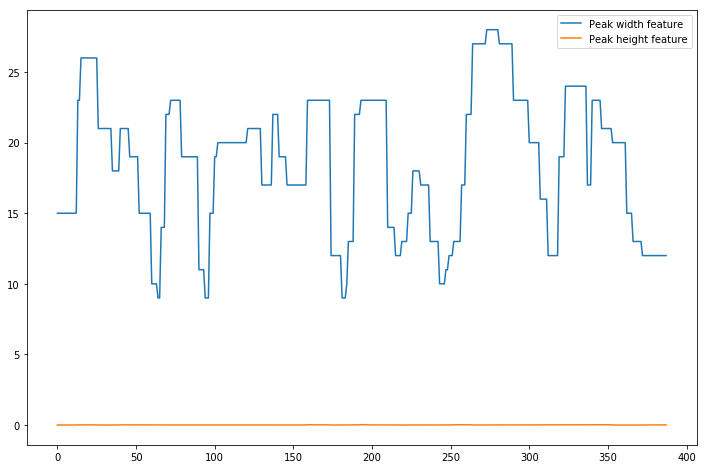

csv frame rate: 30.0
L End reached - +
R End reached - +
[[1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [1.00000000e+01 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [7.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [8.00000000e+00 1.00000000e-03]
 [1.80000000e+01 1.00000000e-03]
 [2.30000000e+01 3.00000000e-03]
 [2.30000000e+01 3.00000000e-03]
 [2.30000000e+01 3.00000000e-03]
 [2.30000000e+01 3.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [2.10000000e+01 2.00000000e-03]
 [1.40000000e+01 8.32667268e-17]
 [1.40000000e+01 8.

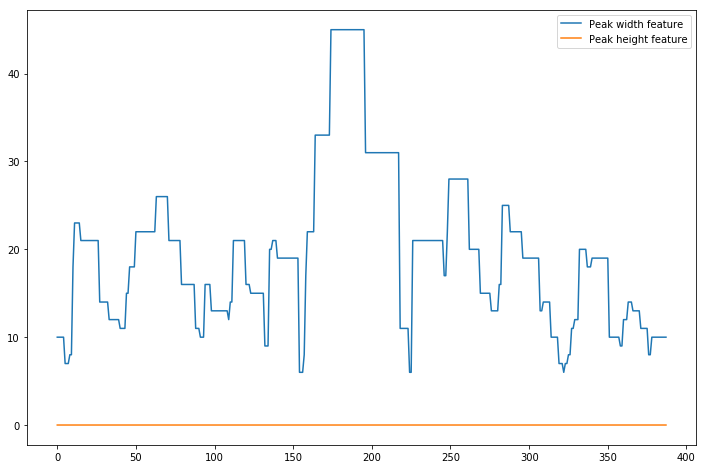


Annotations:
[0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1

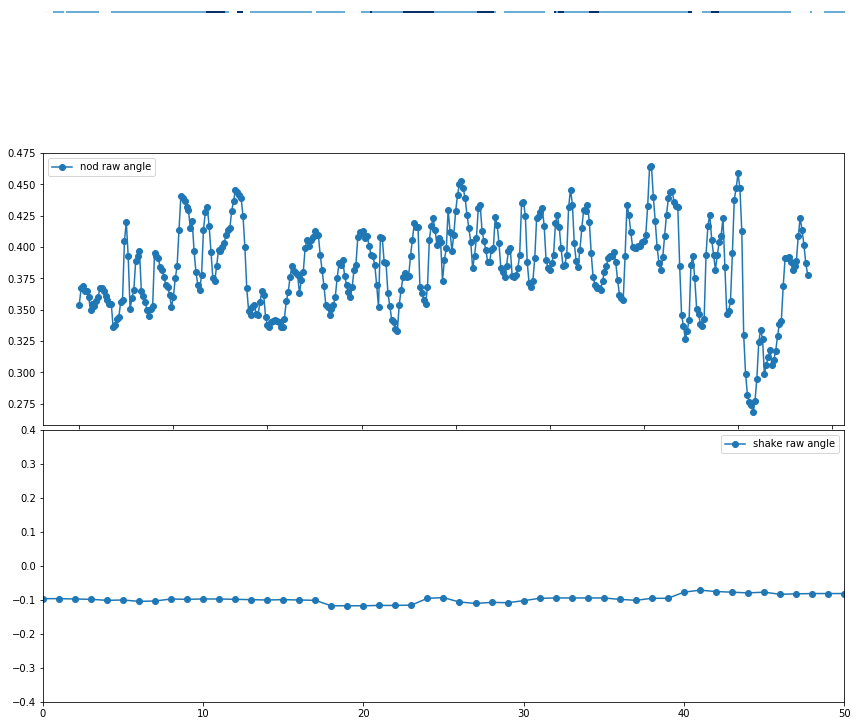

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/383/383_HowCloseToFamily/383_HowCloseToFamily_FACE.csv
csv frame rate: 29.999776121073722
L End reached - +
R End reached - +
[[3.4e+01 6.0e-03]
 [3.4e+01 6.0e-03]
 [3.4e+01 6.0e-03]
 ...
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]
 [2.2e+01 7.0e-03]]


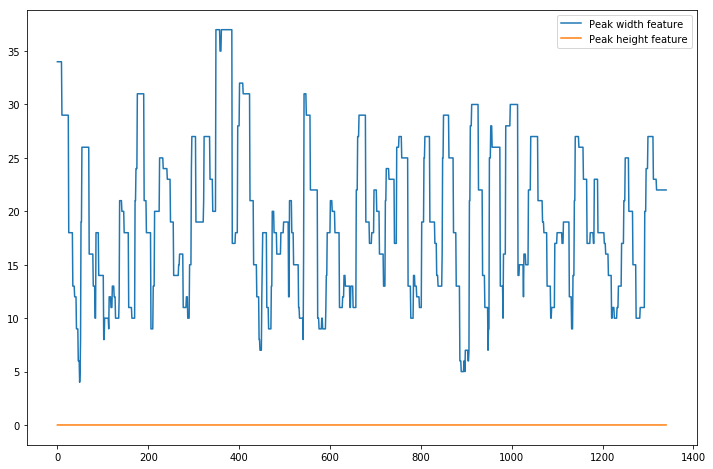

csv frame rate: 29.999776121073722
L End reached + -
R End reached + -
[[9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 [9.0e+00 1.0e-03]
 ...
 [1.6e+01 3.0e-03]
 [1.6e+01 3.0e-03]
 [1.6e+01 3.0e-03]]


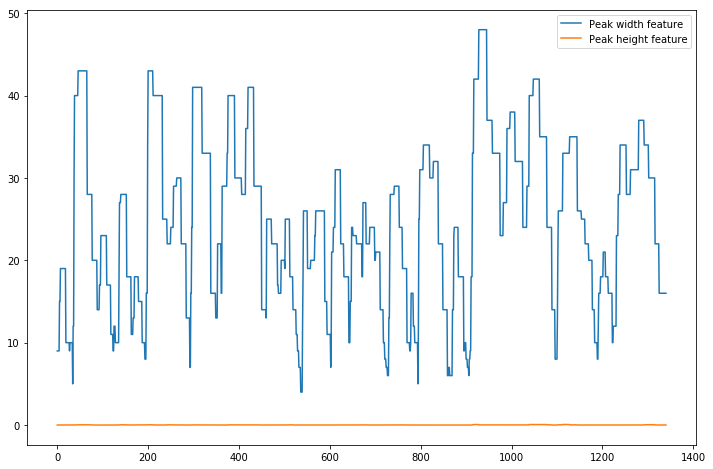


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

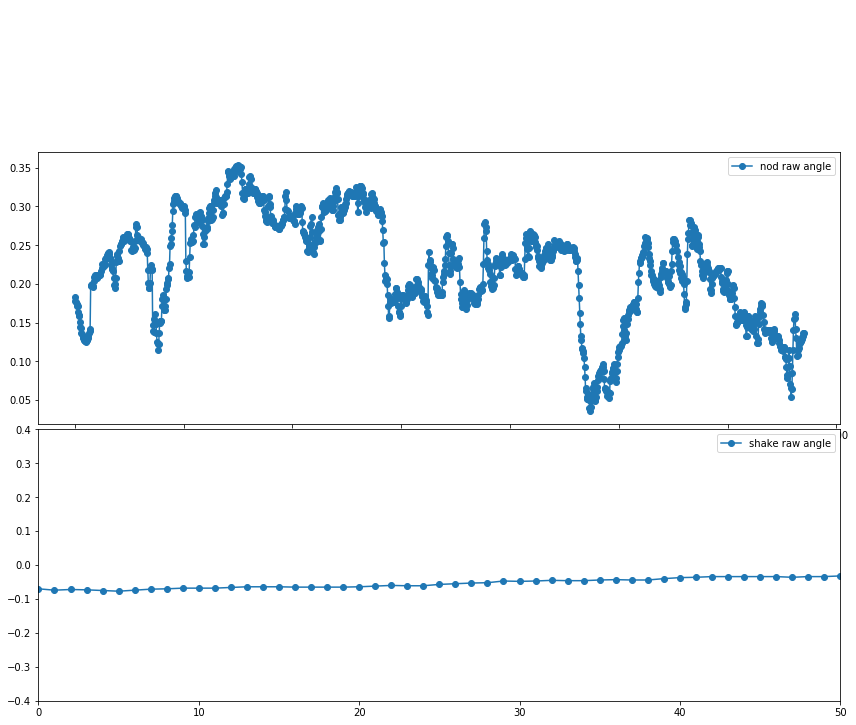

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/383/383_Guilty/383_Guilty_FACE.csv
csv frame rate: 29.998986520725648
L End reached - +
R End reached + -
[[2.40000000e+01 7.00000000e-03]
 [2.40000000e+01 7.00000000e-03]
 [2.40000000e+01 7.00000000e-03]
 [2.40000000e+01 7.00000000e-03]
 [2.40000000e+01 7.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.50000000e+01 4.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [2.40000000e+01 2.00000000e-03]
 [1.80000000e+0

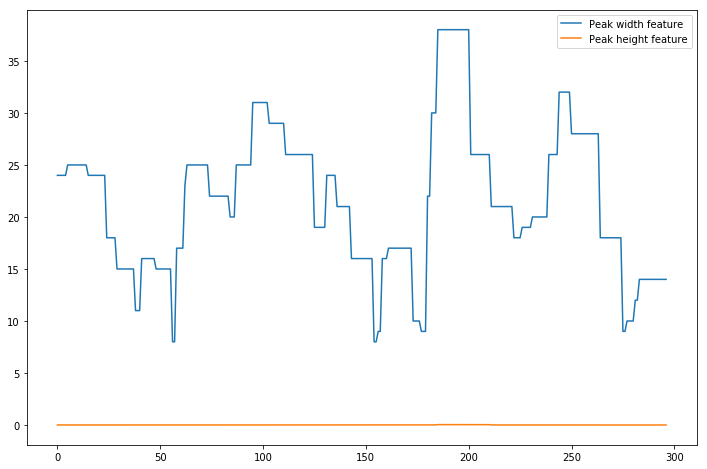

csv frame rate: 29.998986520725648
L End reached + -
R End reached - +
[[3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [3.00000000e+01 1.10000000e-02]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.40000000e+01 1.38777878e-17]
 [1.1

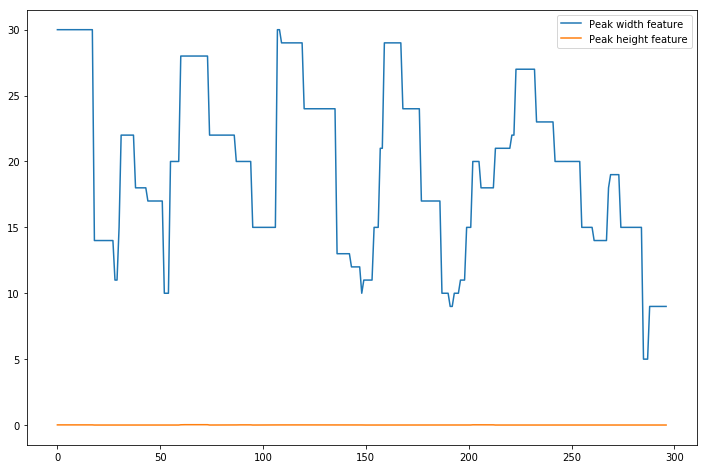


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

Probabilities:
[array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1., 0.]), array([0., 1.,

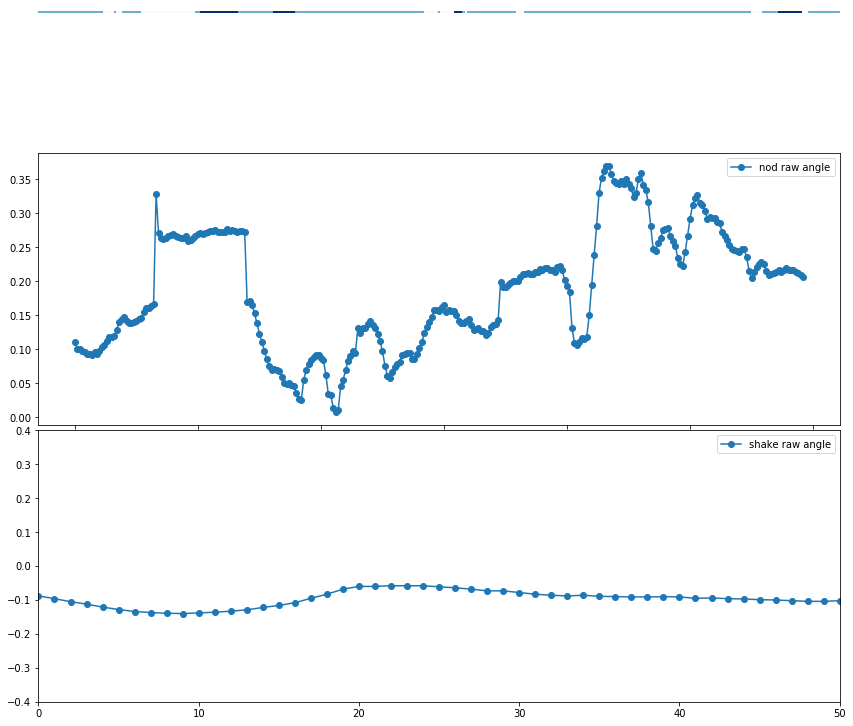

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/383/383_SituationHandledDifferent/383_SituationHandledDifferent_FACE.csv
csv frame rate: 29.99977511412958
L End reached - +
R End reached + -
[[2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 [2.3e+01 3.0e-03]
 ...
 [2.5e+01 2.1e-02]
 [2.5e+01 2.1e-02]
 [2.5e+01 2.1e-02]]


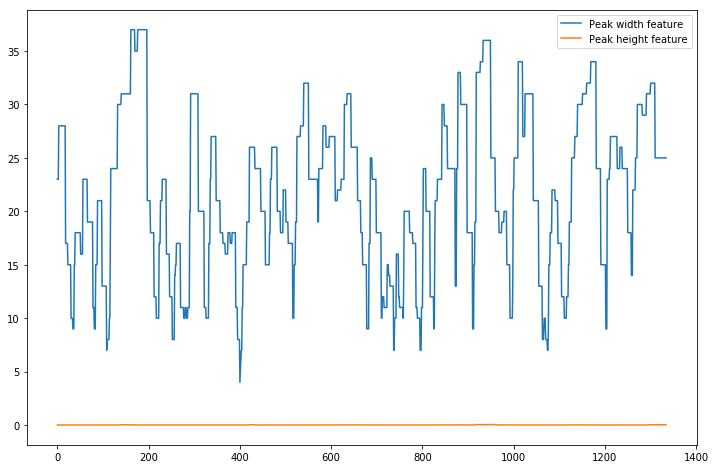

csv frame rate: 29.99977511412958
L End reached + -
R End reached + -
[[1.5e+01 2.0e-03]
 [1.5e+01 2.0e-03]
 [1.5e+01 2.0e-03]
 ...
 [2.0e+01 1.1e-02]
 [2.0e+01 1.1e-02]
 [2.0e+01 1.1e-02]]


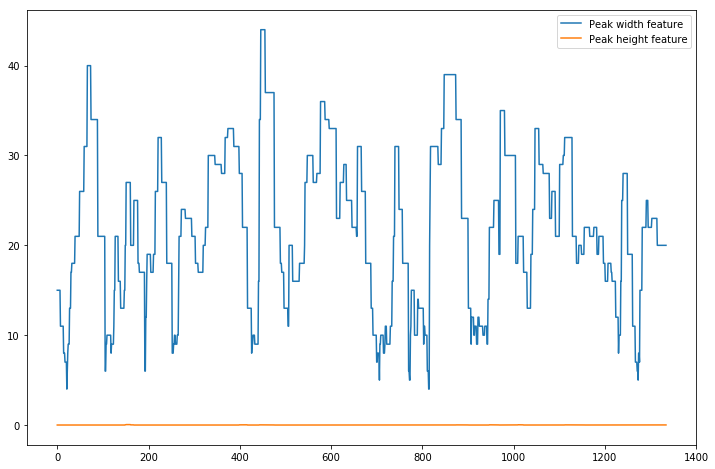


Annotations:
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1

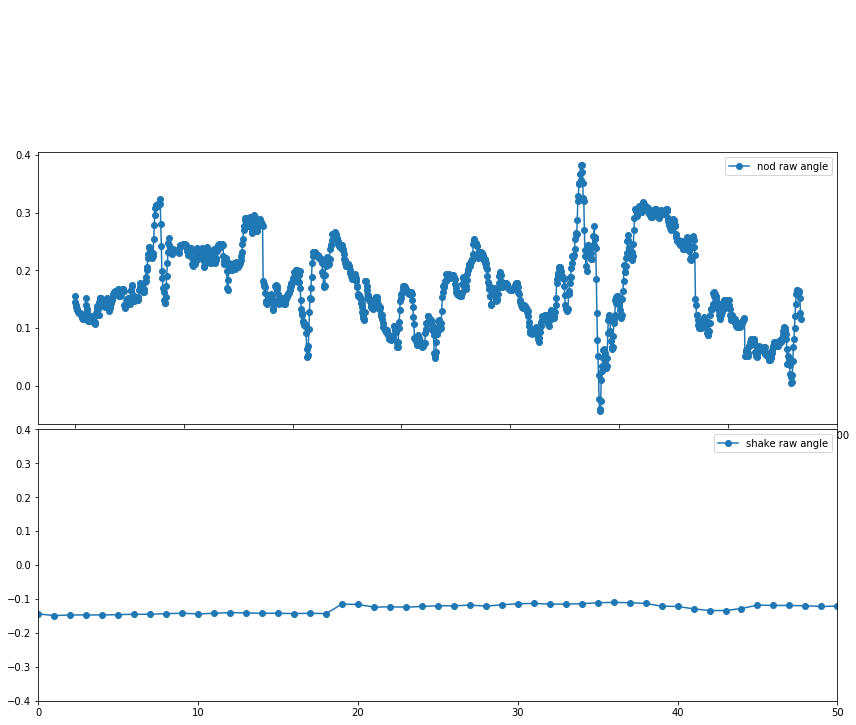

Processing: /home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/dcaps/segment/383/383_HardestDecision/383_HardestDecision_FACE.csv
csv frame rate: 29.999999999999996
L End reached - +
R End reached - +
[[1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]
 [1.7e+01 4.0e-03]
 ...
 [1.4e+01 4.0e-03]
 [1.4e+01 4.0e-03]
 [1.4e+01 4.0e-03]]


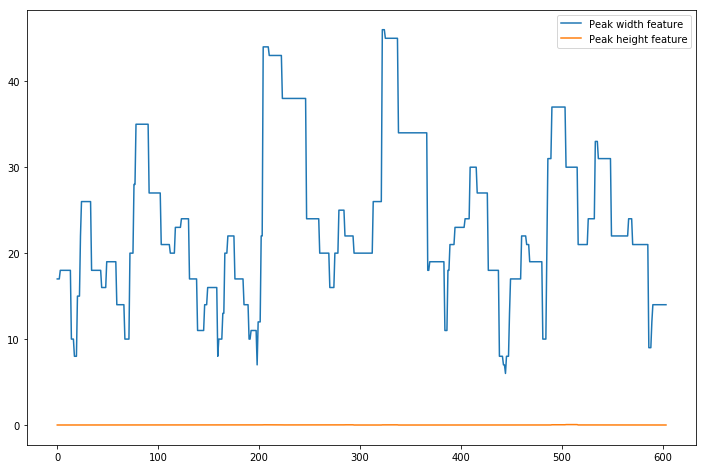

csv frame rate: 29.999999999999996
L End reached - +
R End reached + -
[[1.00000000e+01 2.77555756e-17]
 [1.00000000e+01 2.77555756e-17]
 [1.00000000e+01 2.77555756e-17]
 ...
 [2.00000000e+01 6.00000000e-03]
 [2.00000000e+01 6.00000000e-03]
 [2.00000000e+01 6.00000000e-03]]


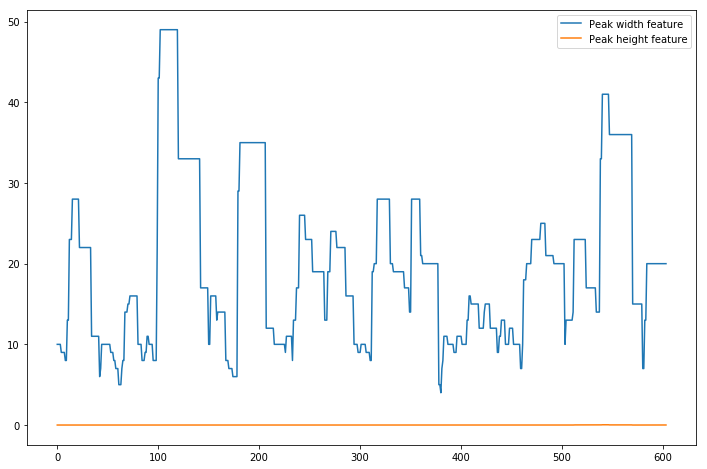

KeyboardInterrupt: 

In [17]:
from utils import get_perframe_features
import glob
import pandas as pd

# Uses dcaps and nvb folders
input_dir = '/home/ICT2000/jondras/ICMI-head-motion-detection/kalins_data/*/segment'
output_filename_suffix = 'HEAD3'

output_file_header = ['other probability', 'nod probability', 'shake probability', 'annotation']
verbose = True
# verbose = False

dcaps_cnt = 0
nvb_cnt = 0
# For each file
for csv_file in glob.glob(os.path.join(input_dir, '*/*/*_FACE.csv')):
    
    if 'dcaps' in csv_file:
        dcaps_cnt += 1
    elif 'nvb' in csv_file:
        nvb_cnt += 1
    
    print(f'Processing: {csv_file}')
    df = pd.read_csv(csv_file)
    x_features, x_angles = get_perframe_features(df, angle_type='x', verbose=verbose)
    y_features, y_angles = get_perframe_features(df, angle_type='y', verbose=verbose)
    
    annotations = []
    probabilities = []
    output_rows = []
    
    for x_wh, y_wh in zip(x_features, y_features):
        
        # Z-normalize inputs
        znorm_input_X = znorm_scaler.transform([[*x_wh, *y_wh]])    
        
        ann = knn_final.predict(znorm_input_X)[0]
        probab = knn_final.predict_proba(znorm_input_X)[0]
        
        annotations.append(ann)
        probabilities.append(probab)
        output_rows.append([*probab, ann])
        
    if verbose:
        print(f'\nAnnotations:\n{annotations}')
#         print(f'\nProbabilities:\n{probabilities}')
        # Plot
        plt.figure(figsize=(12,12))
        plt.subplot(311)
        plt.imshow([annotations], cmap='Blues')
        plt.axis('off')
        plt.subplot(312)
        plt.plot(x_angles, '-o', label='nod raw angle')
        plt.legend()
        plt.subplot(313)
        plt.plot(y_angles, '-o', label='shake raw angle')
        plt.legend()
        plt.tight_layout(h_pad=-1.5)
        plt.xlim(0, 50)
        plt.ylim(-0.4, 0.4)
        plt.show()
    
    # Save final_annotations as a new csv file
    ann_df = pd.DataFrame(output_rows, columns=output_file_header)
    input_filepath = csv_file.split('/')
    output_filepath = os.path.join('/'.join(input_filepath[:-1]), input_filepath[-1][:-8] + output_filename_suffix + '.csv')
    ann_df.to_csv(output_filepath)
    print(f'\tSaved to: {output_filepath}')
       
print(f'\n\n\nProcessed {dcaps_cnt} dcaps files, {nvb_cnt} nvb files.')